# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 10000

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000037}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000005}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10000000000000037
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001,

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999996}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09999999999999992
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999992}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_stat

Omni_P_RQi ================== 0.10000000000000003
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000003}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10000000000000012
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000012}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09999999999999996
Initial Q HDX: 19999.999999999996
config_init_stat

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10000000000000014
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.10000000000000014}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0999999999999999
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.0999999999999999}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10000000000000005
Initial Q HDX: 20000.000000000015
config_init_state  <

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 11, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16,

addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq 4724.880095699147
addliq - Sq delta S 4724.880095699148
POOL ADD LIQUIDITY Timestep ===  10 delta W  4724.62146108763
4747.4958970167545  4922.081606952362
addliq - Sq delta S 4922.081606952362
POOL ADD LIQUIDITY Timestep ===  10 delta W  4919.995520863331
4705.341535540974
addliq - Sq delta S 4705.341535540974
POOL ADD LIQUIDITY Timestep ===  10 delta W  4705.483630338961

addliq - Sq delta Sq 5091.1153541922995
addliq - Sq delta S 5091.1153541923
POOL ADD LIQUIDITY Timestep ===  10 delta W  5089.011956397517
addliq - Sq delta Sq 5078.1279883003135
addliq - Sq delta S 5078.127988300313
POOL ADD LIQUIDITY Timestep ===  10 delta W  5076.0540431511745
154999.0154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5147.8877512788085 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20358700343394007
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3166736884086963
POOL REMOVE LIQUIDITY weight fraction of pool =

154999.0154999.0


POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5136.7571285493095 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20060895258315428
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30728635381631203
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30728635381631203
154999.0
POOL REMOVE LIQUIDITY Timestep ===  
90 delta W  5371.001744504295 delta S POOL REMOVE LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY weight fraction of pool = 0.33241215646216926
154999.0154999.04999 addliq - Sq delta Sq
 4721.7484954857855
addliq - Sq delta S 4721.7484954857855
POOL ADD LIQUIDITY Timestep ===  10 delta W  4721.634520523063


POOL REMOVE LIQUIDITY Timestep ===  90POOL REMOVE LIQUIDITY share fraction of pool = 0.1990981099191298890 addliq - Sq delta Sq
delta W   POOL REMOVE LIQUIDITY share fraction of reserve = 0.280016930677295334728.0592738777805 delta W 

addliq - Sq delta S 4728.059273877781
POOL ADD LIQUIDITY Timestep ===  10 delta W  4727.777720206047
5262

4914.033187762708 POOL REMOVE LIQUIDITY weight fraction of pool = 0.3109431728563054addliq - Sq delta S
POOL REMOVE LIQUIDITY share fraction of pool = 0.20231203589207844
 4926.528736569092 
154999.0POOL REMOVE LIQUIDITY share fraction of reserve = 0.30032745500445585
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30032745500445585
154999.0
addliq - Sq delta SqPOOL ADD LIQUIDITY Timestep === 4749.265135764857

 addliq - Sq delta Sq 154999.0105086.154912936417 addliq - Sq delta S

addliq - Sq delta S 5086.1549129364175
POOL ADD LIQUIDITY Timestep ===  10 delta W  POOL REMOVE LIQUIDITY Timestep ===  90 delta W 5084.189403736225
 5195.952971130079 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19929946153256395
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29579123452710987
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29579123452710987
154999.0

POOL ADD LIQUIDITY Timestep ===  10 delta W  4924.477227564976
 5298.7905485524784951.7090862555215addliq - Sq delt

POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S 154999.0154999.0
90 delta W  5127.8987609798105 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1992028916646986
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3035071335778475
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3035071335778475
154999.0
 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5149.600713418248154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5131.319171786365154999.0POOL REMOVE LIQUIDITY Timestep ===  4746.186180417601154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5180.643154456167 delta S delta S   154999.0 
 90
delta S  
POOL REMOVE LIQUIDITY Timestep === 4999 4999POOL ADD LIQUIDITY Timestep === 4999 delta W 

POOL REMOVE LIQUIDITY share fraction of pool = 0.19895243328156803
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30002196299719236
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30002196299719236
 154999.0 90 delta W  5086.416024285516 delta S  4999
POO

154999.0
addliq - Sq delta S 5167.307758164716154999.0
POOL REMOVE LIQUIDITY Timestep === 154999.0addliq - Sq delta Sq 4896.442646636091
POOL ADD LIQUIDITY Timestep ===  10 delta W  4894.46861214419 

 154999.0POOL REMOVE LIQUIDITY Timestep === 
 delta S  90POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5236.614902011767 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1989882058931875
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29080289144882254
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29080289144882254
154999.04353.7415763185945 90 

4999 delta W  5206.546197069633 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1946739368071608
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2809700365853823
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2809700365853823

delta W addliq - Sq delta S 4353.7415763185945154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5138.545670213968 delta S  4999
POOL REMOVE LIQUIDITY share fraction of po

addliq - Sq delta Sqaddliq - Sq delta Sq 5106.091255753288 4761.1075100982835
addliq - Sq delta S 4761.1075100982835
POOL ADD LIQUIDITY Timestep ===  10 delta W  4760.528086818562
addliq - Sq delta Sq
 5112.778632047877
addliq - Sq delta S 5112.778632047877
POOL ADD LIQUIDITY Timestep ===  10 delta W addliq - Sq delta Sq addliq - Sq delta Sq 4524.36446771692
addliq - Sq delta S addliq - Sq delta S 5106.091255753288
POOL ADD LIQUIDITY Timestep ===  10 delta W  5103.979043268402
addliq - Sq delta Sq 5302.464937487634
addliq - Sq delta S 5302.4649374876335
POOL ADD LIQUIDITY Timestep ===  10 delta W addliq - Sq delta Sq 5302.37952158102055110.796553187504
4524.3644677169195
POOL ADD LIQUIDITY Timestep ===  10 delta W  4527.977801630242
  4914.982360018515
4901.077778943337
addliq - Sq delta S154999.0

addliq - Sq delta S 4901.077778943337
POOL ADD LIQUIDITY Timestep ===  10 delta W  4898.982759711413
POOL REMOVE LIQUIDITY Timestep ===  4914.9823600185155
POOL ADD LIQUIDITY Timestep ===  1

POOL REMOVE LIQUIDITY share fraction of pool = 0.1959264932644201POOL REMOVE LIQUIDITY share fraction of pool = 0.19935250944330246POOL REMOVE LIQUIDITY weight fraction of pool = 0.3083331375647691

154999.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30816508666877757
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30816508666877757
154999.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2872924736096117154999.0

addliq - Sq delta SqPOOL REMOVE LIQUIDITY weight fraction of pool = 0.2872924736096117
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq
90 delta W  154999.0
5163.524975464188 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20239238057577064
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3100324730677473
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3100324730677473
154999.0
addliq - Sq delta Sq addliq - Sq delta Sq 5316.505058110672 4738.5981798988425104.958920056909 


addliq - Sq delta S 4545.0526401262194738.598179898841addliq

POOL ADD LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY share fraction of pool = 0.2007300212683577610 154999.0delta W  4913.313852285175


POOL REMOVE LIQUIDITY share fraction of reserve = 0.30319214534704775
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30319214534704775
POOL REMOVE LIQUIDITY Timestep === 154999.0 addliq - Sq delta Sq
90154999.0 
154999.0
5099.337066161698 delta W 154999.0154999.0POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep === 
addliq - Sq delta Sq 4572.292535363001
addliq - Sq delta S 4572.292535363001
POOL ADD LIQUIDITY Timestep ===  10 delta W  4574.901034276804

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5206.500904340965 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2007396802391935
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2991757325658715
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2991757325658715
154999.0
addliq - Sq delta S 5099.3370661617
POOL ADD LIQUIDITY Timestep ===  10 delta W  5097.34146

154999.0154999.0
addliq - Sq delta Sq 4737.659836426544
addliq - Sq delta S 4737.659836426544
POOL ADD LIQUIDITY Timestep ===  10 delta W  4737.278633491306
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5061.787452261678 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20055085680772627
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3188400965295042
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3188400965295042
154999.0
154999.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5255.087690246013 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2051192517931212
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30756035749809885
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30756035749809885
154999.0154999.0154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5276.561591440823 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19758878541722363
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2832916075042629
POOL REMOVE LIQU

4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2005610929034914
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32825398736272704
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32825398736272704
154999.0delta S   addliq - Sq delta SqPOOL ADD LIQUIDITY Timestep === 5138.186405822891 
4999 90 
4735.12397045209 delta W  5159.388503400587 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19921267194207454
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29958157252524303
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29958157252524303
154999.0 
addliq - Sq delta S 4735.12397045209
4999POOL REMOVE LIQUIDITY share fraction of pool = 0.19905245541254812addliq - Sq delta Sq
delta S 10POOL ADD LIQUIDITY Timestep === 

  delta W  5297.324161982942
  POOL REMOVE LIQUIDITY share fraction of pool = 0.20077905526399287POOL REMOVE LIQUIDITY share fraction of reserve = 0.30386667763917
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30386667763917
154999.010 delta W 

addliq - Sq delta Sq 5526.887144794943
addliq - Sq delta S 5526.887144794943
POOL ADD LIQUIDITY Timestep ===  10 delta W  5531.702434364671
addliq - Sq delta Sq 5277.506231723317
addliq - Sq delta S 5277.506231723318
POOL ADD LIQUIDITY Timestep ===  10 delta W  5277.310045813881
addliq - Sq delta Sq addliq - Sq delta Sq5105.187029091246
addliq - Sq delta S 5105.187029091246
POOL ADD LIQUIDITY Timestep ===  10 delta W  5103.140973429344
 4564.822451755712
addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq 4735.7024477342065
addliq - Sq delta S 4735.702447734206
POOL ADD LIQUIDITY Timestep ===  10 delta W  4735.320094348497
addliq - Sq delta Sq addliq - Sq delta S   4895.2632738478325079.6144607268884912.384751170622
addliq - Sq delta S 4912.384751170622
POOL ADD LIQUIDITY Timestep ===  10 delta W  4910.220354195735

addliq - Sq delta S4564.822451755712 5079.614460726888
addliq - Sq delta S
POOL ADD LIQUIDITY Timestep ===   
POOL ADD LIQUIDITY Timestep ===  10 delta W  5077.568

POOL REMOVE LIQUIDITY share fraction of pool = 0.20073432355220266 delta W  5130.309762886462 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  4982.459444196456 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20045265152019448

POOL REMOVE LIQUIDITY weight fraction of pool = 0.29311236655897266
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3181275645610619delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19753501409762853
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2975766741846251
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2975766741846251

154999.0154999.0

POOL REMOVE LIQUIDITY weight fraction of pool = 0.3181275645610619

154999.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33649374041864183
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33649374041864183
154999.0
addliq - Sq delta Sq 4882.856573264374
addliq - Sq delta S 4882.856573264373
POOL ADD LIQUIDITY Timestep ===  10 delta W  4881.110390361999
addliq - Sq delta Sq 5

154999.0POOL REMOVE LIQUIDITY Timestep === 4999
10 
 1090 POOL REMOVE LIQUIDITY share fraction of pool = 0.2005604196248587
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29967679980760525
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29967679980760525
154999.0
 addliq - Sq delta Sq delta W delta W 154999.0
POOL REMOVE LIQUIDITY Timestep ===   4718.900797337616 154999.04917.7709797481475154999.05099.487894688951
 

addliq - Sq delta S addliq - Sq delta Sq 4718.900797337616
POOL ADD LIQUIDITY Timestep ===  10 delta W  4718.8761855860885POOL REMOVE LIQUIDITY Timestep ===  4915.118458874413
addliq - Sq delta S 90 delta W  4997.928421183329 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19908101615499263
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32507409830682665
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32507409830682665

 4915.118458874413
POOL ADD LIQUIDITY Timestep ===  10 delta W  4913.029883557475

90 154999.0delta W delta S   delta W 499951

  delta W  4725.7937193531275095.571115557585 delta W  5145.285655959116 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2004504891831269
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3056744996014631
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3056744996014631
154999.0154999.0

addliq - Sq delta SqPOOL ADD LIQUIDITY Timestep === 

154999.0 addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === 4894.648798816472
addliq - Sq delta S 4894.648798816472
POOL ADD LIQUIDITY Timestep ===  10 delta W  4892.691876016998

  POOL REMOVE LIQUIDITY Timestep === 5123.369506917506154999.0 

90 delta W  5141.027099030611 delta S  4999POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5188.866233613188 
 90 delta S addliq - Sq delta S154999.010 
 POOL REMOVE LIQUIDITY Timestep === delta W  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20035854264132602
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29991741107209785
POOL REMOVE LIQUIDITY weight fraction of pool = 0.

4357.436520984328 5306.635095510263delta W 
 5285.6902637753
addliq - Sq delta S
 addliq - Sq delta S4999 

addliq - Sq delta S POOL REMOVE LIQUIDITY share fraction of pool = 0.2006250828629902
 4368.276723031385
addliq - Sq delta S 4368.276723031384
POOL ADD LIQUIDITY Timestep ===  10 delta W  4376.1817052695715
4357.436520984328POOL REMOVE LIQUIDITY share fraction of reserve = 0.28249403359504294154999.0
POOL ADD LIQUIDITY Timestep ===  10 delta W  4365.594942893559
4881.284656636552154999.0 5306.6350955102625
POOL ADD LIQUIDITY Timestep ===  

10
 POOL REMOVE LIQUIDITY weight fraction of pool = 0.28249403359504294
POOL ADD LIQUIDITY Timestep ===  10 delta W  4879.493427838028
POOL REMOVE LIQUIDITY Timestep ===  
POOL REMOVE LIQUIDITY Timestep === delta W 90 154999.0154999.0
  905306.6695606181565
delta W 154999.0
POOL REMOVE LIQUIDITY Timestep ===  90154999.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sqdelta W 
 4541.923430328867  
addliq - Sq delta S 4541.923430328867
P

addliq - Sq delta Sq 5481.324299634651
addliq - Sq delta S 5481.324299634652
POOL ADD LIQUIDITY Timestep ===  10 delta W  5485.046470101056
154999.0
POOL REMOVE LIQUIDITY Timestep ===  154999.090 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5190.690104426276 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20065345133821255
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3007244775610595
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3007244775610595
154999.0
delta W  5082.4194561208 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19618289619553544
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2987417425819431
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2987417425819431
154999.0
addliq - Sq delta Sq 4920.902920583295
addliq - Sq delta S 4920.902920583296
POOL ADD LIQUIDITY Timestep ===  10 delta W  4918.920311645922
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5231.397258161276 delta S  4999
POOL REMOVE LIQUIDITY share fra

154999.05255.960551806648 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20237887508986036
154999.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2989329236122252
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2989329236122252

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5306.196355222568 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19611408221947427
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2769932464043175
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2769932464043175
154999.0addliq - Sq delta Sq154999.0

 4899.52793848279
addliq - Sq delta S 4899.52793848279
POOL ADD LIQUIDITY Timestep ===  10 delta W  4897.699402059104
addliq - Sq delta Sq 5114.468246924486
addliq - Sq delta S 5114.468246924486
POOL ADD LIQUIDITY Timestep ===  10 delta W 154999.0addliq - Sq delta Sq 5264.847232649321
addliq - Sq delta S 5264.847232649321
POOL ADD LIQUIDITY Timestep ===  10 delta W  5264.384872570068

 5112.418697768831POOL REMOVE LIQUIDIT

 
90 addliq - Sq delta S
154999.0addliq - Sq delta Sqdelta W   154999.0 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5083.838714134504 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20679764013261628
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3434412496393491
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3434412496393491
154999.05497.62625083429
4393.41203860642POOL REMOVE LIQUIDITY Timestep === 


POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta S 5497.626250834289
POOL ADD LIQUIDITY Timestep ===  10 delta W  5501.743396256276
5119.717029090806 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.200611043866387
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3097018050793792
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3097018050793792
154999.0
154999.090POOL ADD LIQUIDITY Timestep ===  delta W  5037.3896418378845 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2066340056106402
POOL REMOVE LIQUIDITY share fractio

  5050.269025485404delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19755641974998955
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30198686644675926
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30198686644675926
154999.0
4554.4686673153135102.157723784608 
5313.658299822422addliq - Sq delta S
POOL ADD LIQUIDITY Timestep === delta S addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq     
154999.04740.476706830561104554.468667315312 addliq - Sq delta S49994939.826762918396
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5308.528687195456 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20232840149571618
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2937419464902385
 delta W  5313.868767876943

POOL REMOVE LIQUIDITY share fraction of pool = 0.20078717352668407
POOL REMOVE LIQUIDITY share fraction of reserve = 0.322054295357308
POOL REMOVE LIQUIDITY weight fraction of pool = 0.322054295357308
154999.0 

5102.157723784608
4750.11861731

addliq - Sq delta Saddliq - Sq delta Sq POOL REMOVE LIQUIDITY share fraction of pool = 0.20201555309139704addliq - Sq delta Sq90 154999.0
POOL REMOVE LIQUIDITY Timestep ===  5058.686309383854
addliq - Sq delta S  10 90 delta W  5207.677053074911 delta S  4999
delta W  5320.5791230728055 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20386134798977157
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29693270019991735
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29693270019991735
154999.0POOL REMOVE LIQUIDITY share fraction of pool = 0.202290949929318345058.6863093838544896.3656469102525 
 

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3040929623426093
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3040929623426093
154999.0

4539.826696074285107.094331597305
addliq - Sq delta S
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3071233993916436delta W  4896.365646910253POOL ADD LIQUIDITY Timestep === addliq - Sq delta Sq 
addliq - Sq delta S 
 4929.1919

delta W POOL REMOVE LIQUIDITY Timestep ===  5212.849404267851  delta S 90 154999.0
delta W  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5098.488322826441 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1989705156288712
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3066599040562265
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3066599040562265
154999.05192.297356980661 
4999 
delta S 154999.0 POOL REMOVE LIQUIDITY share fraction of pool = 0.19602923035287523
POOL REMOVE LIQUIDITY Timestep === 4999
 90 delta W  5332.691353326528 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19786421733271456
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2795988673851556
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2795988673851556
154999.0POOL REMOVE LIQUIDITY share fraction of reserve = 0.2843152073665563


POOL REMOVE LIQUIDITY share fraction of pool = 0.20201255131692736
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30496452486631287
POOL 

 154999.0 
5692.083997443926POOL REMOVE LIQUIDITY share fraction of pool = 0.20221359647045337
addliq - Sq delta S 4551.214710111931
POOL ADD LIQUIDITY Timestep ===  10 delta W  4554.324887875903
POOL REMOVE LIQUIDITY share fraction of pool = 0.19779318786506154928.3141820376895POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5153.759637210829
addliq - Sq delta S 4928.3141820376895
POOL ADD LIQUIDITY Timestep === 
154999.0 

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5246.3752055569175 delta S  4999
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.318474801757001310
addliq - Sq delta S 5692.083997443925
POOL ADD LIQUIDITY Timestep ===  10 delta W  5702.7635210616145
 POOL REMOVE LIQUIDITY share fraction of pool = 0.20228770291468143154999.0delta W POOL REMOVE LIQUIDITY share fraction of reserve = 0.2969832578996688delta S 
 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31847480175700134999
 
POOL REMOVE LIQUIDITY share fraction of pool = 0.2005206765982404
POOL REMOVE LIQU



addliq - Sq delta SPOOL ADD LIQUIDITY Timestep === 154999.0 10 delta W  4728.501290357078
154999.0 

POOL REMOVE LIQUIDITY Timestep ===  90 addliq - Sq delta Sq 4932.204831053243
addliq - Sq delta S 4932.204831053242
POOL ADD LIQUIDITY Timestep ===  10 delta W  5323.86335372355 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20061267044992084
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2876282338834261
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2876282338834261
4744.770200031398
POOL ADD LIQUIDITY Timestep ===  10 delta W delta W 154999.0 4744.408909715038
addliq - Sq delta S
addliq - Sq delta Sq154999.0 5114.645612670136addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===   
4929.9552900854894885.064245588817

POOL ADD LIQUIDITY Timestep ===  10 delta W  4883.156769888576
addliq - Sq delta S 90  5113.986995545795
addliq - Sq delta S 5113.986995545795
POOL ADD LIQUIDITY Timestep ===  10 delta W  5111.9528105333375
154999.0

5114.645612670136 154999.0de


POOL REMOVE LIQUIDITY Timestep === 5110.011030475196
addliq - Sq delta SPOOL REMOVE LIQUIDITY share fraction of pool = 0.20072808022324226  
addliq - Sq delta Sq 90 delta W 
addliq - Sq delta Sqaddliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of reserve = 0.3086082365434939addliq - Sq delta S 4908.029143678363
addliq - Sq delta S 4711.0743667917495 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3086082365434939
154999.0
4723.556845328938
 
 4544.6996536987635 4726.9463744283785
addliq - Sq delta S 4726.9463744283785
POOL ADD LIQUIDITY Timestep ===  10 delta W  4726.703944494316
4908.0291436783635110.011030475197
delta W 
POOL ADD LIQUIDITY Timestep ===  10 delta W  5107.939410425569
addliq - Sq delta S addliq - Sq delta Sq
 POOL ADD LIQUIDITY Timestep ===  5342.803973821279 5120.083938617037
addliq - Sq delta S 5120.083938617038
POOL ADD LIQUIDITY Timestep ===  10 delta W  5118.110917924513
154999.0POOL ADD LIQUIDITY Timestep === 4711.074366791749 10 10 delta W  4906.11312

90delta W POOL ADD LIQUIDITY Timestep ===  10 delta W  addliq - Sq delta S  POOL REMOVE LIQUIDITY Timestep ===  delta W  delta W  5257.421960077122 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1989818486613339
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28880947453431094
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28880947453431094
  90 delta W  5106.83648367863 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19751451885705198
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30028791408148997
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30028791408148997
154999.0
addliq - Sq delta Sq 4886.4255363449785123.64870350793354707.1306478730254735.916440725786
addliq - Sq delta S 4735.916440725786
POOL ADD LIQUIDITY Timestep ===  10 delta W  4735.659285891777


154999.0
POOL ADD LIQUIDITY Timestep === 
4546.601673116335  4732.808459797115

addliq - Sq delta Sq 4928.895316086395
addliq - Sq delta S 4928.895316086395
POOL ADD LIQUIDITY Times

addliq - Sq delta Sq154999.0 4948.608549990149
POOL ADD LIQUIDITY Timestep ===  10 delta W  4946.452419745088
 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5329.2683856832814719.654148088781 
addliq - Sq delta S 4719.65414808878
POOL ADD LIQUIDITY Timestep ===  10 delta W  4719.574697625564
154999.0delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20191628410702542
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2907359619164336
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2907359619164336
154999.0
addliq - Sq delta Sq 4927.1200285619025
addliq - Sq delta S 4927.1200285619025
POOL ADD LIQUIDITY Timestep ===  10 delta W  4924.967635828589

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5215.265033851528 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1993535568110937
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2940040984476359
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2940040984476359
154999.0
154999.0
POOL REMOVE LIQUIDITY Times

4949.057468262493
addliq - Sq delta S 4949.057468262493
POOL ADD LIQUIDITY Timestep ===  10 delta W addliq - Sq delta Sq 4946.851627660102 
5123.566651997256
addliq - Sq delta S 5123.5666519972565
POOL ADD LIQUIDITY Timestep ===  10 delta W  5121.6086581950785
addliq - Sq delta Sqaddliq - Sq delta Sq 4725.499849217686
addliq - Sq delta S 4725.499849217686
POOL ADD LIQUIDITY Timestep ===  10 delta W  4725.328584148441
 4882.496342657203
addliq - Sq delta S 4882.496342657203
POOL ADD LIQUIDITY Timestep ===  10 delta W  4880.638856495548
154999.0154999.0
POOL REMOVE LIQUIDITY Timestep ===  
90POOL REMOVE LIQUIDITY Timestep ===   90delta W  5093.318344124361 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19897652547683123
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30748784412726876
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30748784412726876
154999.0 
154999.0154999.0delta W 
 5121.311770568156 POOL REMOVE LIQUIDITY Timestep === 
 POOL REMOVE LIQUIDITY Times

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5118.028605031083 delta S  delta W 

 5474.140384325795
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29899851281864226
4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20205076616219253
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31552735608302995
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31552735608302995
154999.0
addliq - Sq delta Sq 4539.516594079921
addliq - Sq delta S 4539.51659407992
POOL ADD LIQUIDITY Timestep ===  10 delta W  4542.840939116485
POOL REMOVE LIQUIDITY Timestep === 154999.0154999.0
 90
 154999.0addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY Timestep === delta W  5317.409157515132 delta S  4999
4559.948865916896 90 delta W 
addliq - Sq delta S 4559.948865916896
POOL ADD LIQUIDITY Timestep ===  10 delta W  4562.863403377417
154999.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of pool = 0.19928135516695988  90 delta W  5208.071503353403 delta S  4999


addliq - Sq delta S 5077.466100833673
POOL ADD LIQUIDITY Timestep ===  10 delta W  5075.484216283271
addliq - Sq delta Sq 9010   delta W  5160.319940432548 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20361194212901818
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3149467507314361
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3149467507314361
154999.0
addliq - Sq delta Sq904913.704608950205154999.0delta W  
5118.638888393406addliq - Sq delta S  4913.704608950205
POOL ADD LIQUIDITY Timestep ===  10 delta W  4911.631479279857


addliq - Sq delta S5099.822665743553 154999.0 POOL REMOVE LIQUIDITY Timestep === delta W 
addliq - Sq delta Sq
  5309.430317161891 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20059831552867896
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2888069680571119
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2888069680571119
154999.05118.638888393406154999.0
POOL REMOVE LIQUIDITY Timestep === 

POOL REMOVE LIQUIDITY


90POOL REMOVE LIQUIDITY weight fraction of pool = 0.2730519373046553
154999.0
4932.785716557959
addliq - Sq delta S 4932.78571655796
POOL ADD LIQUIDITY Timestep ===  10 delta W POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S   4729.0750259346755301.833212929678
POOL ADD LIQUIDITY Timestep ===  10 delta W  5301.96396730704
delta W  5176.837403086475 delta S   90 4999addliq - Sq delta Sqdelta W 
4930.680944033419
 5317.302998853643
POOL ADD LIQUIDITY Timestep === 
 addliq - Sq delta S POOL REMOVE LIQUIDITY share fraction of pool = 0.20360185683010995154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 10delta W   
154999.05116.102485490843POOL REMOVE LIQUIDITY share fraction of reserve = 0.31253502778444603  delta W 
5317.302998853643 
delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20507941223868947
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32821119484716793
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32821119484716793
POOL REMOVE LIQUIDITY Timestep ===

POOL REMOVE LIQUIDITY Timestep ===  90154999.0 delta W  5075.752411330858
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W 154999.0
POOL REMOVE LIQUIDITY Timestep === 154999.0154999.0delta S 
  
POOL REMOVE LIQUIDITY Timestep === 90POOL REMOVE LIQUIDITY Timestep ===  5013.814260048998   90 delta W  5287.08841554686 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19909137695100237
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28656629276119494
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28656629276119494
154999.0499990 

 delta S delta W  5262.934470839963 delta S  POOL REMOVE LIQUIDITY share fraction of pool = 0.20367361102324044
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3300597668793962
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3300597668793962
154999.04999delta W 
 4999
 
POOL REMOVE LIQUIDITY share fraction of pool = 0.20351370801002974
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3016935302732922
POOL REMOVE LIQUIDITY weight fracti

 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3058561391078608
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3058561391078608
154999.0
154999.04910.814658514053
addliq - Sq delta S 4910.814658514053
POOL ADD LIQUIDITY Timestep ===  10 delta W  4908.81578534834
addliq - Sq delta Sq5327.558246899536
POOL ADD LIQUIDITY Timestep ===  10 delta W  addliq - Sq delta Sq
 154999.0
5113.114568971475POOL REMOVE LIQUIDITY share fraction of pool = 0.19918927532669056

addliq - Sq delta S  4705.509014961895
addliq - Sq delta S 4705.509014961895
POOL ADD LIQUIDITY Timestep ===  10 delta W  4705.560565294409
5113.114568971475
POOL ADD LIQUIDITY Timestep ===  10 delta W  5111.126006108786
POOL ADD LIQUIDITY Timestep ===  10 delta W  4908.501581954071
5327.965555511964

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of reserve = 0.30114073198541846  9090 delta W  5175.075134770337 delta S  4999
POOL REMOVE LIQUIDITY share fraction o

POOL ADD LIQUIDITY Timestep ===  90  delta W 154999.0 10154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5216.582575113096 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20076127244029832
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29812084968187447
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29812084968187447
 5226.55918339174delta W  4714.986851160245

154999.0
 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20244388111929104
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3022944337161374
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3022944337161374
154999.0
POOL REMOVE LIQUIDITY Timestep === 154999.0addliq - Sq delta Sqaddliq - Sq delta Sq 4937.314274974249
addliq - Sq delta S 4937.314274974248
POOL ADD LIQUIDITY Timestep ===  10 delta W  4935.25633570695
  90 delta W  5279.686296403676 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20075237184471406
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29

154999.0 POOL REMOVE LIQUIDITY Timestep ===  90 delta W 
delta W POOL REMOVE LIQUIDITY share fraction of reserve = 0.3063647701978538
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3063647701978538
154999.0154999.0 

154999.0addliq - Sq delta Sq  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5217.090334857976 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19779108579500615
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2890567445001117
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2890567445001117
154999.04718.4755191416515138.132683383545 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19760528243671474
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2968500432371163
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2968500432371163
154999.0
5132.723756296884 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19742750267625447
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2969243863405151
POOL REMOVE LIQUIDITY weight f

 delta W  5081.0485495791145
addliq - Sq delta S 5081.048549579114
POOL ADD LIQUIDITY Timestep ===  10  addliq - Sq delta Sq5086.439584367535
 10delta W  5078.919369977269
154999.0
POOL REMOVE LIQUIDITY Timestep === 5282.897605964111
 delta W  5504.021738249992
 90 delta W  5094.145728681162 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19922474248848532
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3082976328600108
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3082976328600108
154999.0
addliq - Sq delta S 5282.897605964111
POOL ADD LIQUIDITY Timestep ===  10 delta W  5282.624172652183154999.0154999.0

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  90 4898.521505377414
addliq - Sq delta S 4898.521505377414
POOL ADD LIQUIDITY Timestep ===  10 delta W  4896.540334611666

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  5327.617626301811 4892.841370035027
 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.1992339175789096

154999.0addliq - Sq delta Sq154999.0
 154999.04899.629313965107
154999.0


POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S 90 delta W  5097.045171865634 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2023646762451962
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3200743220512634
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3200743220512634
 POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === 4899.629313965107POOL REMOVE LIQUIDITY Timestep === 
 154999.0  90 delta W  5125.308363172223 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20192641165216121
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3138376726581741
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3138376726581741
9090
154999.0 delta W  5280.016690362644 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.203509655898646
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29993218882936395
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29

addliq - Sq delta Sqdelta W  90   5281.495872670753 154999.0 5101.1312767834885306.665570283075
addliq - Sq delta S 5306.665570283075
POOL ADD LIQUIDITY Timestep ===  10 delta W 
addliq - Sq delta S 5281.495872670753
POOL ADD LIQUIDITY Timestep ===  10 delta W  5281.176669698795
delta W 154999.0
 
5306.696695189079
POOL REMOVE LIQUIDITY Timestep ===   5251.717130568164
4916.548450648731
addliq - Sq delta S 4916.548450648731
POOL ADD LIQUIDITY Timestep ===  10 delta W  4914.451027405551
 90delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2021792942736788
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29882976649599
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29882976649599
154999.0
addliq - Sq delta Sqaddliq - Sq delta Sq 5106.169994727337
addliq - Sq delta S 5106.169994727337
POOL ADD LIQUIDITY Timestep ===  10 delta W  5104.044677564811
154999.0  
5091.798706805982
addliq - Sq delta S 5091.798706805982
POOL ADD LIQUIDITY Timestep ===  10 delta W  5089.80143394

addliq - Sq delta S addliq - Sq delta Sq4926.827980281283 4915.227344055899

154999.0154999.0154999.0
POOL ADD LIQUIDITY Timestep === 
 10 delta W  4924.742241891032
addliq - Sq delta S154999.0POOL REMOVE LIQUIDITY Timestep === 154999.0 POOL REMOVE LIQUIDITY Timestep ===  154999.090 90 delta W  5106.579241459338 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20214878869712355
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3176904476491375
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3176904476491375
154999.04915.2273440559




 POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===   90 delta W  5148.127573857444 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19923818496400478
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3010472484192984
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3010472484192984
154999.090delta W  delta W  5389.3689004055905 delta S  4999
POOL REMOVE LIQUIDITY sha

154999.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5404.710964928854 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2007394662374123
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28173580538455617
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28173580538455617
154999.05116.259811032518

POOL ADD LIQUIDITY Timestep === 154999.0

 10 delta W  4731.227335206101
POOL REMOVE LIQUIDITY Timestep === 154999.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq  POOL REMOVE LIQUIDITY Timestep === 5109.189352779359 90 delta W  9090 delta W  5090.001412725207 delta S 
154999.0  addliq - Sq delta S 154999.0delta W 
  4999
5175.9917080176675109.189352779359
POOL REMOVE LIQUIDITY share fraction of pool = 0.19612594391744642
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29763322719531615
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29763322719531615
154999.0
POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  POOL ADD LIQUIDITY Timeste

addliq - Sq delta Sq4543.5544904321455077.614653638918154999.0
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5187.422314527068 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20238033929671717
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30673414726706894
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30673414726706894
154999.0addliq - Sq delta Sq 4525.302353781471
addliq - Sq delta S
 154999.0

addliq - Sq delta S 4543.554490432145
POOL ADD LIQUIDITY Timestep ===  10 delta W  4546.867410095635
4747.305014251966delta S 
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 POOL REMOVE LIQUIDITY Timestep ===  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2023657739729138addliq - Sq delta Sdelta W  5099.652000573968 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19898645076780552
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30661505464564465
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30661505464564465
154999.0154999.0 
  
POOL R

90 delta W POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.20354565305327552  9090
5044.644063212875154999.0 
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of reserve = 0.3177309250174295  delta W  90 delta W  5135.4221080712605 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20077477936873908
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30805934113805616
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30805934113805616
154999.0
delta W 
 delta S  5116.574865772362 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20350487148791377
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32145000927865436
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32145000927865436
 4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19909271609214327
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31570997602611334
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31570997602611334
154999.0154999

POOL ADD LIQUIDITY Timestep ===  10 delta W  5289.680677040216
154999.0
 154999.0POOL REMOVE LIQUIDITY Timestep === 90 
delta W  5279.086502522756 delta S POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5371.020933782544 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20044420548916062
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2835012523589729
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2835012523589729
154999.0 
90 154999.0 delta W  5186.108113261084 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20067550684499644
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3012288024445227
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3012288024445227
154999.04999POOL REMOVE LIQUIDITY Timestep === 
154999.0
addliq - Sq delta Sq
 
POOL REMOVE LIQUIDITY share fraction of pool = 0.2035021509394264
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30000082632453723
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30000082632453723
 POOL REMOVE

9010  addliq - Sq delta SqPOOL ADD LIQUIDITY Timestep === delta W  4684.561963812131
  10 4907.978623919935
 delta W POOL REMOVE LIQUIDITY Timestep === 4902.877667966996 delta W 
 POOL ADD LIQUIDITY Timestep === 154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  4983.200695514937 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.197611958725197
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32119105682839183
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32119105682839183
154999.0 addliq - Sq delta S90 
5136.9008168272595041.684333008579 10 
delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20223658309152834
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3306313546285454
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3306313546285454
154999.0
  addliq - Sq delta Sqdelta W 154999.04902.877667966997
 POOL REMOVE LIQUIDITY Timestep === 4914.120385375601 154999.0
addliq - Sq delta S 4914.120385375601
POOL ADD LIQUIDITY Timestep ===  10 delta 

 5142.537258794537 delta S  
 delta W  5277.290642306333 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19909019759997734
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28737183969714053
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28737183969714053
154999.0
 154999.0addliq - Sq delta S154999.05062.1900868815765
POOL REMOVE LIQUIDITY Timestep === 

904999 addliq - Sq delta Sq
 90POOL REMOVE LIQUIDITY Timestep ===   POOL REMOVE LIQUIDITY share fraction of pool = 0.2051375933976792 delta W delta W  
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32359112675795965 5295.045086266479addliq - Sq delta Sq
5235.58317449471990 5233.542015504292 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19890982604766272
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2909112408570344
  
4932.469505601946POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY weight fraction of pool = 0.29091124085703444364.424922997099

POOL REMOVE LIQUIDITY weight fraction 

 addliq - Sq delta S
4552.371429770158154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5265.754358265255 delta S  4999


POOL REMOVE LIQUIDITY share fraction of pool = 0.19907580451538232addliq - Sq delta S
addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of reserve = 0.2883160516653642  POOL REMOVE LIQUIDITY Timestep ===  4552.371429770158 4534.331163423957905285.041333864301154999.0154999.0

 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2883160516653642

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5246.447897180238 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20190843242084333
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29858230609552894
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29858230609552894
154999.0
delta W  5284.017487453998 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20069785831363302
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2912640284529314
POOL REMOVE LIQUIDITY weight fraction of pool 

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5161.1710448378335 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20489840455075778
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3195479023828511
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3195479023828511
154999.0 POOL REMOVE LIQUIDITY share fraction of pool = 0.2007275956935506

90POOL REMOVE LIQUIDITY share fraction of reserve = 0.3038733324674368 
delta W POOL REMOVE LIQUIDITY weight fraction of pool = 0.3038733324674368
154999.0
 5208.043462065317 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20061556679955697
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2986930955283658
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2986930955283658
154999.0
addliq - Sq delta Sq 4929.664862301879
addliq - Sq delta S 4929.664862301879
POOL ADD LIQUIDITY Timestep ===  10 delta W  4927.597851910966
154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5118.337733177305 delta S  4999
POOL REMOV

90  delta W  5199.0880654406594726.667087118713delta W addliq - Sq delta Sdelta S delta W addliq - Sq delta Sq   4999154999.0
POOL REMOVE LIQUIDITY Timestep ===  5109.30566704149
addliq - Sq delta S 5109.305667041489
POOL ADD LIQUIDITY Timestep ===  10 delta W  5107.302366433102
 
 delta S 4718.952023924089
addliq - Sq delta S5106.633210095559

POOL ADD LIQUIDITY Timestep ===  10 delta W  5104.549187672853
 4931.208794675316 90 delta W  5235.383645339605 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20227410756855296
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3007763177286196
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3007763177286196
154999.0
addliq - Sq delta Sq 4730.760951807221
addliq - Sq delta S 4730.760951807221
POOL ADD LIQUIDITY Timestep ===  10 delta W  4730.603774020824

4726.667087118713 
4999POOL REMOVE LIQUIDITY share fraction of pool = 0.1976480977314938
POOL ADD LIQUIDITY Timestep ===  10 delta W  4726.411043659606
POOL REMOVE LIQUIDITY 

154999.0POOL ADD LIQUIDITY Timestep ===   10 10 delta W  4877.4556350623125
 154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5208.166269248894 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2021429720489548
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3035089385390734
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3035089385390734
154999.0addliq - Sq delta Sq4750.26875601984delta W 
POOL ADD LIQUIDITY Timestep ===  10 delta W   4749.784352928645

154999.0 
154999.04914.638560335435
4525.177054099139POOL REMOVE LIQUIDITY Timestep === 

POOL REMOVE LIQUIDITY Timestep ===  154999.0POOL REMOVE LIQUIDITY Timestep === 

  addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  5002.101305782964 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20092987649478386
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3336605087244818
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3336605087244818
154999.0
90 delta W  5173.992695056634 

addliq - Sq delta S 4941.549016582256
POOL ADD LIQUIDITY Timestep ===  10  delta W  5203.247721573653 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.205086630987101
POOL REMOVE LIQUIDITY share fraction of reserve = 0.314027794094528
POOL REMOVE LIQUIDITY weight fraction of pool = 0.314027794094528
154999.0 154999.0
4999

delta W   4939.314085246119POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.19600614985911183 addliq - Sq delta Sqdelta S 90 
 
 4726.699220459082
addliq - Sq delta S 154999.0POOL REMOVE LIQUIDITY share fraction of reserve = 0.3141815345506467349994726.699220459083
POOL ADD LIQUIDITY Timestep ===  10 delta W  4726.519098340147

POOL REMOVE LIQUIDITY share fraction of pool = 0.20223244725747502
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29913708479721823
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29913708479721823


delta W  5328.035300207419 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0

154999.0POOL ADD LIQUIDITY Timestep ===  10 delta W  5466.012697769726
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3248463568389411

 addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  4908.082197447201
addliq - Sq delta S 4908.082197447201
POOL ADD LIQUIDITY Timestep ===  10 delta W  4906.1116175660445
154999.0delta W   90 delta W  5194.323539979146 5132.408279559708 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20068131914253412
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3082041298489824
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3082041298489824
154999.0
delta S addliq - Sq delta Sq 4550.273129519267
addliq - Sq delta S 4550.273129519268
POOL ADD LIQUIDITY Timestep ===  10 delta W  4553.395448068888

addliq - Sq delta Sqaddliq - Sq delta Sq 4728.396676283206 154999.0154999.0 4999
154999.0


POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S4901.273625694907 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W 154999.0
 
addliq - Sq delta SP

addliq - Sq delta Sqaddliq - Sq delta Sq  addliq - Sq delta Sq5119.381730936911addliq - Sq delta Sqaddliq - Sq delta Sq 4896.371018192851
addliq - Sq delta S 4896.371018192851addliq - Sq delta Sq 5282.178316132146
addliq - Sq delta S 5282.178316132146
POOL ADD LIQUIDITY Timestep ===  10 delta W  5281.992662228724

addliq - Sq delta Sq
addliq - Sq delta S 5119.381730936911
POOL ADD LIQUIDITY Timestep ===  10 delta W  5117.333093202095
addliq - Sq delta Sq4734.528538239344
 POOL ADD LIQUIDITY Timestep ===  addliq - Sq delta S  4540.5670816434965281.1706055611535078.165852221223 
 5300.907788099909
addliq - Sq delta S 5300.907788099908
POOL ADD LIQUIDITY Timestep ===  10 delta W  5300.90368702498
addliq - Sq delta S4734.528538239344
POOL ADD LIQUIDITY Timestep ===  10 delta W  4734.284798487092

addliq - Sq delta S 5281.170605561152
POOL ADD LIQUIDITY Timestep ===  10 delta W  5280.882585664474

addliq - Sq delta S 5078.165852221222
POOL ADD LIQUIDITY Timestep ===  10 delta W  5076.020096

 
addliq - Sq delta S 5084.254060124441
POOL ADD LIQUIDITY Timestep ===  90 delta W  5167.4895571638635 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20376465672633762
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3143427204491434
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3143427204491434
154999.010
 delta W  5082.044569127521
addliq - Sq delta Sq154999.0 addliq - Sq delta Sq
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5276.752527177728 4920.6925833890255 4903.721603735989delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19768525573330387
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2834963112776755
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2834963112776755
154999.0

addliq - Sq delta S 4903.721603735989
POOL ADD LIQUIDITY Timestep ===  10 delta W  4901.688182818948
addliq - Sq delta Sq 
addliq - Sq delta S4763.563012150762
addliq - Sq delta S 4763.563012150761
POOL ADD LIQUIDITY Timestep ===  10 delta W  154999.0
POOL REMO

 10 delta W  4725.896557267384

154999.0addliq - Sq delta Sq
POOL REMOVE LIQUIDITY Timestep ===  4692.62685679352
addliq - Sq delta S 90 delta W  5112.863281519966 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20047070521495772
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3102779645382695
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3102779645382695
154999.0 4692.62685679352
POOL ADD LIQUIDITY Timestep ===  10 delta W  4692.90374060594
addliq - Sq delta Sq
 154999.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5044.102106930098 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.2020845997654961
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32934805004809853
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32934805004809853
154999.0
addliq - Sq delta Sq 4713.123201132182
addliq - Sq delta S 4713.123201132181
POOL ADD LIQUIDITY Timestep ===  10 delta W  4713.107899594287
154999.0addliq - Sq delta Sq
154999.0 5310.703469460443
addliq - Sq

 addliq - Sq delta Sq 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5261.742971626702 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19750796896966422
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2842416683983681
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2842416683983681
154999.0154999.0
addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === 

 delta S 5512.26358703928690 5684.47071538018
addliq - Sq delta S 5684.47071538018
POOL ADD LIQUIDITY Timestep ===  10 delta W  5694.897266290274
POOL REMOVE LIQUIDITY Timestep ===    
 addliq - Sq delta Sq90delta W 904999 5302.754395700999
addliq - Sq delta S 5302.754395700999
POOL ADD LIQUIDITY Timestep ===  10 delta W  
POOL REMOVE LIQUIDITY share fraction of pool = 0.20217908795708697
POOL REMOVE LIQUIDITY share fraction of reserve = 0.309773726136025
POOL REMOVE LIQUIDITY weight fraction of pool = 0.309773726136025
154999.05302.581146539204
addliq - Sq delta S  
 delta W delta W addliq - Sq delta Sq 5179.665

154999.0
 addliq - Sq delta Sqdelta W 154999.0 POOL REMOVE LIQUIDITY Timestep === 5209.257679129673addliq - Sq delta Sq
 4710.847515813148   delta S  POOL REMOVE LIQUIDITY Timestep === 5083.517821334365
904370.9281346896384999
 90 delta W  5261.813847616296 POOL REMOVE LIQUIDITY share fraction of pool = 0.19914834920247218 delta W  5212.315786765157 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.19912586854213085
POOL REMOVE LIQUIDITY share fraction of reserve = 0.293553261001285
POOL REMOVE LIQUIDITY weight fraction of pool = 0.293553261001285
154999.0154999.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2939096395082738
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2939096395082738
154999.0delta S 

addliq - Sq delta S 4370.928134689638
POOL ADD LIQUIDITY Timestep ===  10 delta W  4378.81279197733


 4999

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5035.149043770728 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20084207884446256
POOL R

In [8]:
import pickle
filename = 'experiment' + '_block2_RforR_sigma50_sweepA_' + '20210527' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101000.00,99013.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1018,0,0,1,4,1
2,8,200000.00,100000.00,10000.00,200000.00,100000.00,10000,102018.00,98028.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1029,0,0,1,4,2
3,12,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100962.00,99057.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1055,0,0,1,4,3
4,16,200000.00,100000.00,10000.00,200000.00,100000.00,10000,102017.00,98036.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1053,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
111095,441083,200015.00,100007.00,10000.00,200000.00,100000.00,10000,104305.00,96189.00,10000000000.00,...,20288.53,m r_i_out r_i_in h q_i ...,1028852569122.11,i,1028,99,10,11,4,96
111096,441087,200015.00,100007.00,10000.00,200000.00,100000.00,10000,105333.00,95254.00,10000000000.00,...,20288.53,m r_i_out r_i_in h q_i ...,1028852569122.11,i,980,99,10,11,4,97
111097,441091,200015.00,100007.00,10000.00,200000.00,100000.00,10000,106313.00,94379.00,10000000000.00,...,20288.53,m r_i_out r_i_in h q_i ...,1028852569122.11,i,950,99,10,11,4,98
111098,441095,200015.00,100007.00,10000.00,200000.00,100000.00,10000,107263.00,93546.00,10000000000.00,...,20288.53,m r_i_out r_i_in h q_i ...,1028852569122.11,j,967,99,10,11,4,99
111099,441099,200015.00,100007.00,10000.00,200000.00,100000.00,10000,106169.00,94513.00,10000000000.00,...,20288.53,m r_i_out r_i_in h q_i ...,1028852569122.11,j,1058,99,10,11,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

111100

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

111100

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [16]:
experiments.run.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30007,437491,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
30004,437495,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101000.00,99013.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,948,99,2,3,4,1
30003,437499,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100045.00,99961.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,2
30002,437503,200000.00,100000.00,10000.00,200000.00,100000.00,10000,101045.00,98975.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1017,99,2,3,4,3
30001,437507,200000.00,100000.00,10000.00,200000.00,100000.00,10000,102062.00,97992.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,970,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30117,437875,200015.00,100007.00,10000.00,200000.00,100000.00,10000,101729.00,98621.00,10000000000.00,...,20096.76,m r_i_out r_i_in h q_i ...,1009675900338.80,j,1037,99,2,3,4,96
30115,437879,200015.00,100007.00,10000.00,200000.00,100000.00,10000,100674.00,99658.00,10000000000.00,...,20096.76,m r_i_out r_i_in h q_i ...,1009675900338.80,j,946,99,2,3,4,97
30114,437883,200015.00,100007.00,10000.00,200000.00,100000.00,10000,99731.00,100604.00,10000000000.00,...,20096.76,m r_i_out r_i_in h q_i ...,1009675900338.80,i,949,99,2,3,4,98
30008,437887,200015.00,100007.00,10000.00,200000.00,100000.00,10000,100680.00,99659.00,10000000000.00,...,20096.76,m r_i_out r_i_in h q_i ...,1009675900338.80,i,976,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 100007., 150000.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

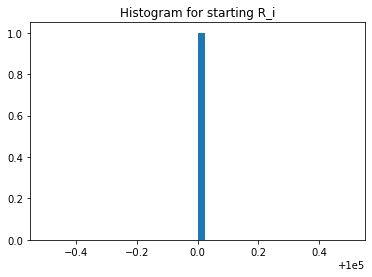

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 200015., 300001.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14999.])

In [25]:
experiments.UNI_Qj.unique()

array([200000.])

In [26]:
experiments.UNI_Rj.unique()

array([100000.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

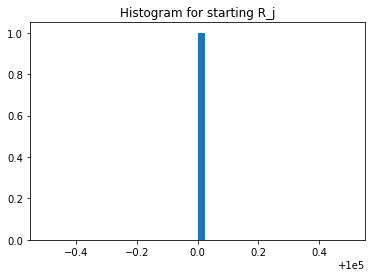

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000., 107018., 108033., ...,  93481., 101151.,  92416.])

In [31]:
experiments.UNI_ji.unique()

array([100000.,  93738.,  92860., ..., 106639., 103969., 108571.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


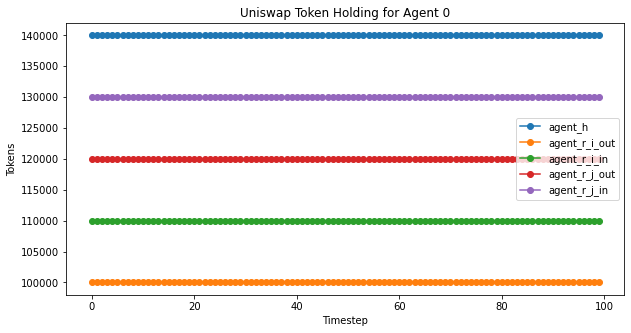

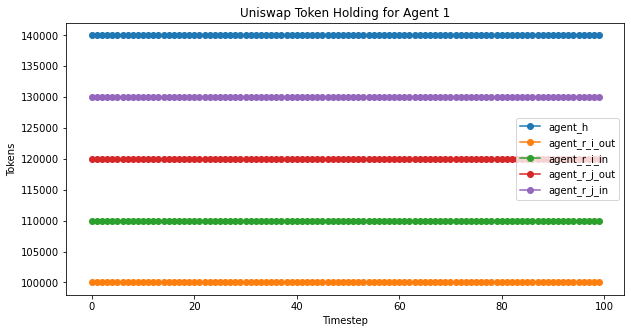

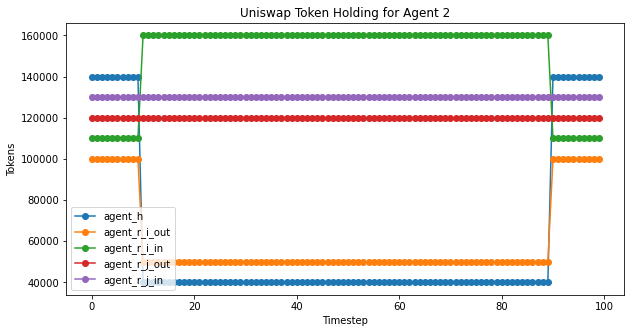

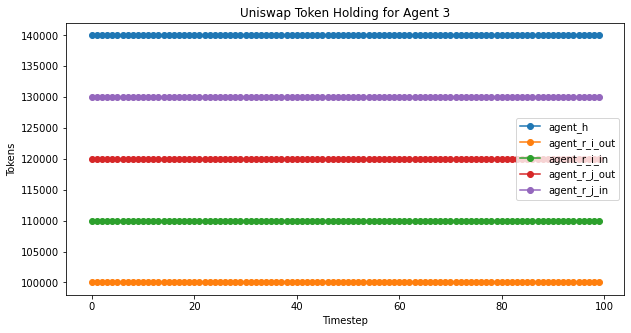

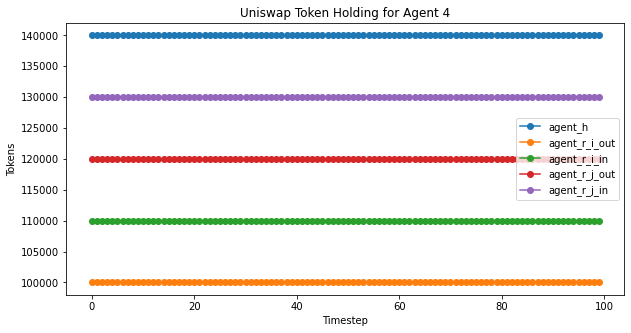

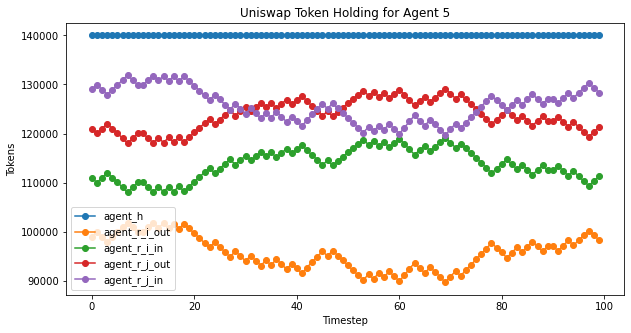

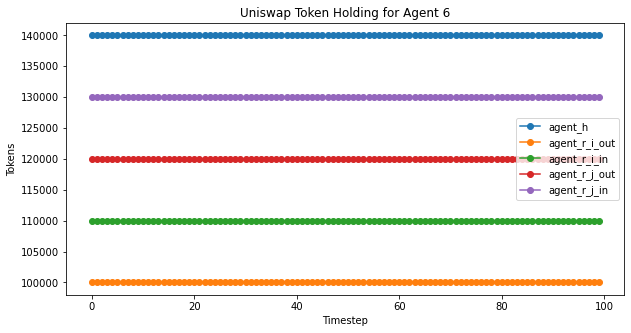

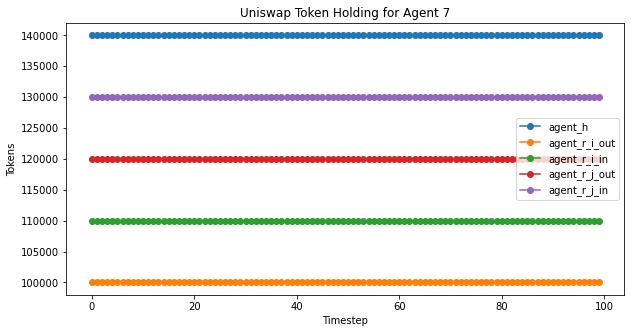

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


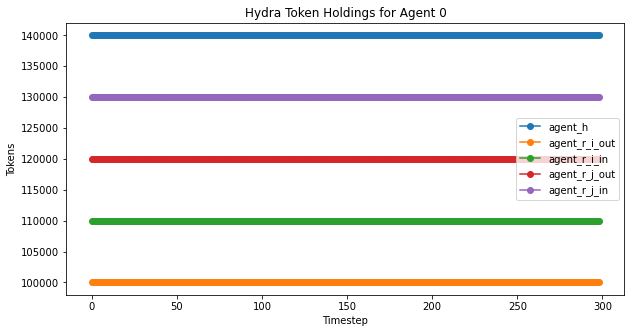

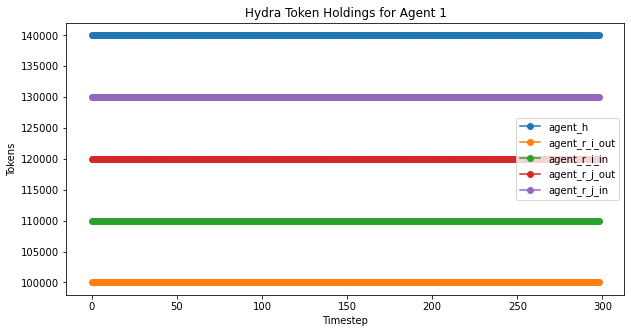

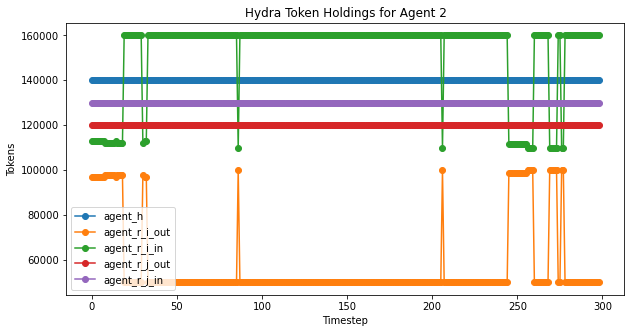

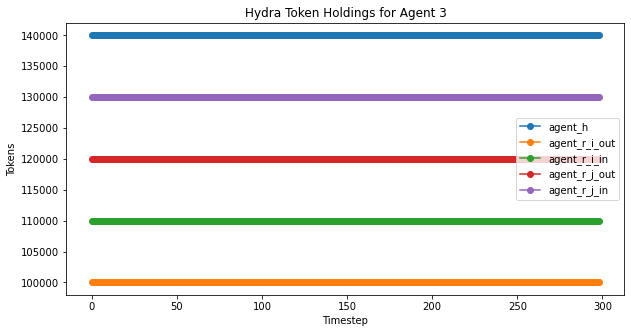

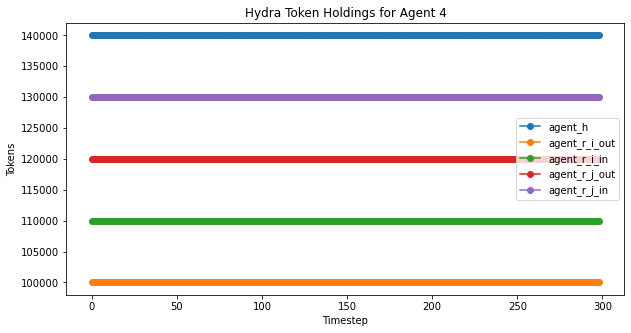

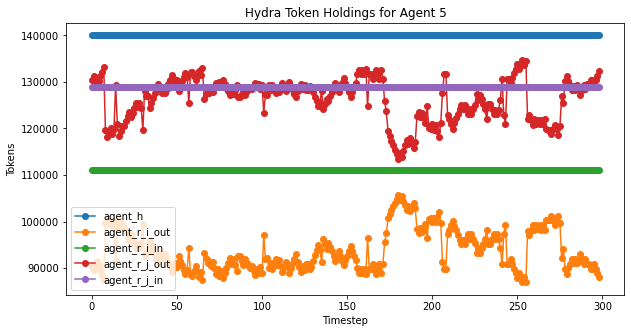

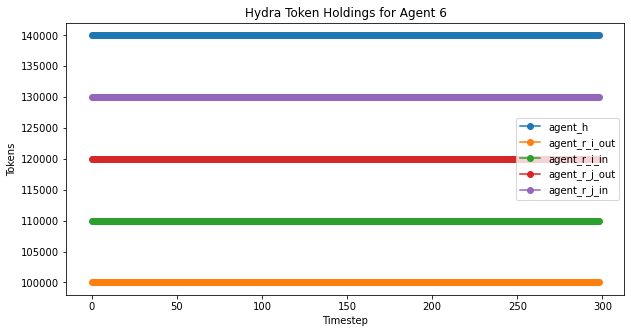

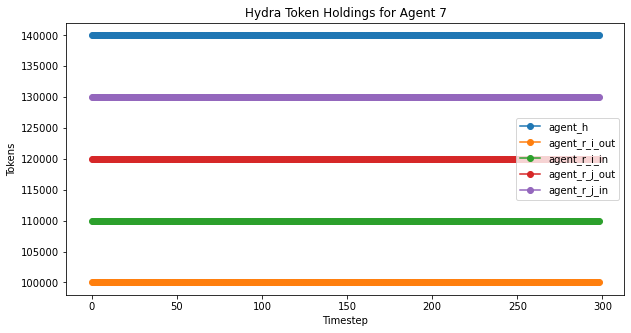

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

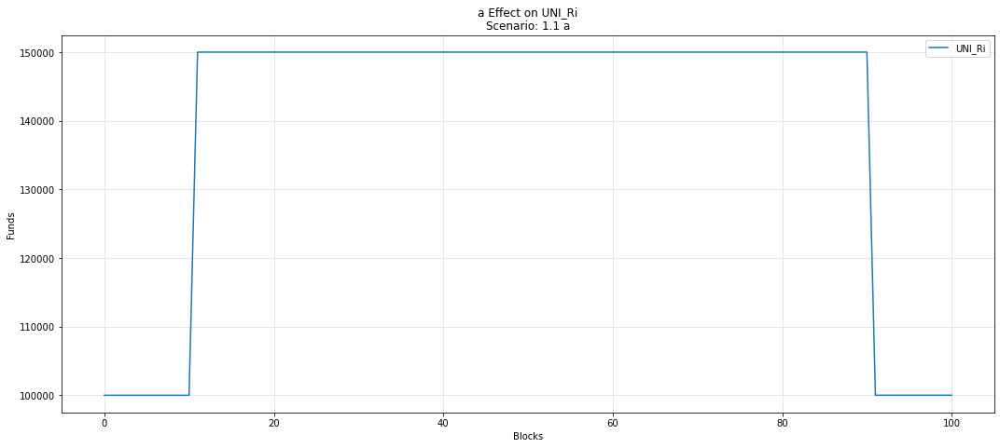

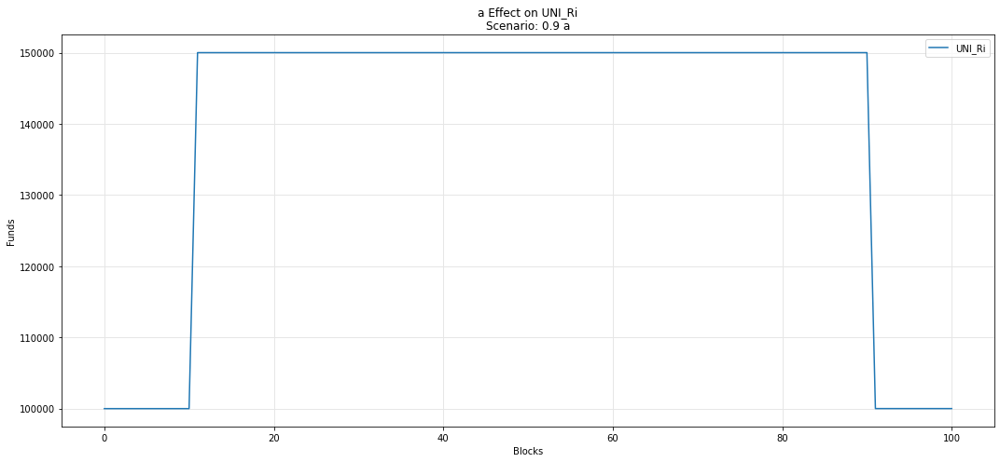

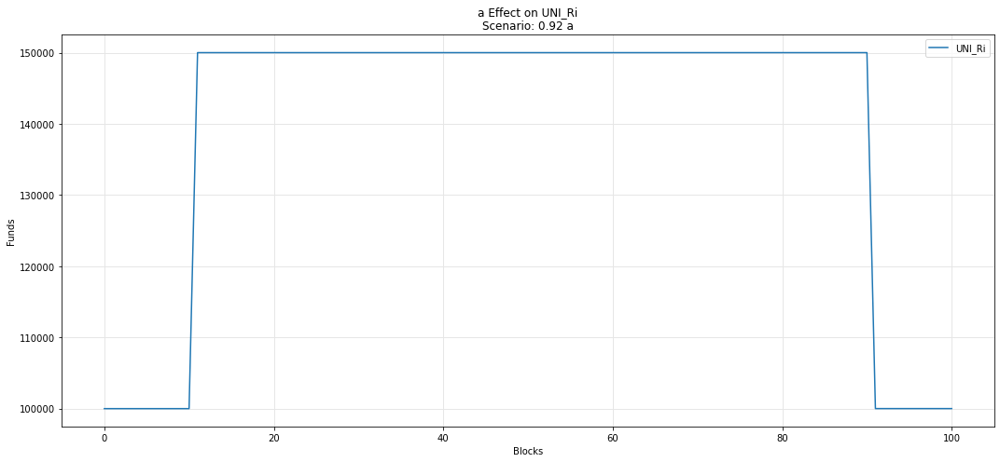

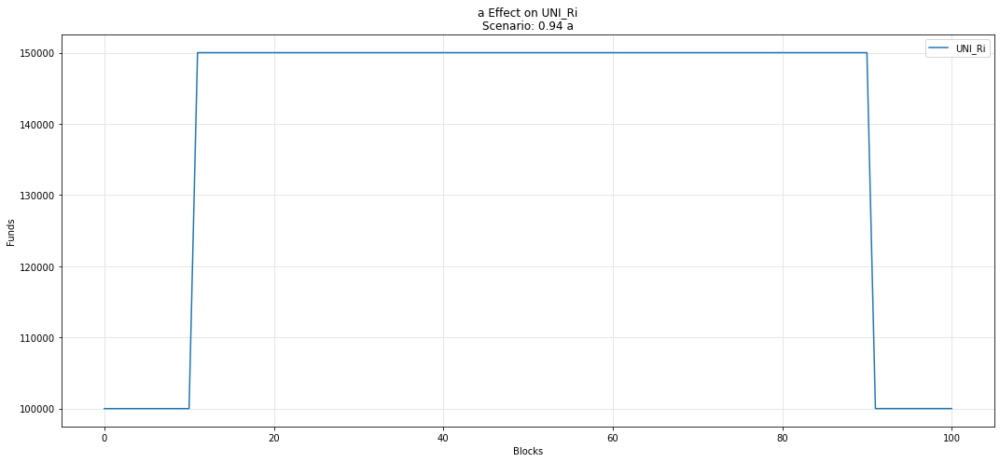

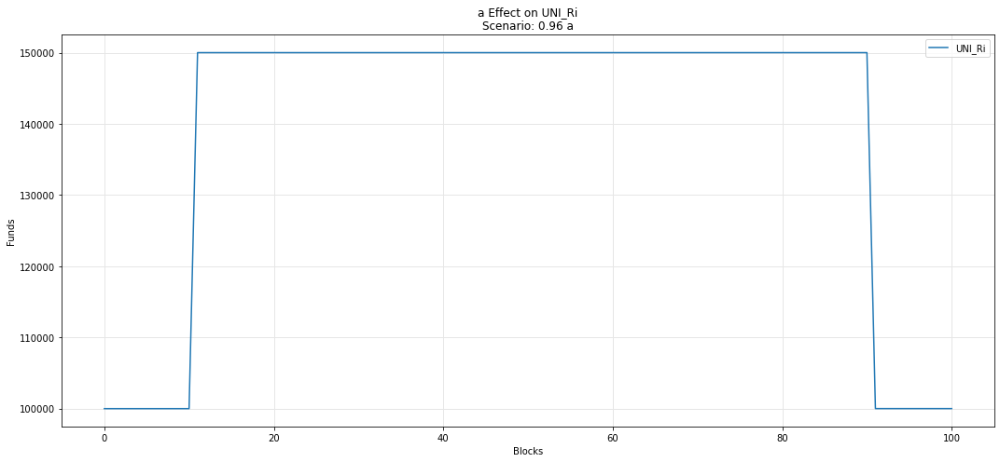

...

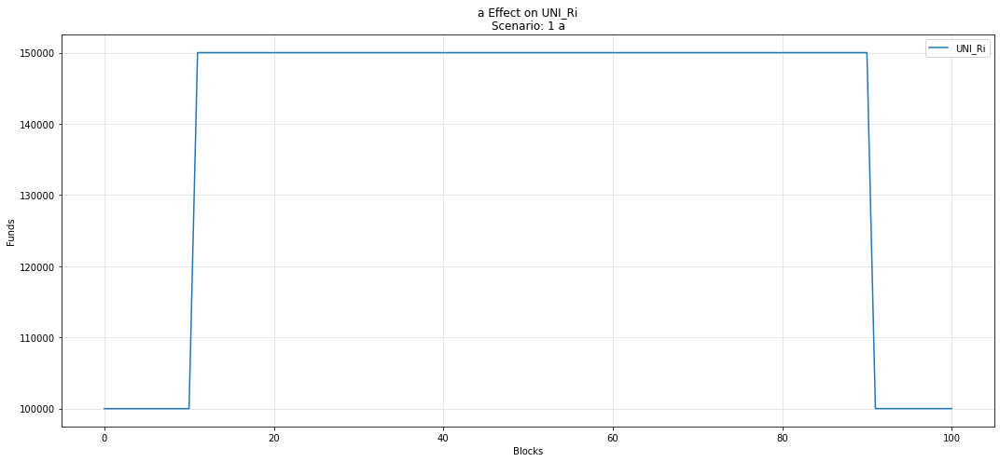

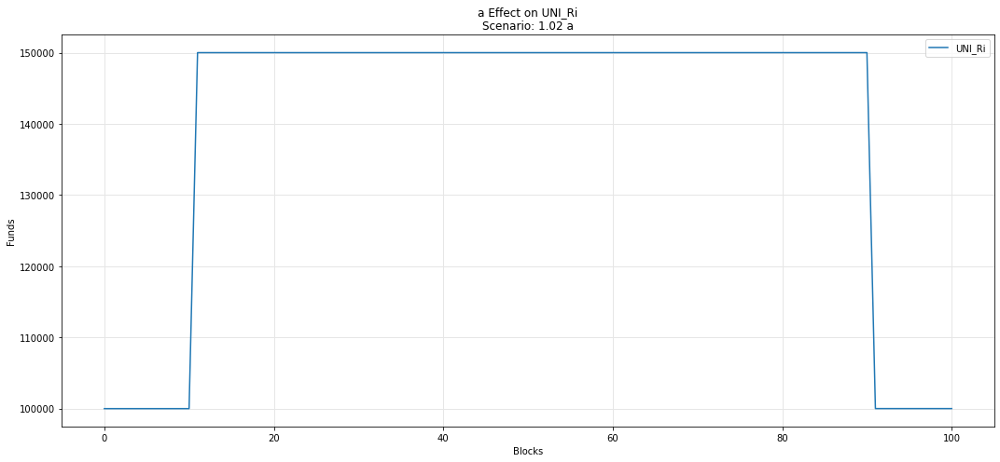

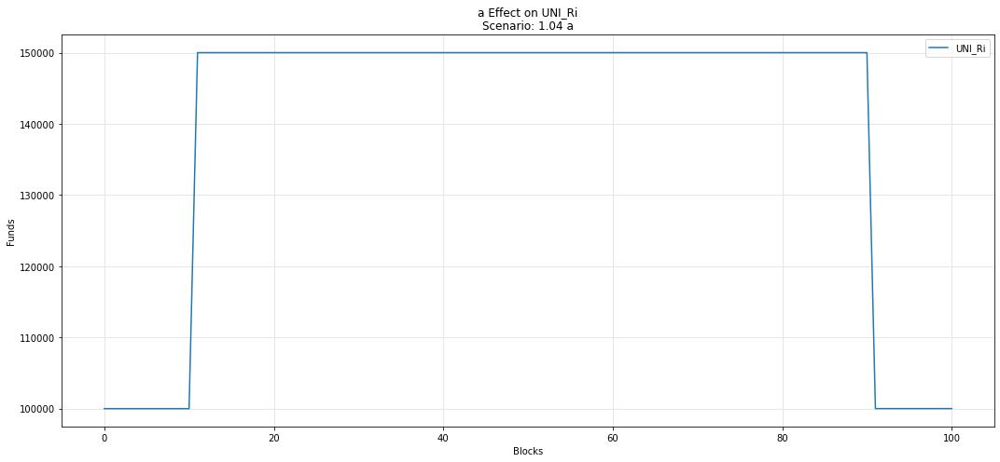

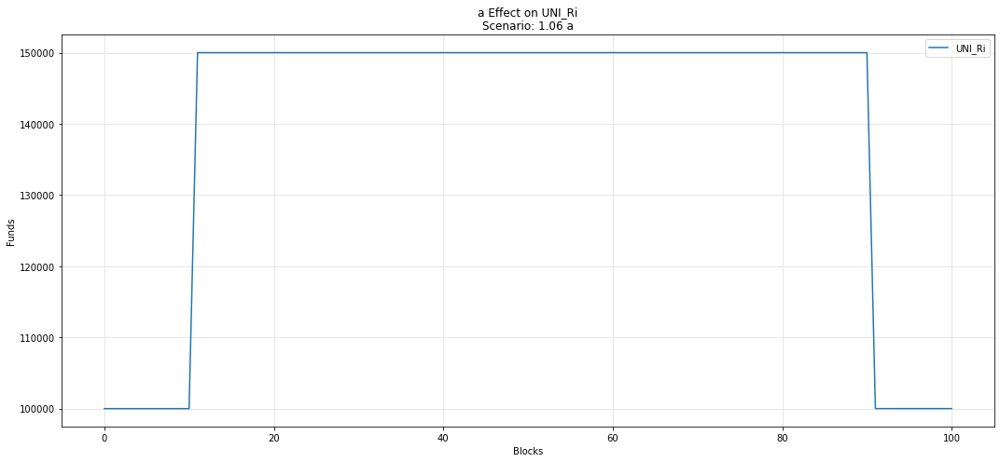

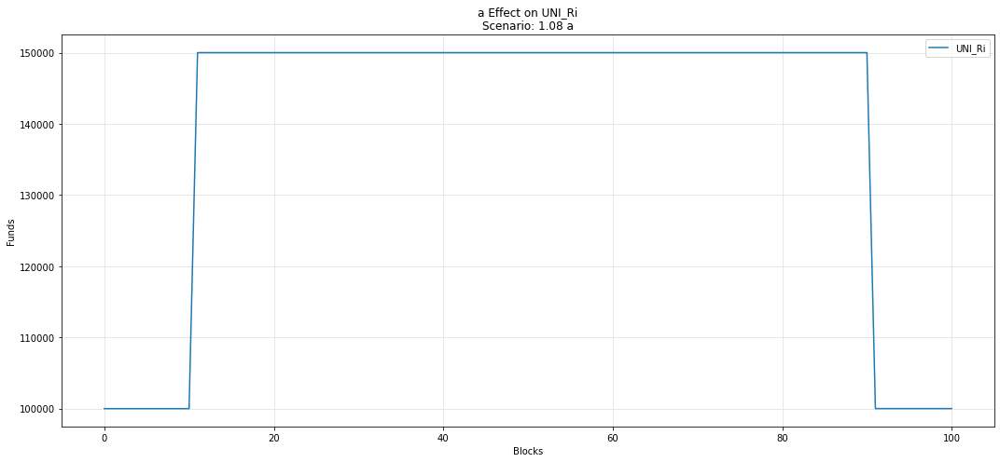

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

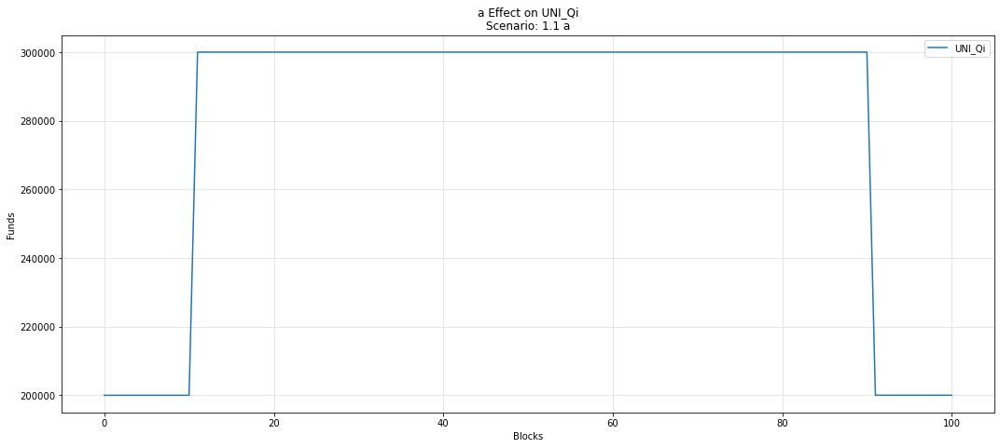

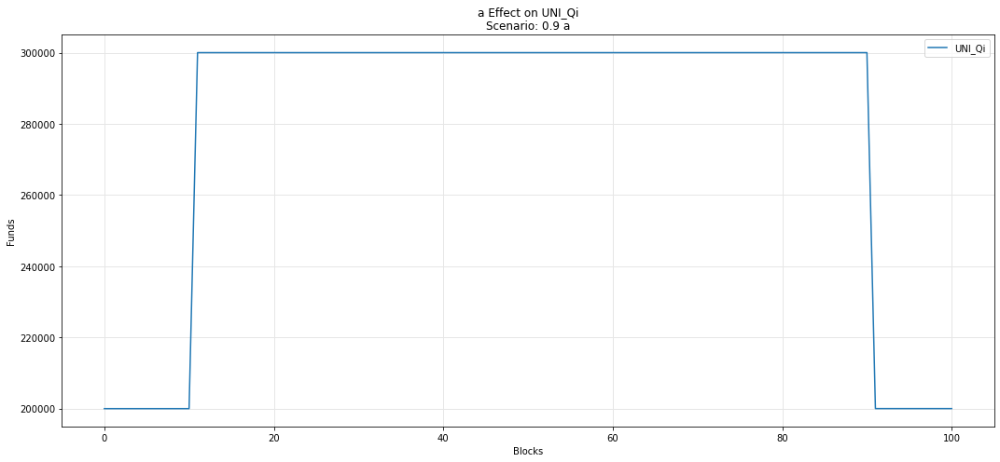

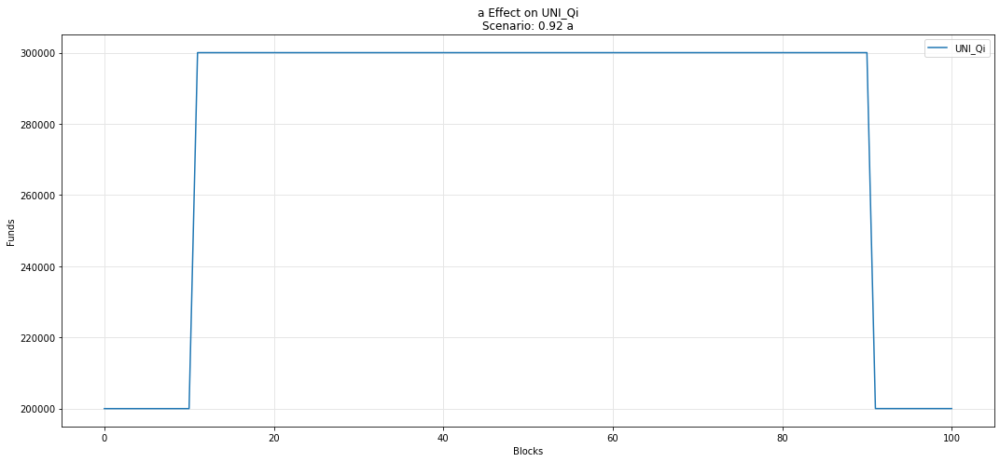

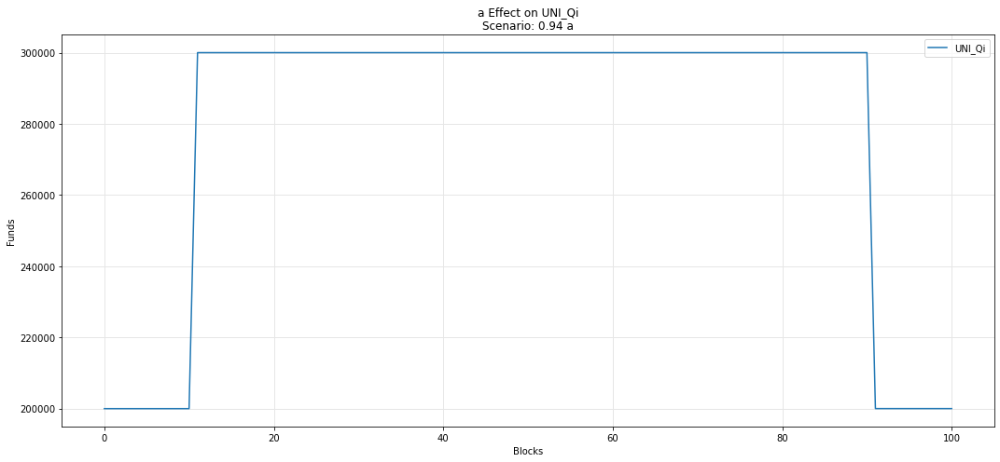

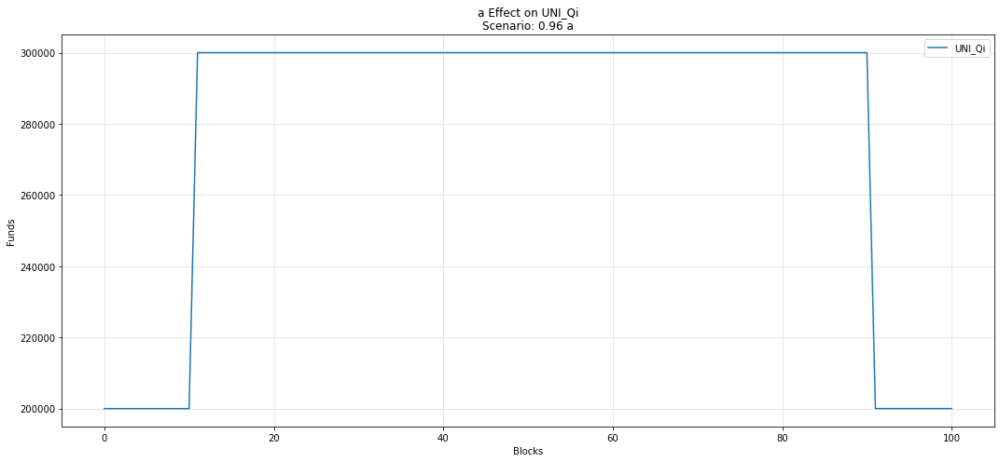

...

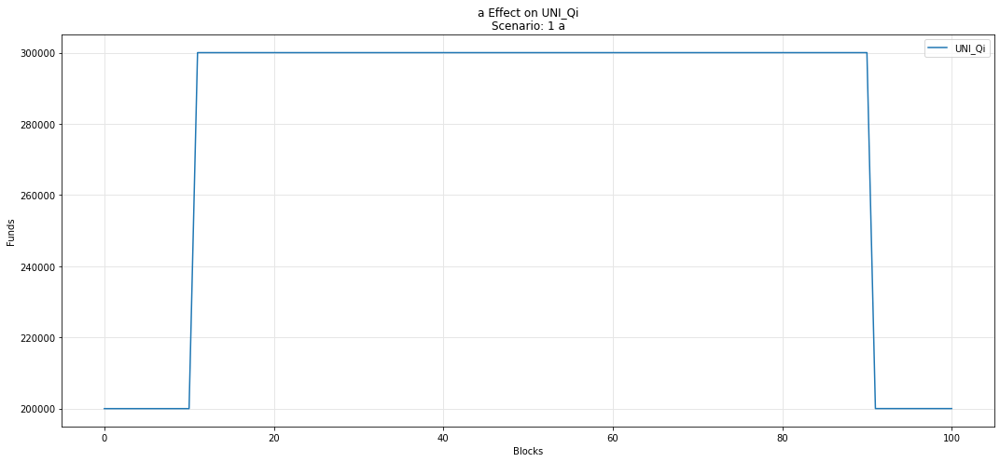

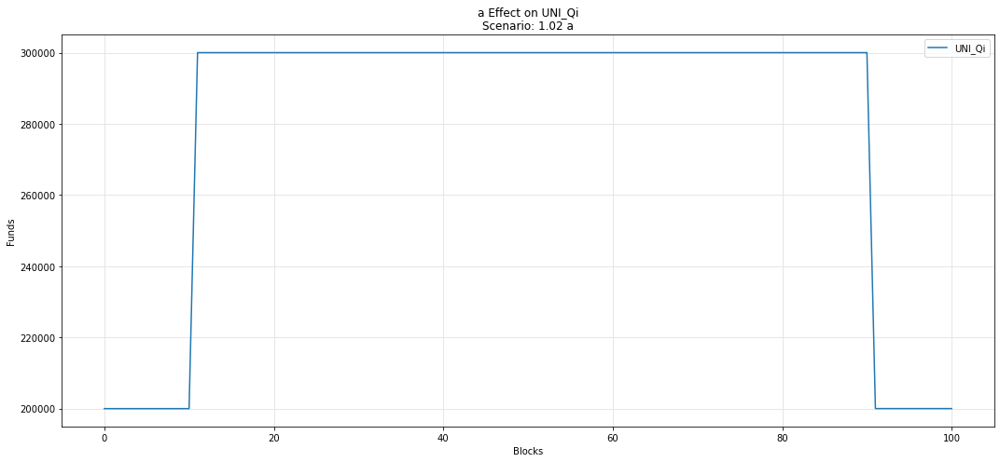

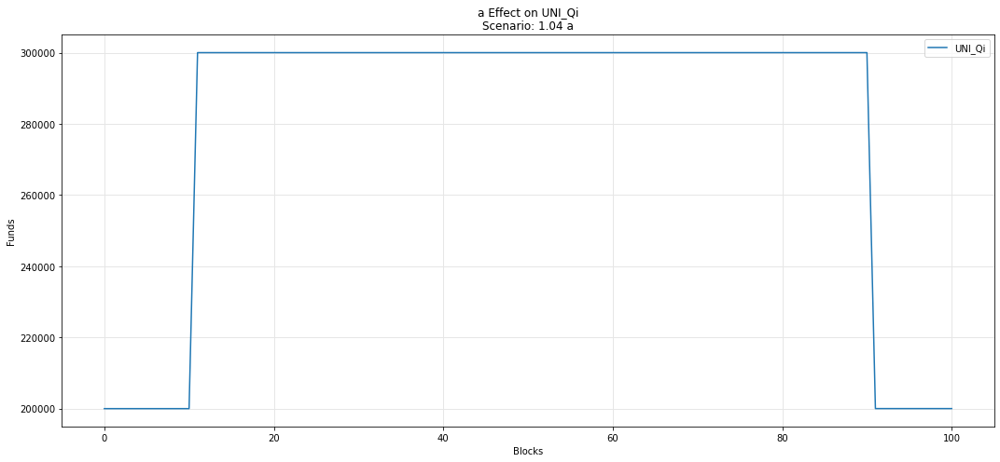

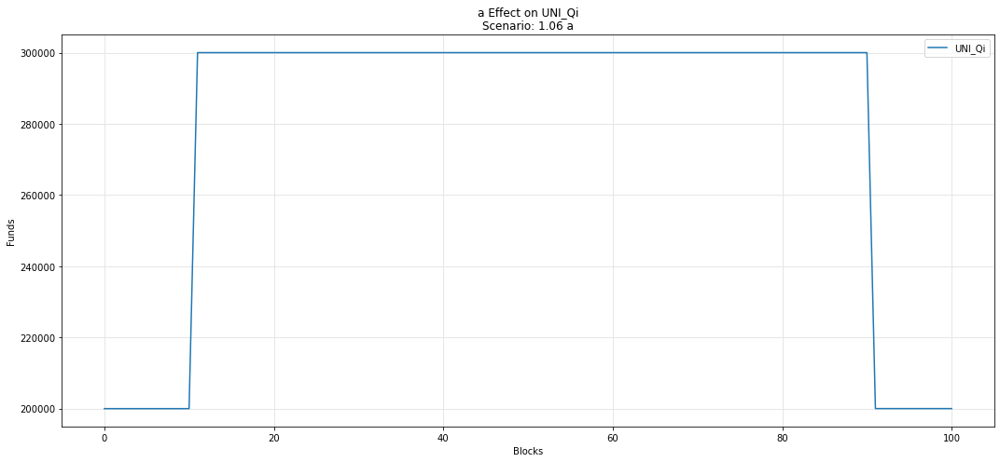

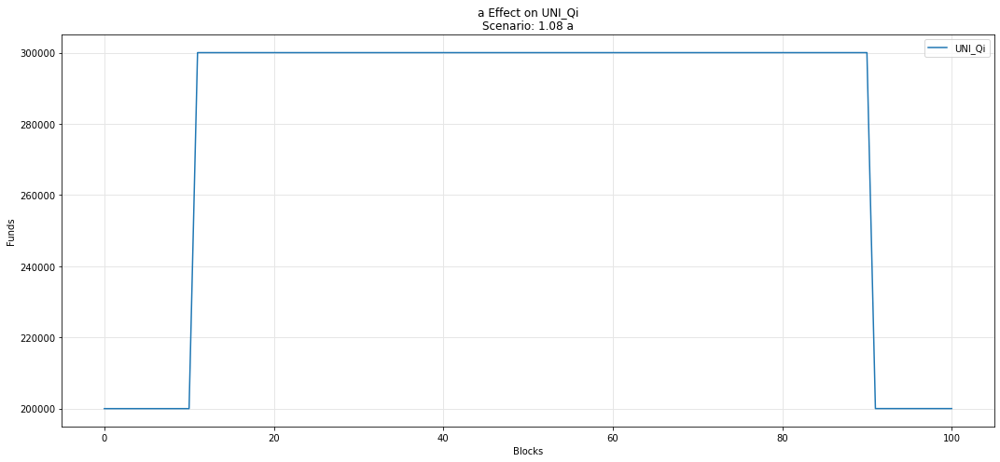

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

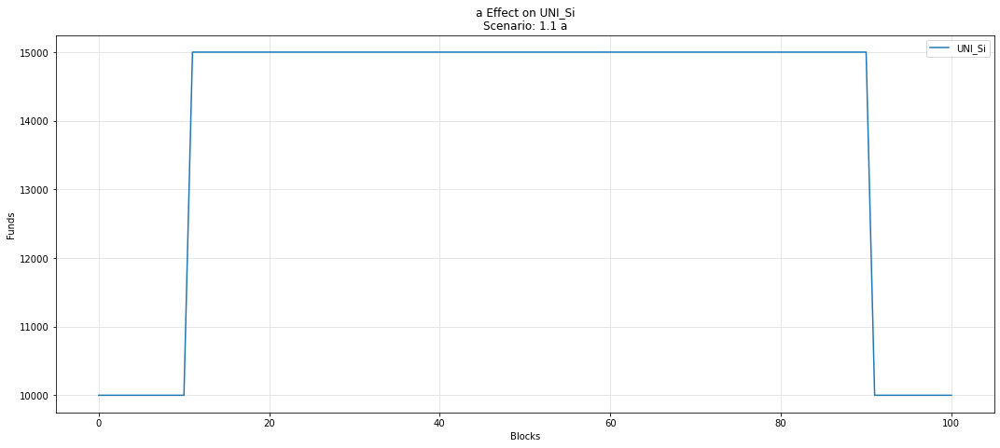

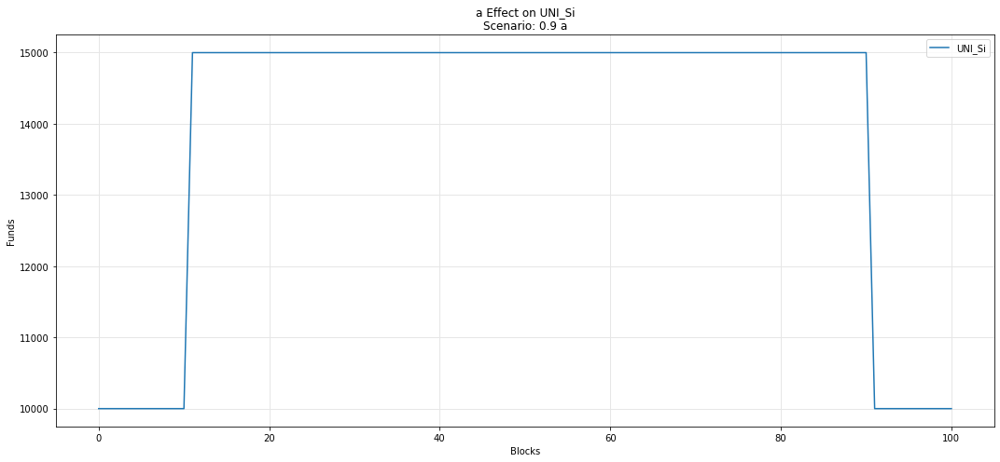

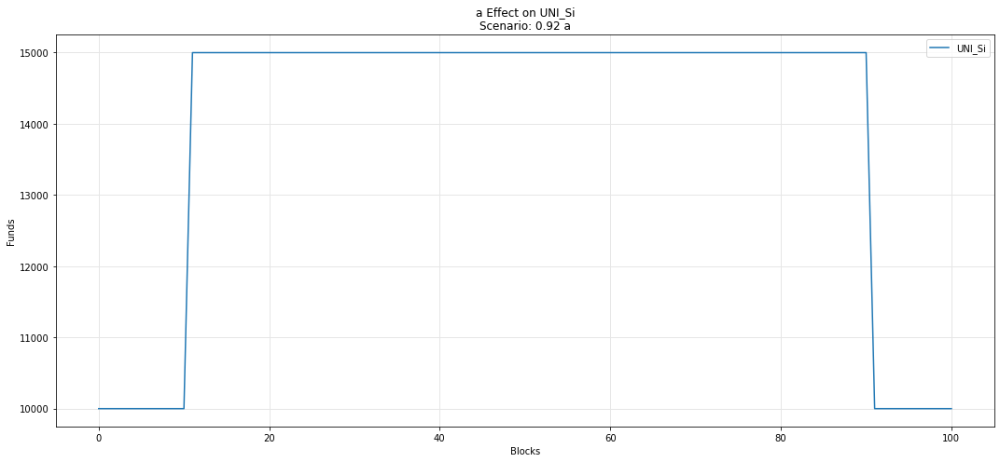

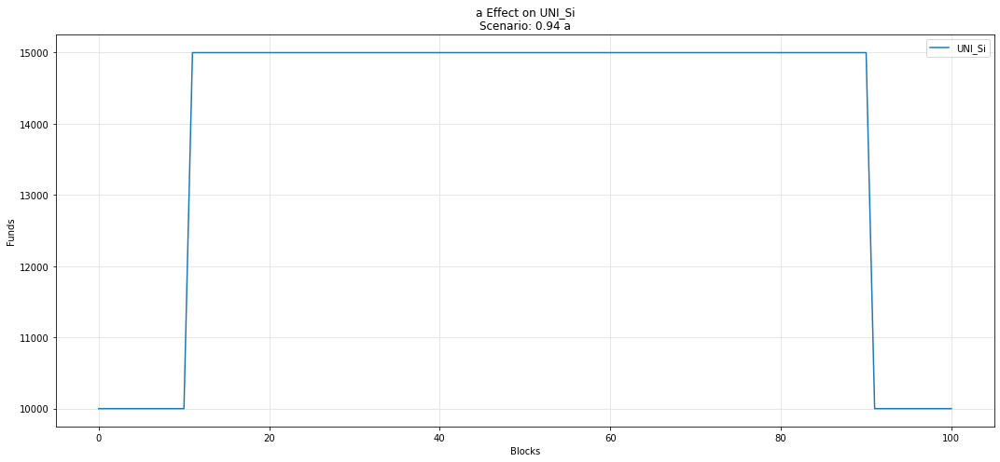

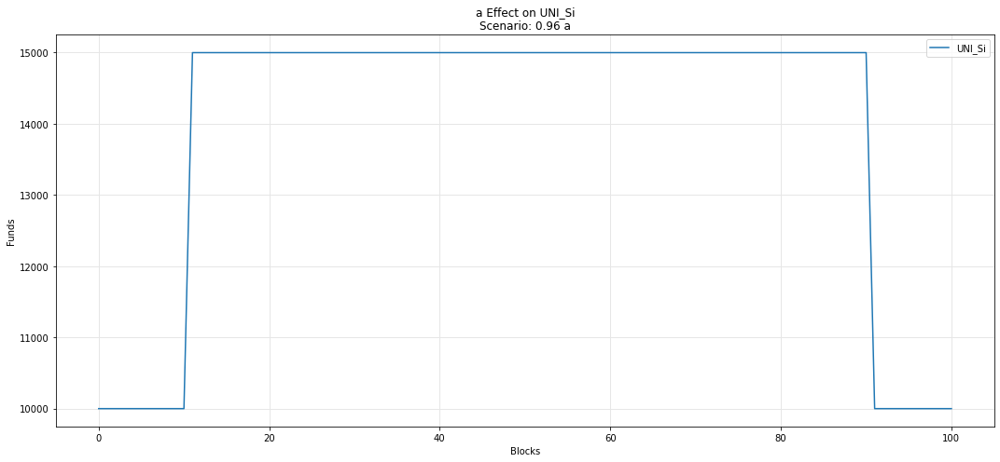

...

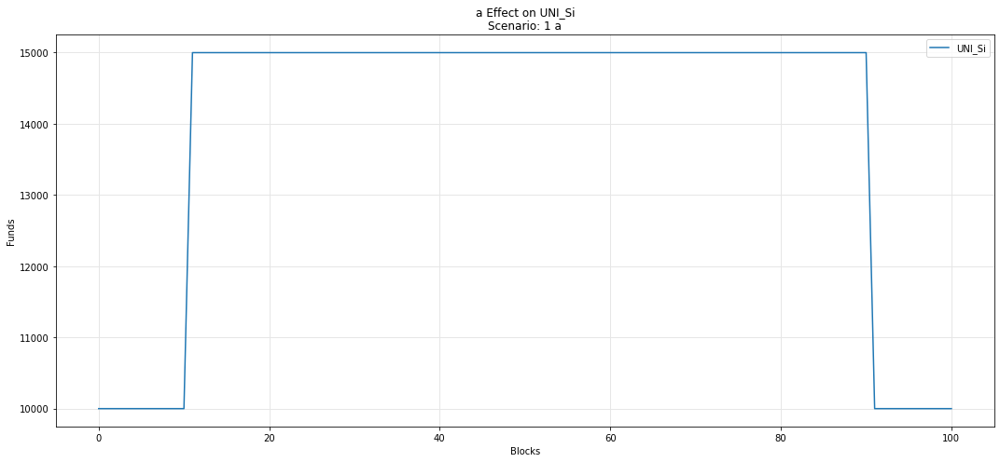

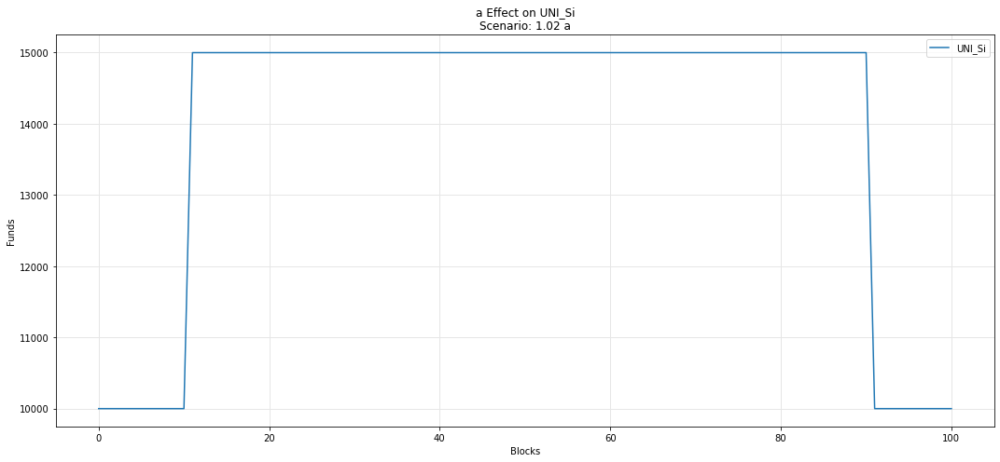

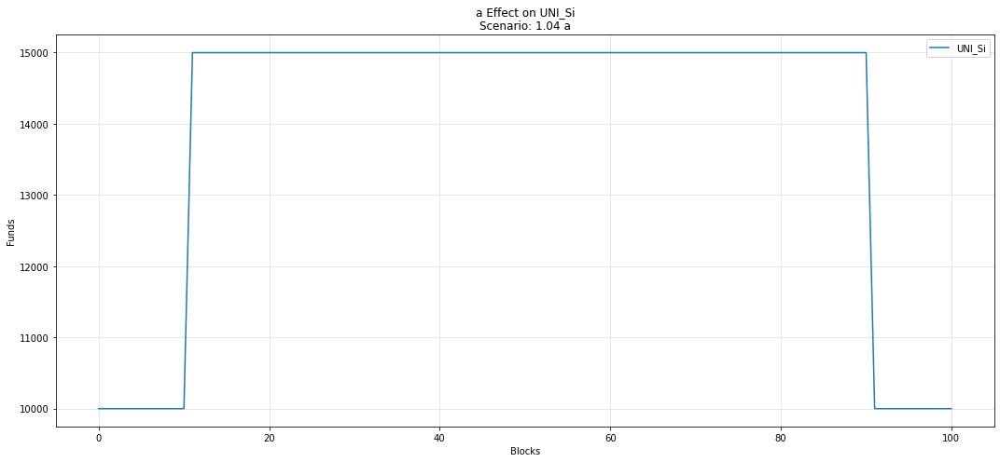

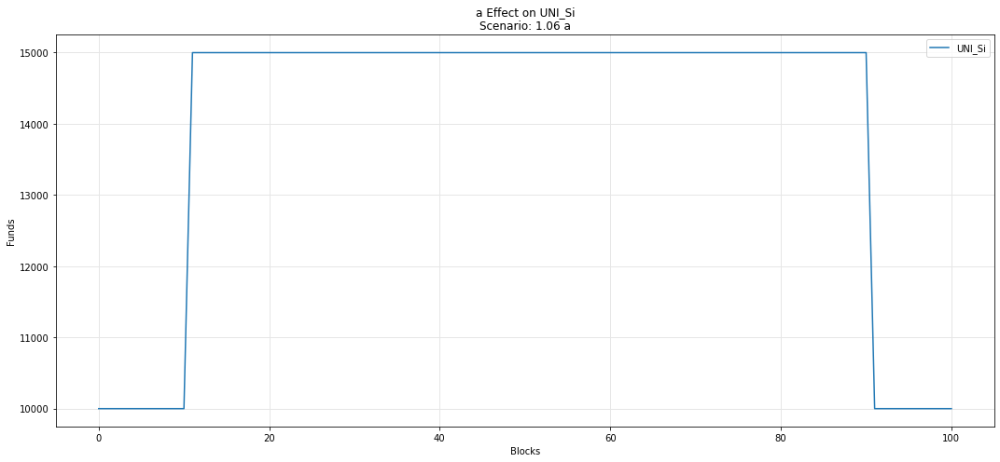

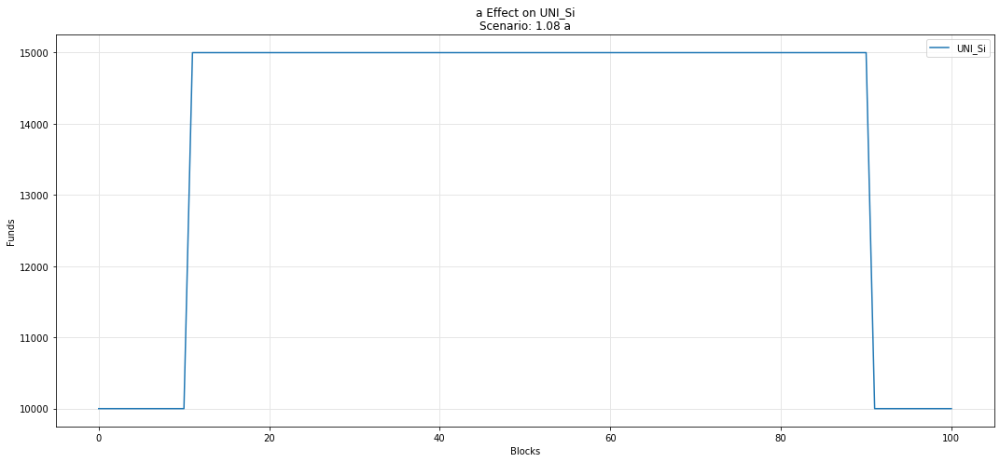

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

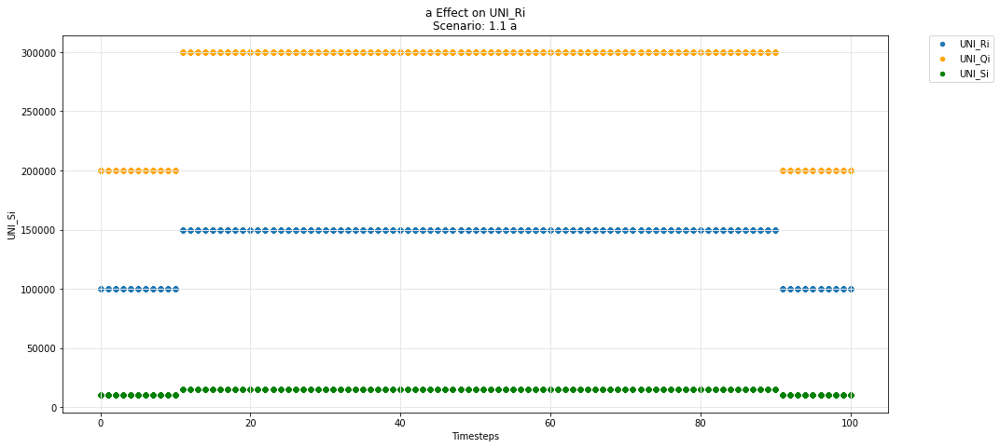

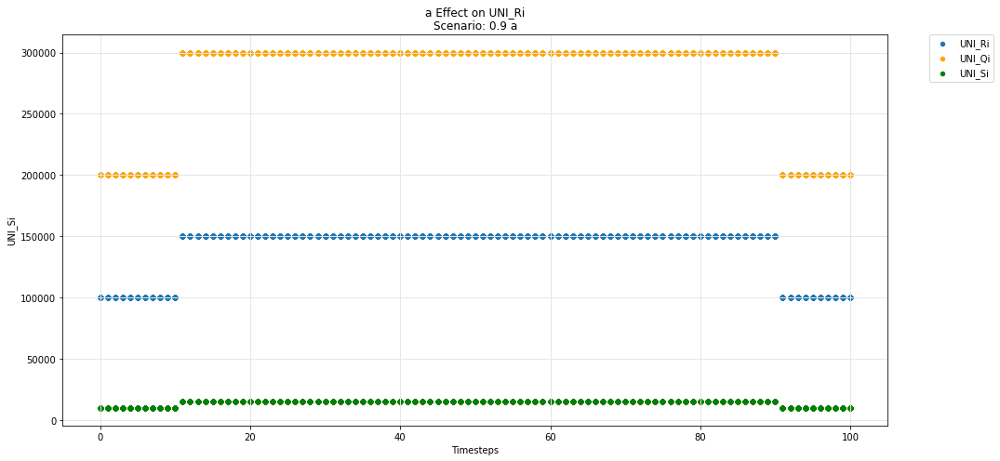

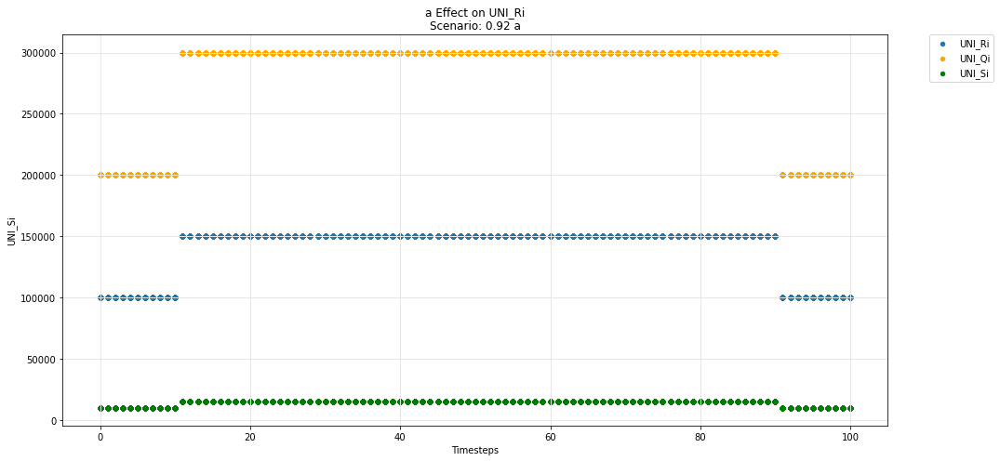

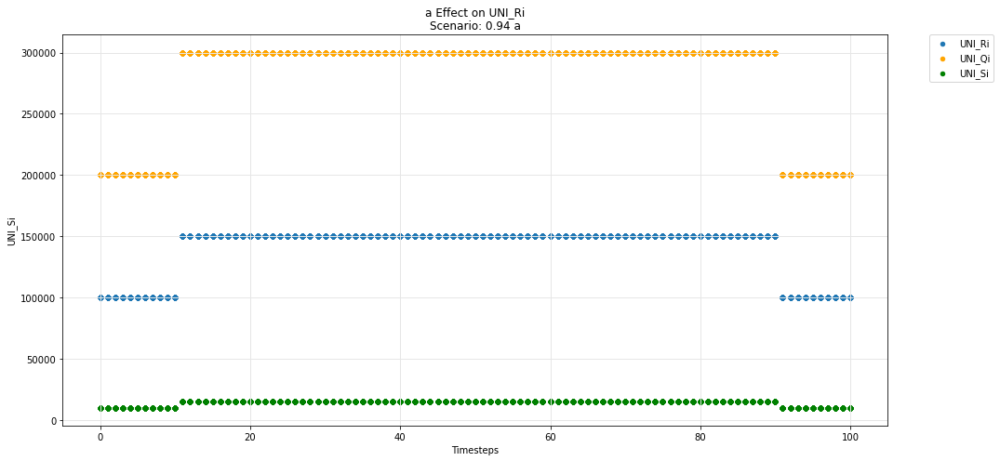

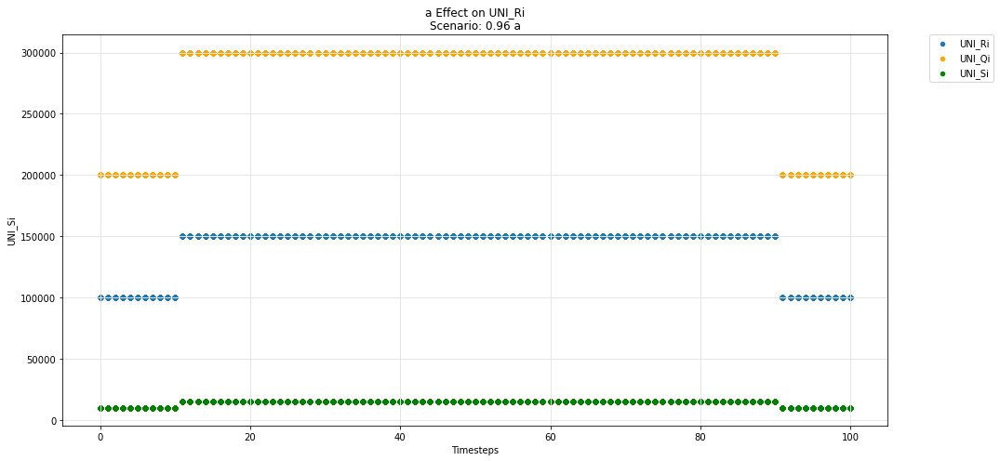

...

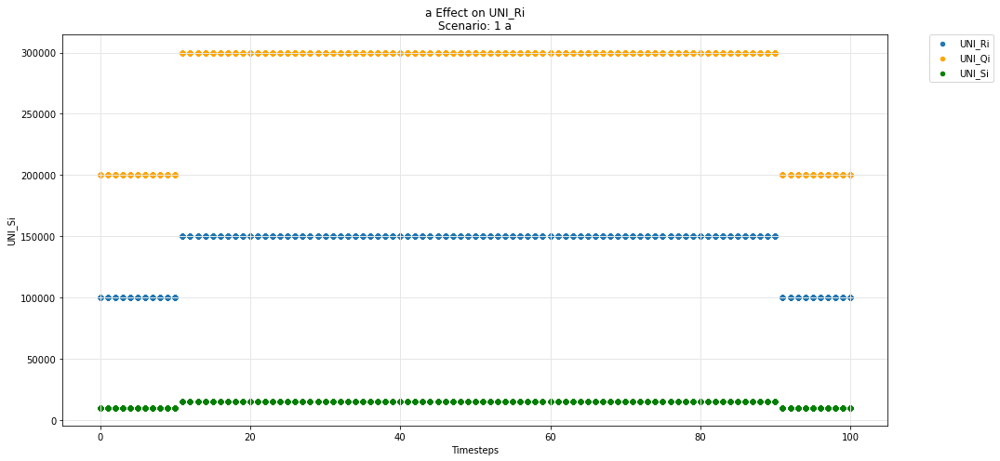

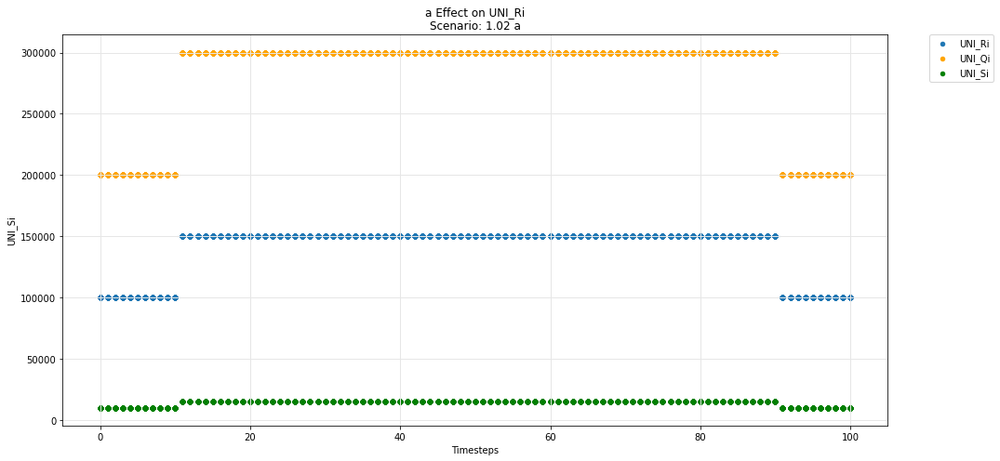

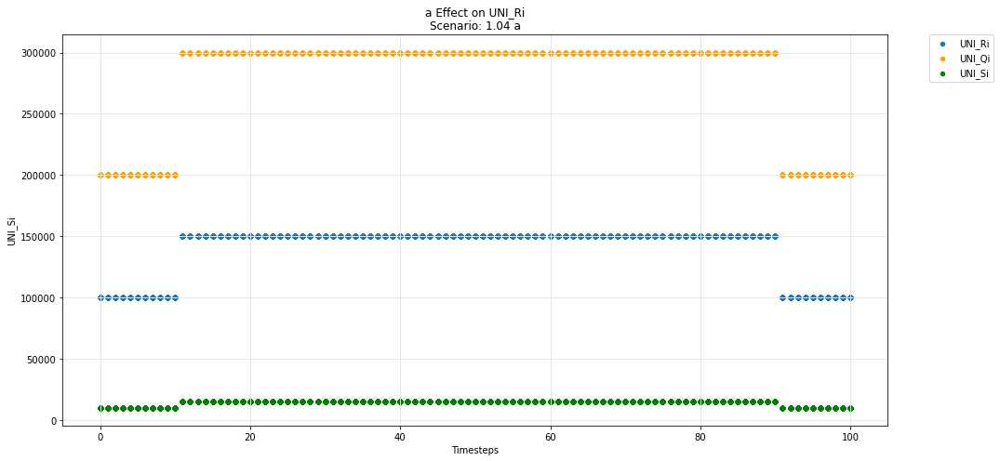

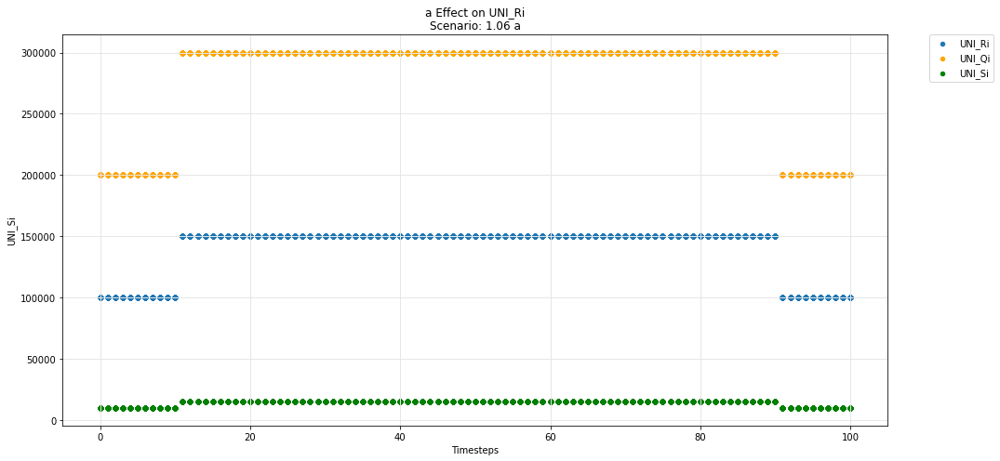

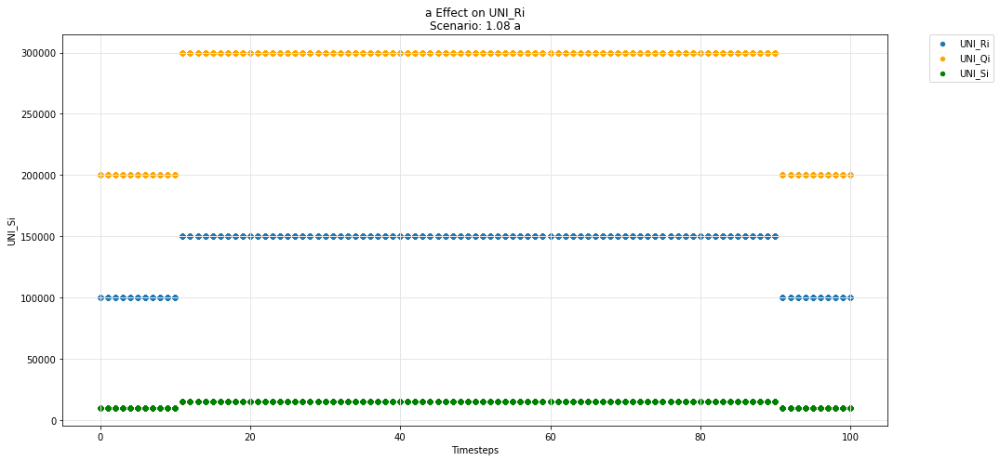

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

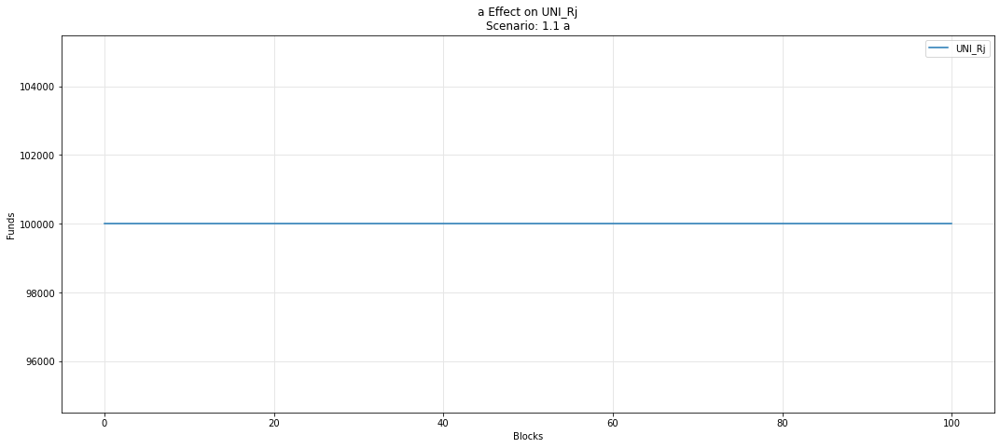

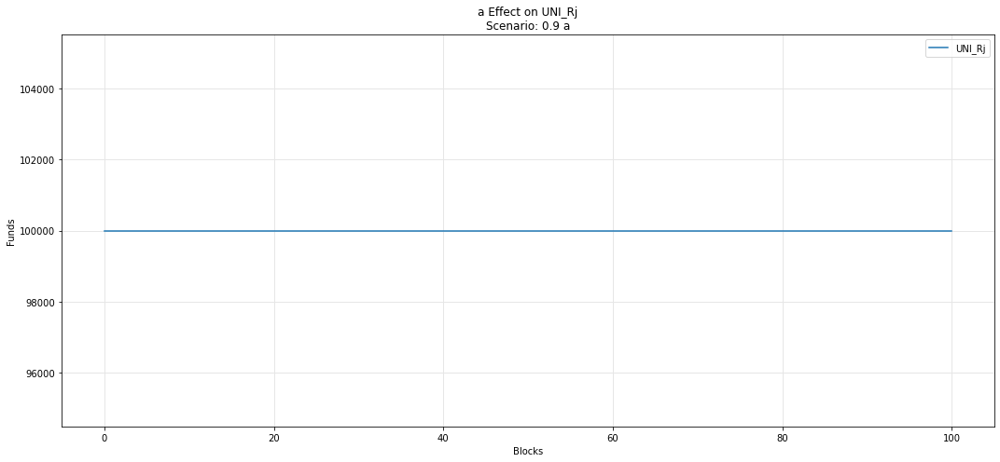

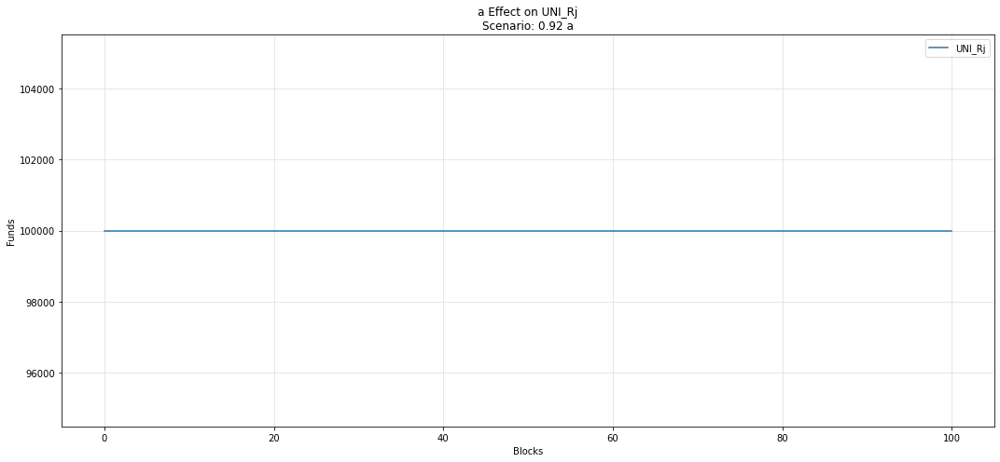

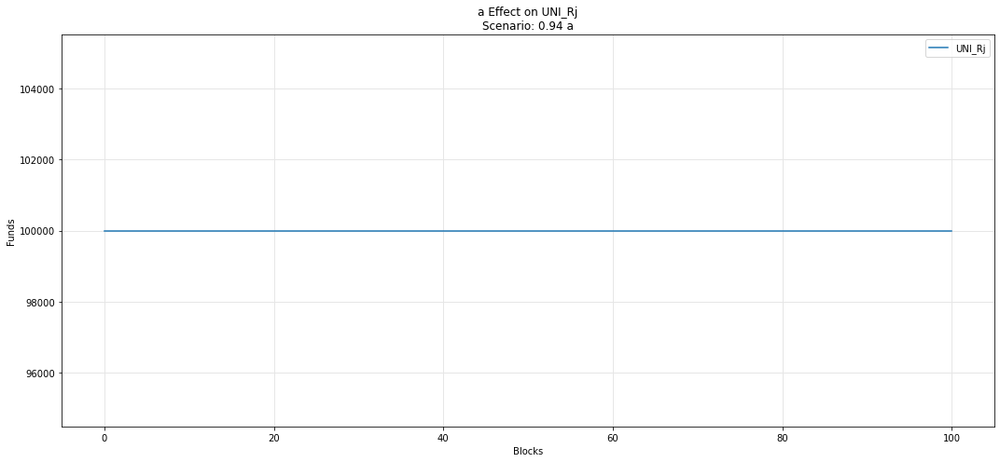

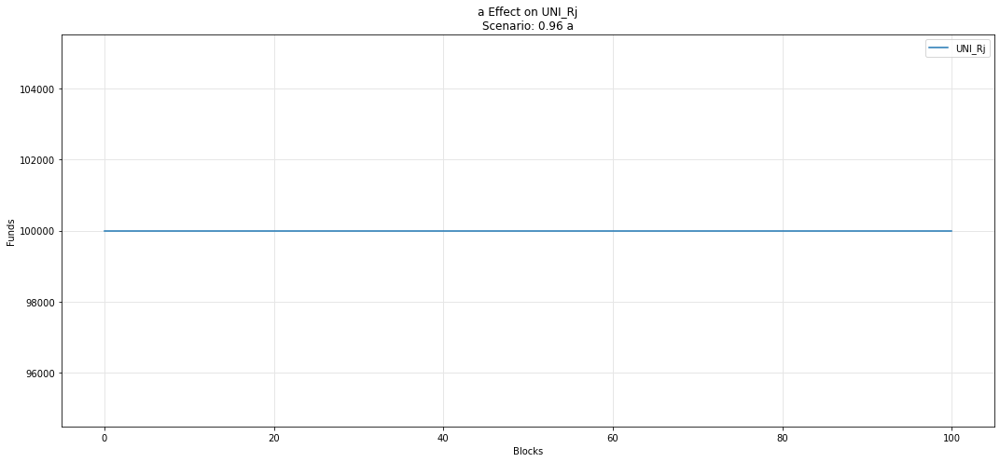

...

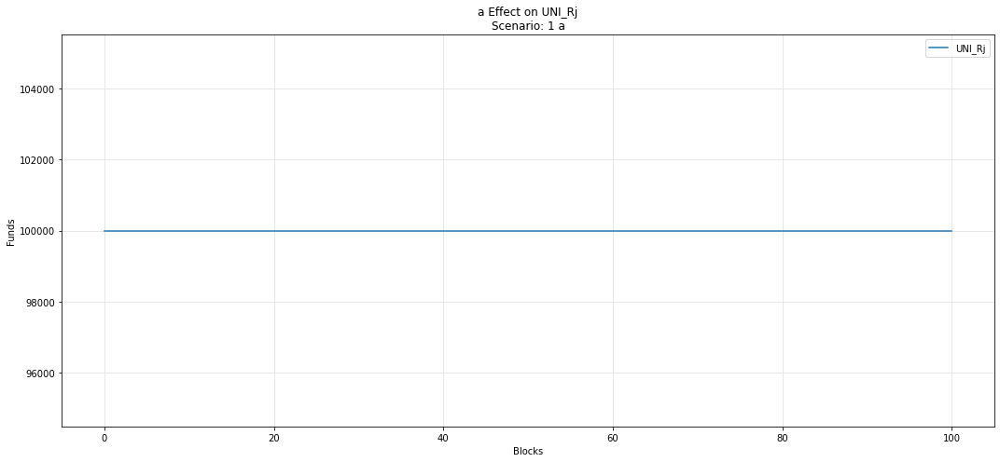

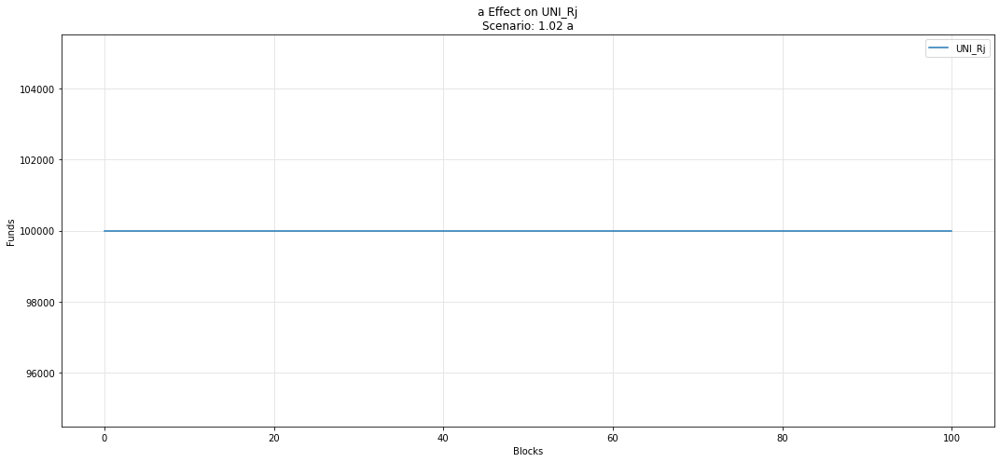

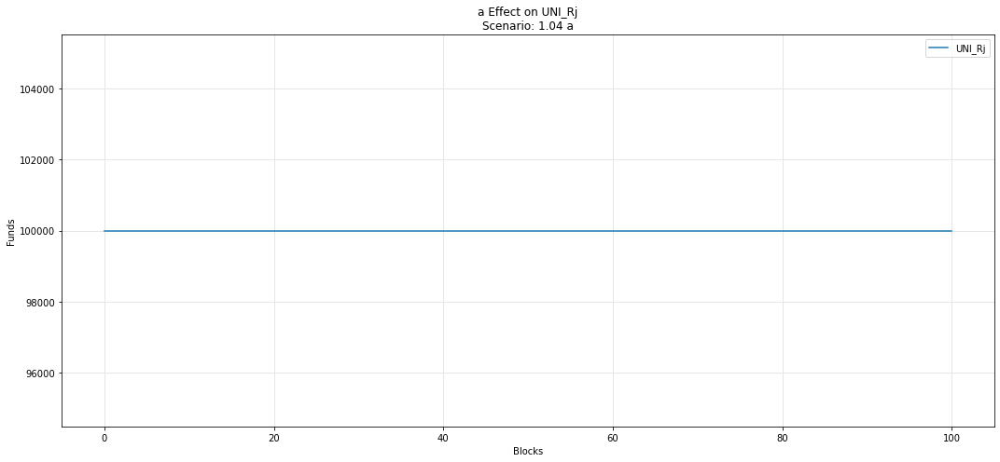

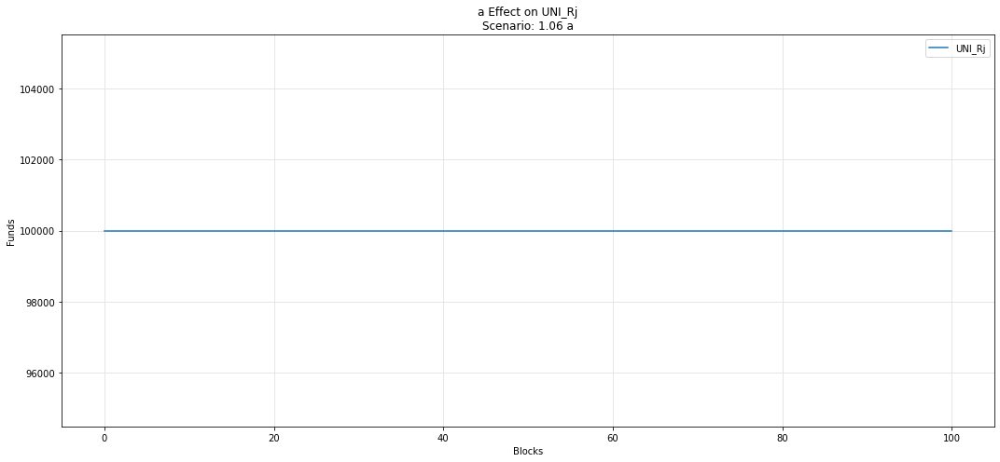

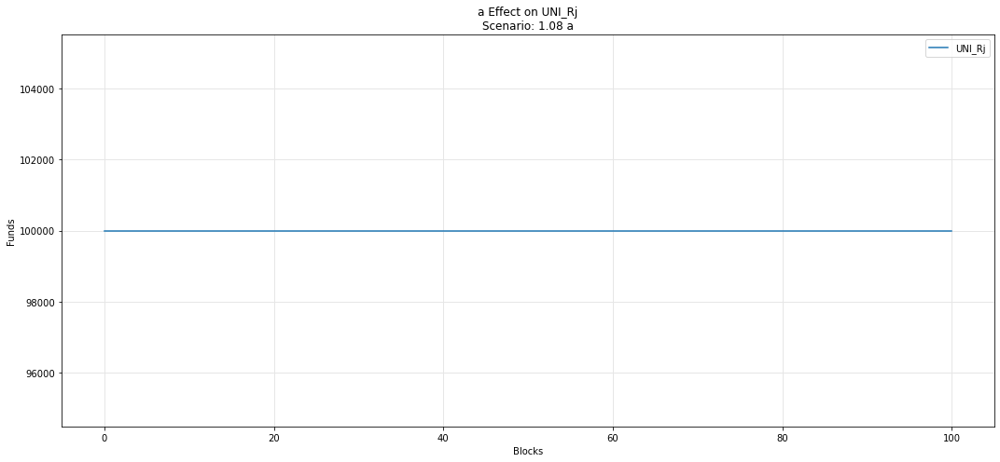

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

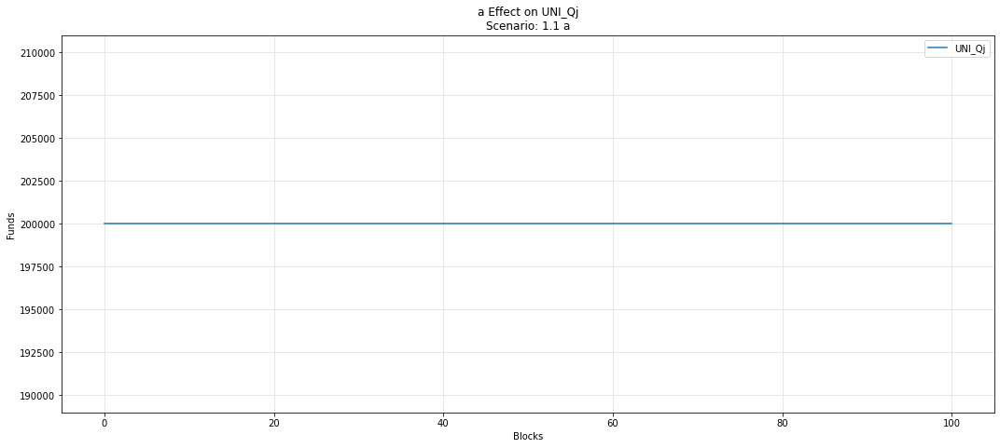

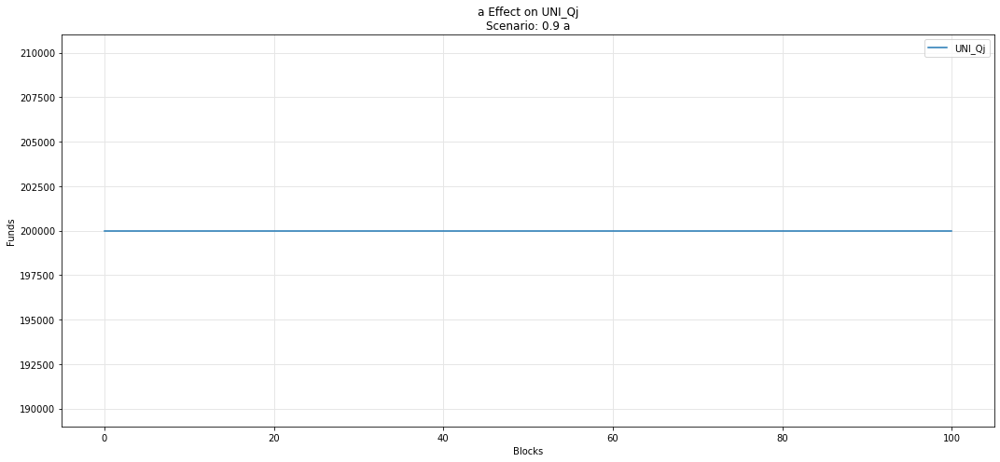

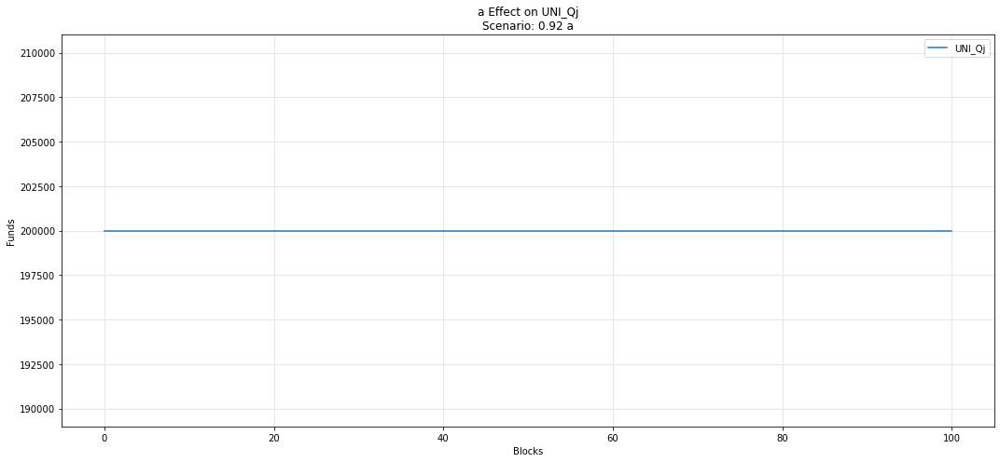

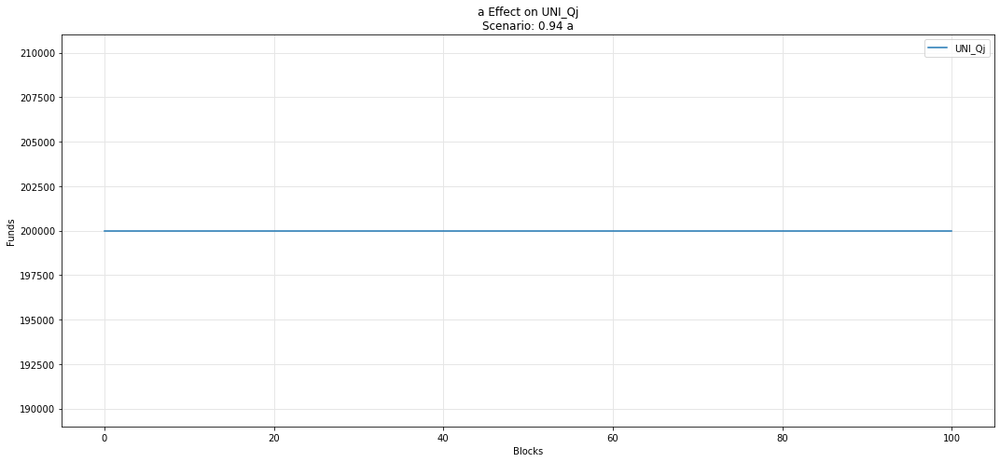

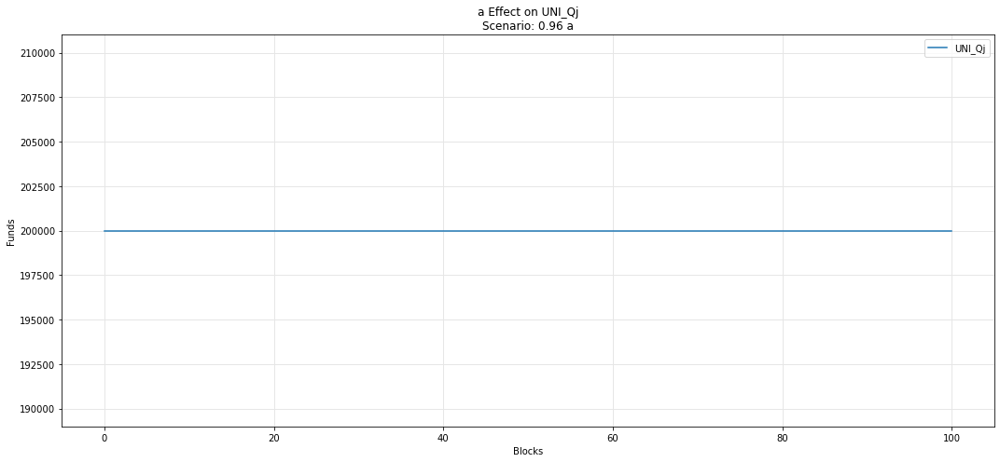

...

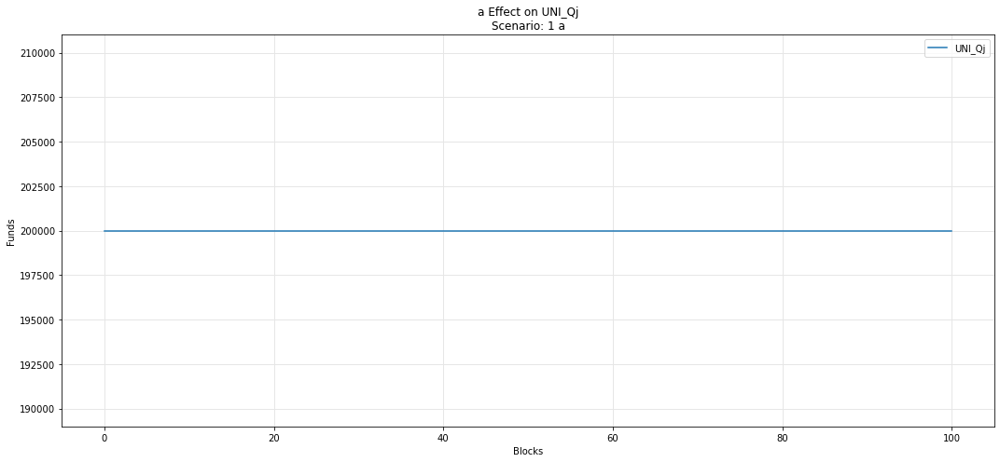

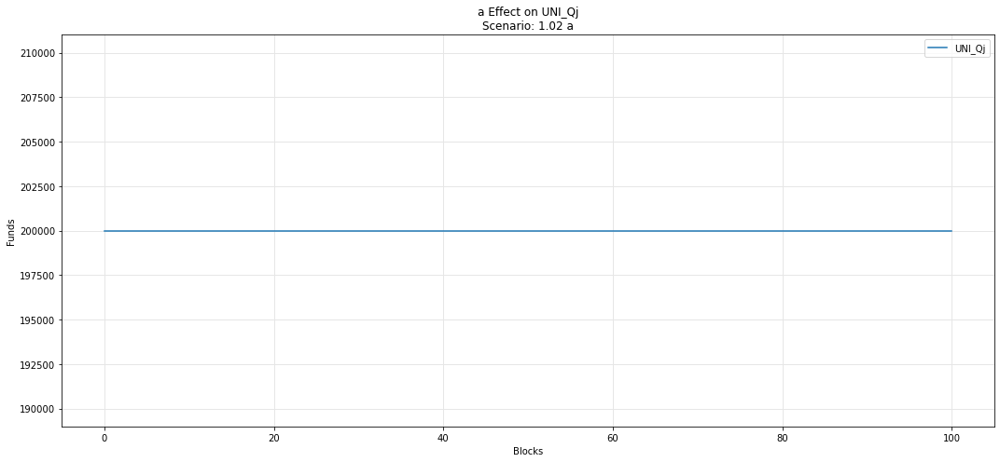

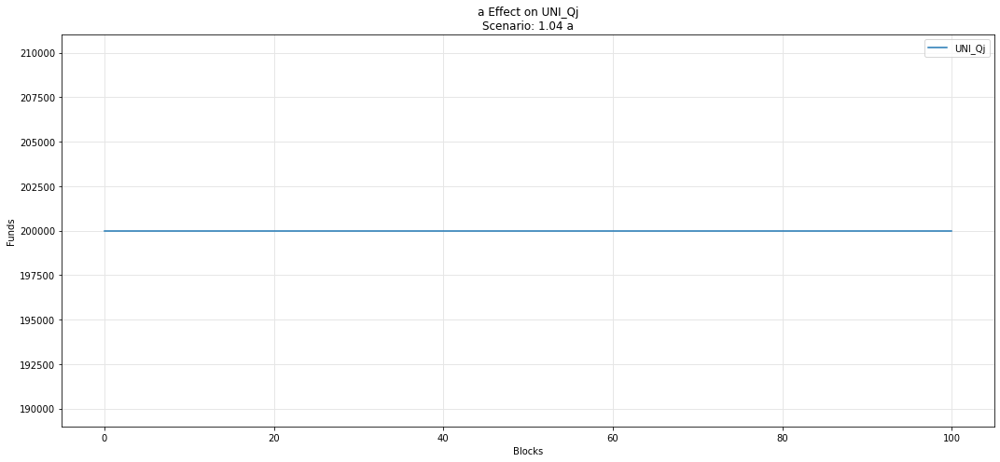

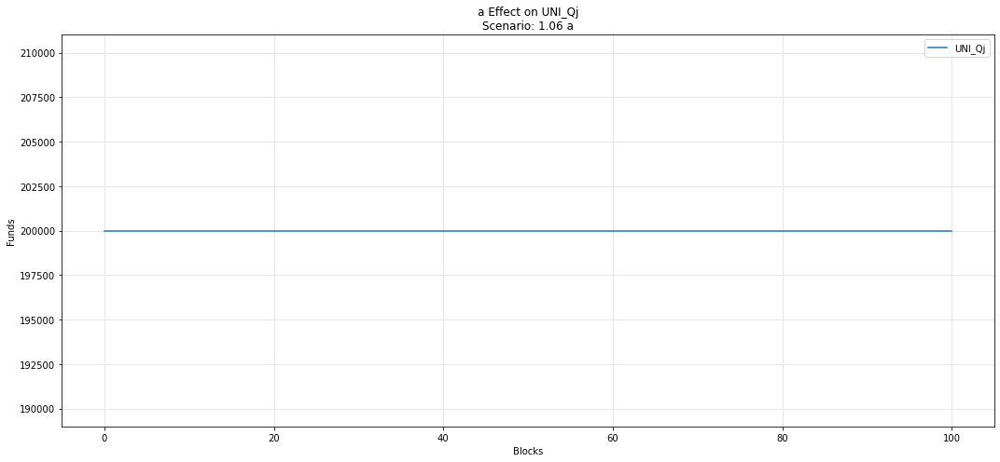

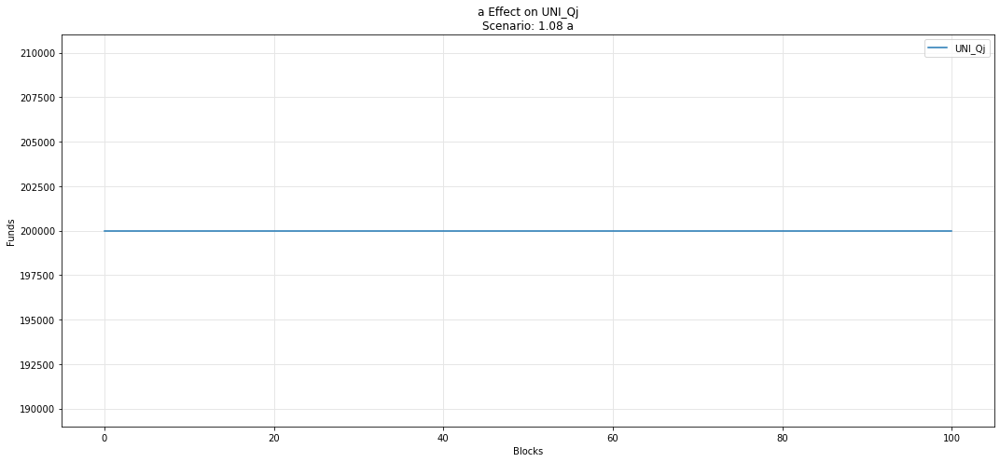

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

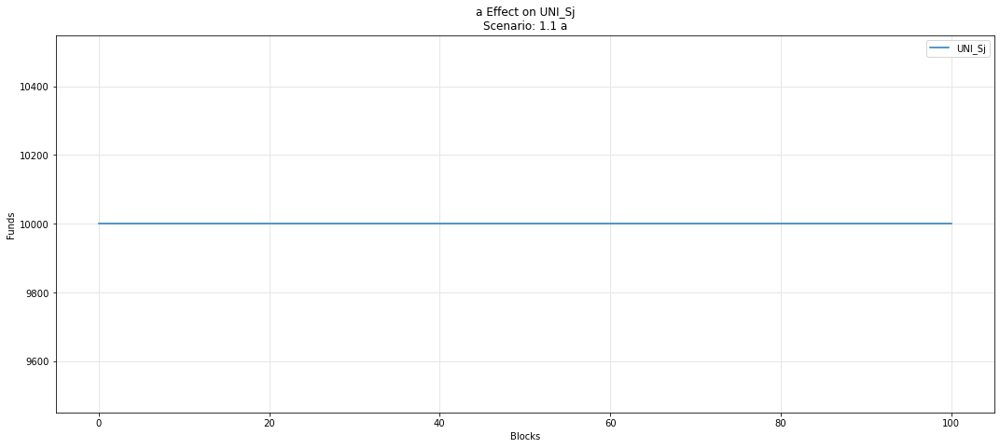

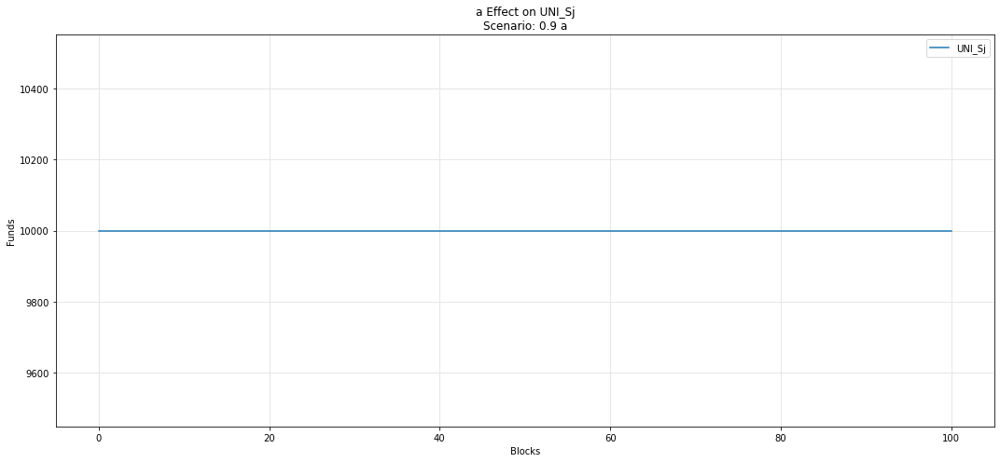

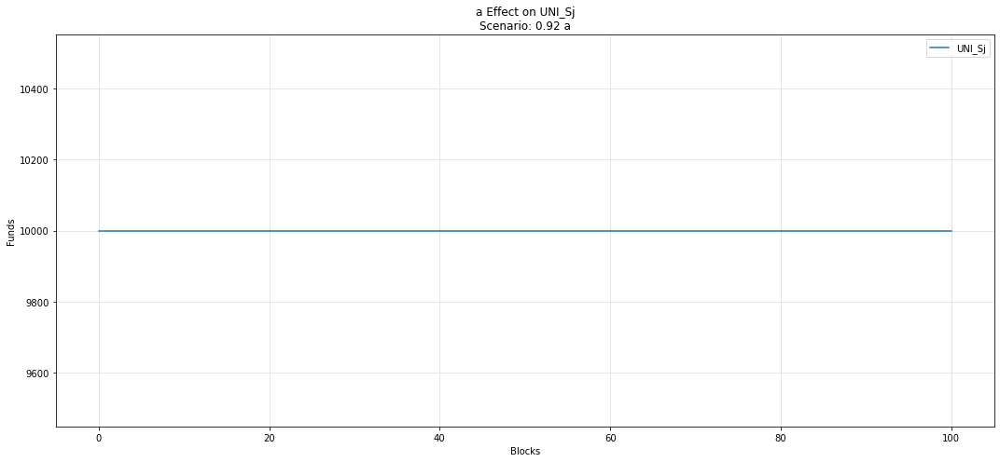

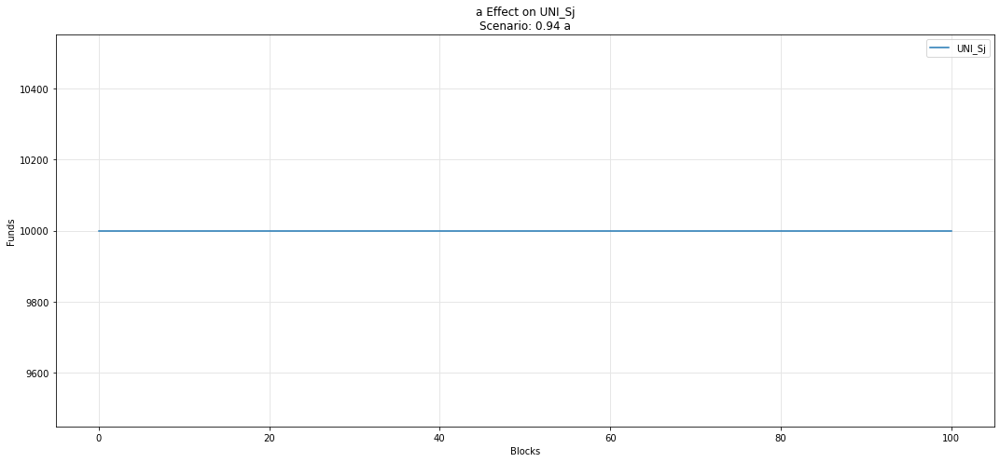

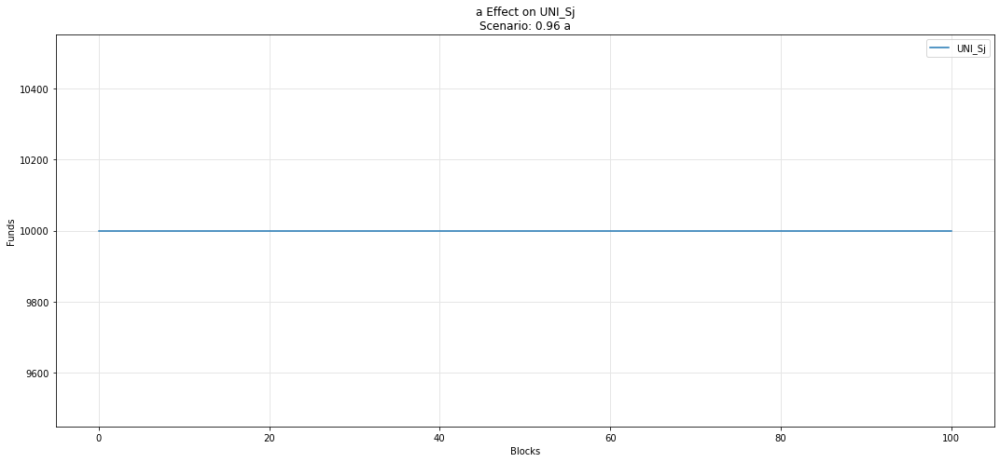

...

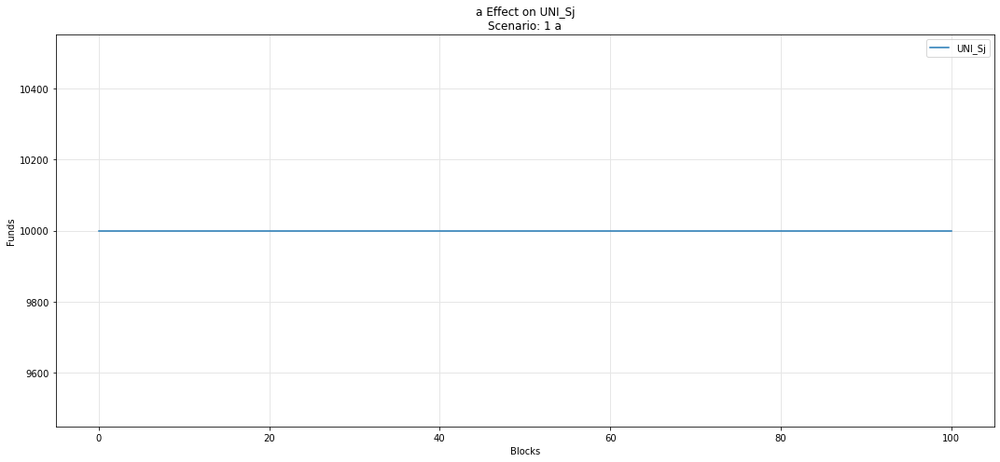

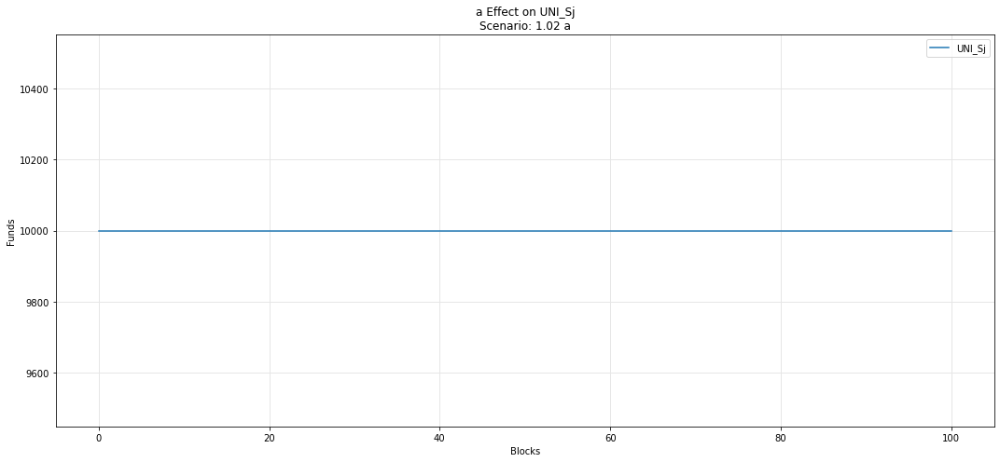

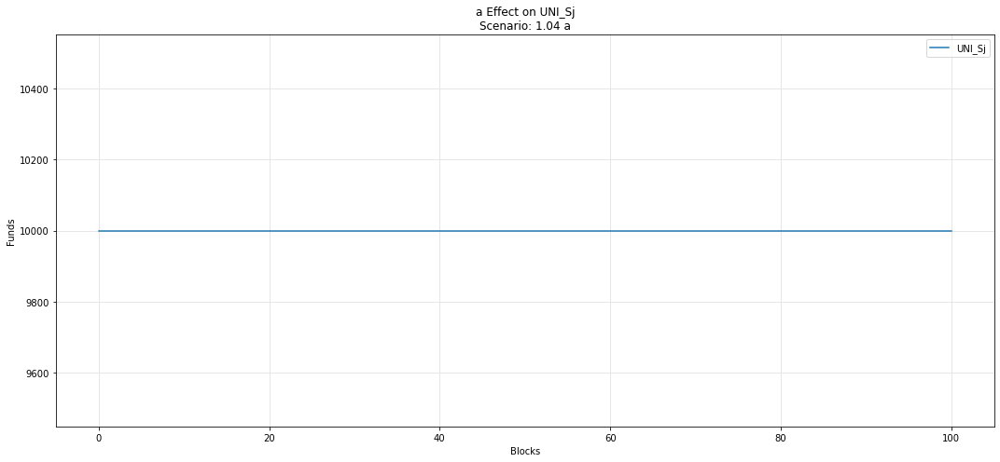

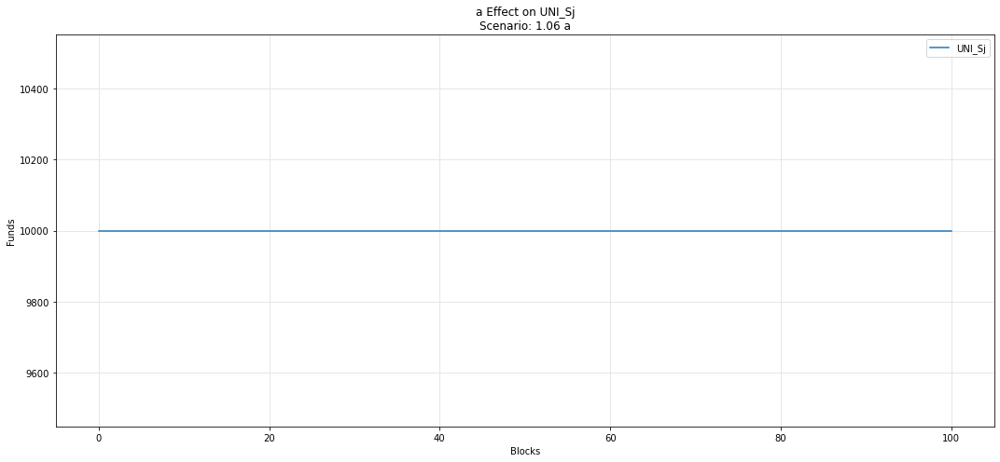

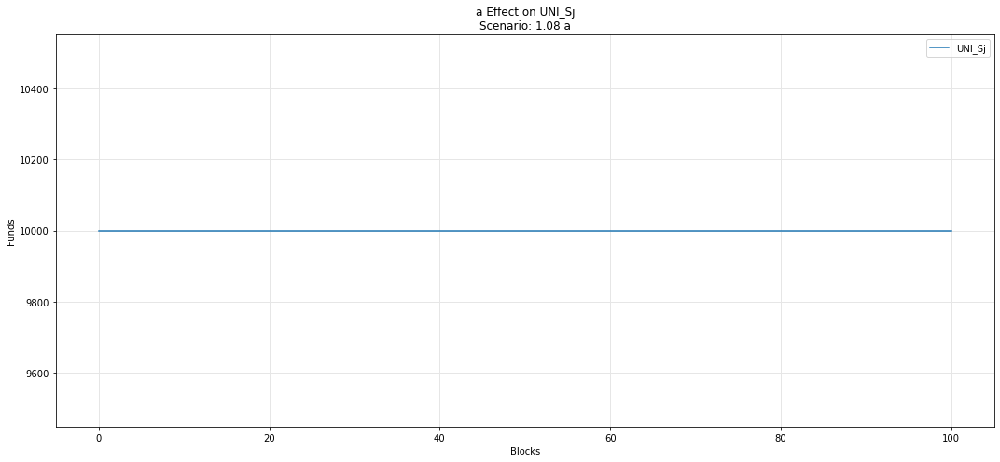

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

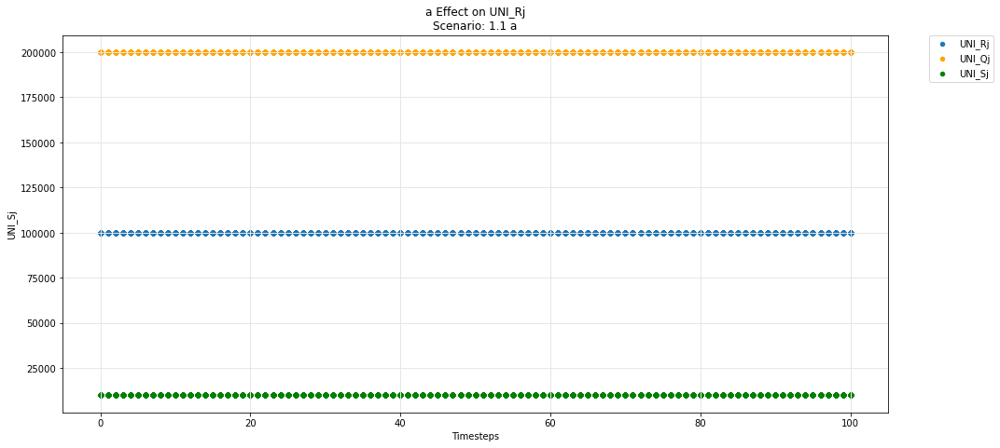

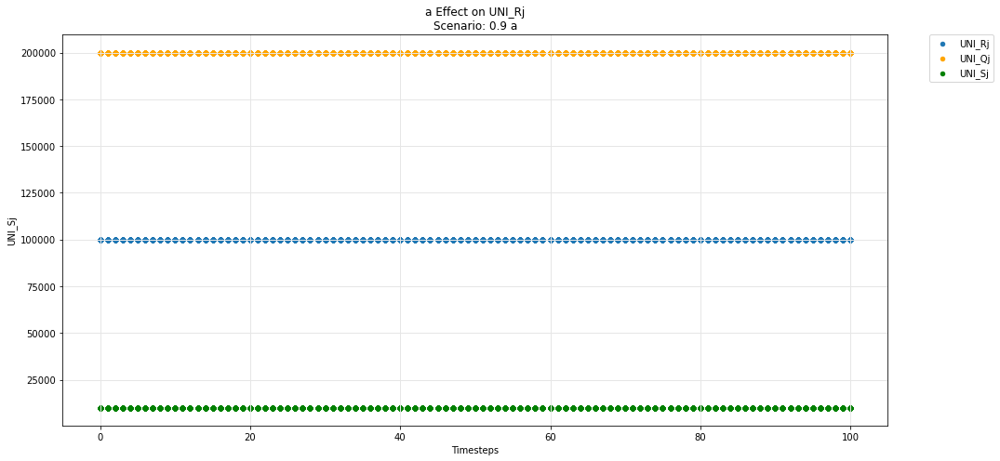

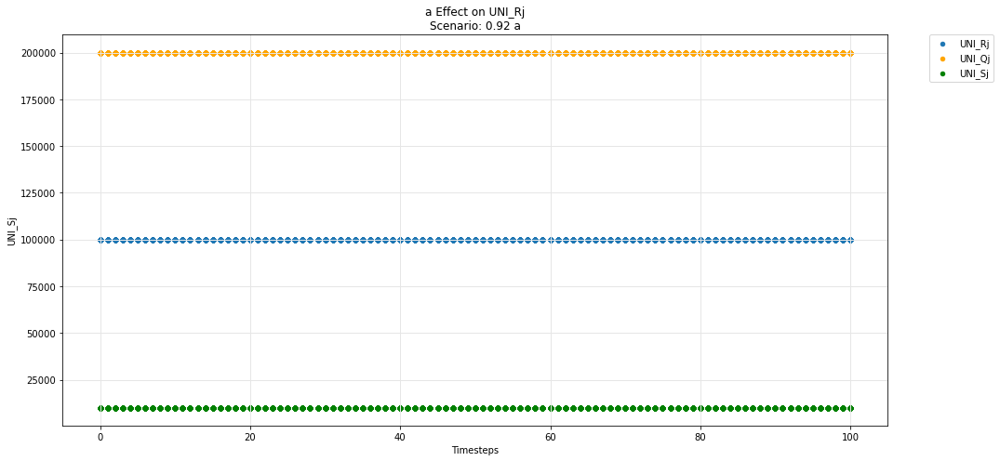

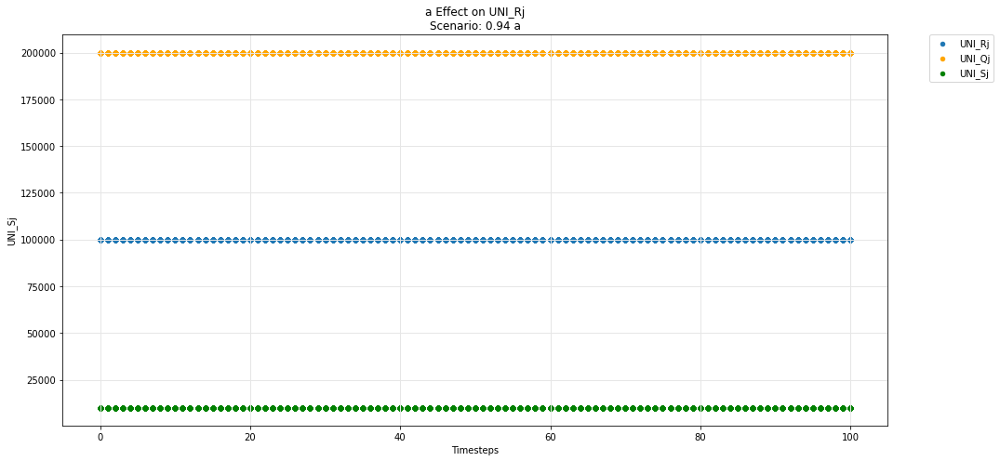

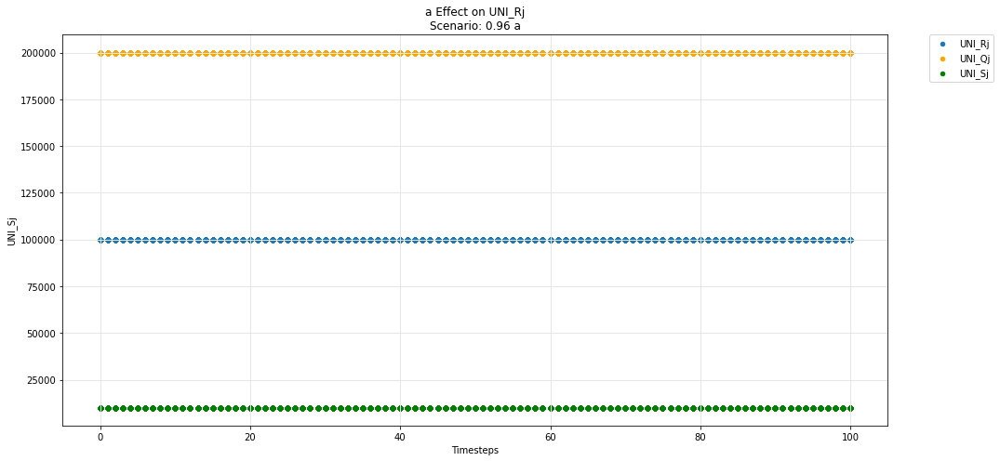

...

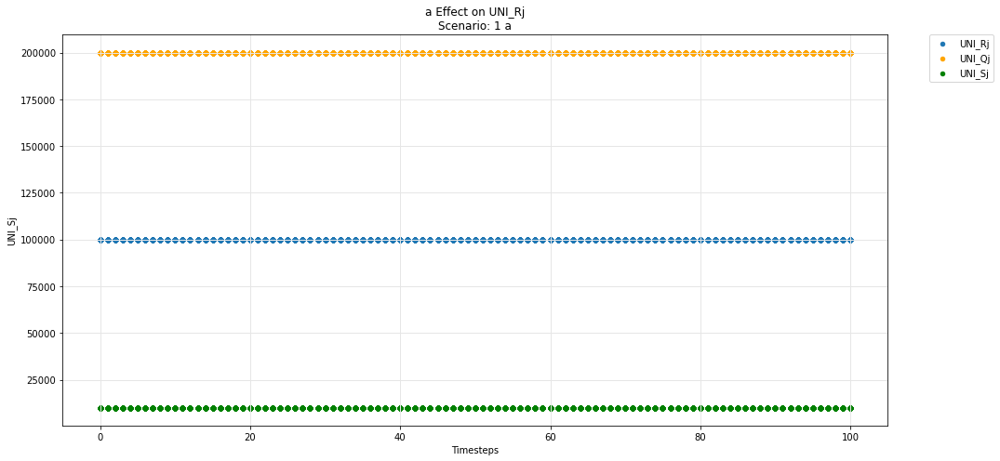

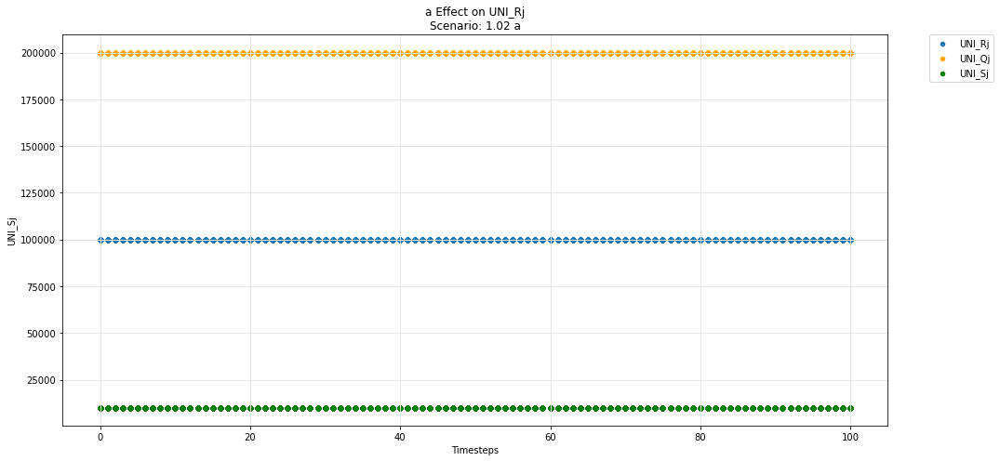

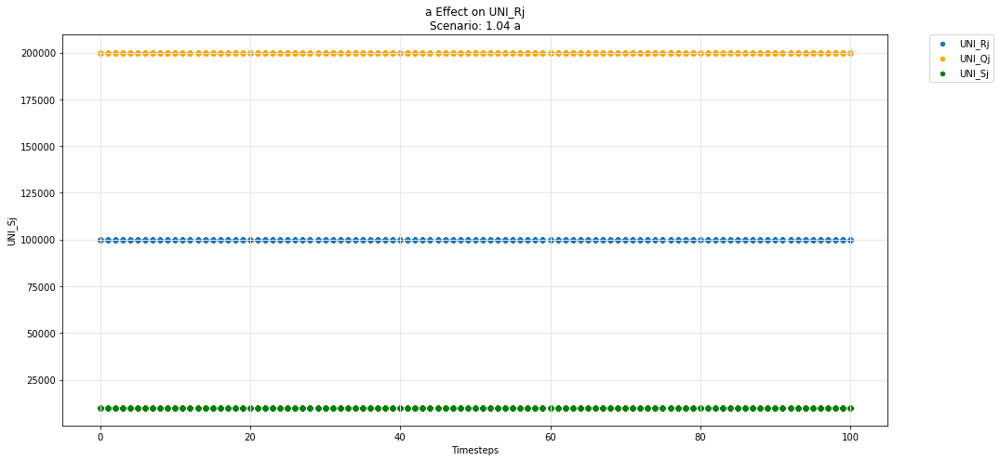

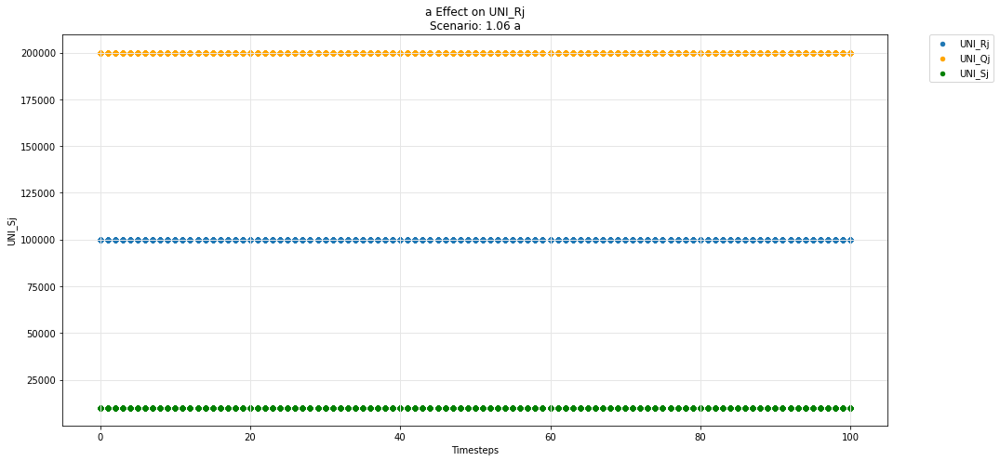

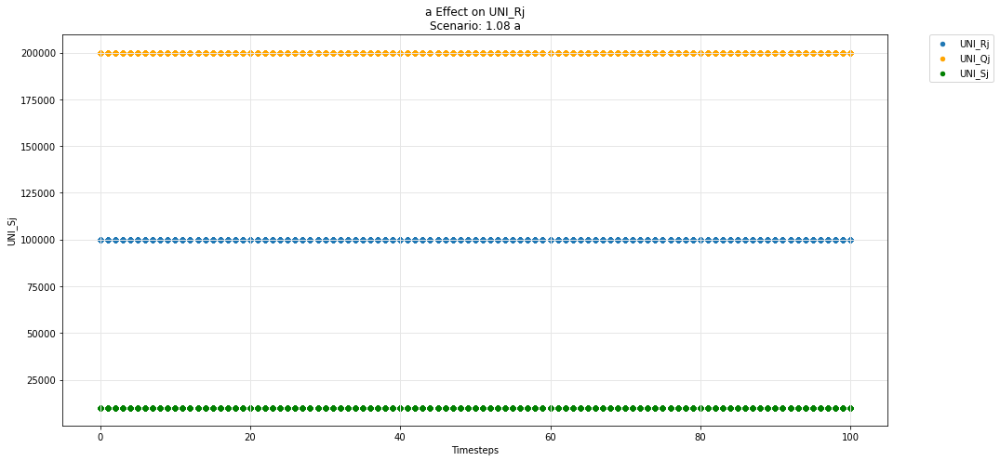

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

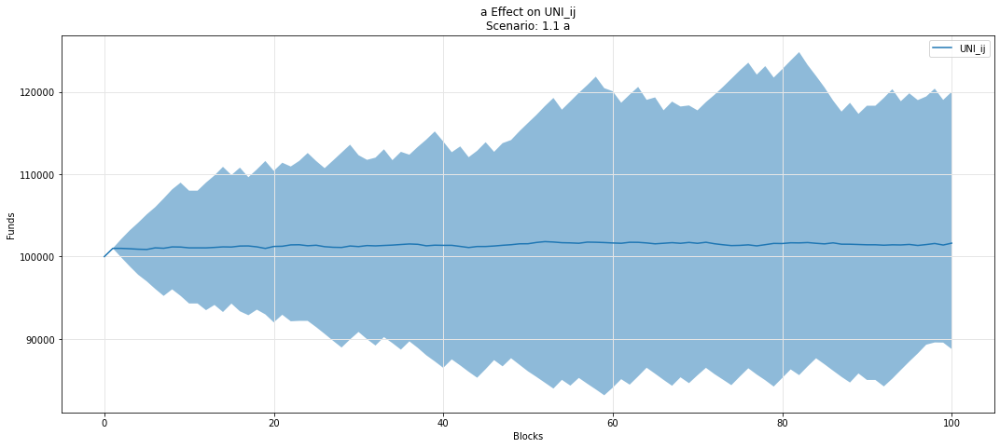

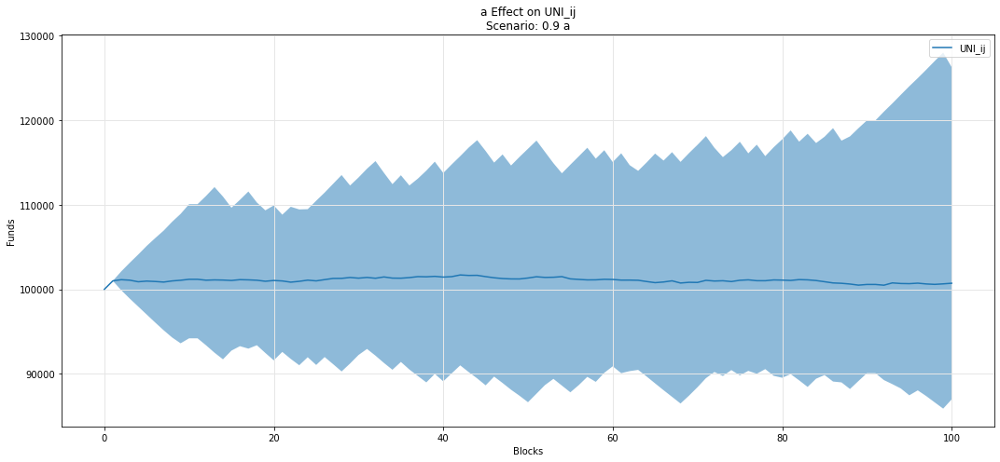

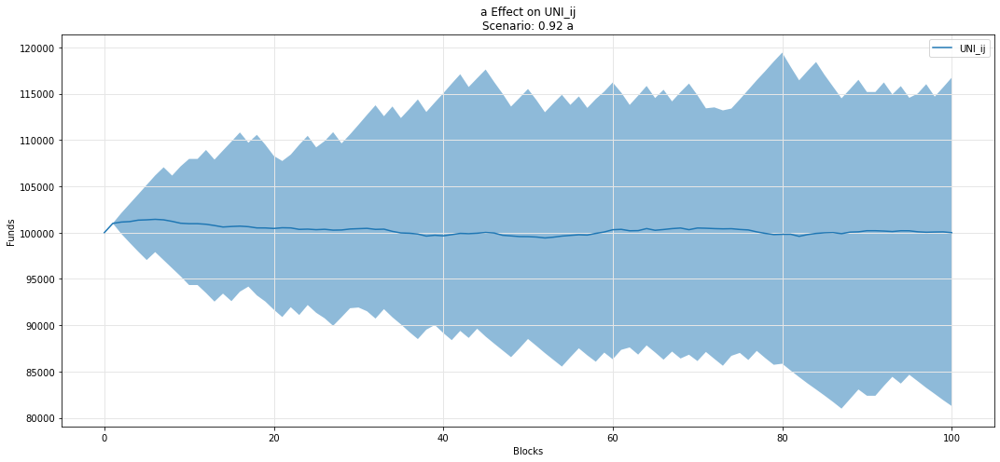

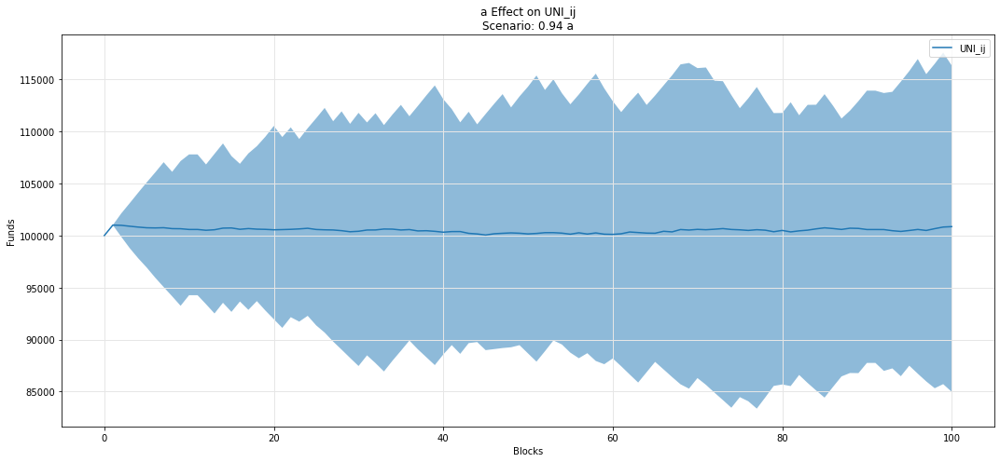

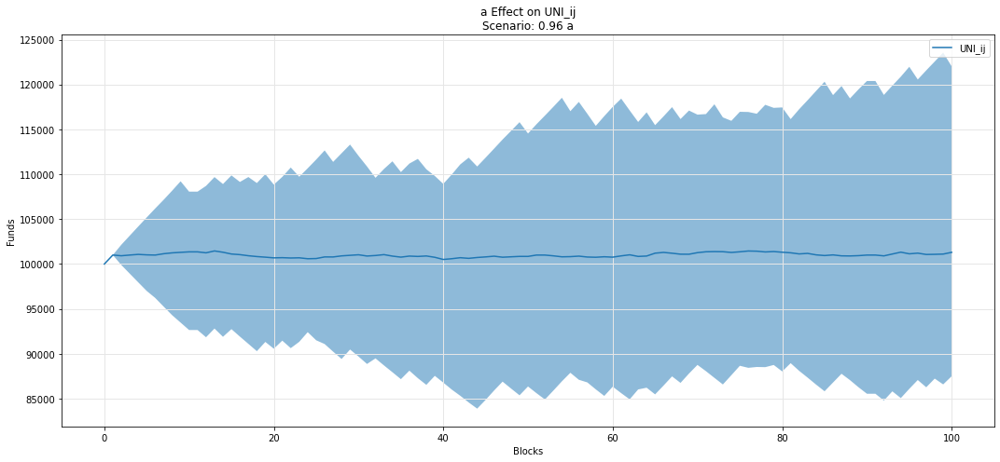

...

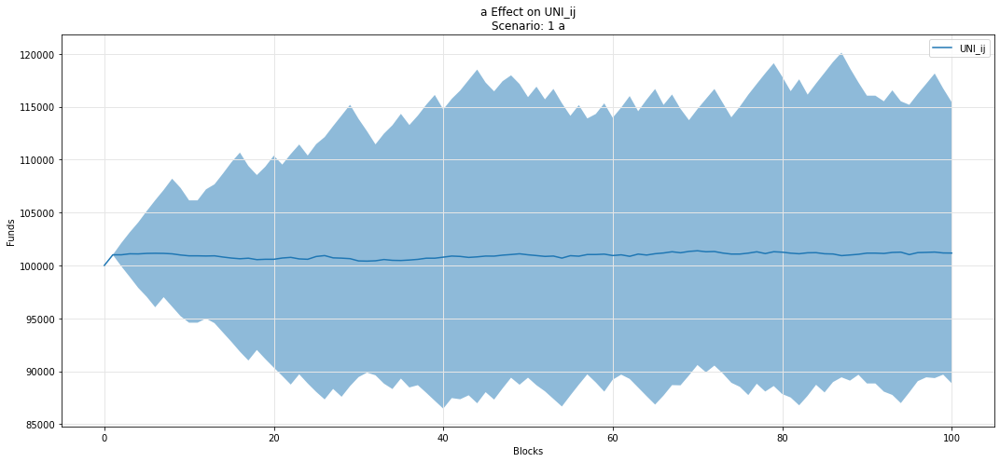

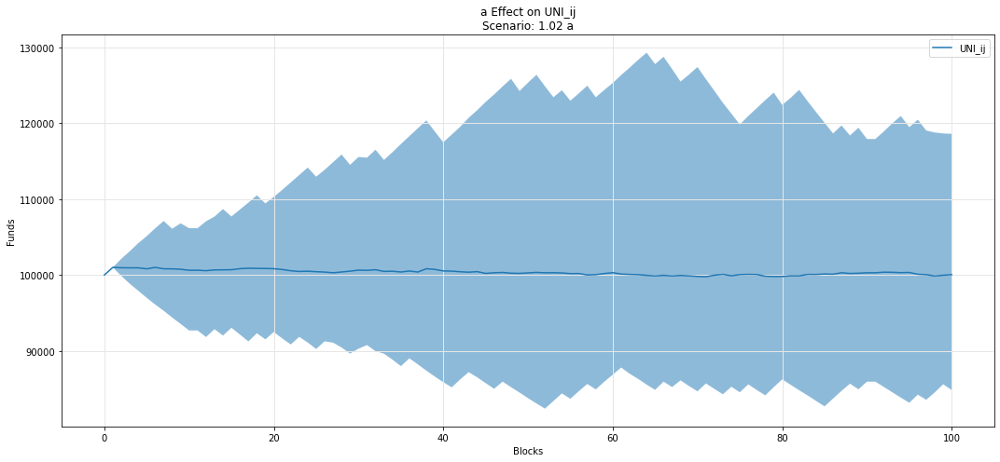

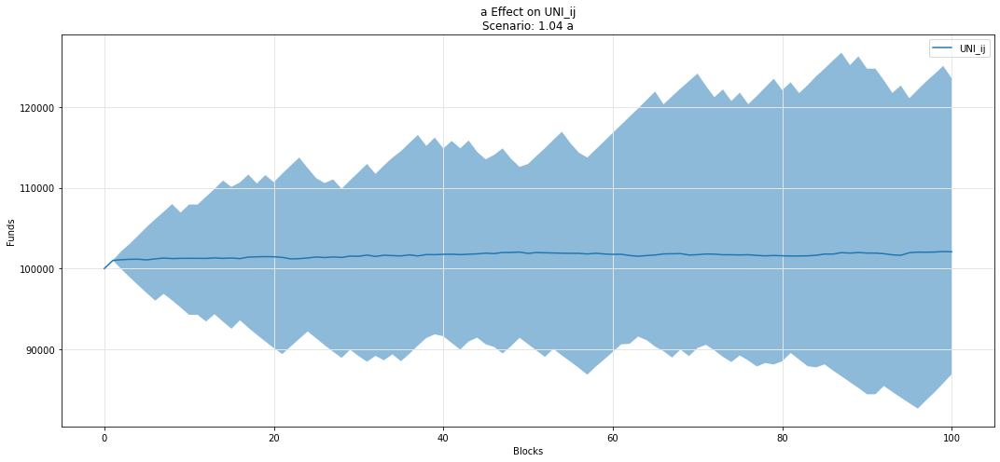

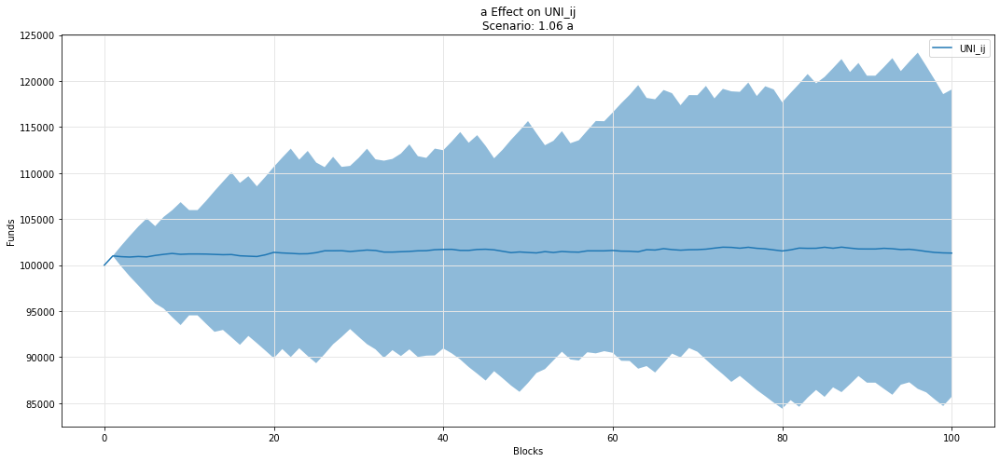

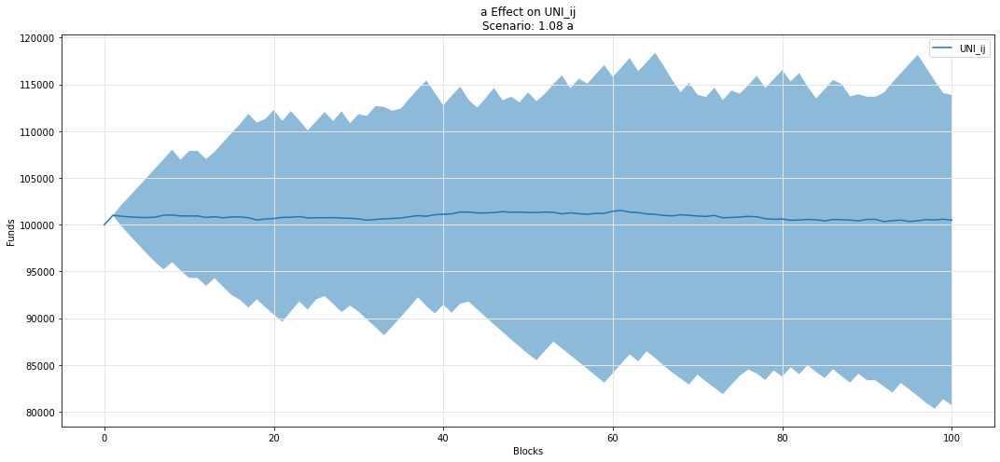

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

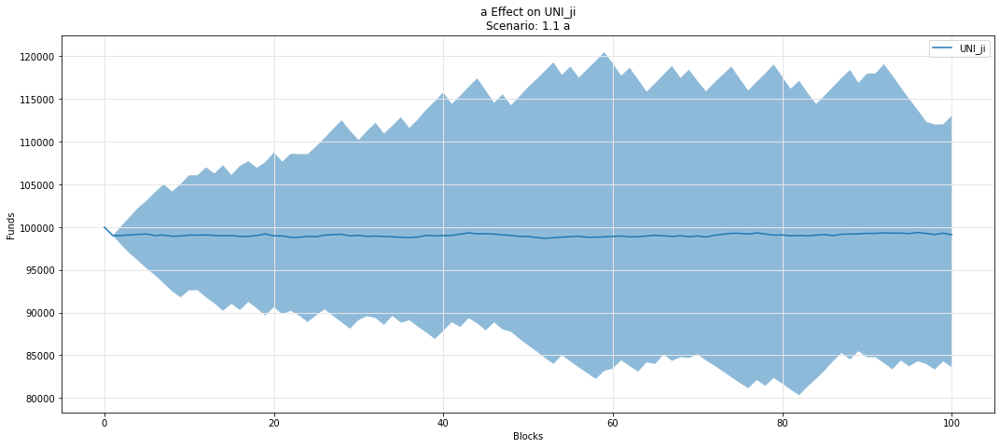

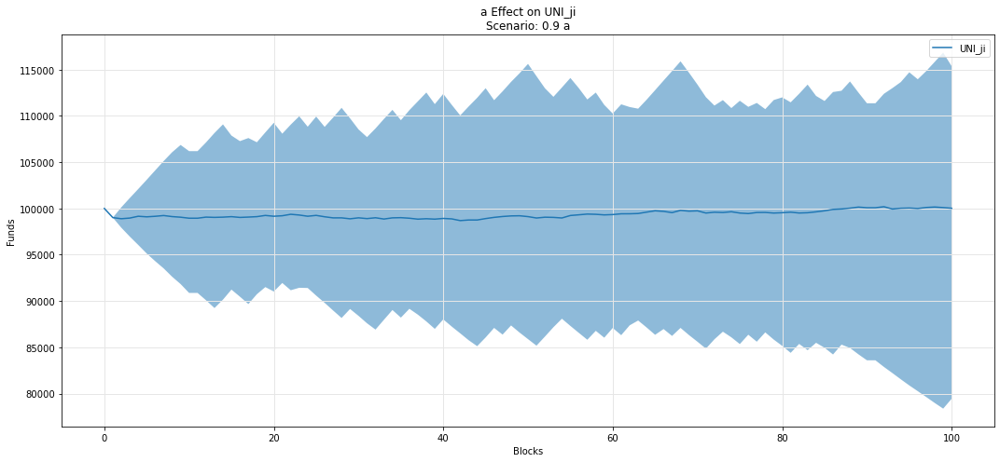

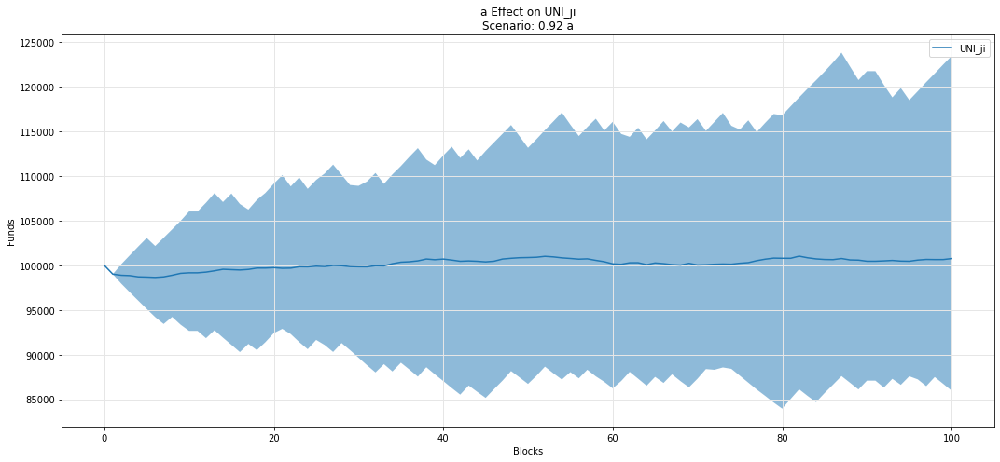

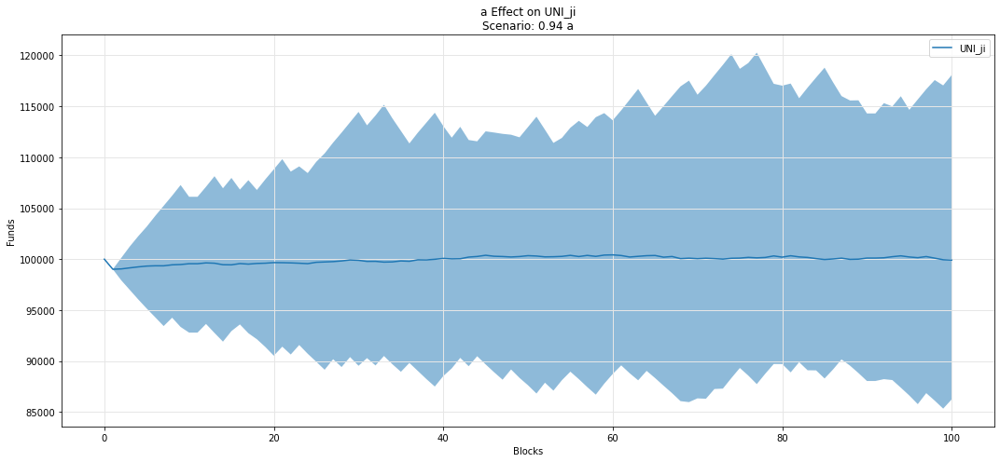

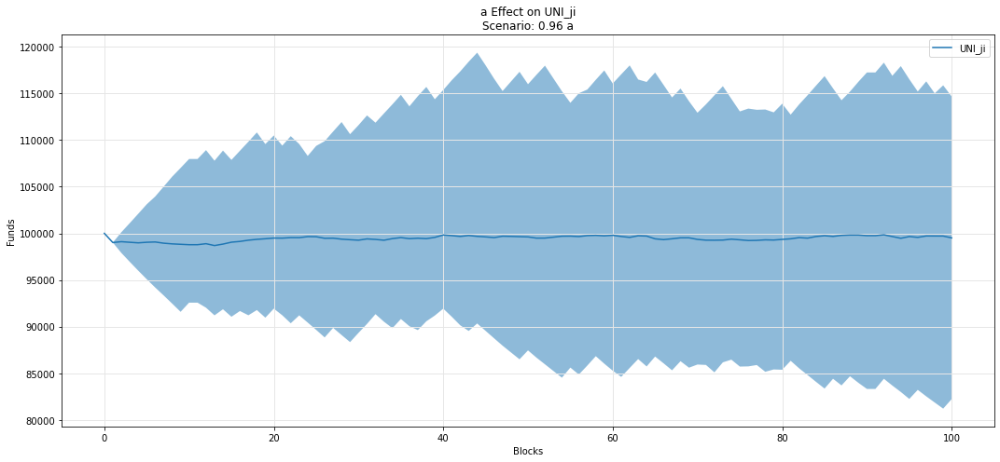

...

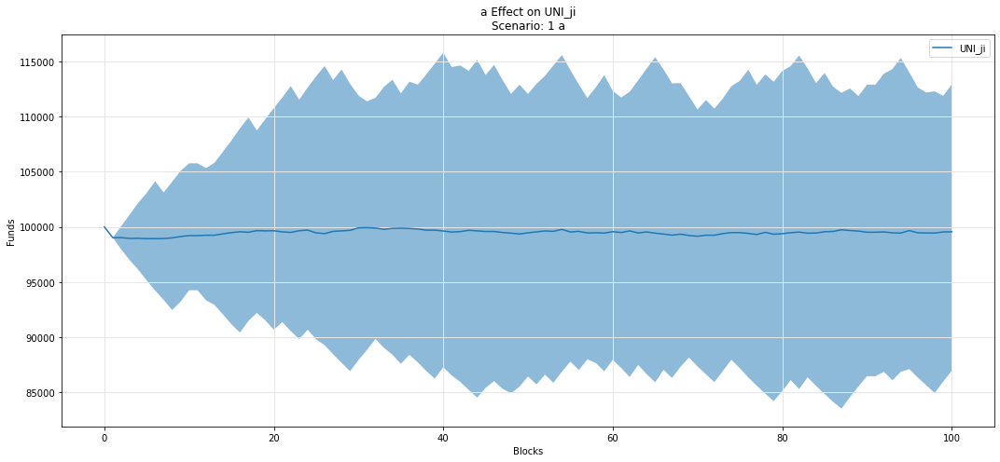

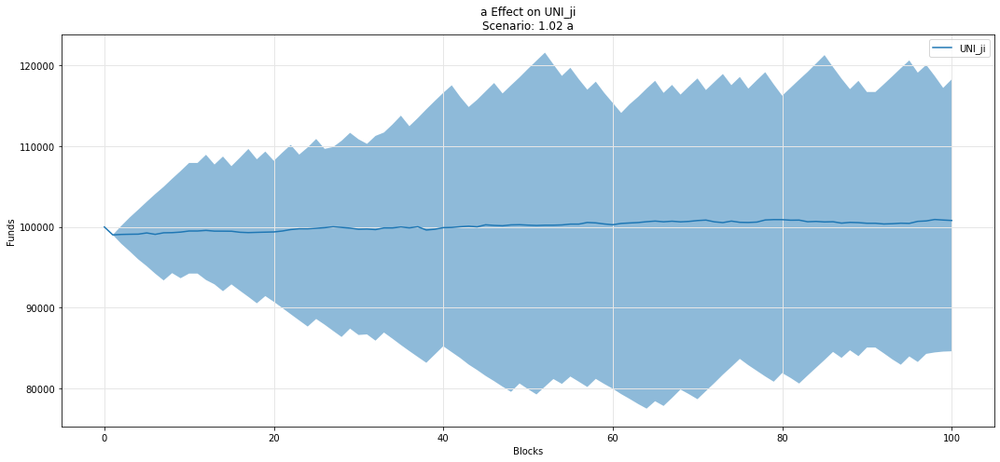

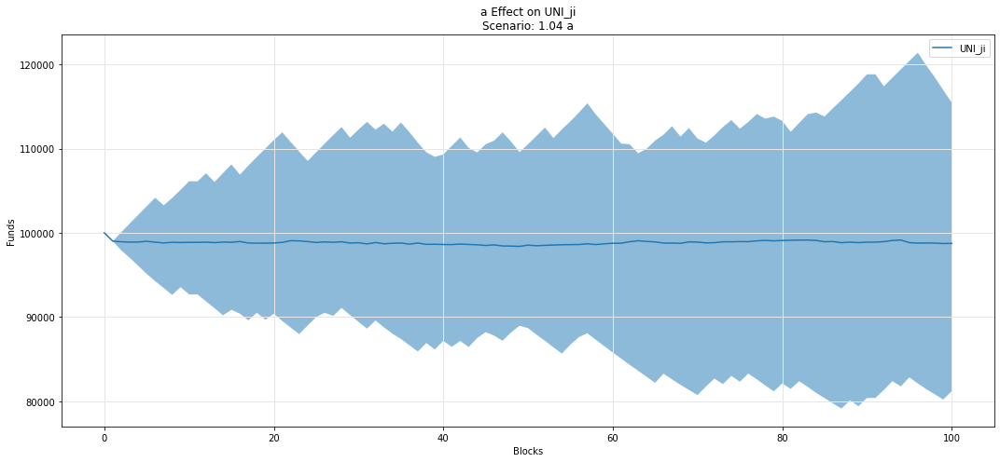

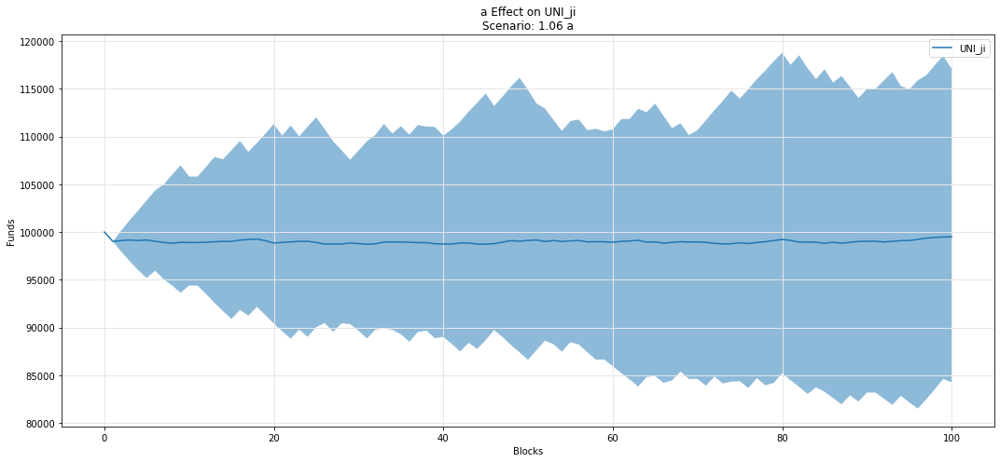

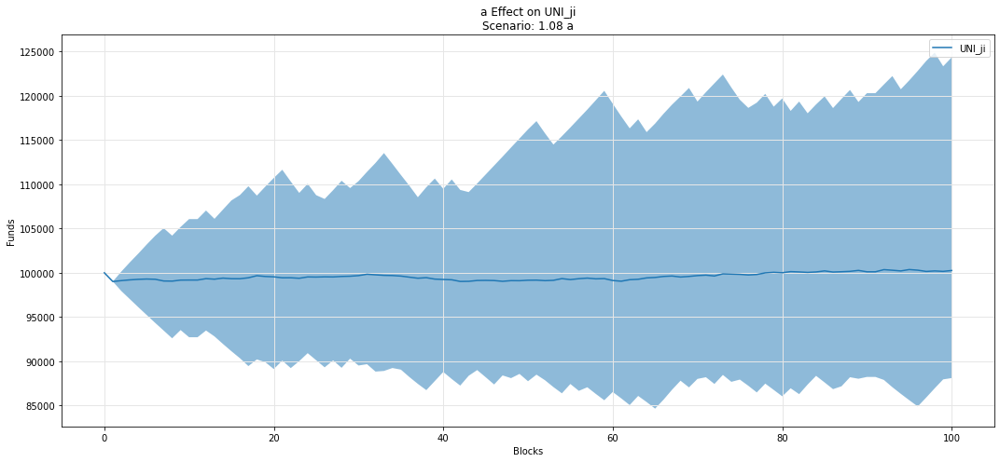

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

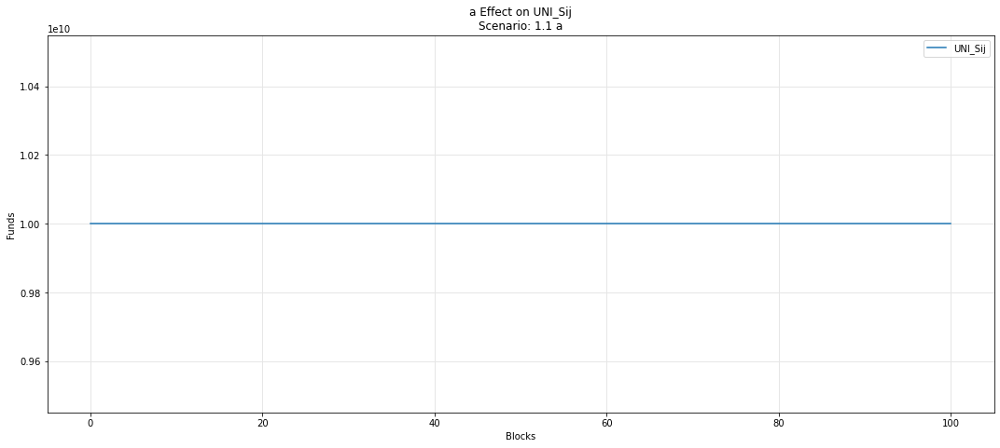

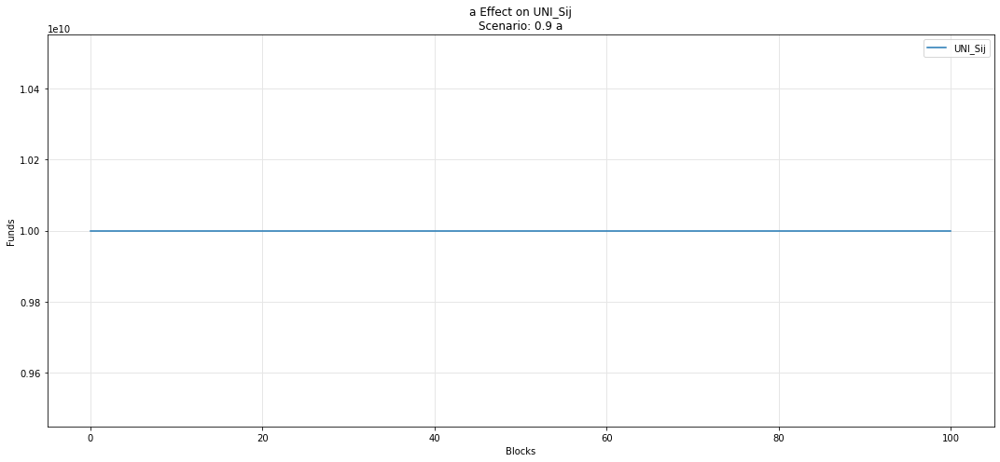

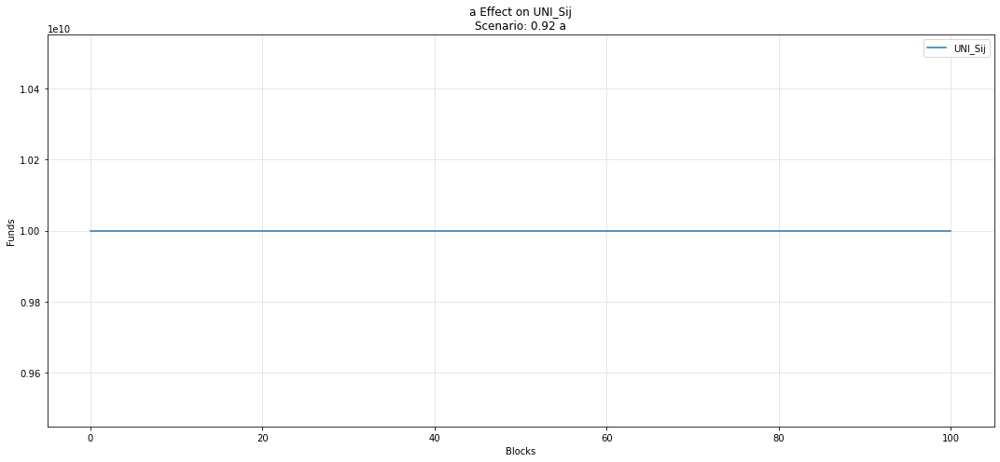

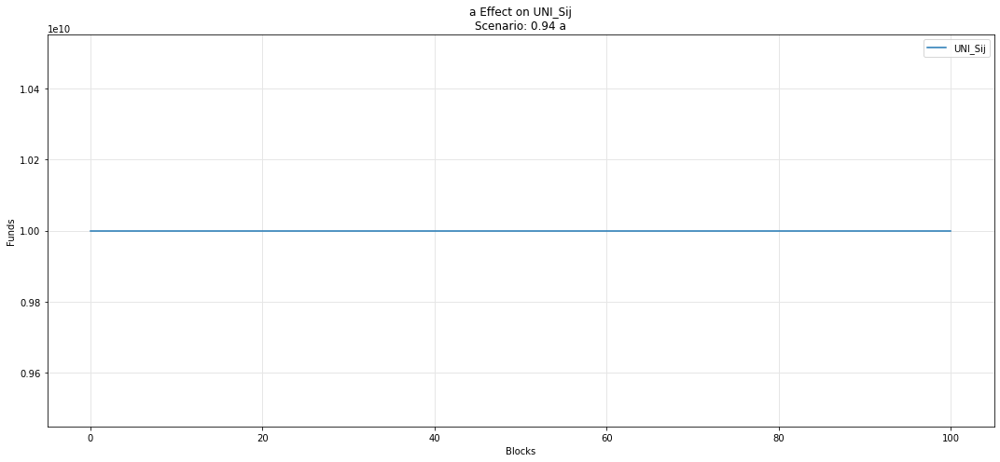

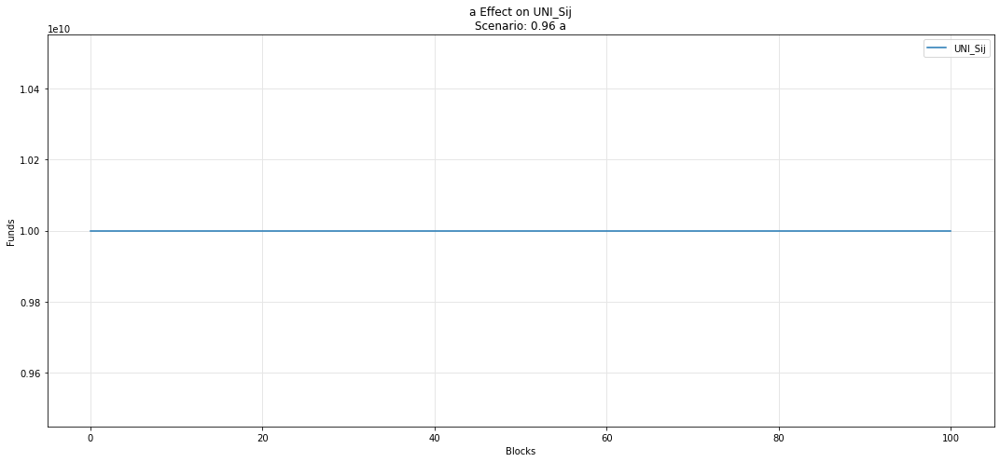

...

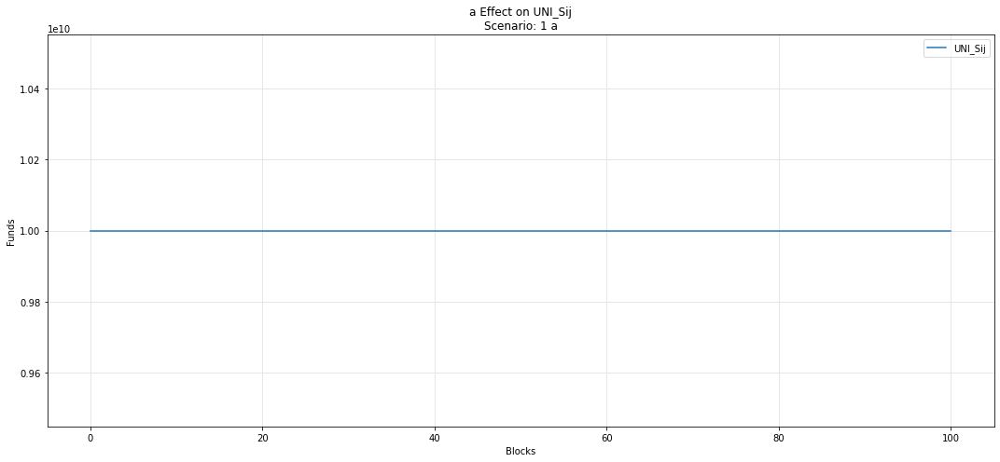

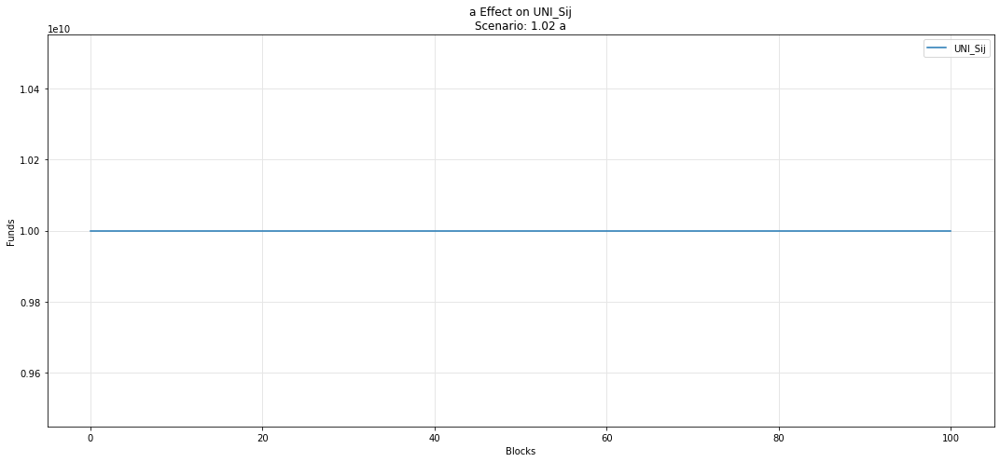

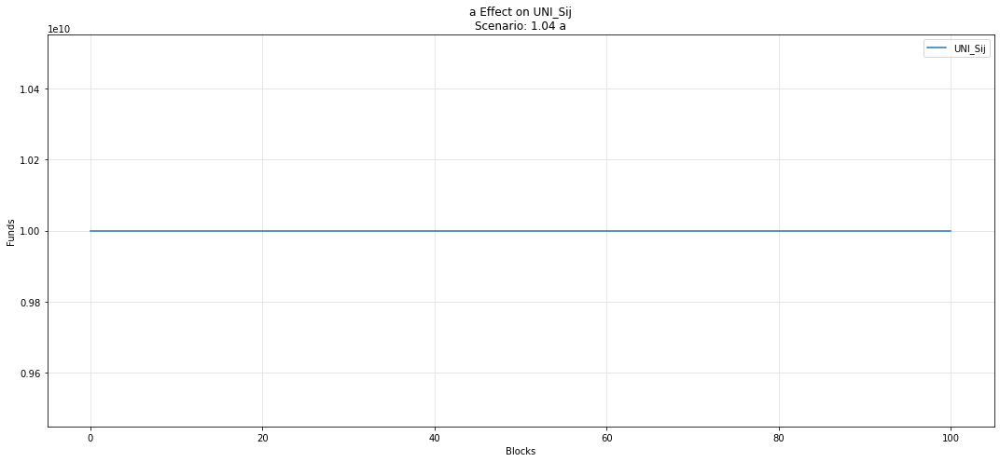

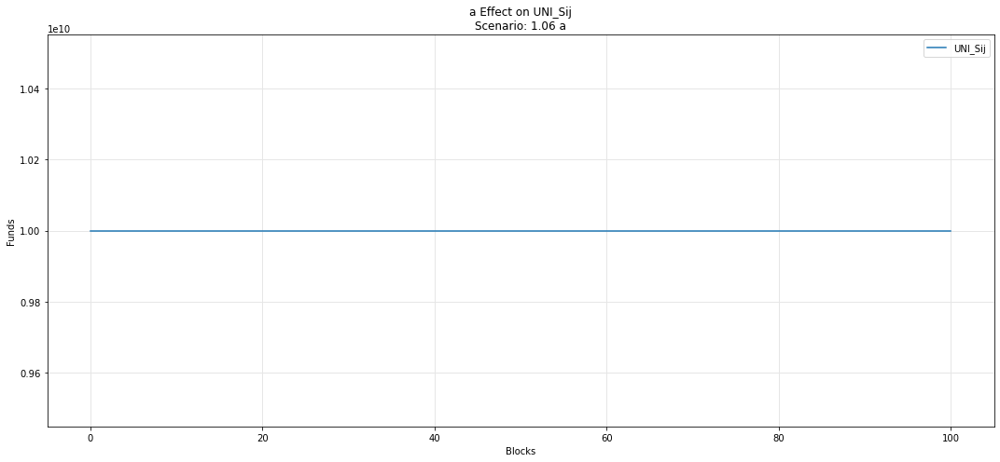

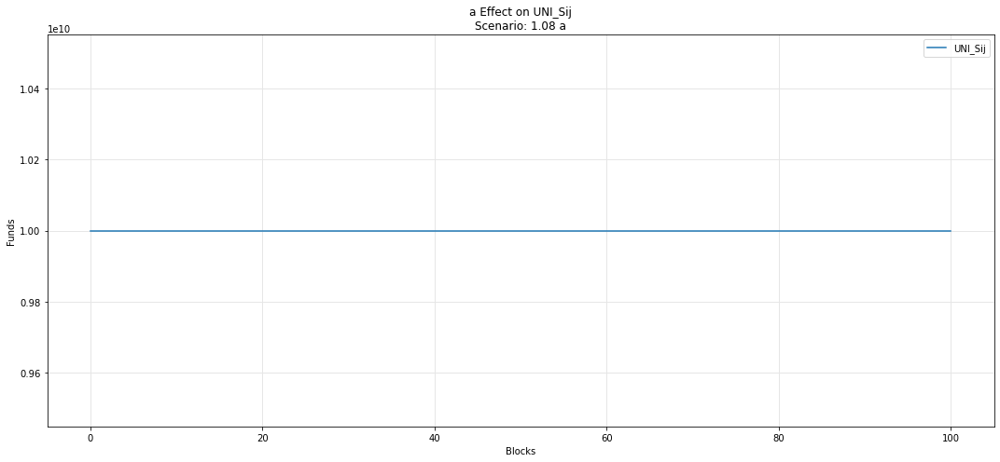

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

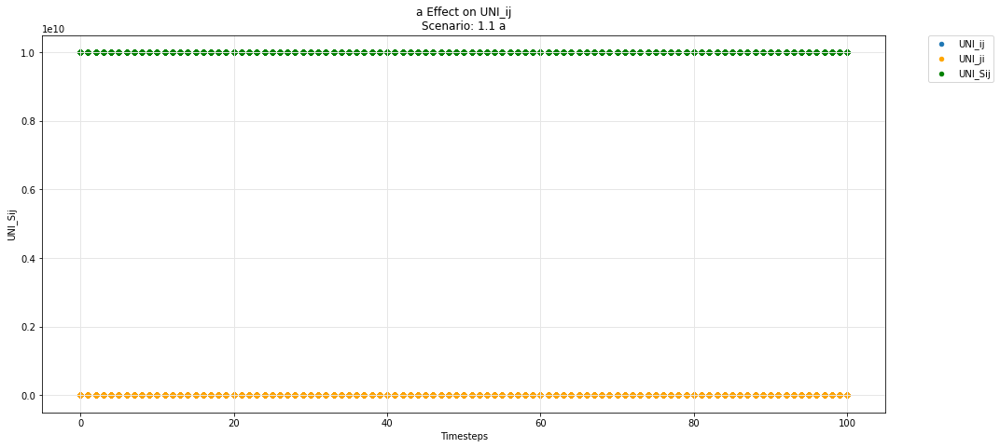

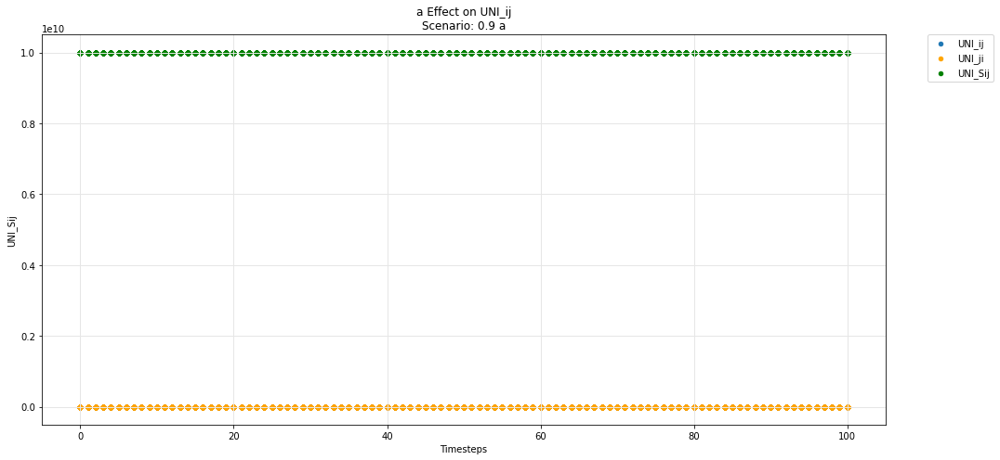

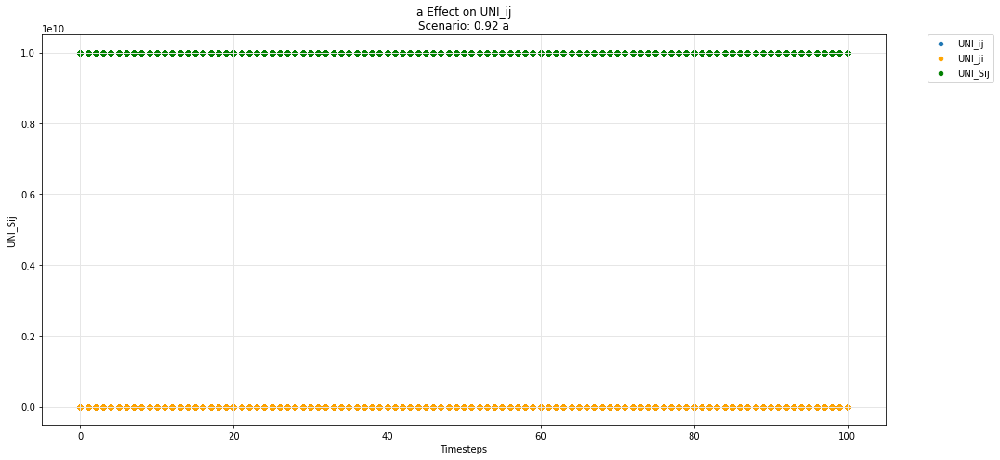

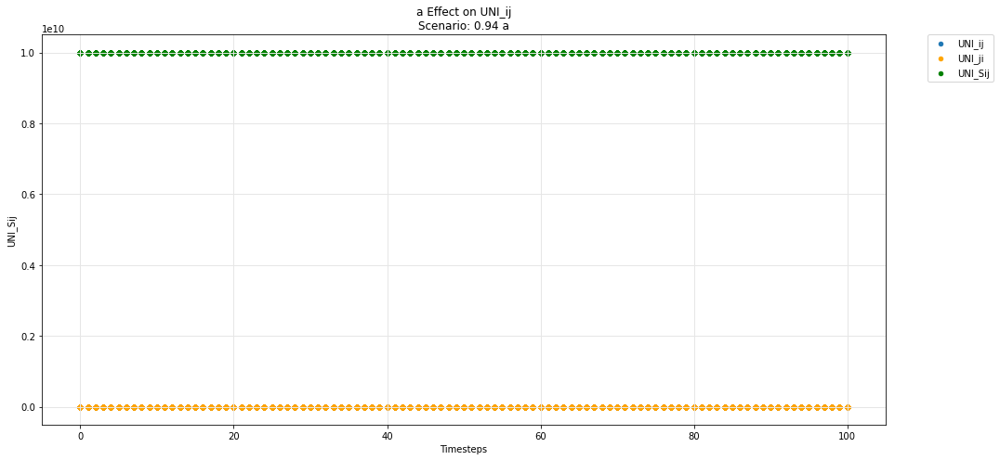

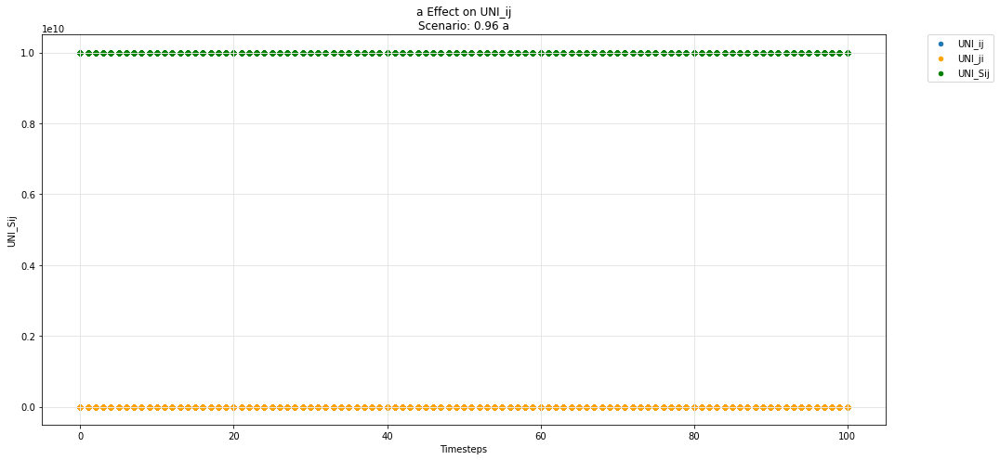

...

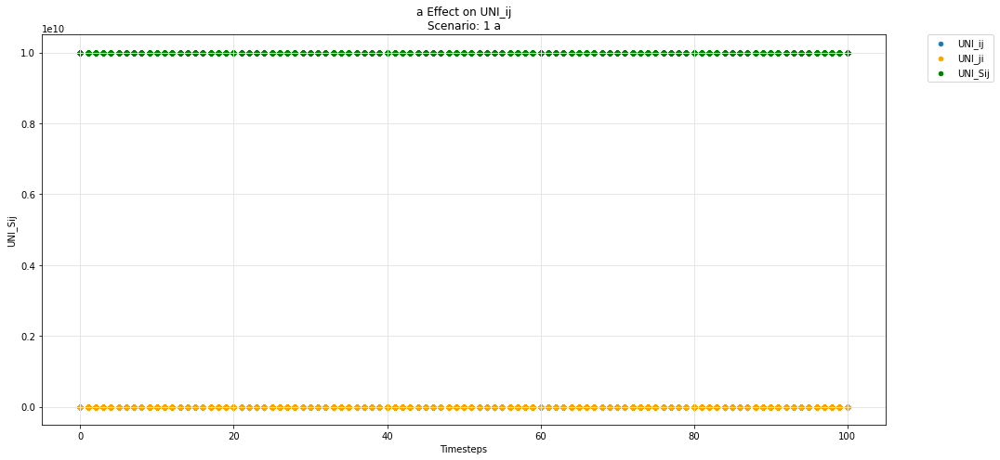

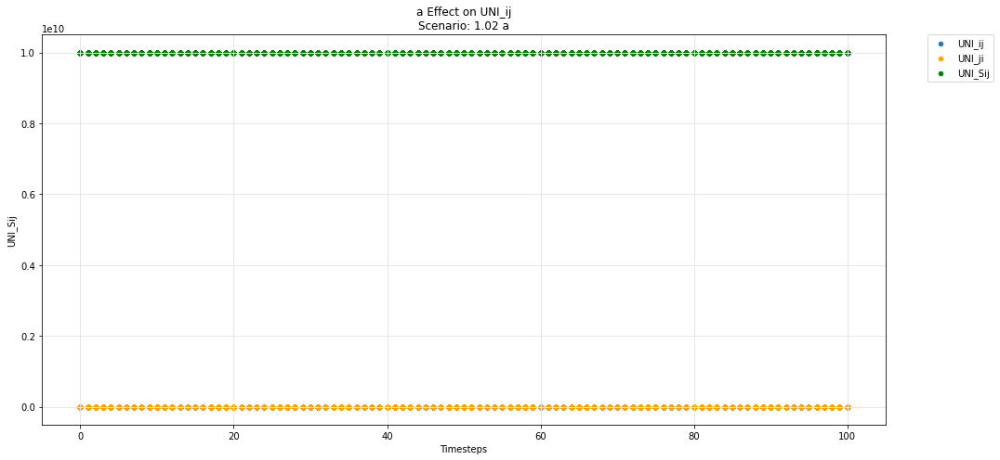

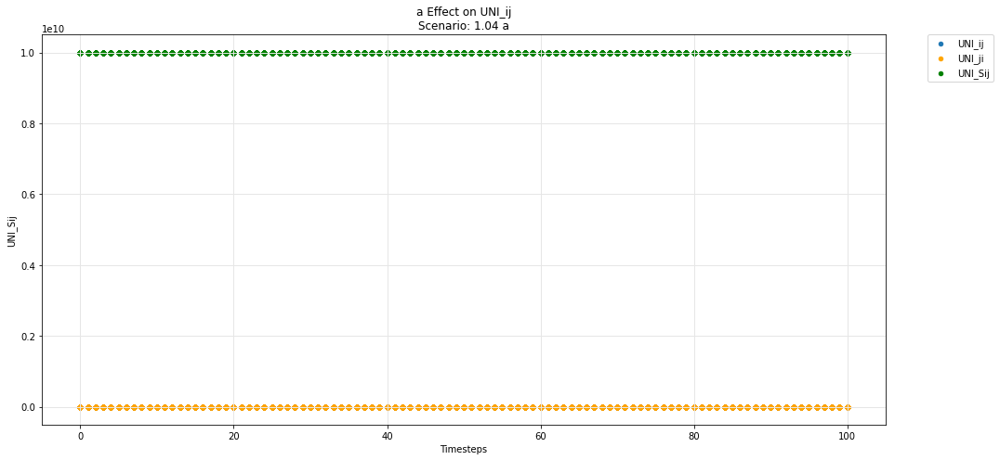

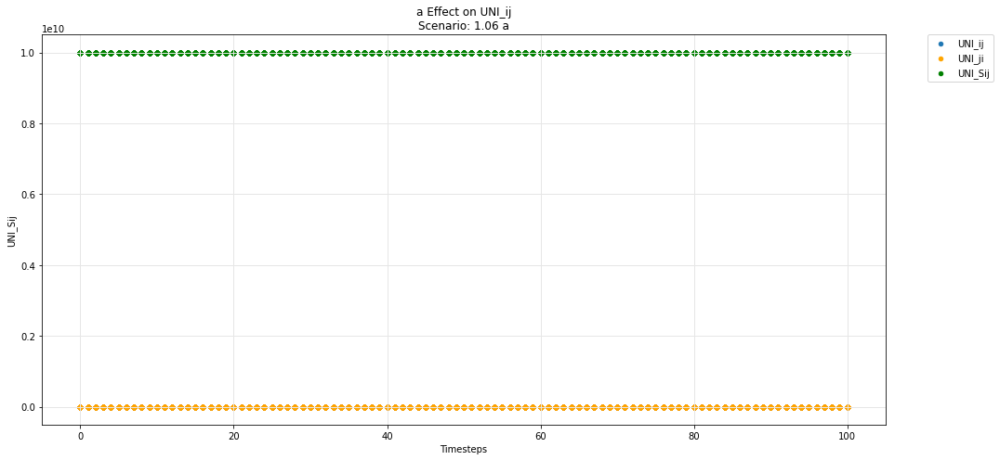

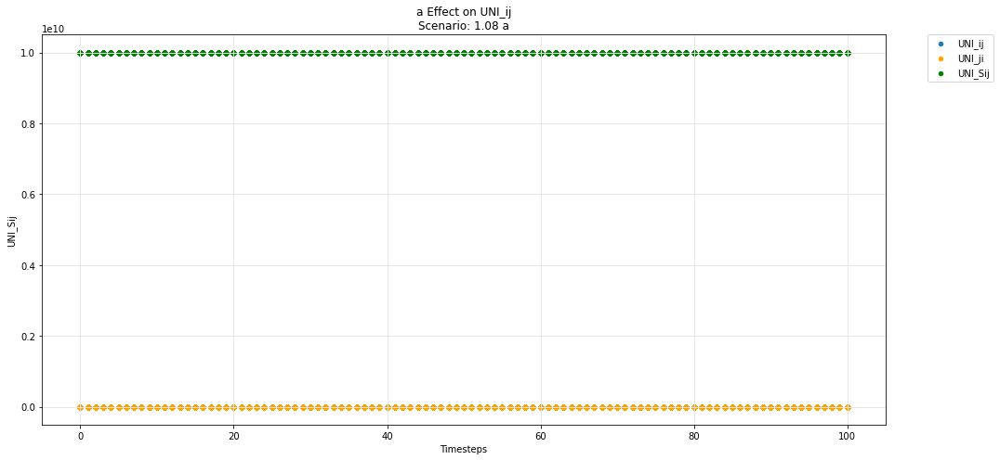

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

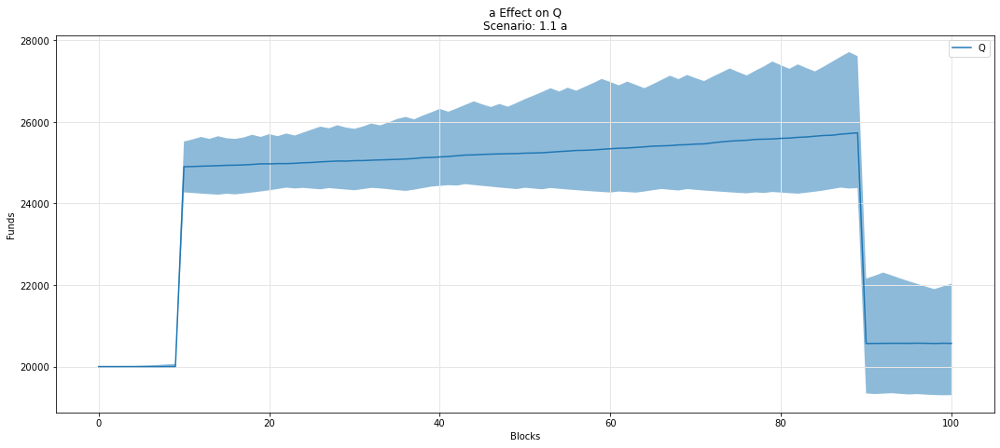

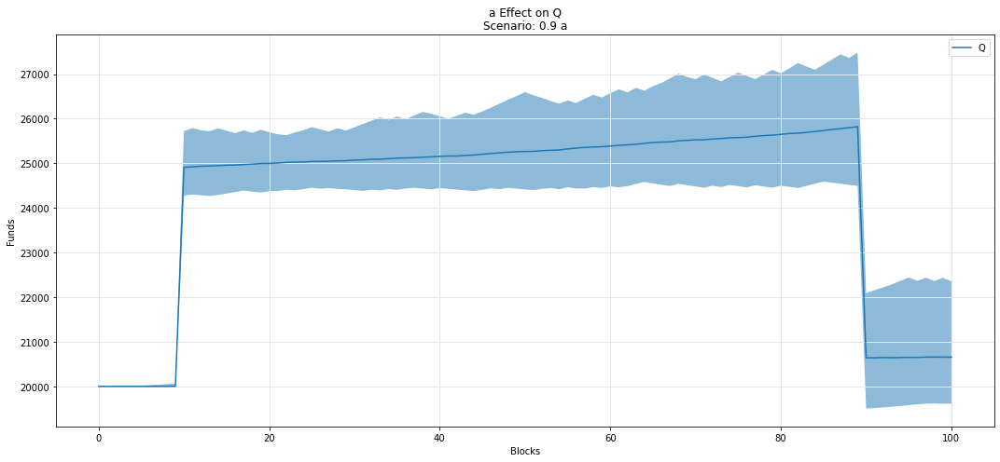

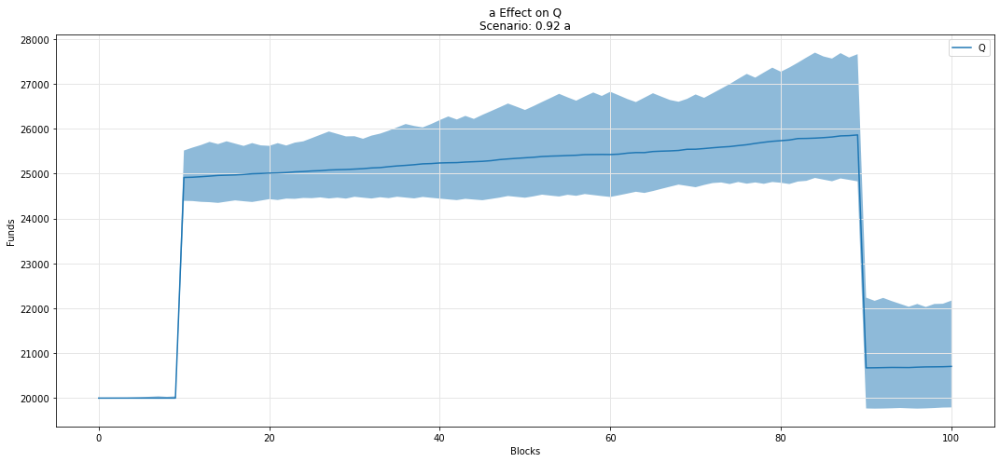

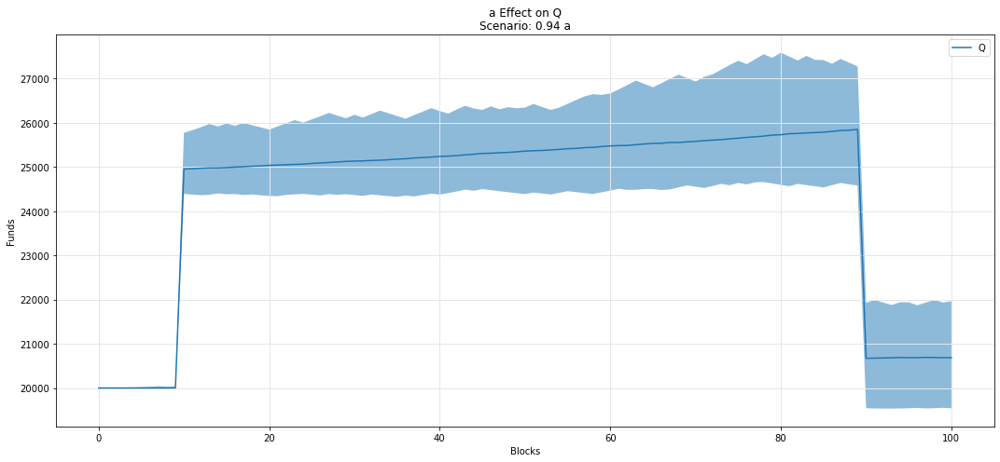

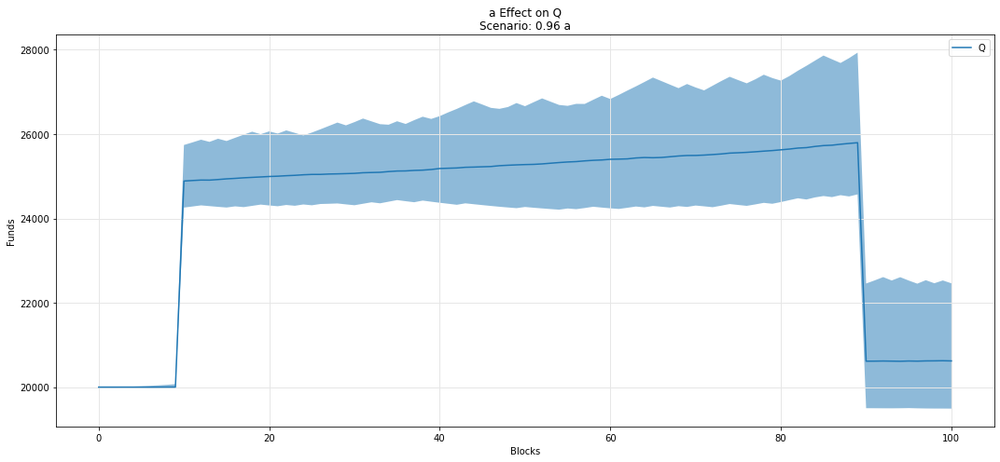

...

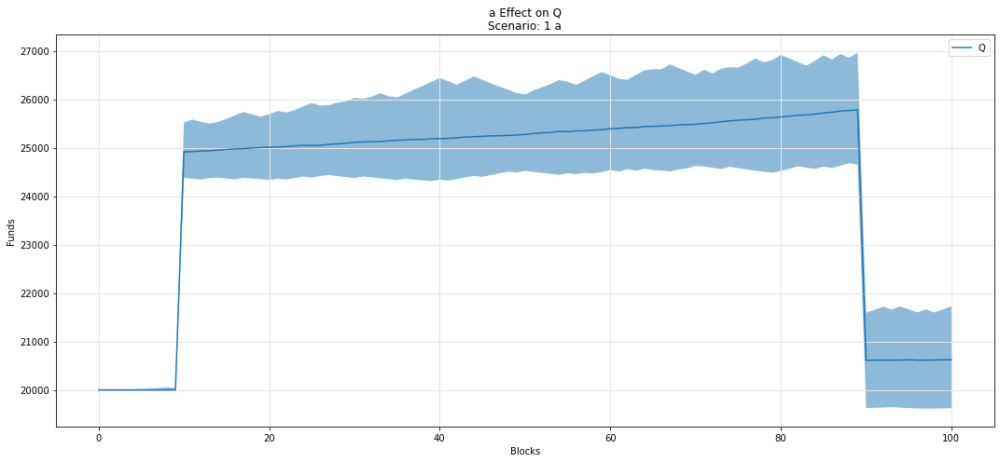

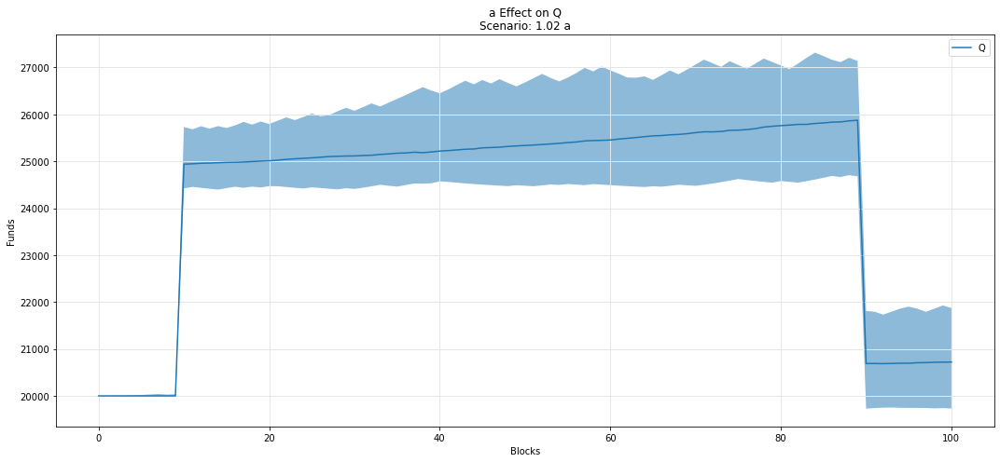

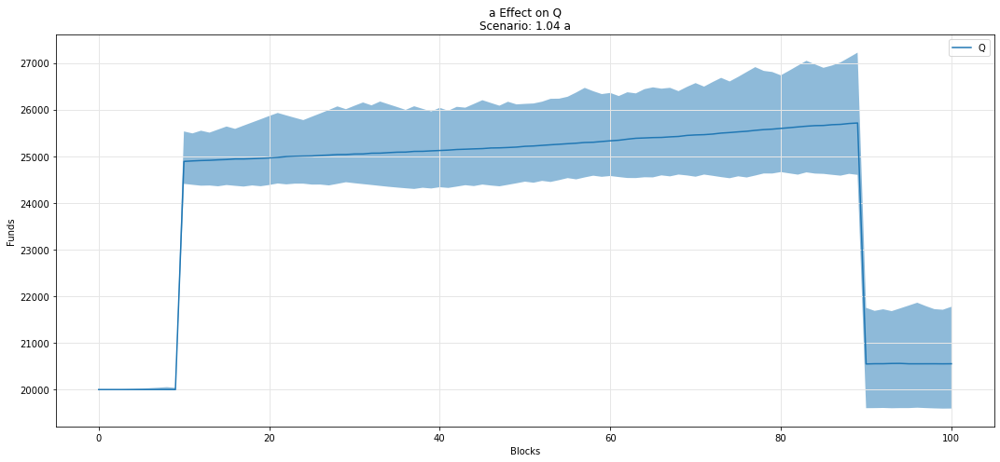

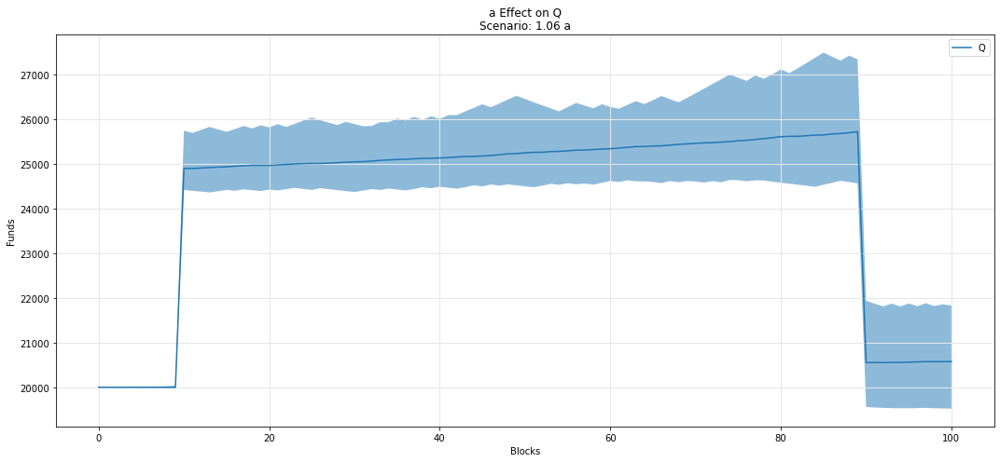

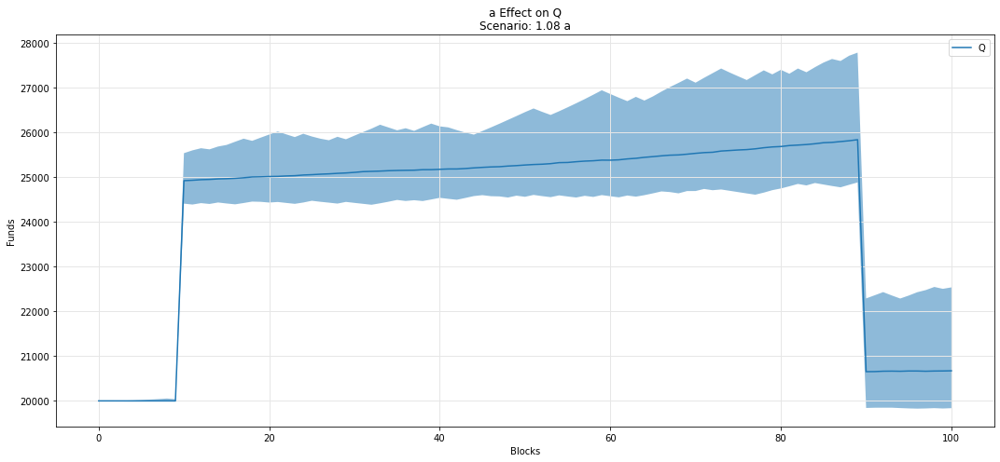

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

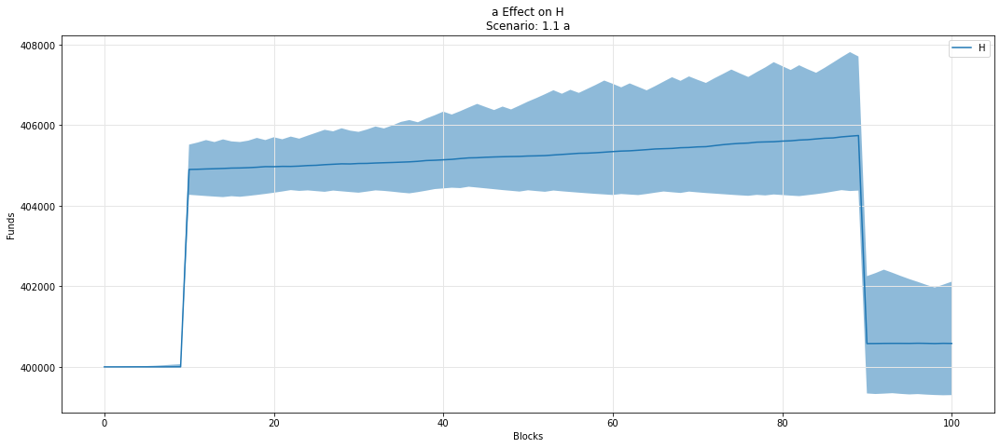

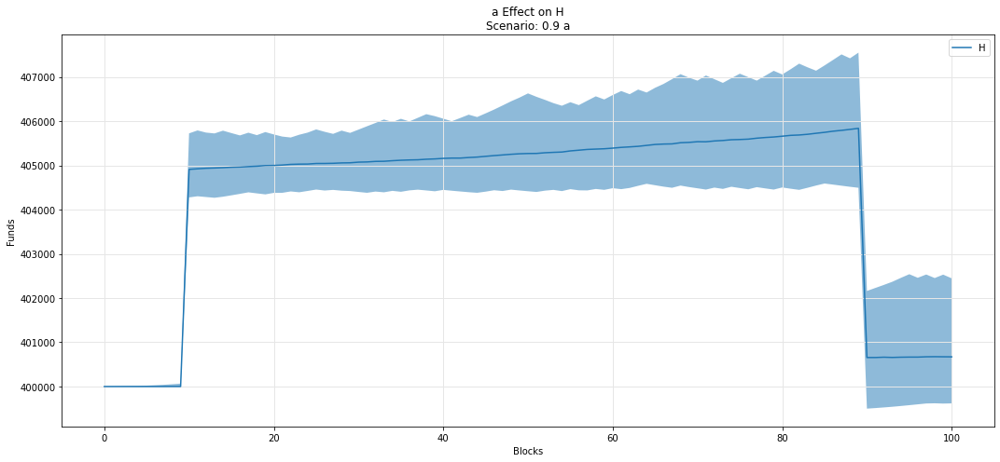

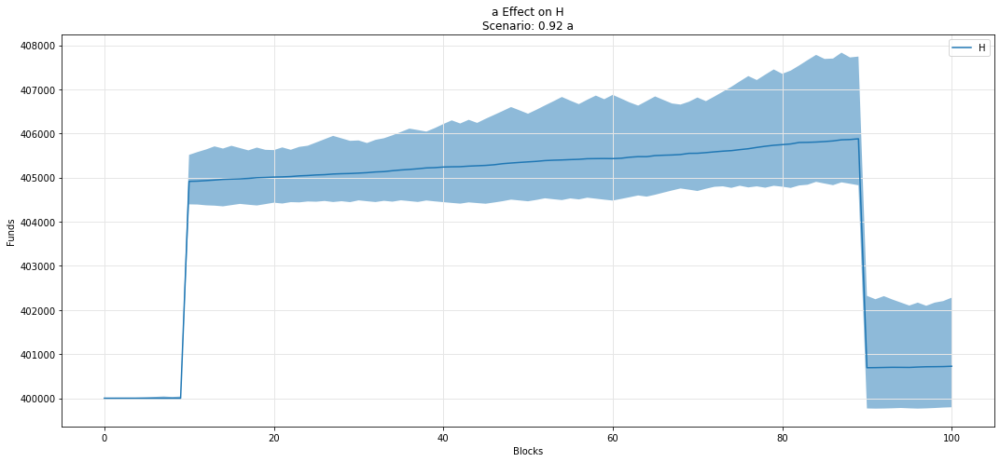

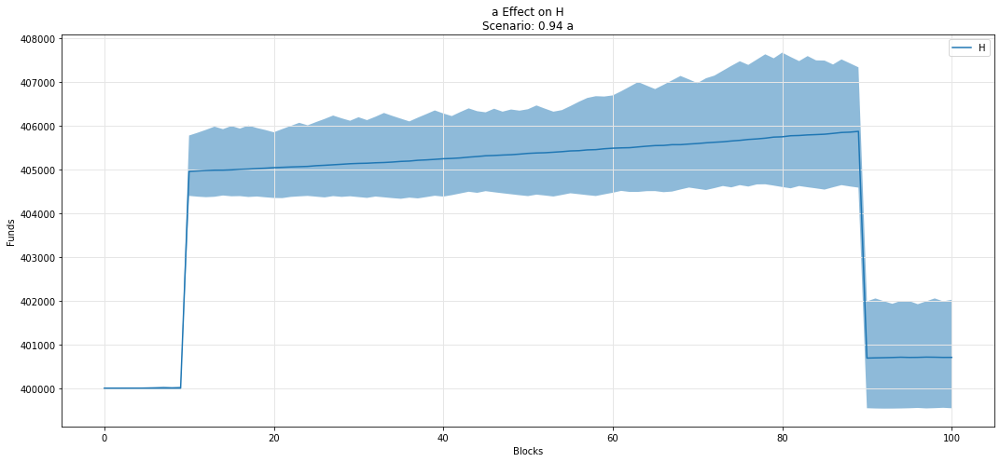

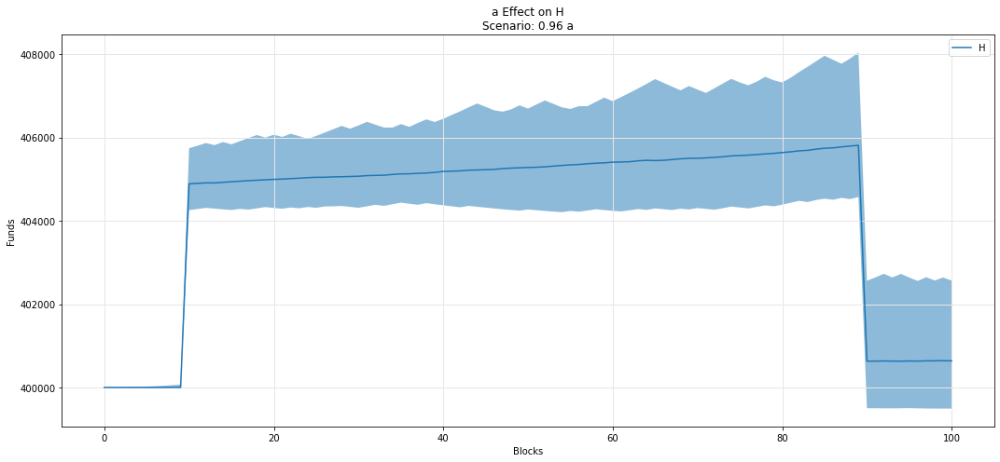

...

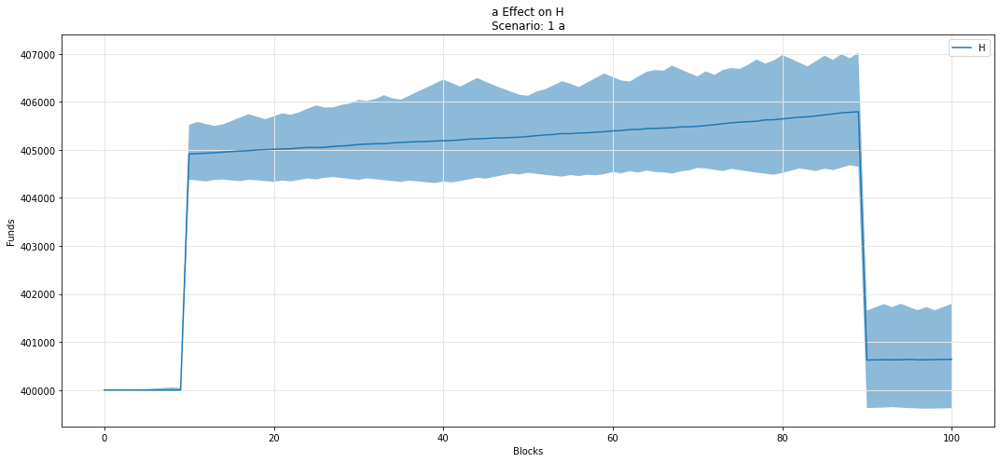

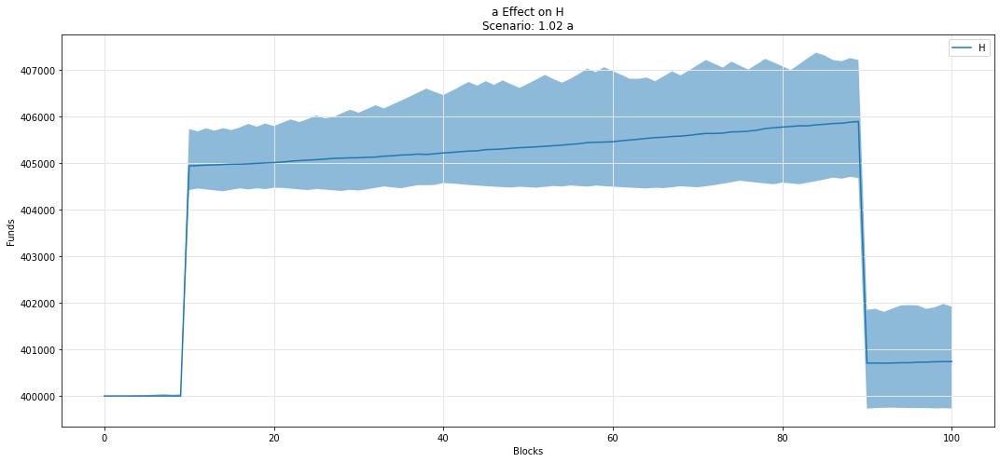

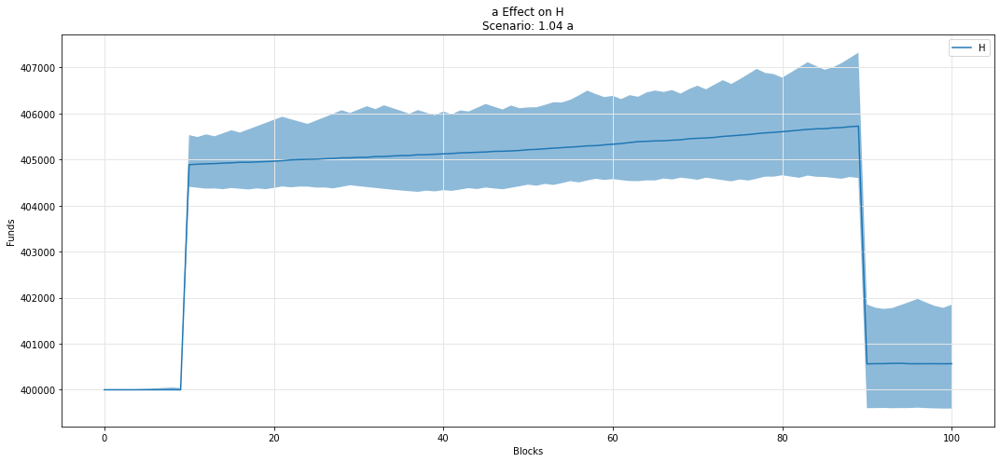

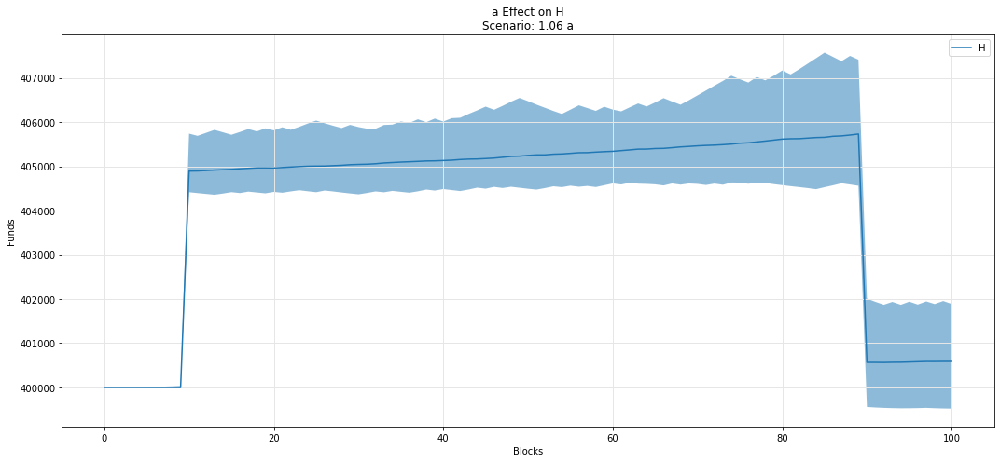

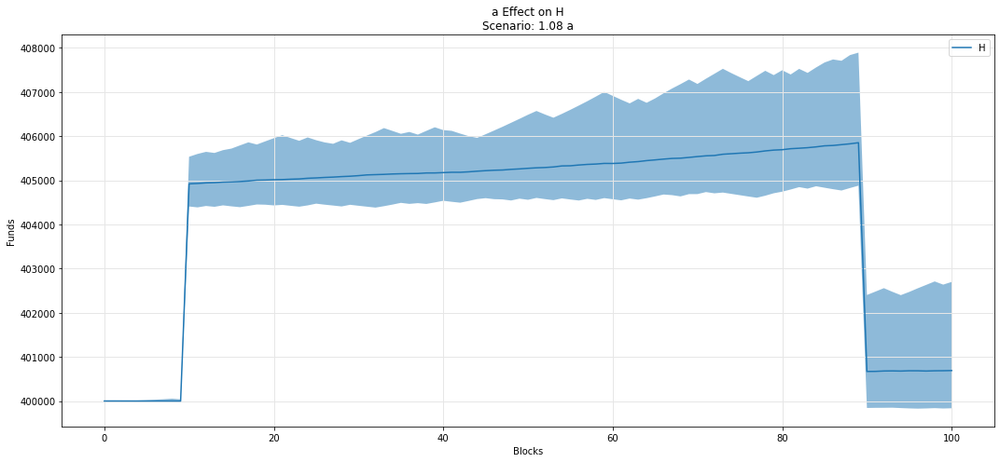

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

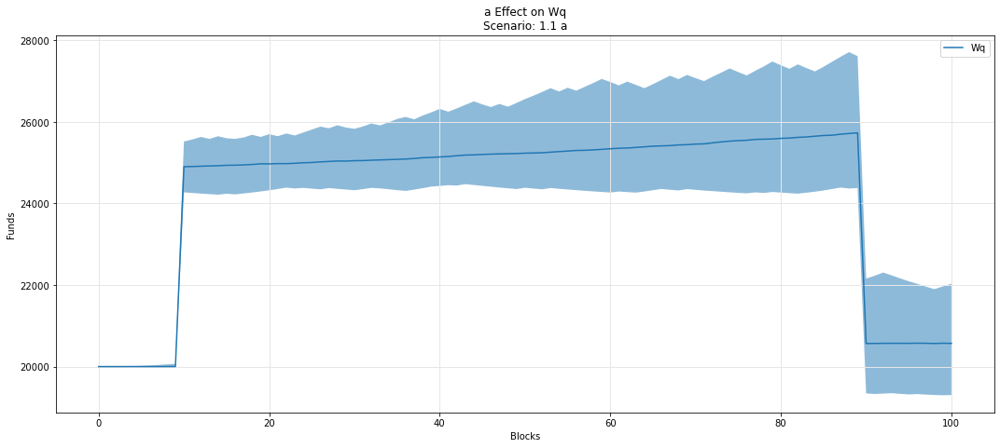

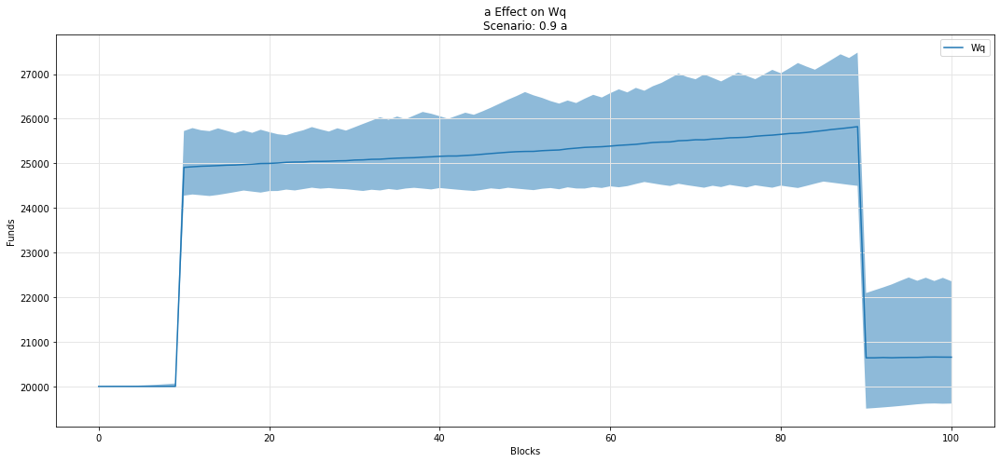

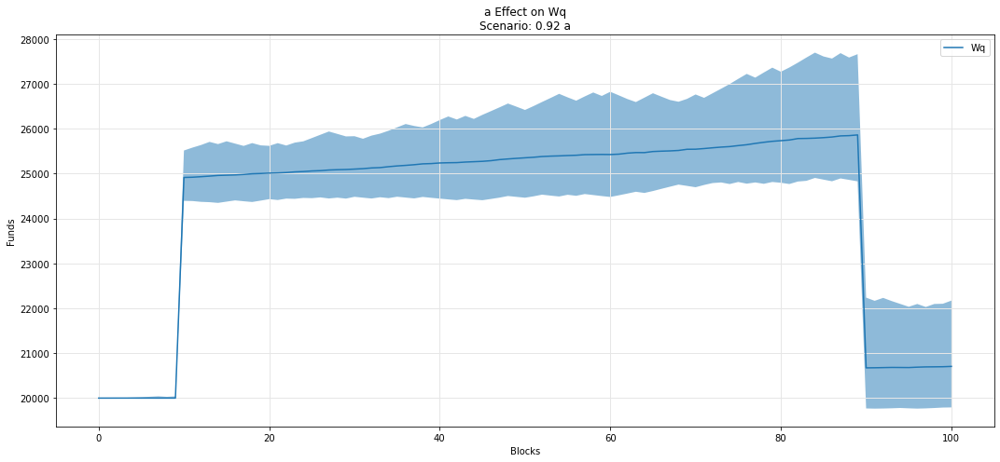

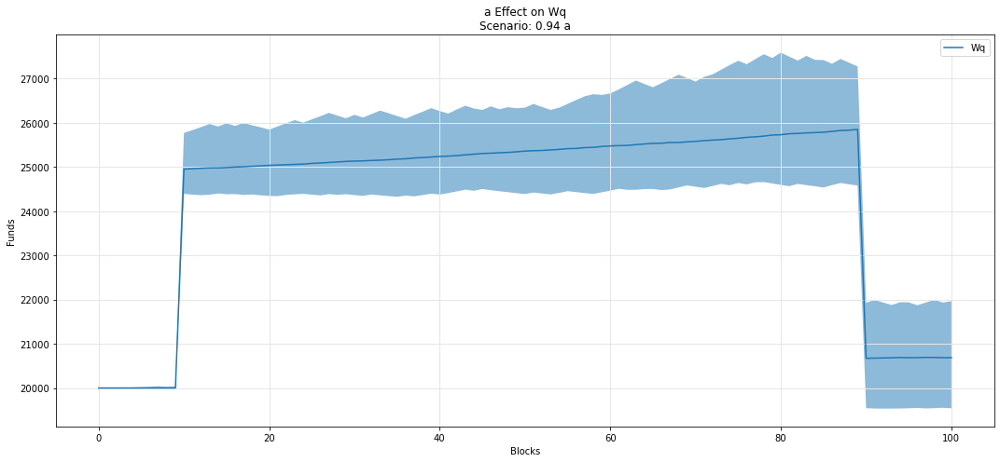

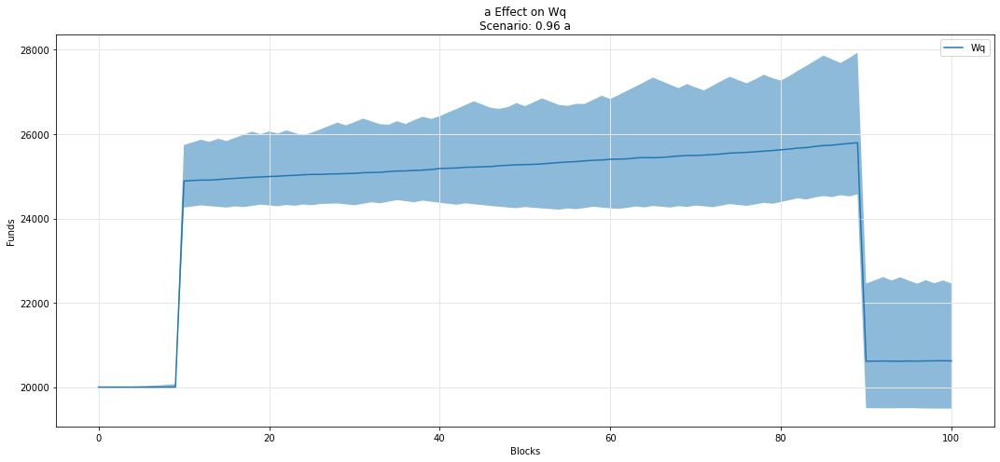

...

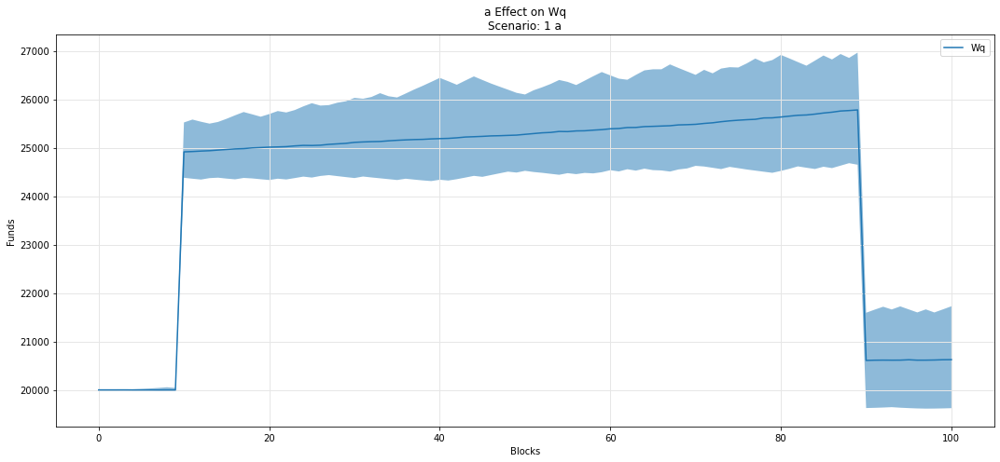

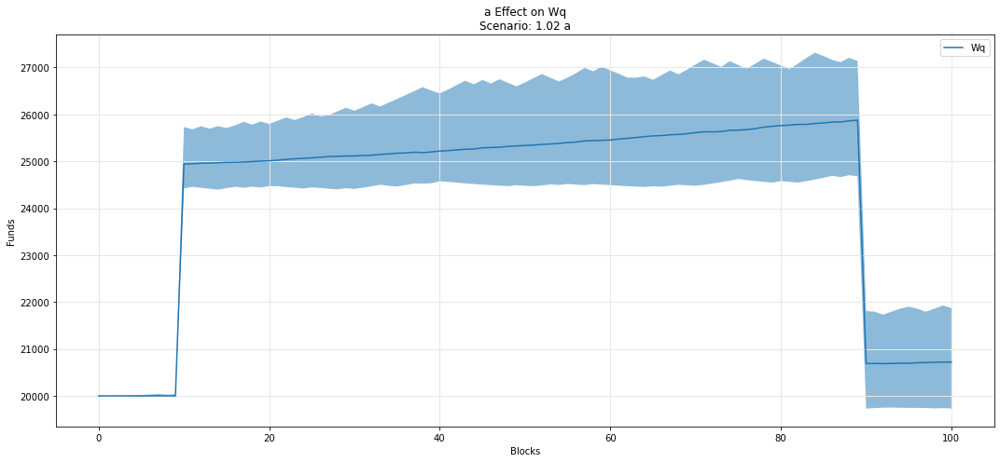

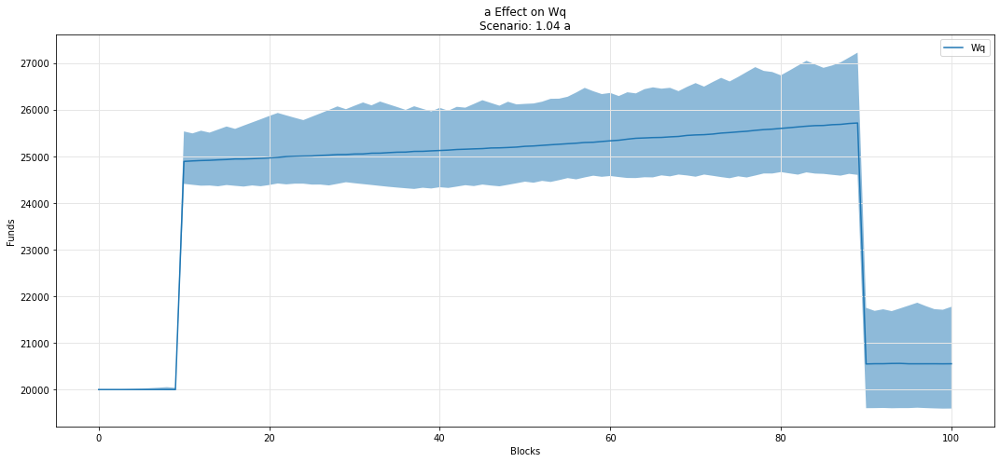

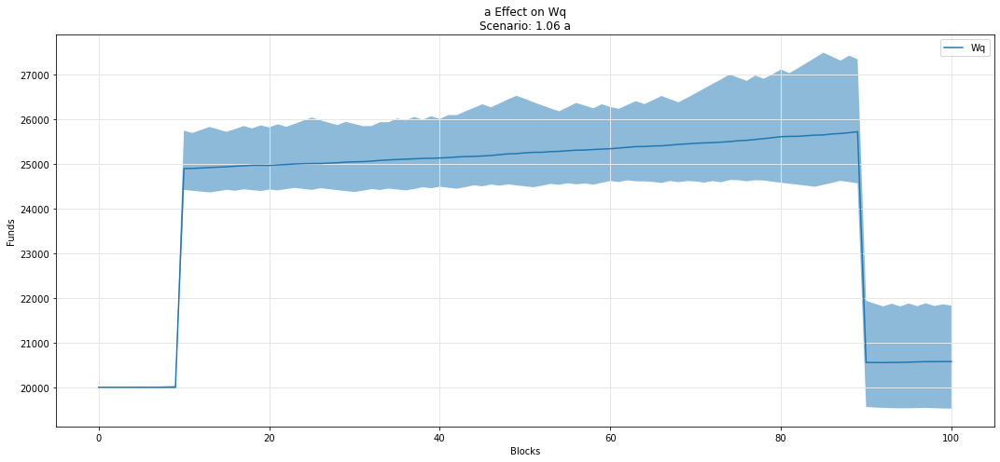

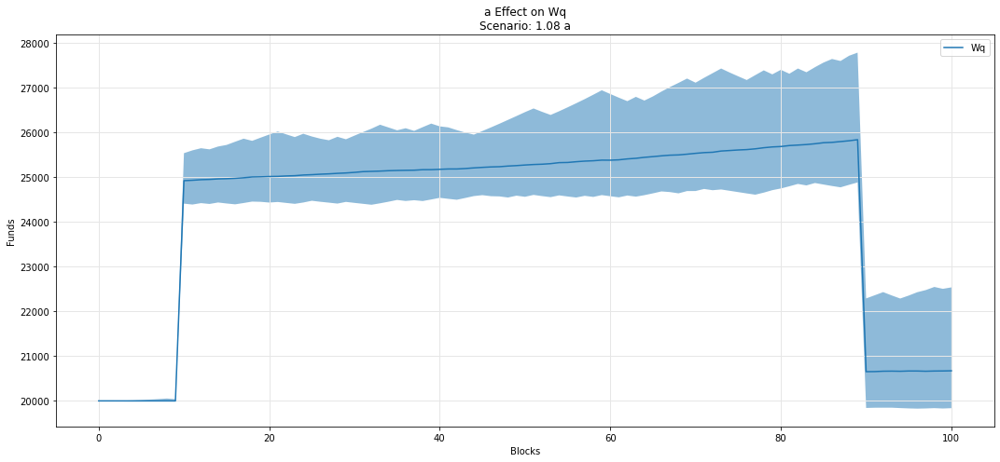

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

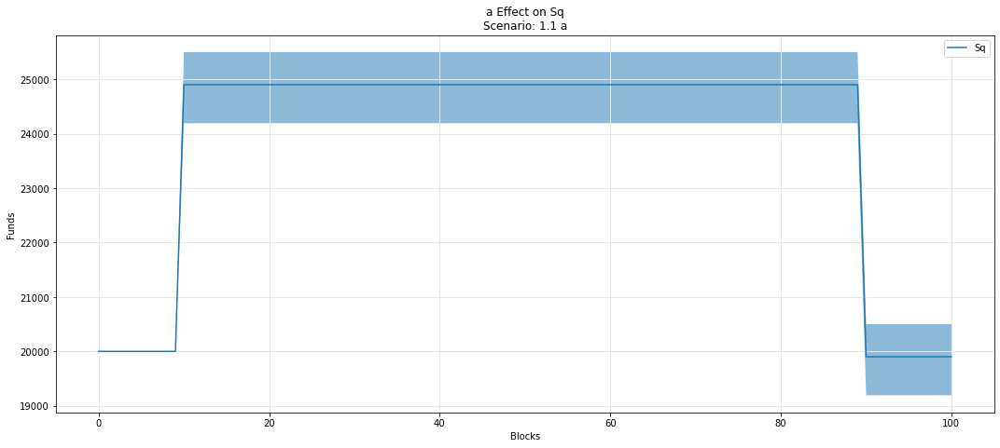

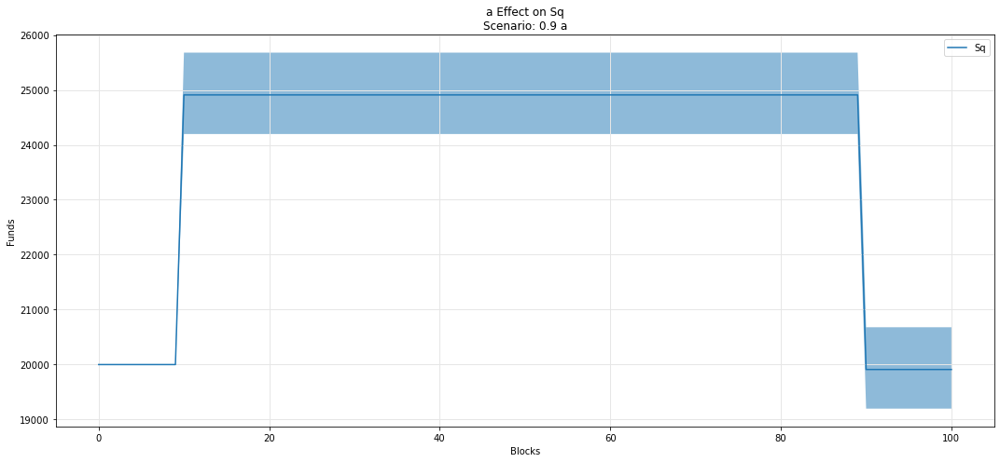

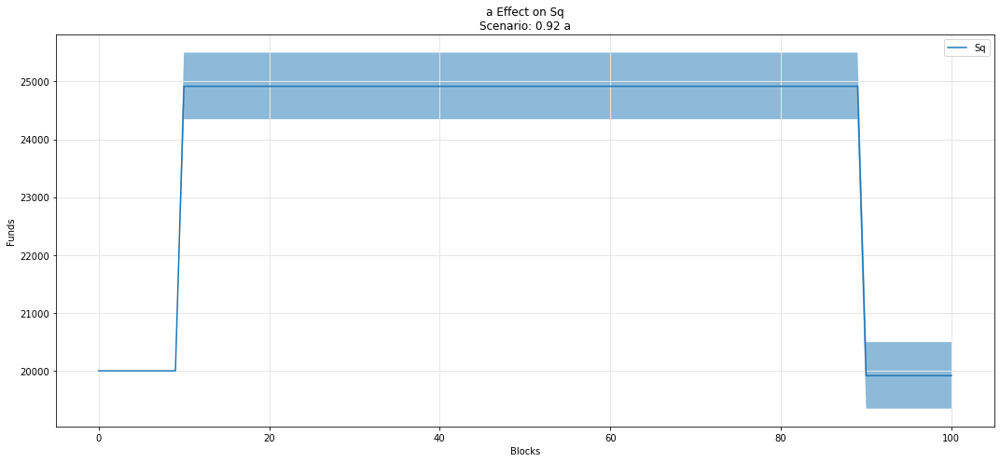

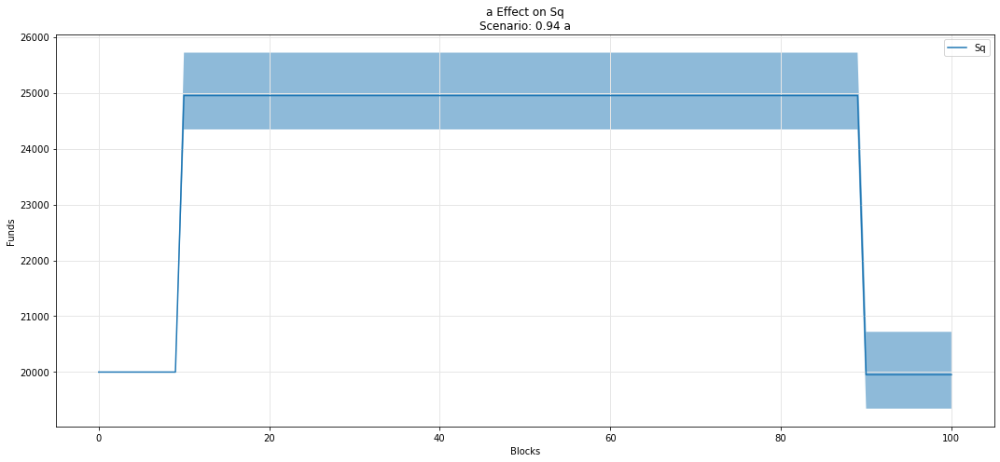

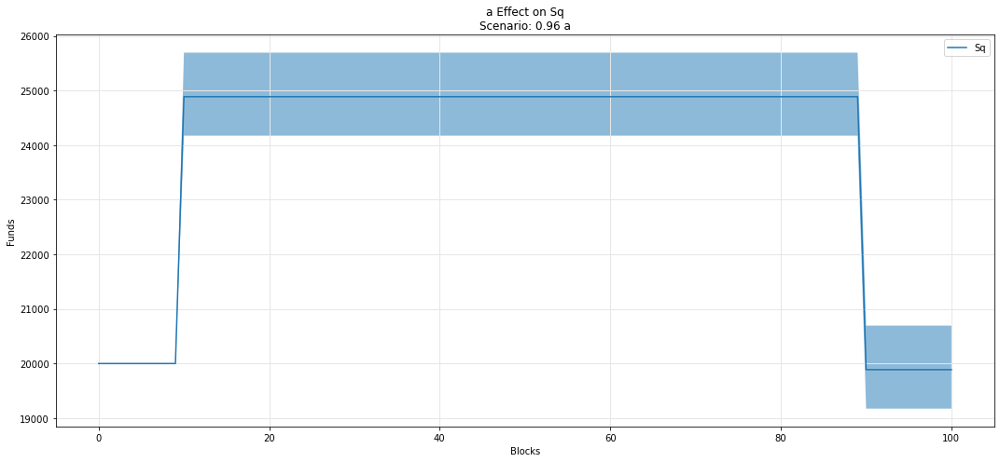

...

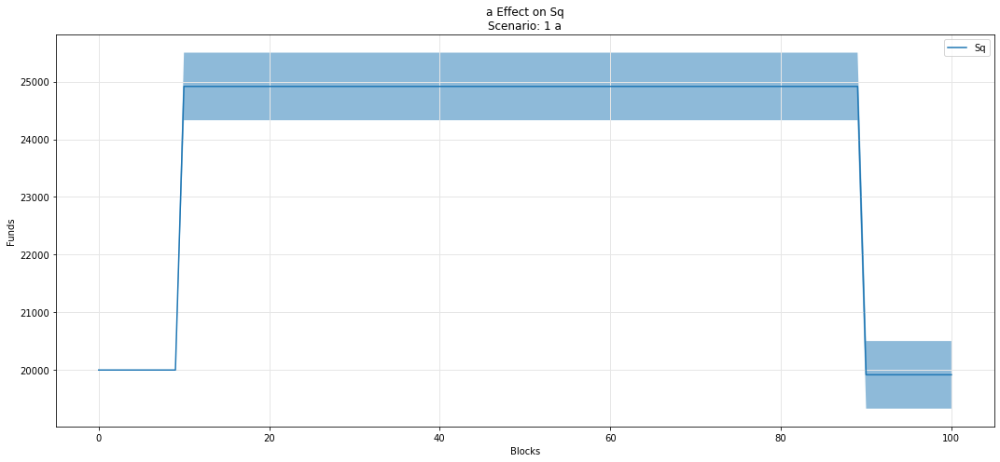

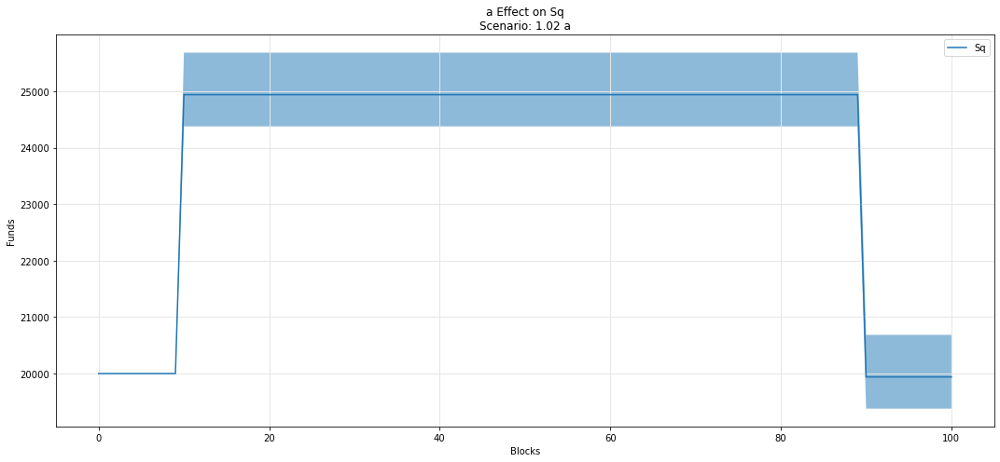

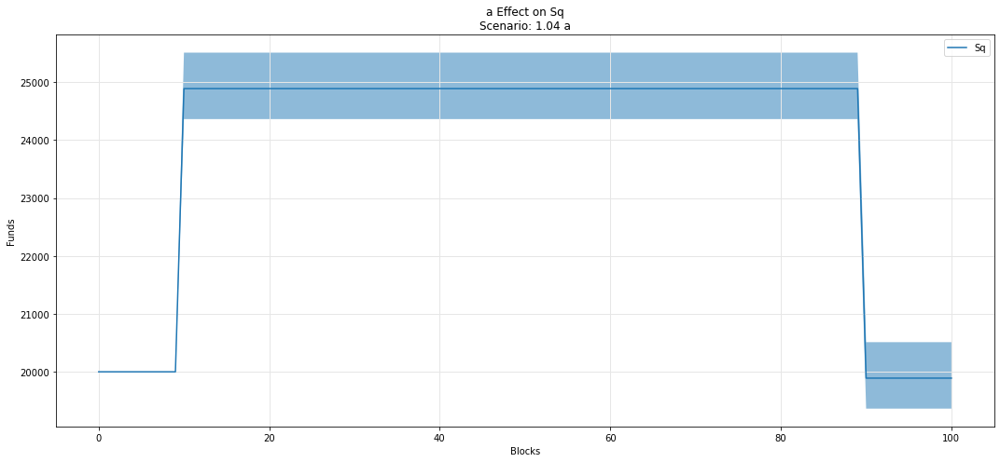

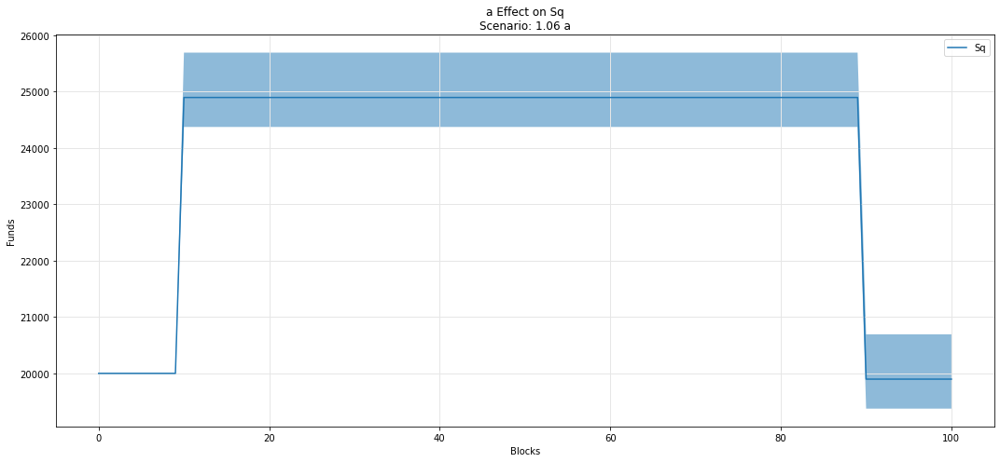

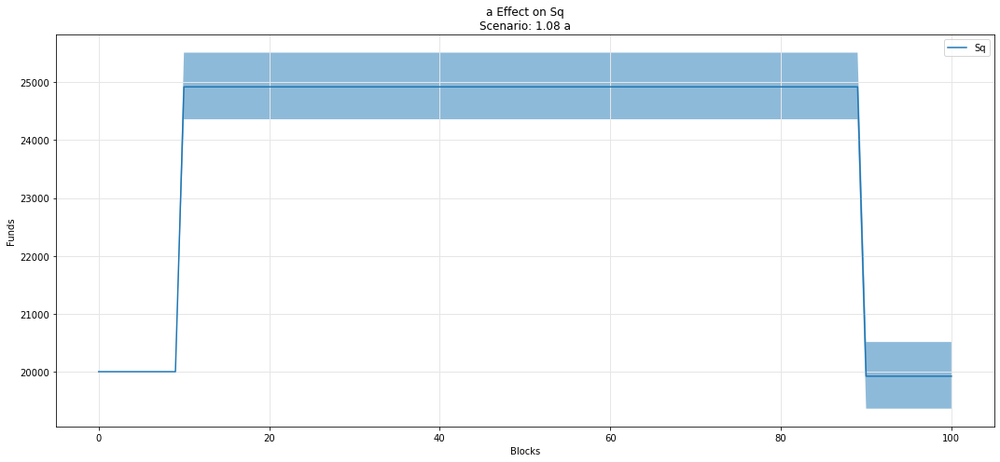

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

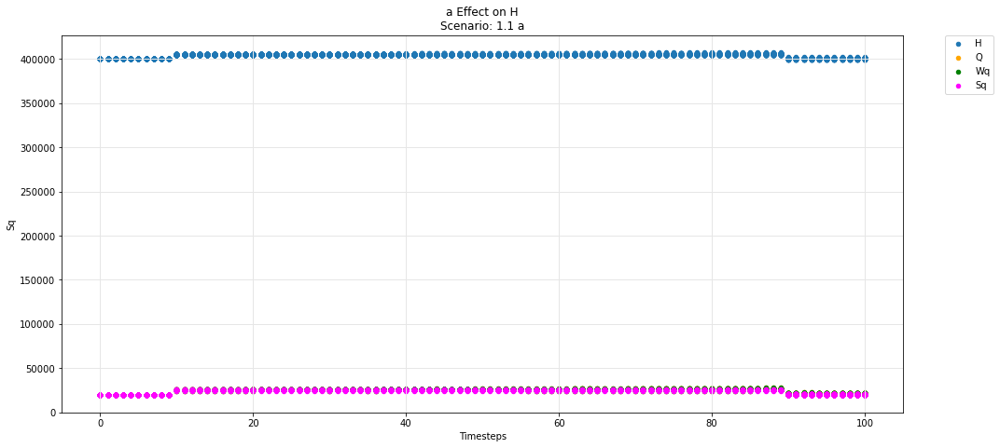

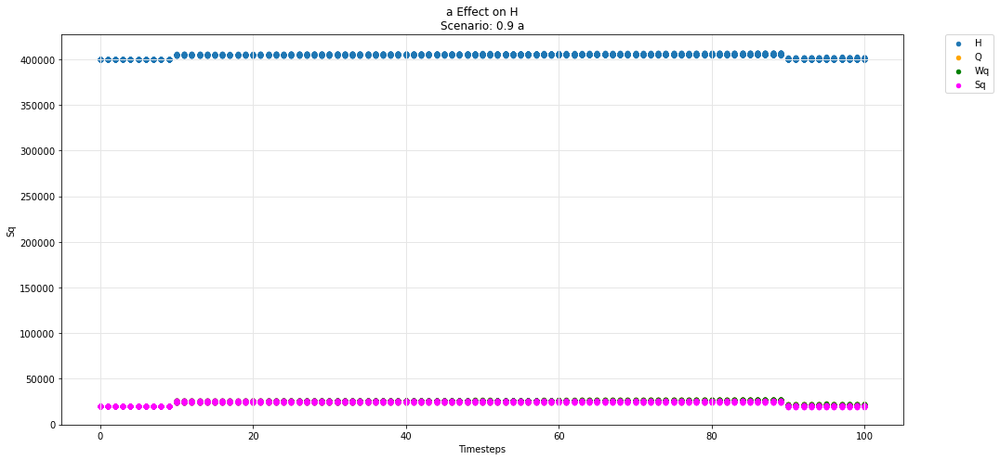

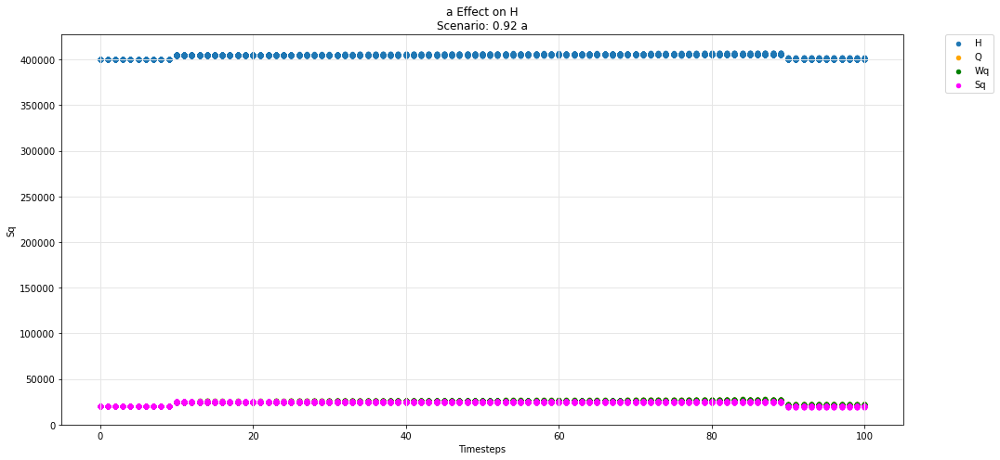

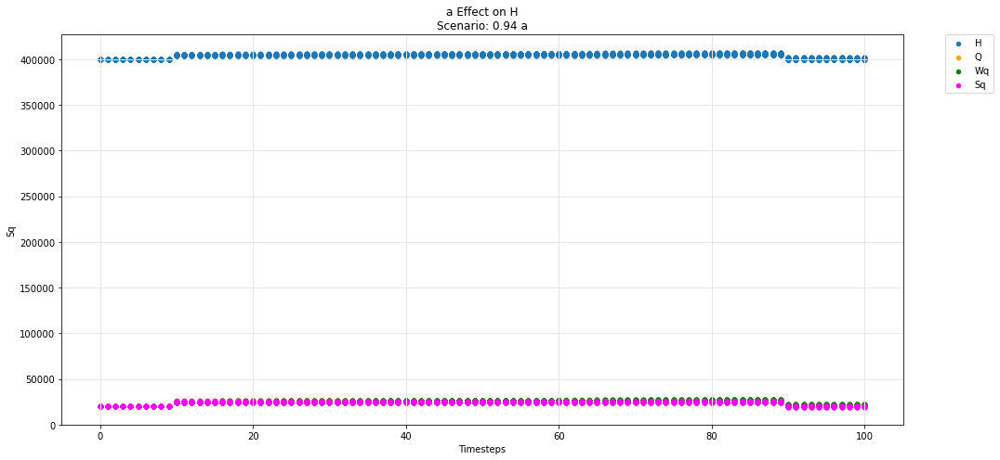

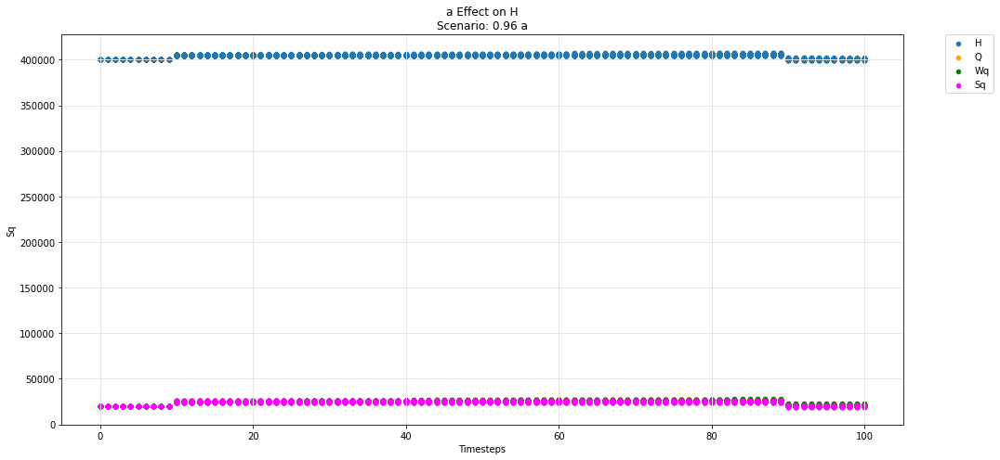

...

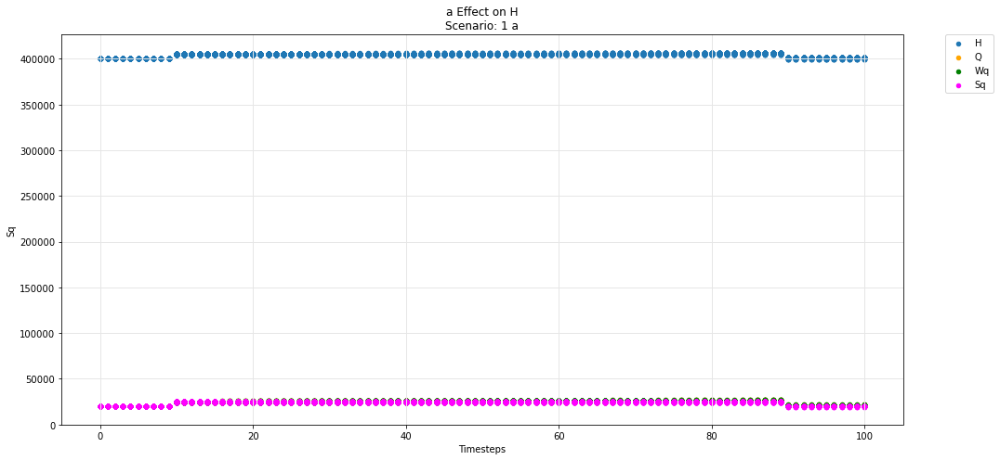

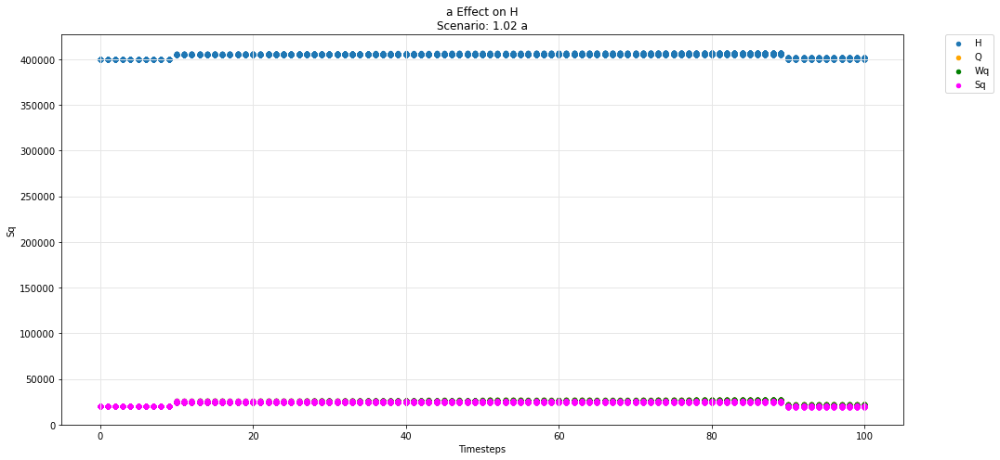

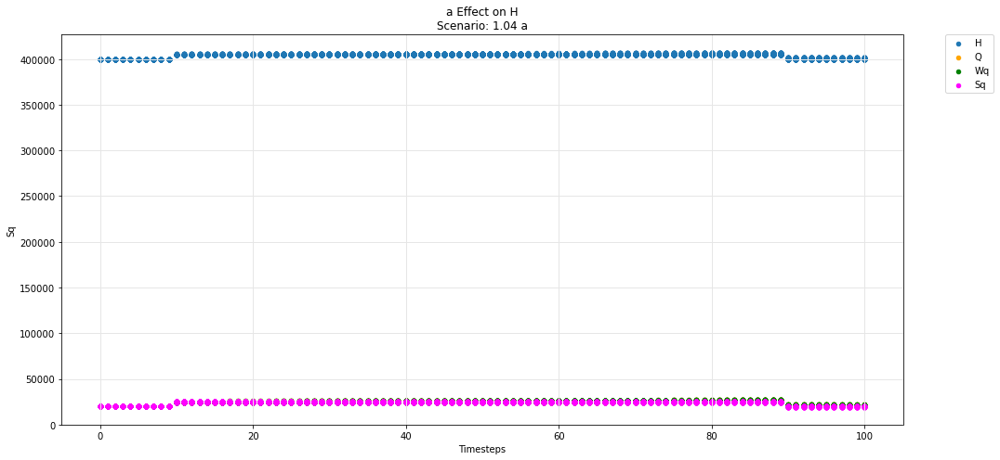

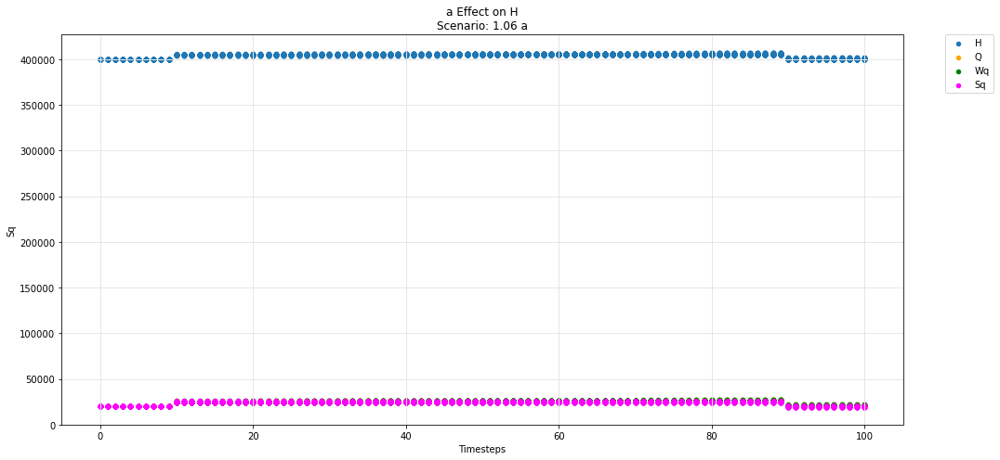

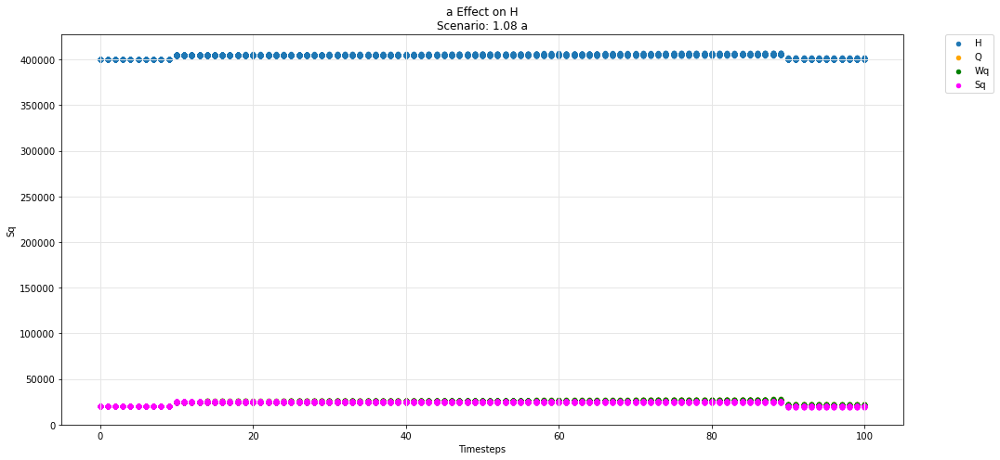

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

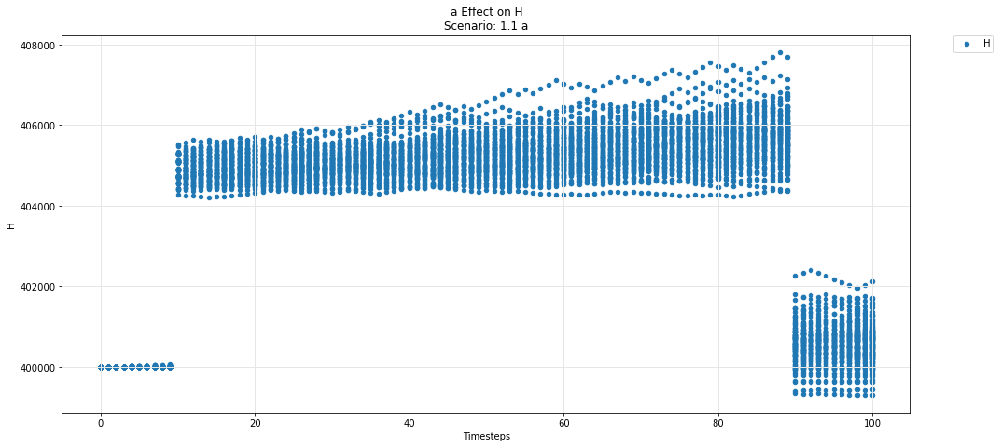

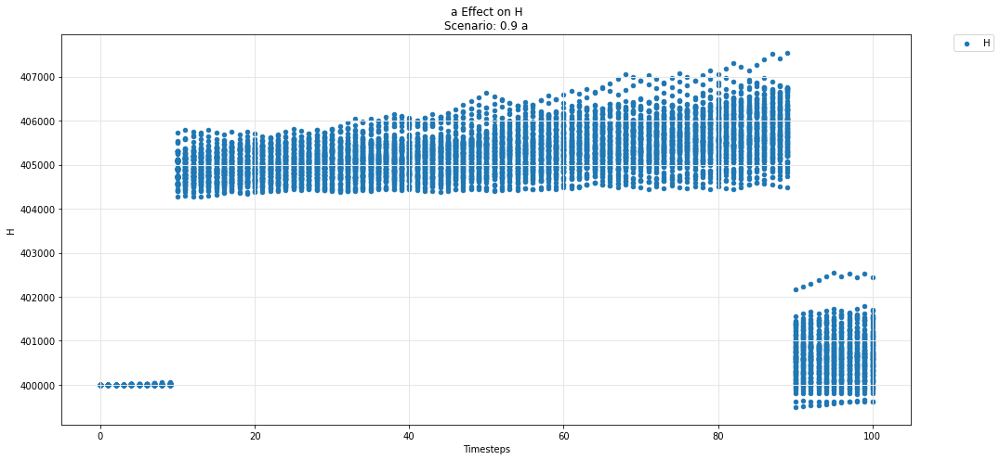

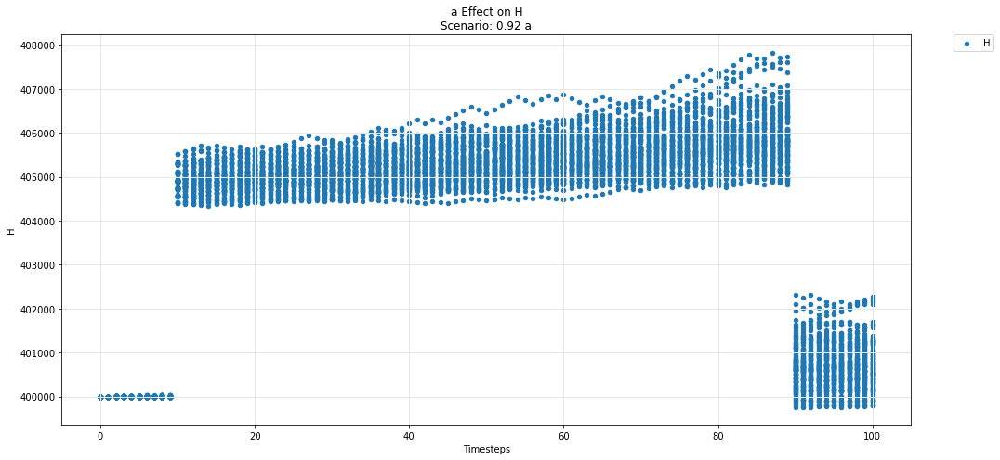

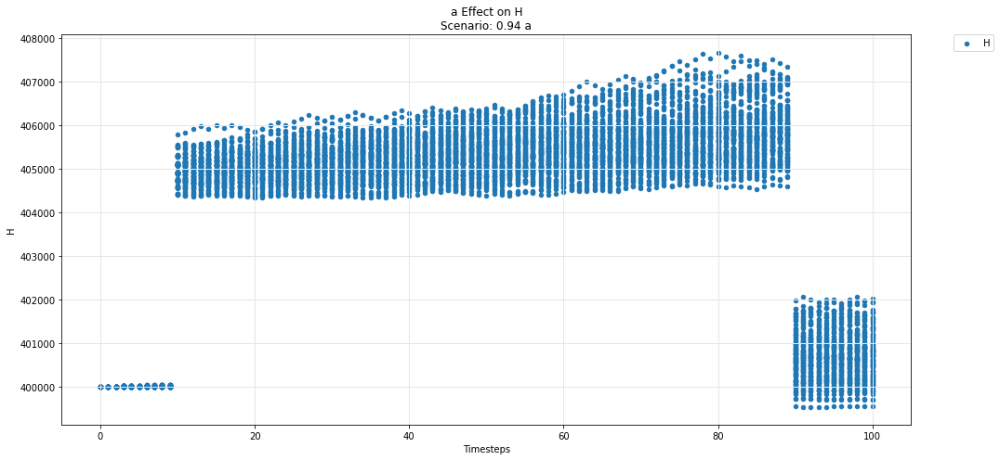

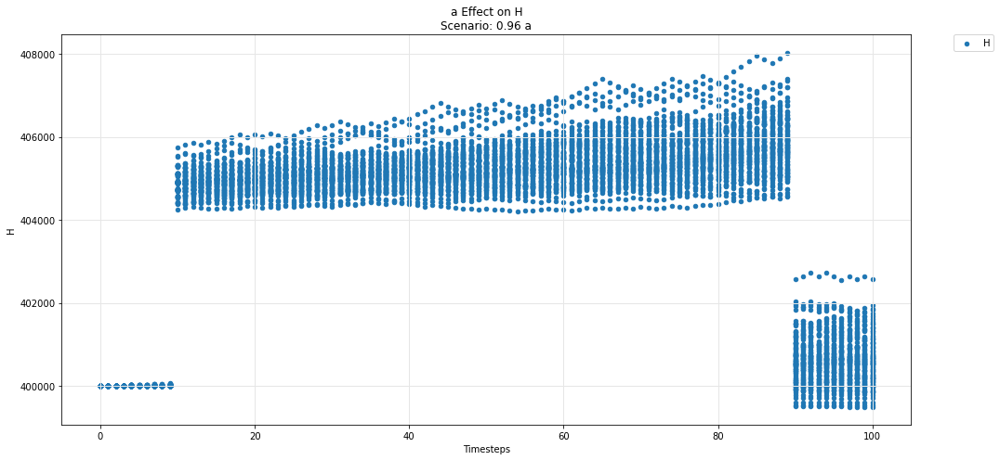

...

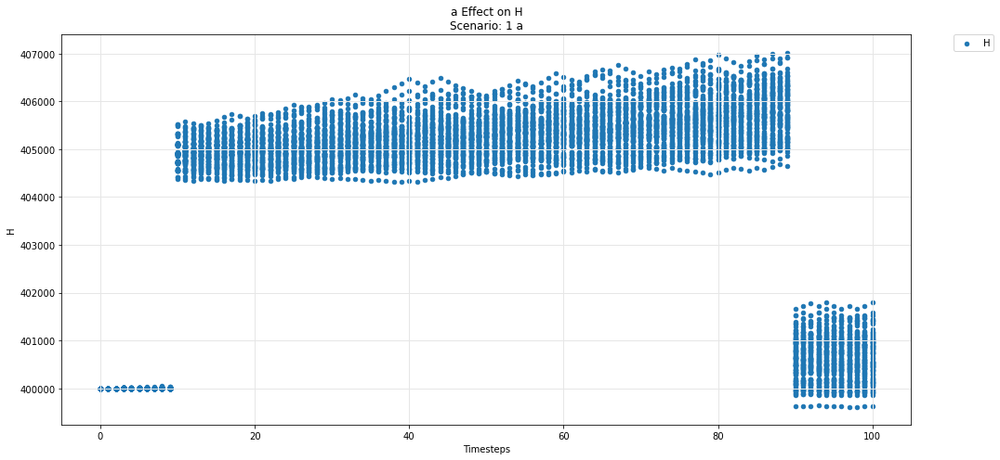

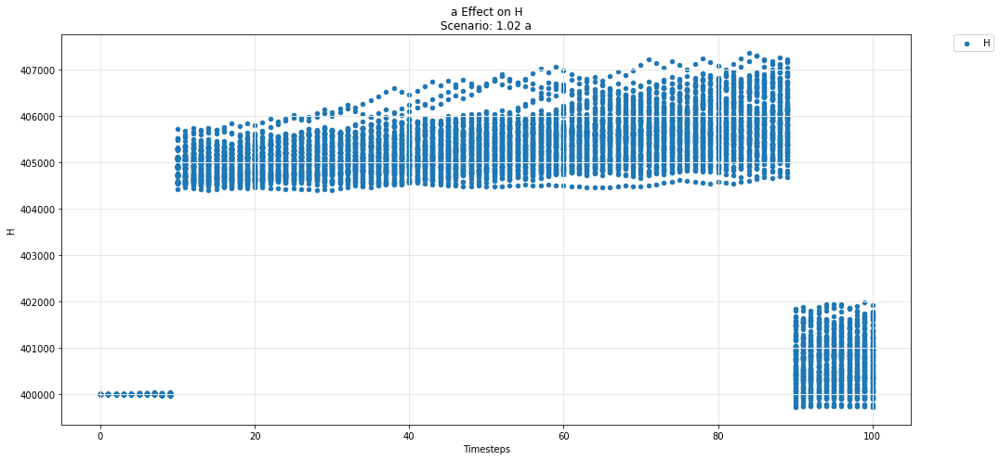

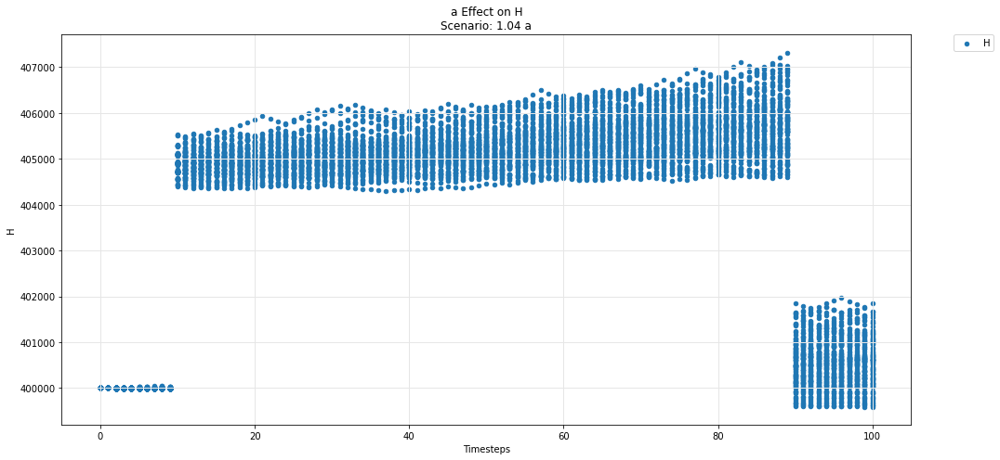

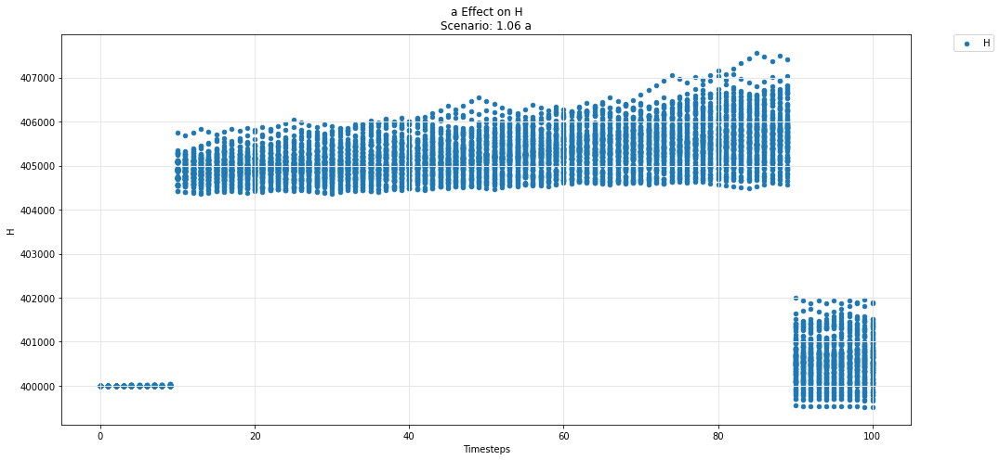

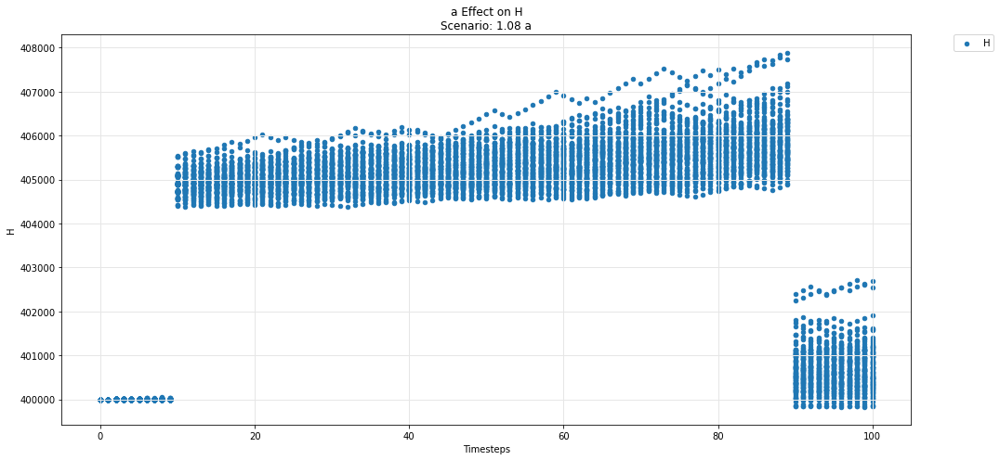

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

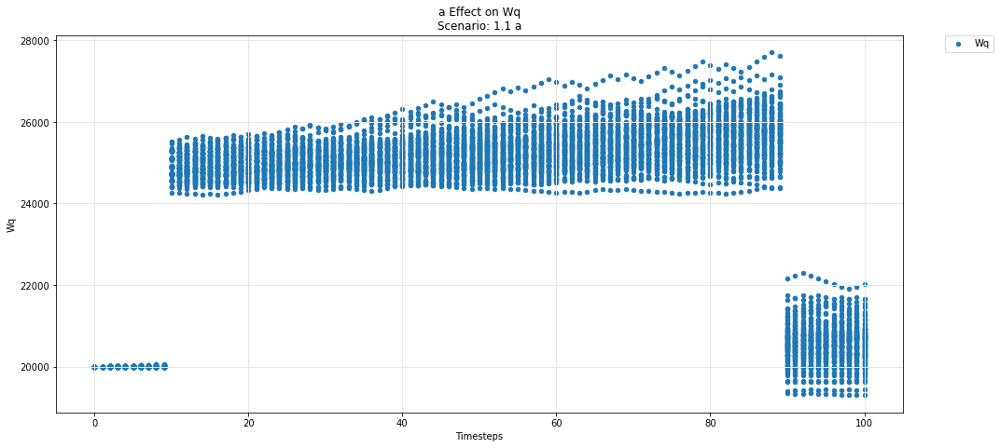

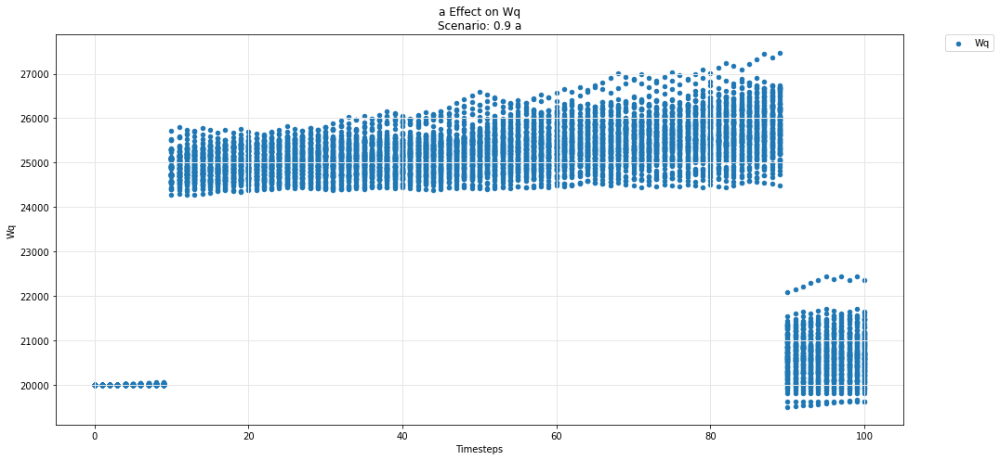

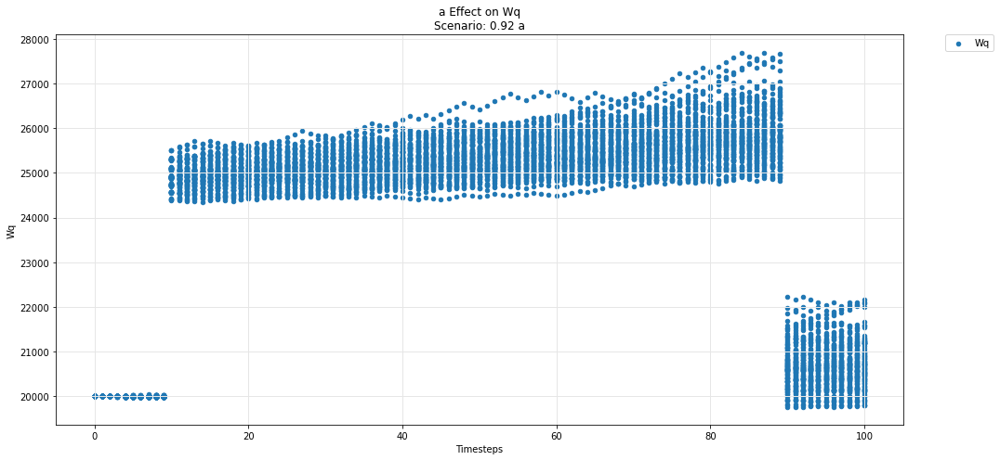

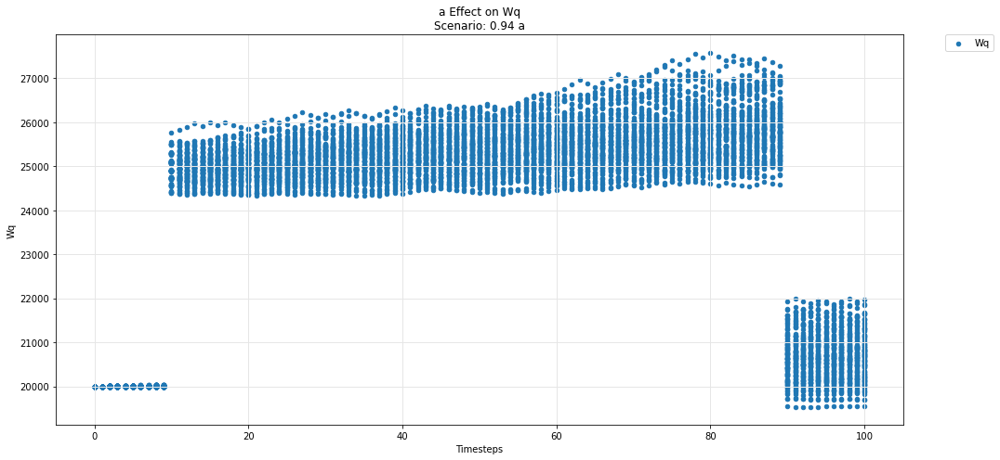

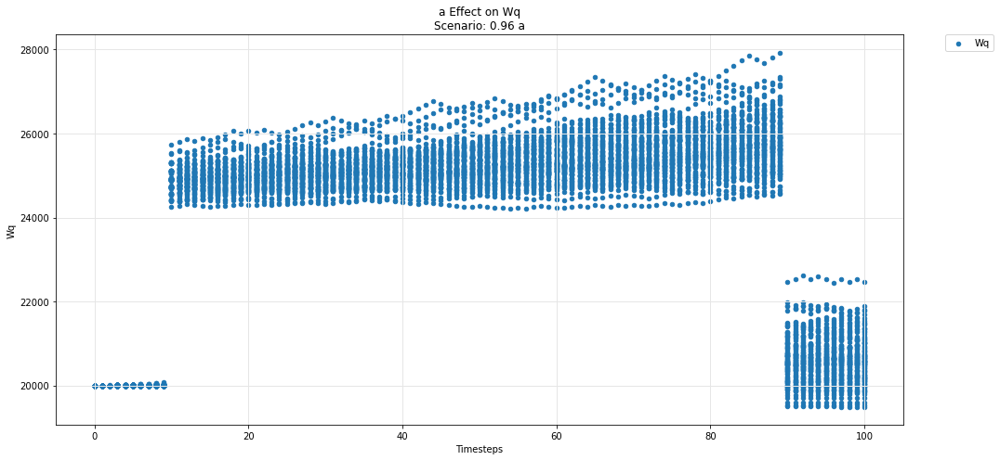

...

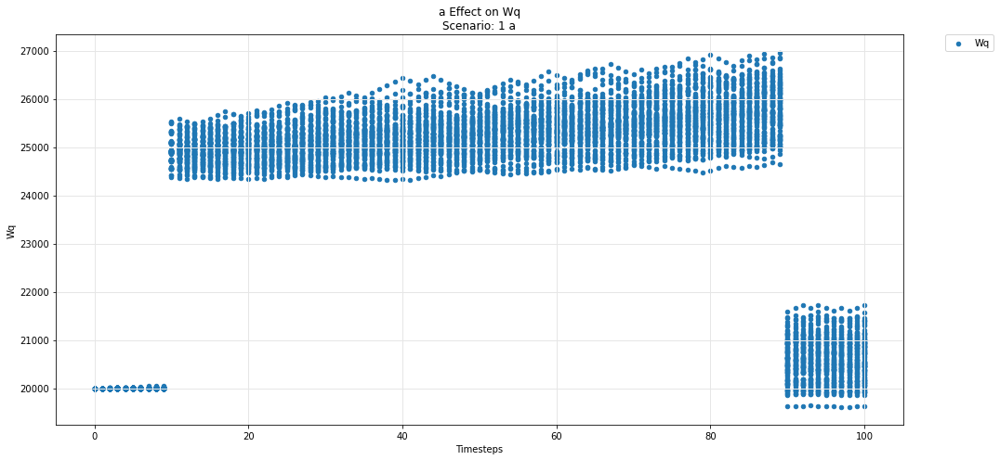

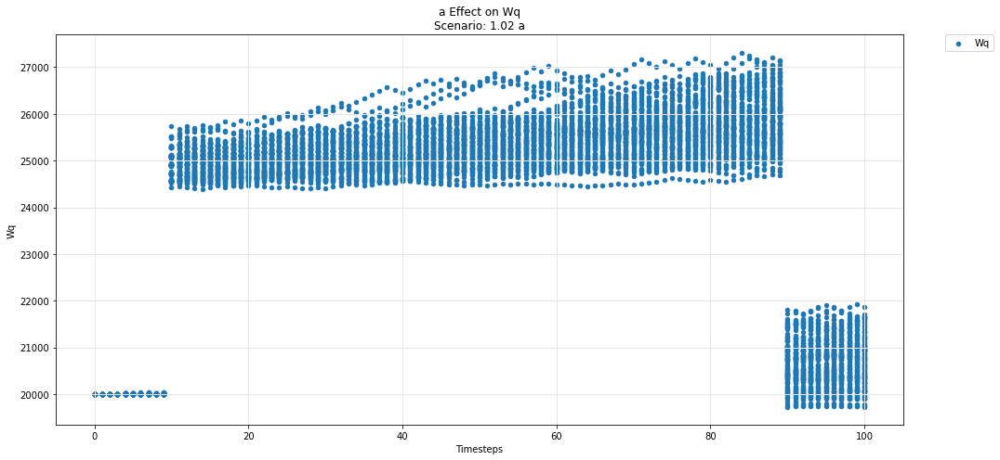

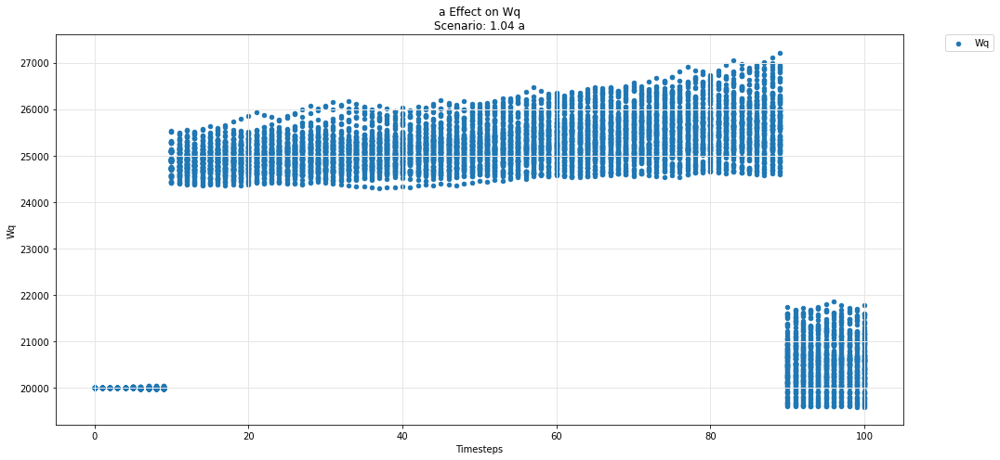

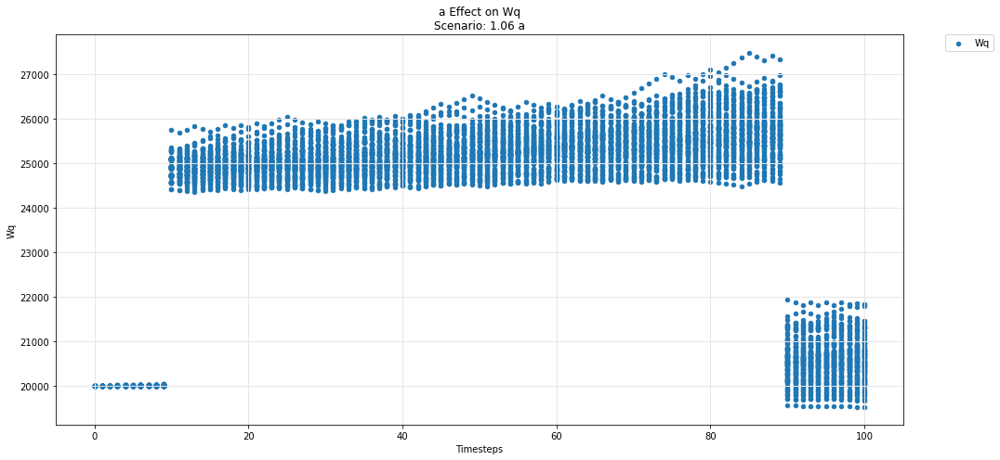

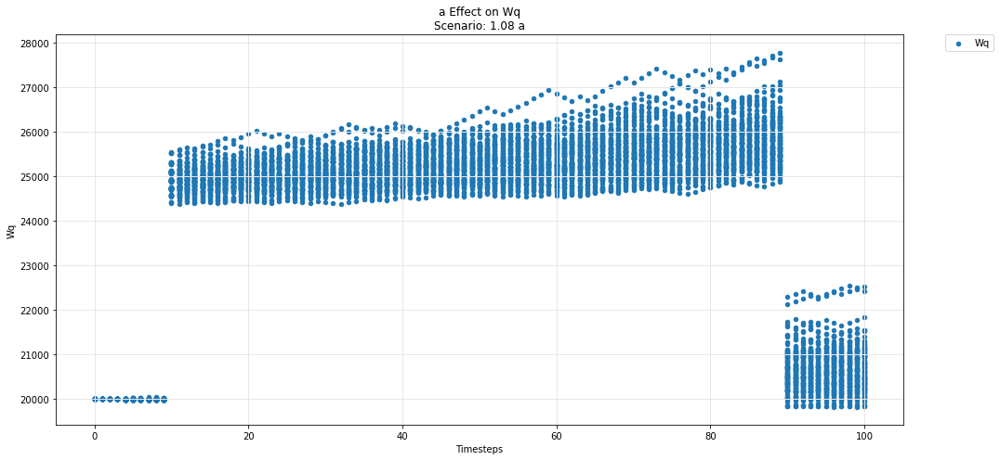

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

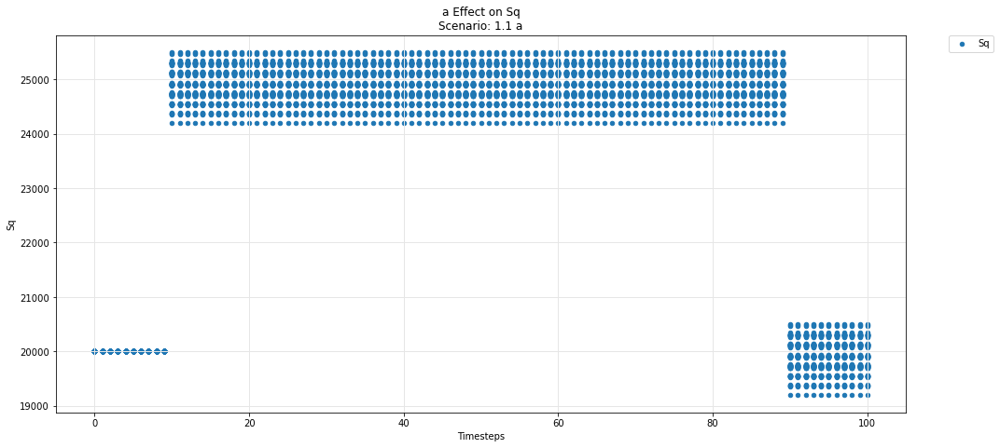

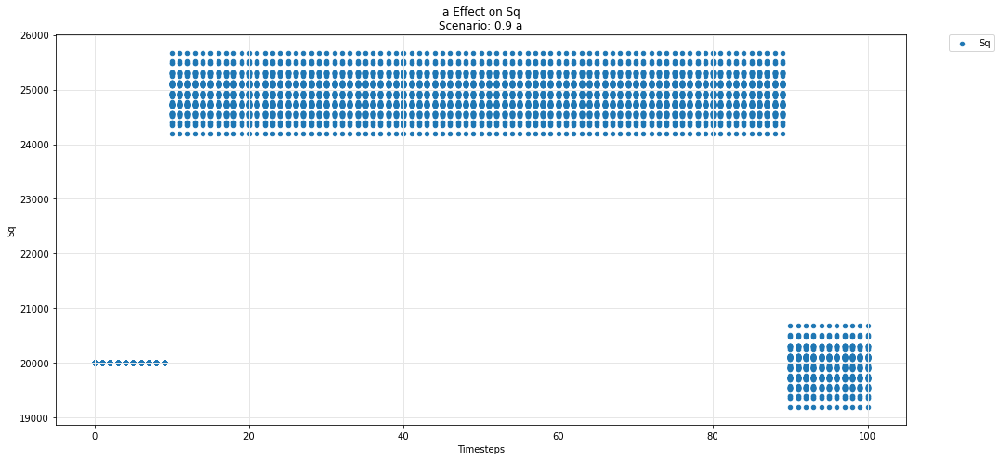

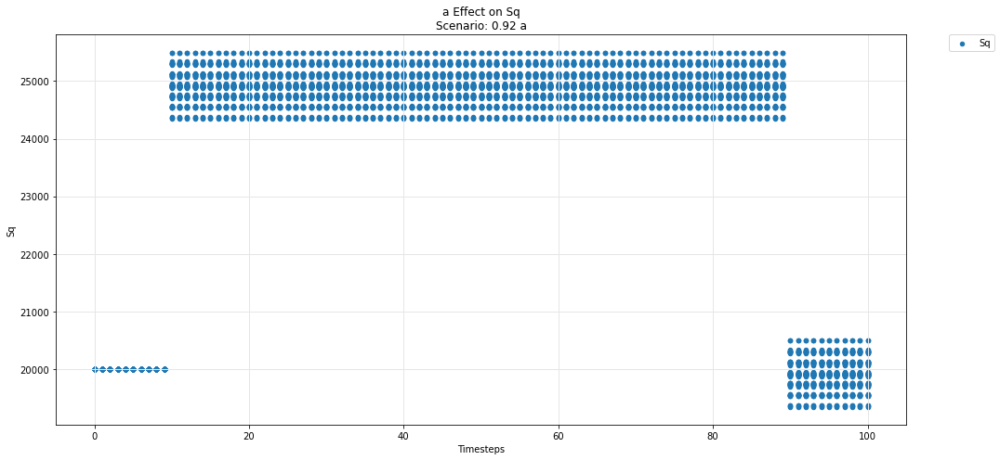

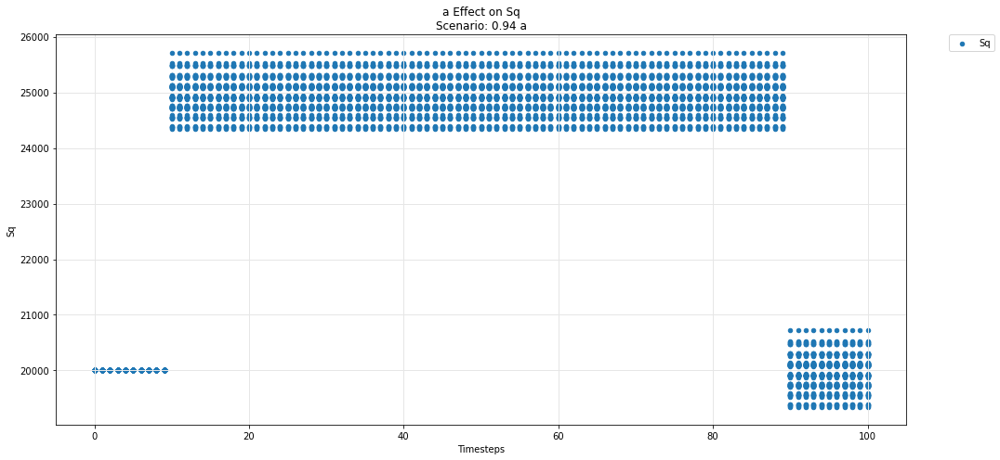

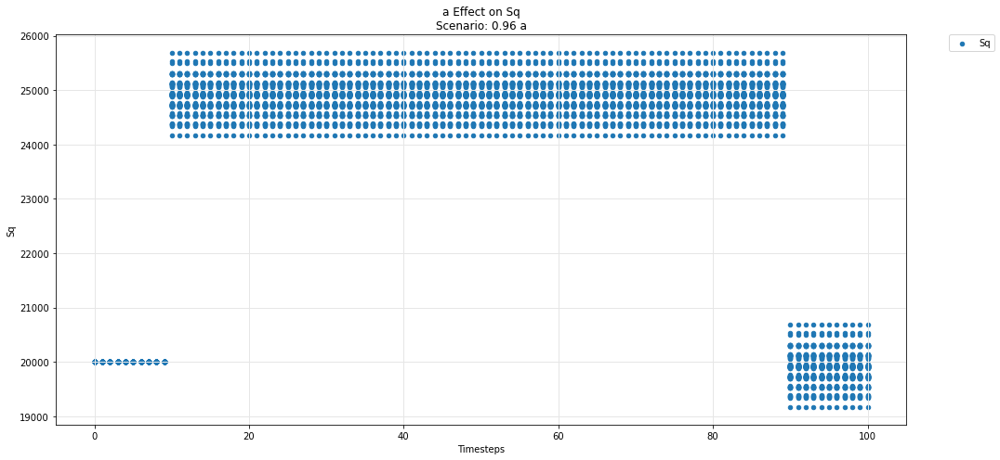

...

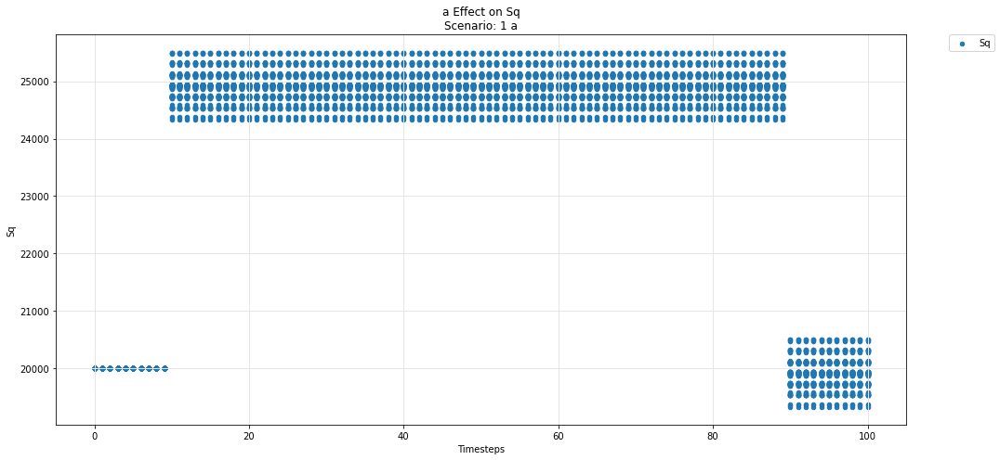

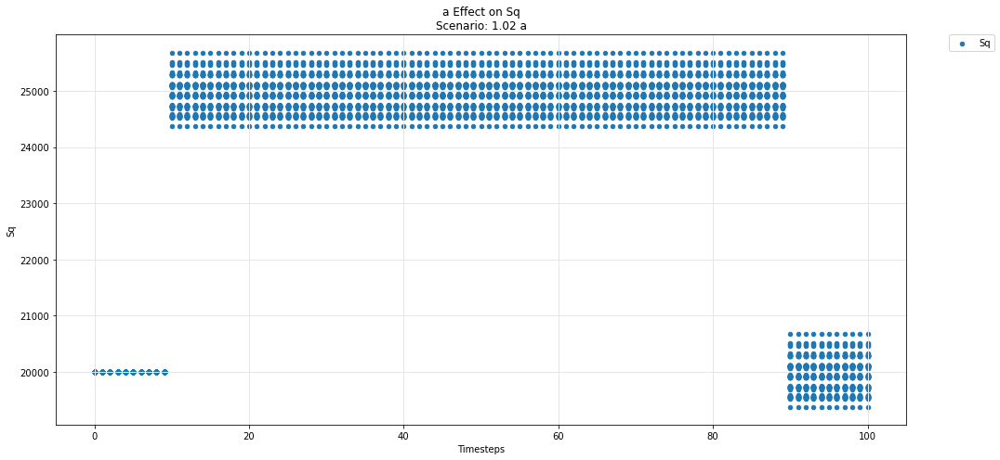

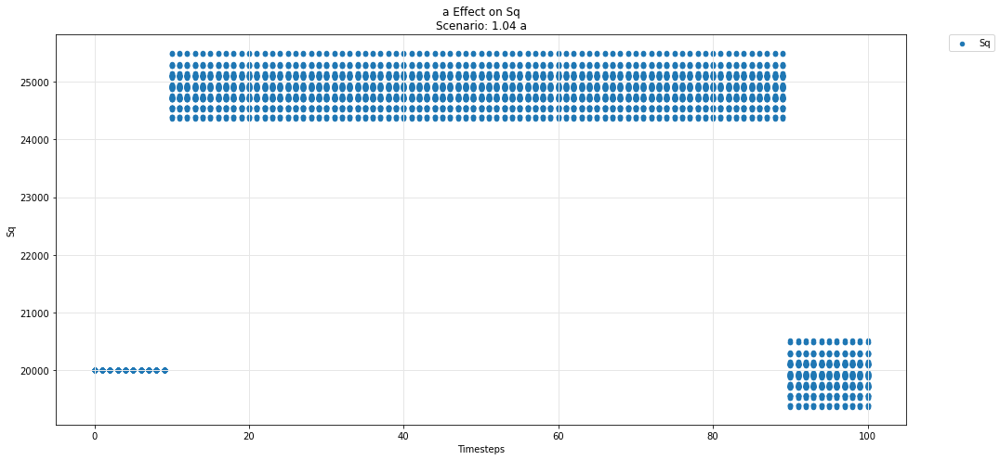

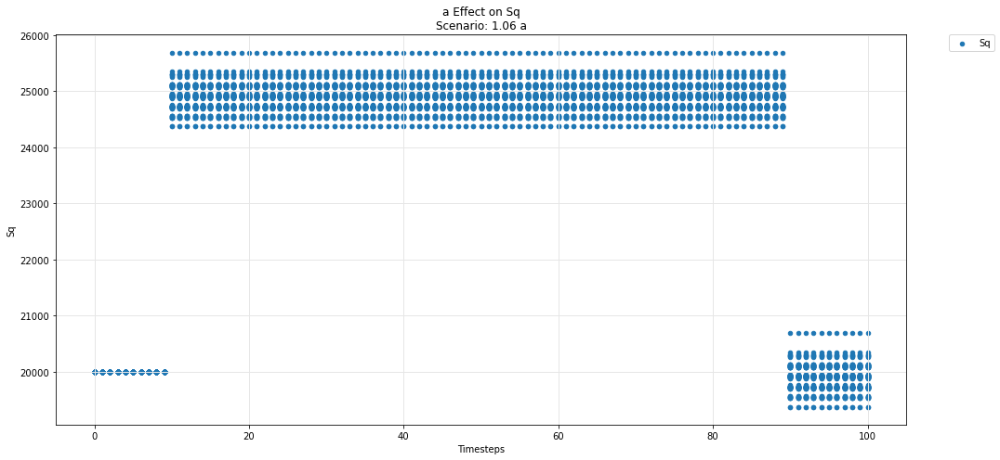

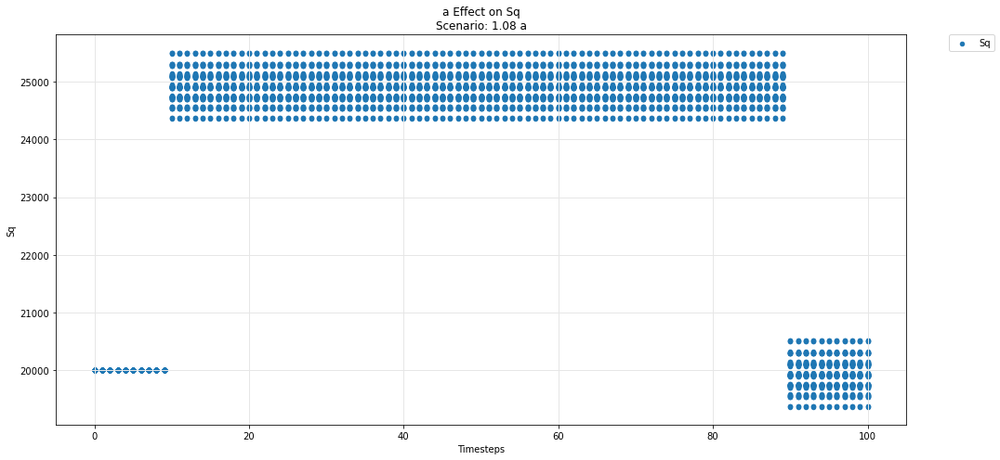

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

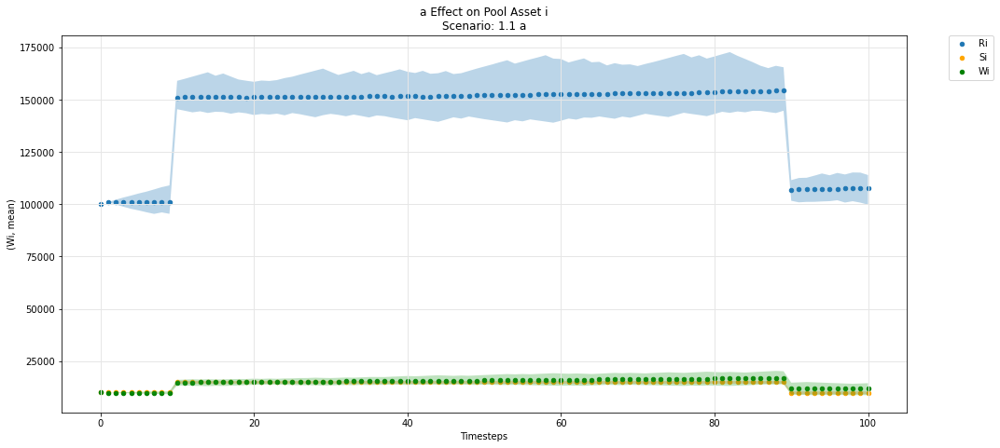

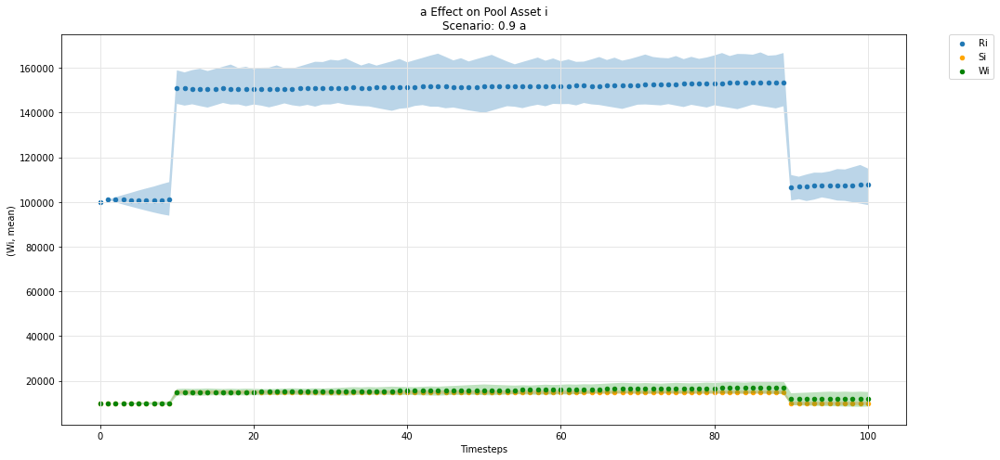

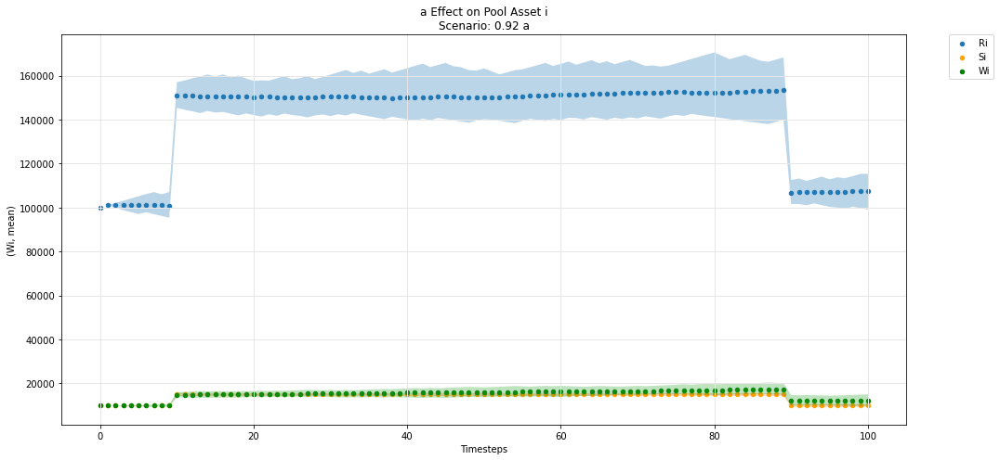

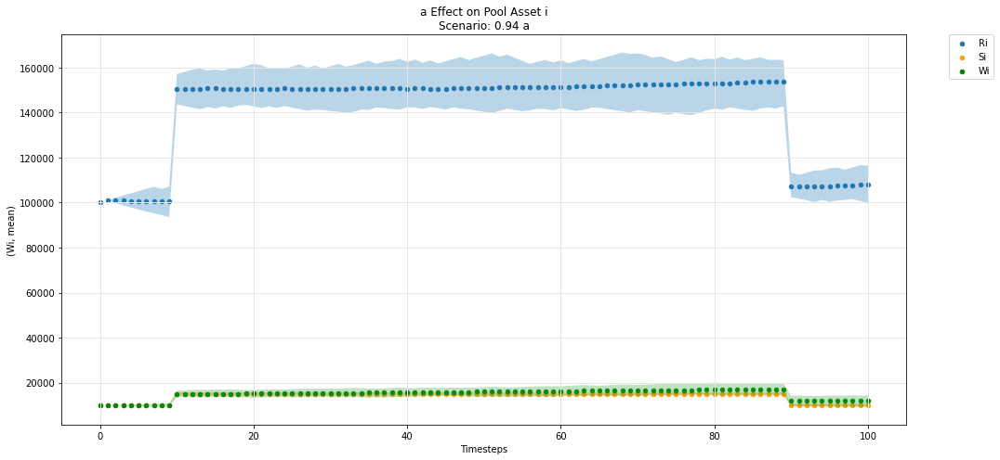

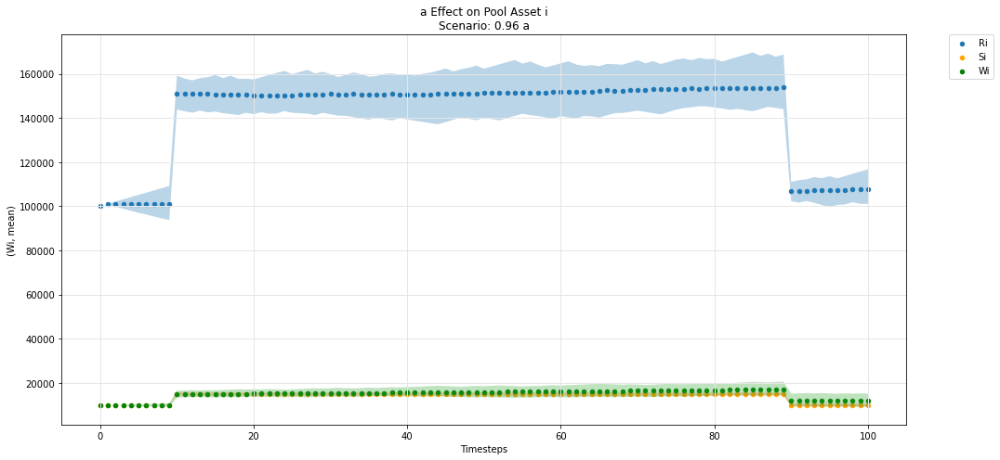

...

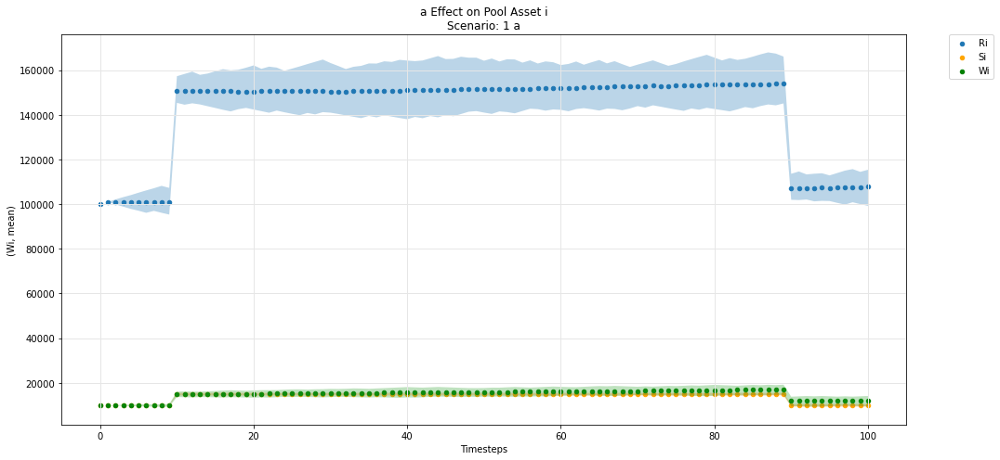

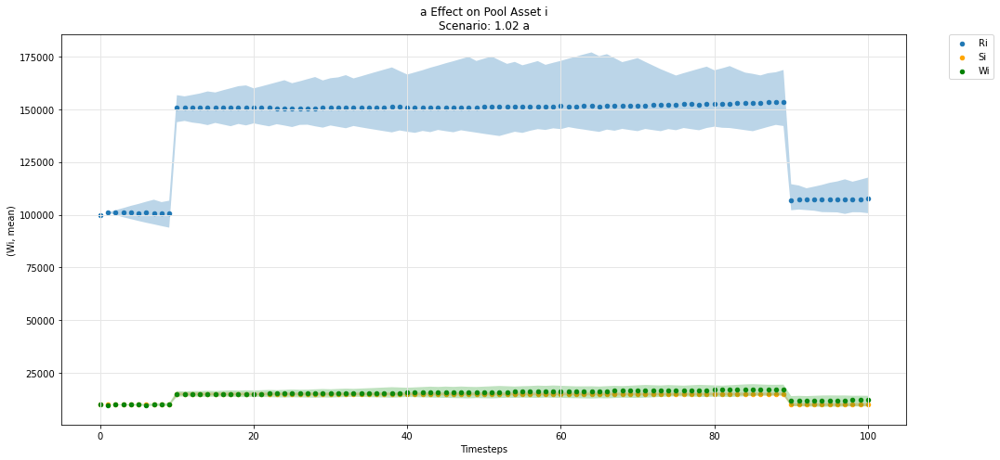

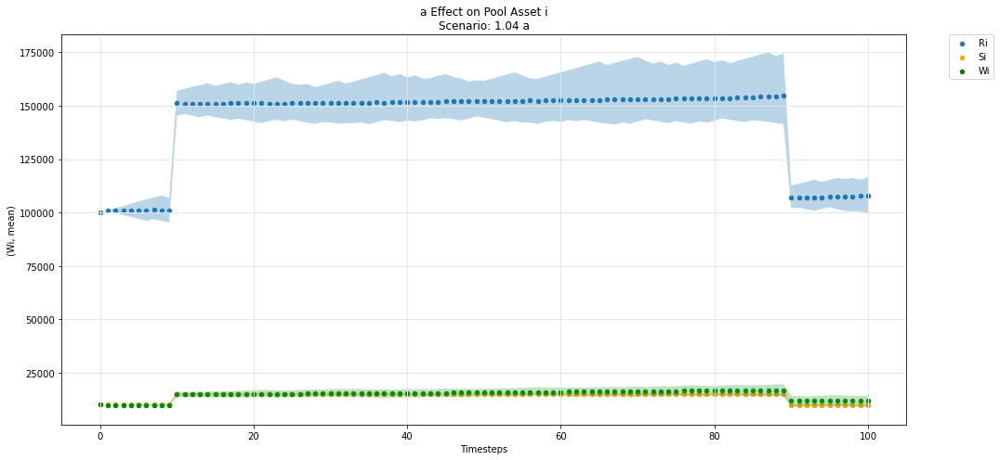

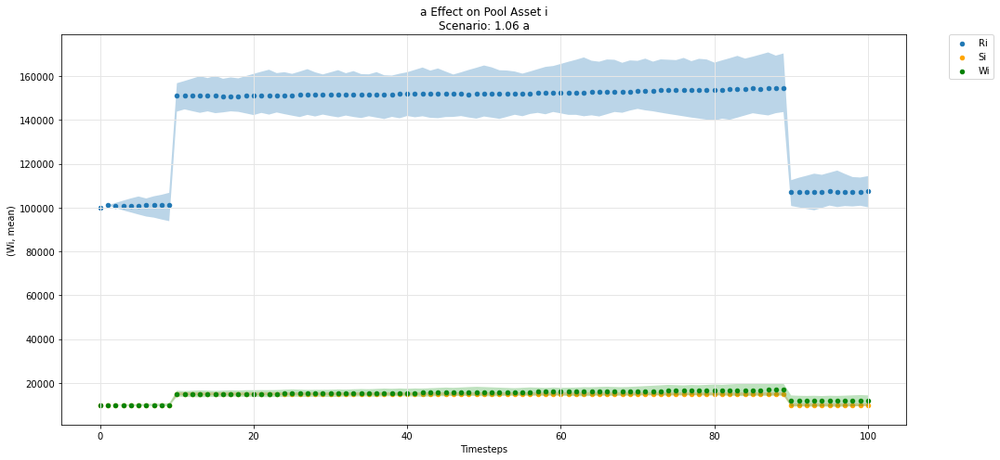

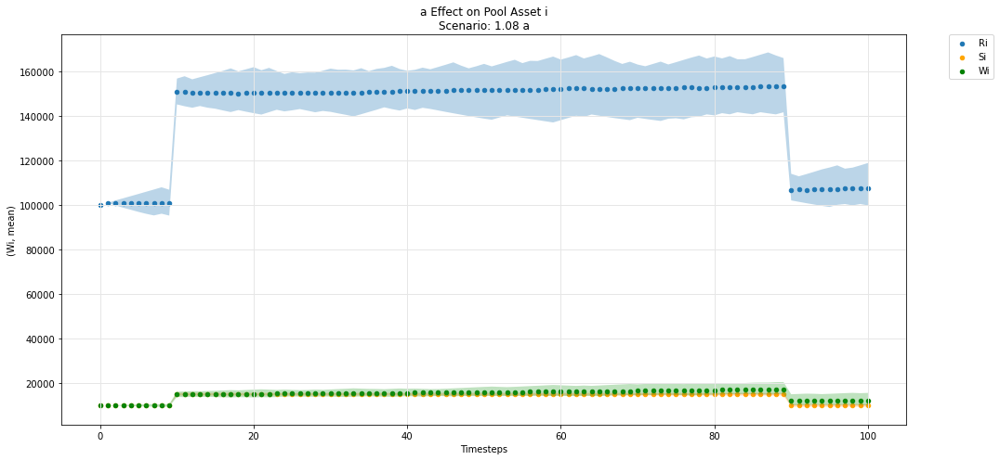

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

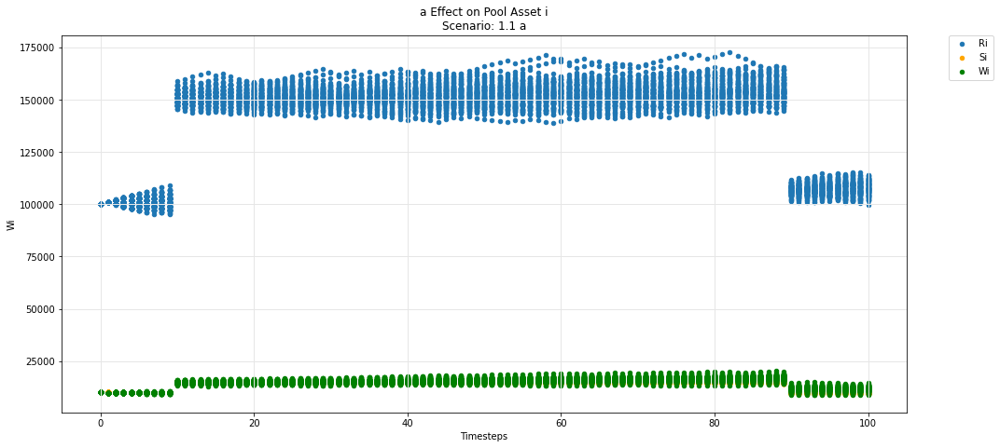

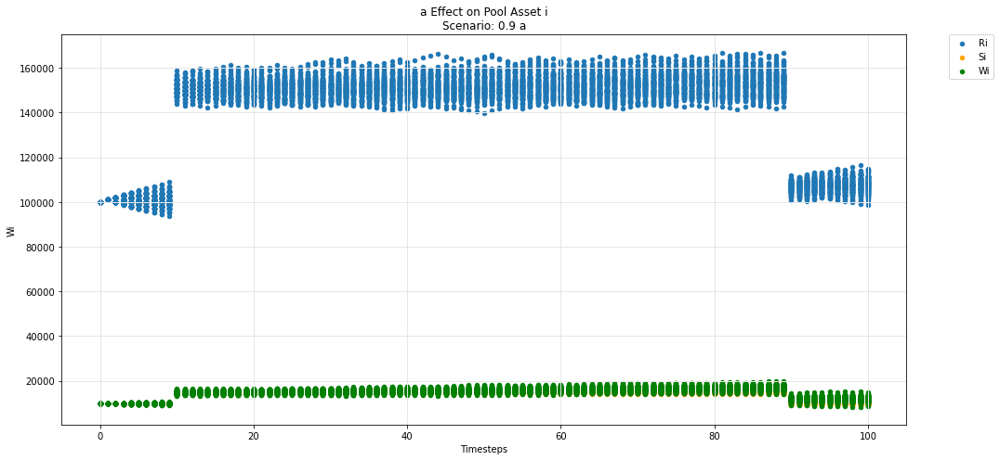

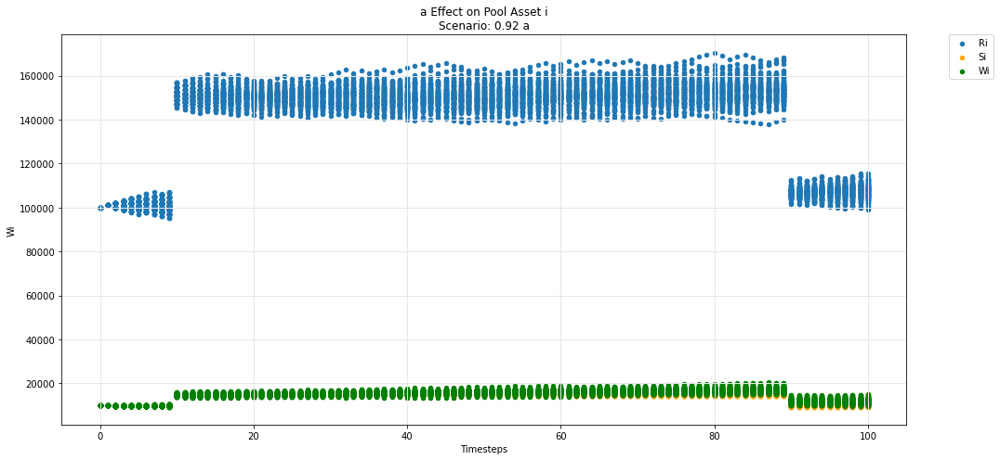

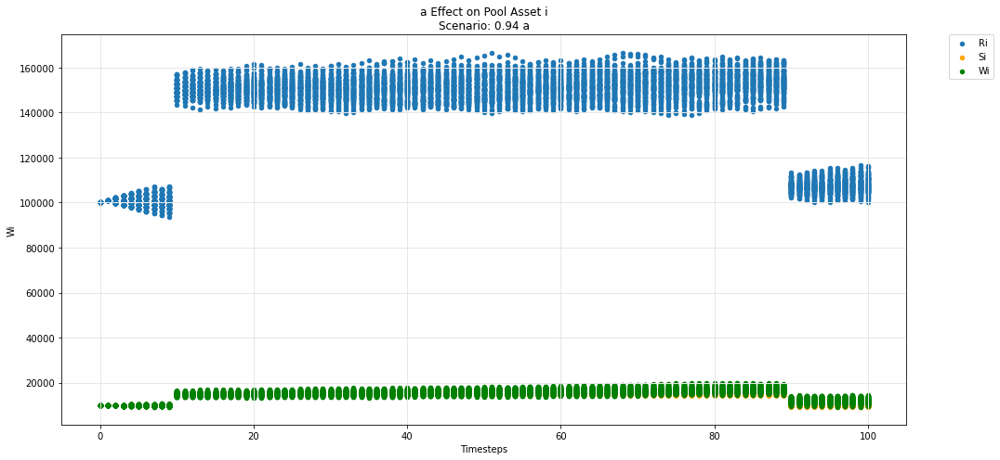

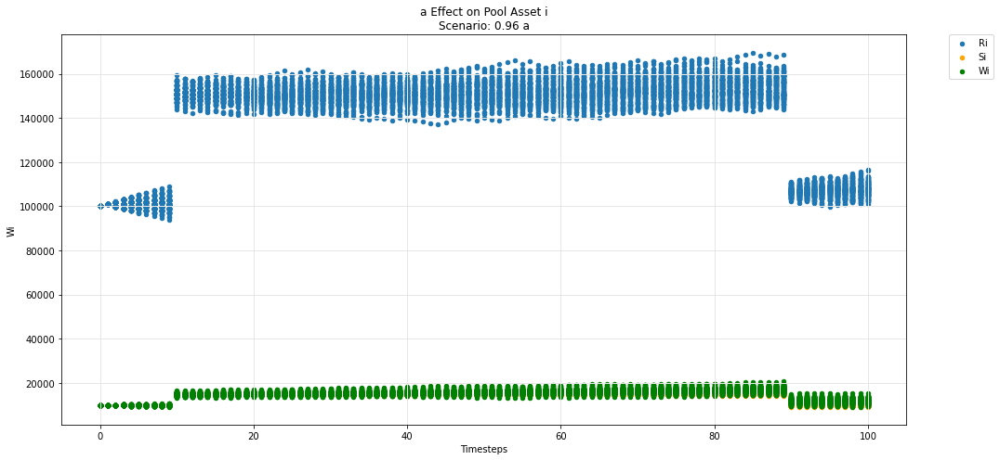

...

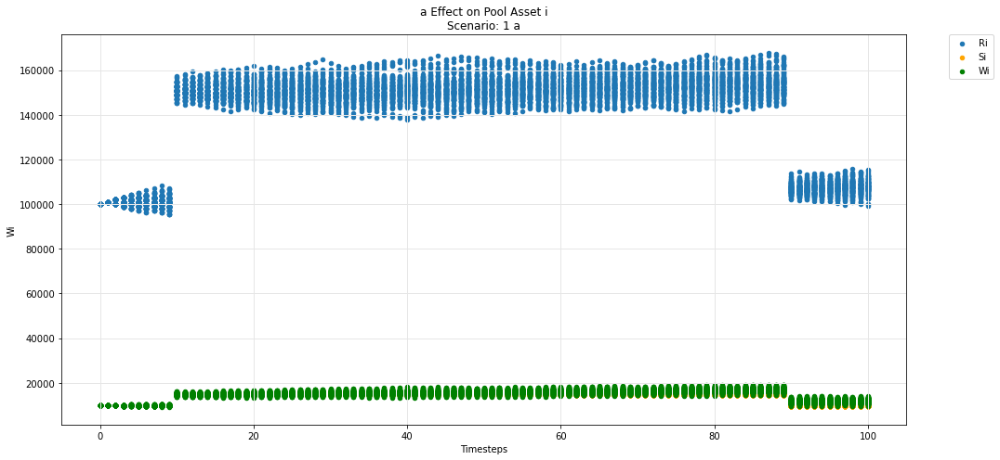

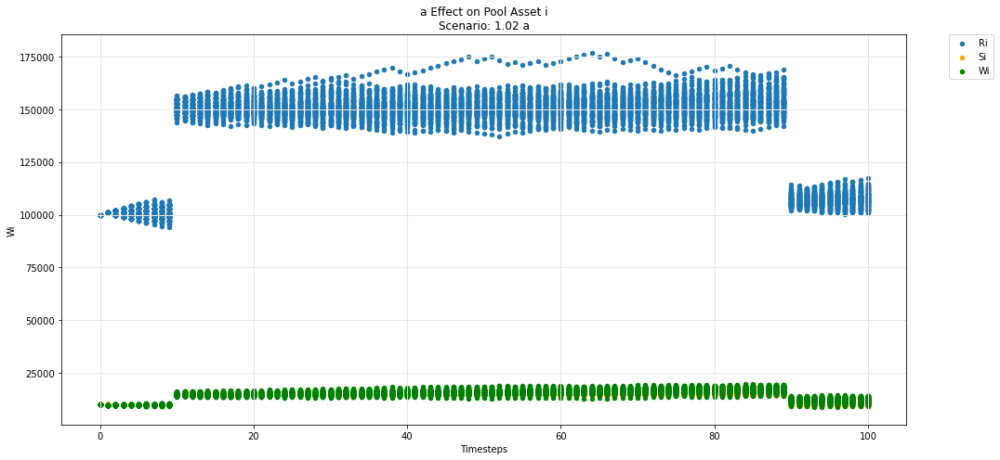

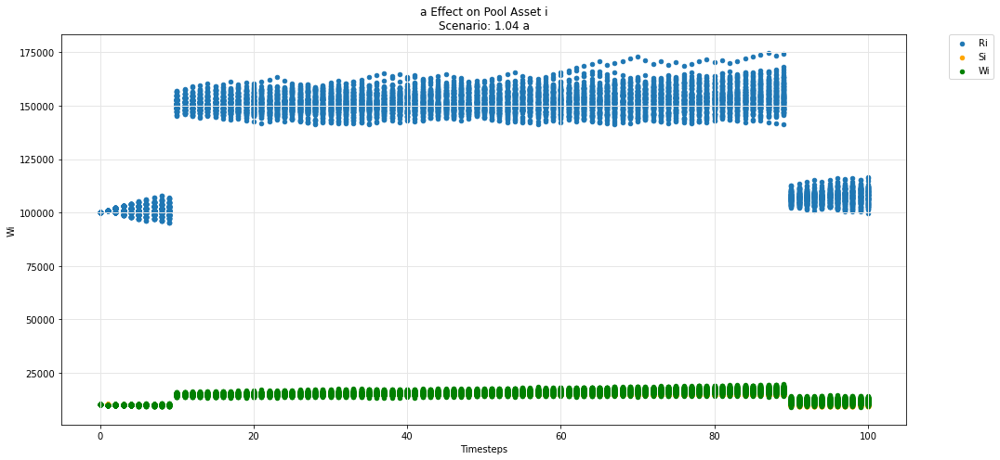

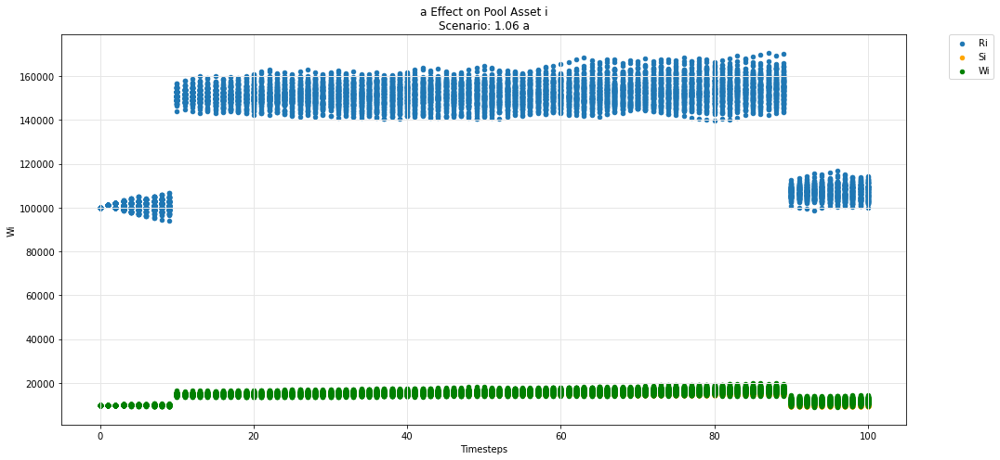

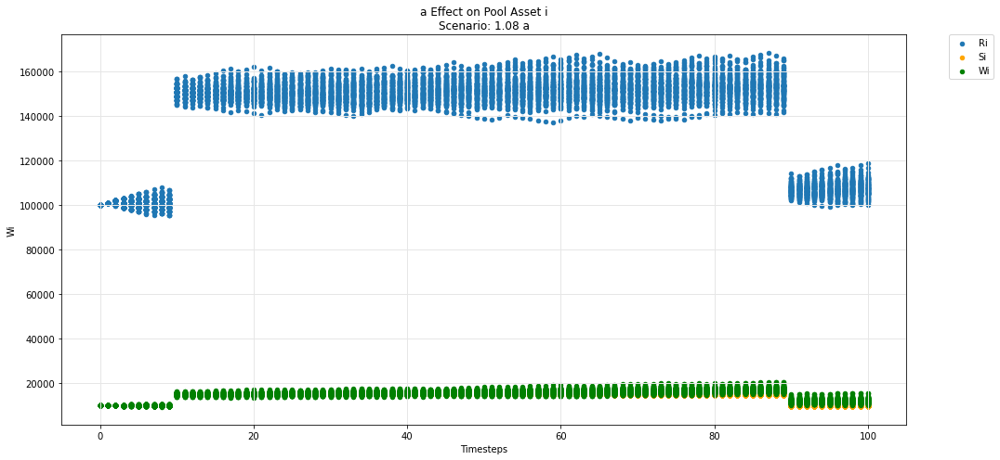

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

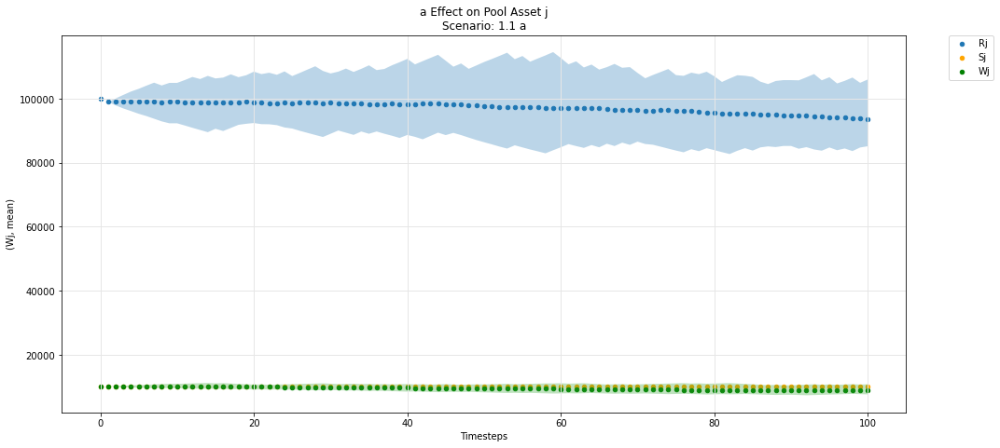

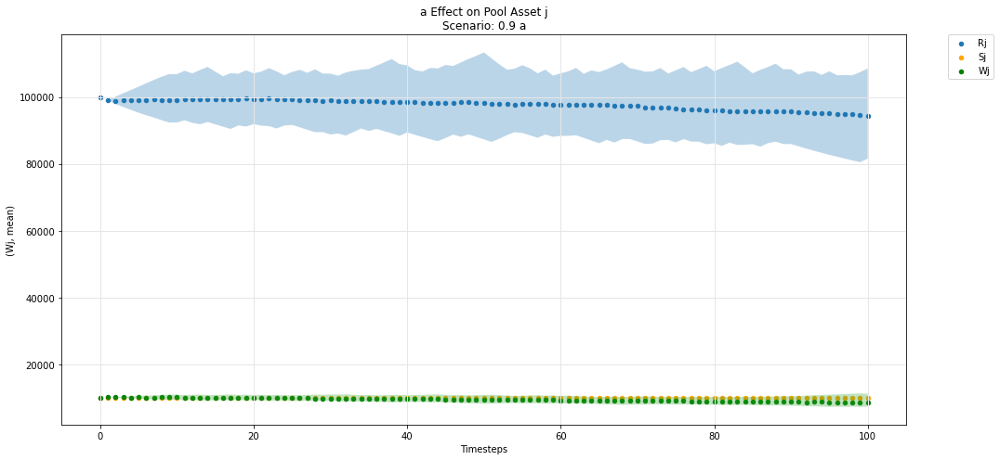

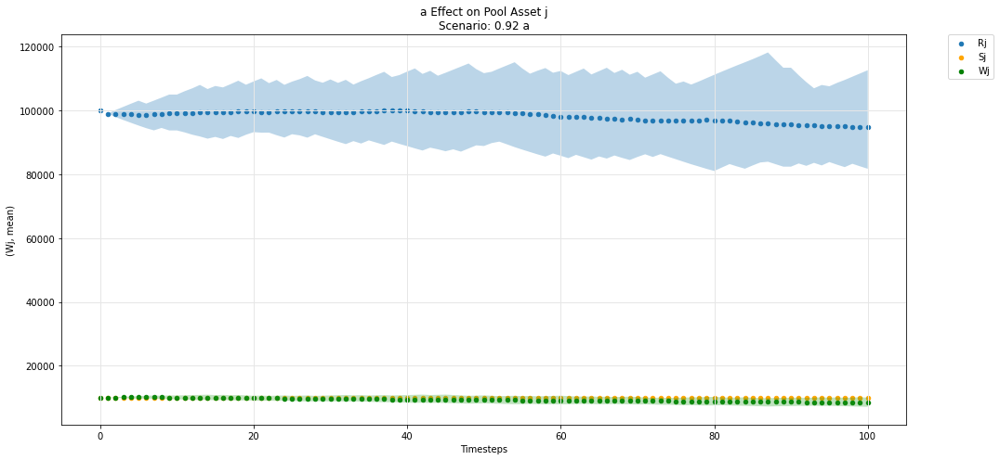

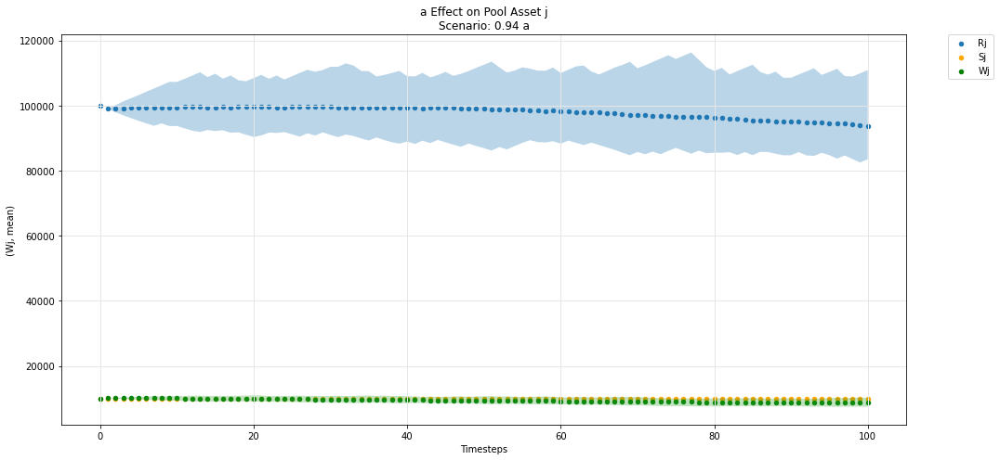

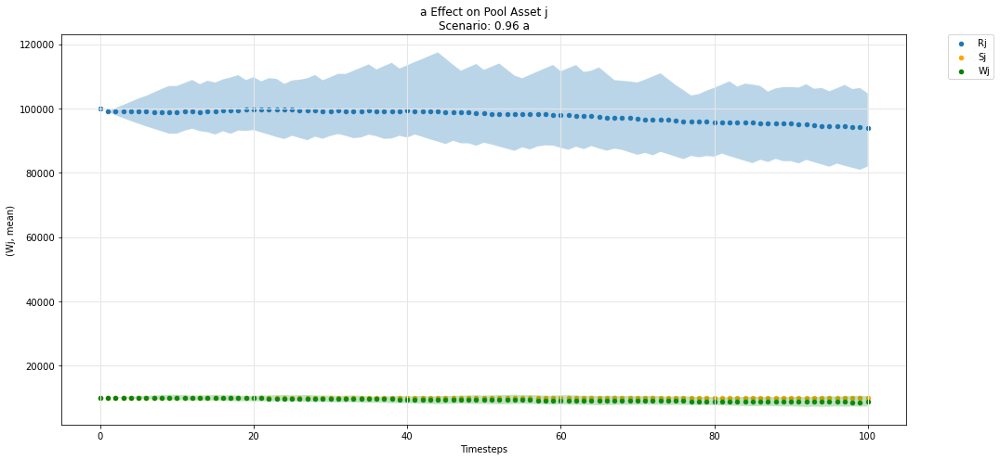

...

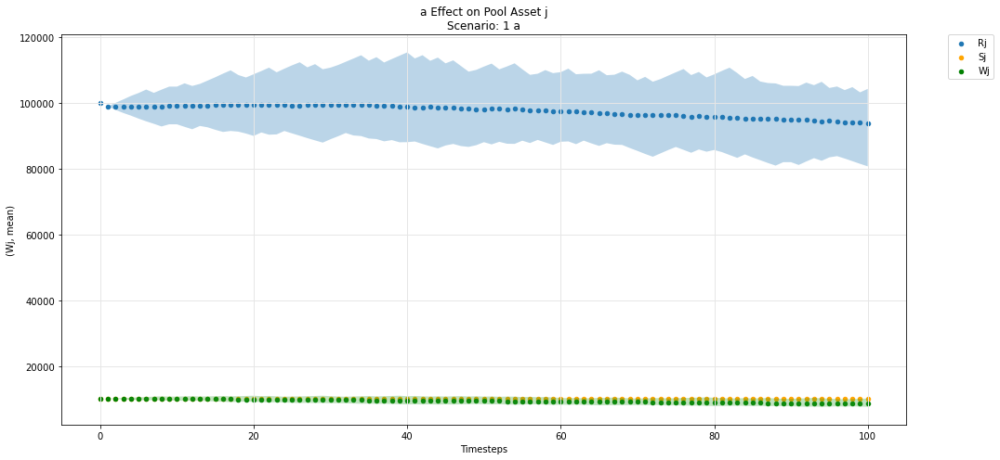

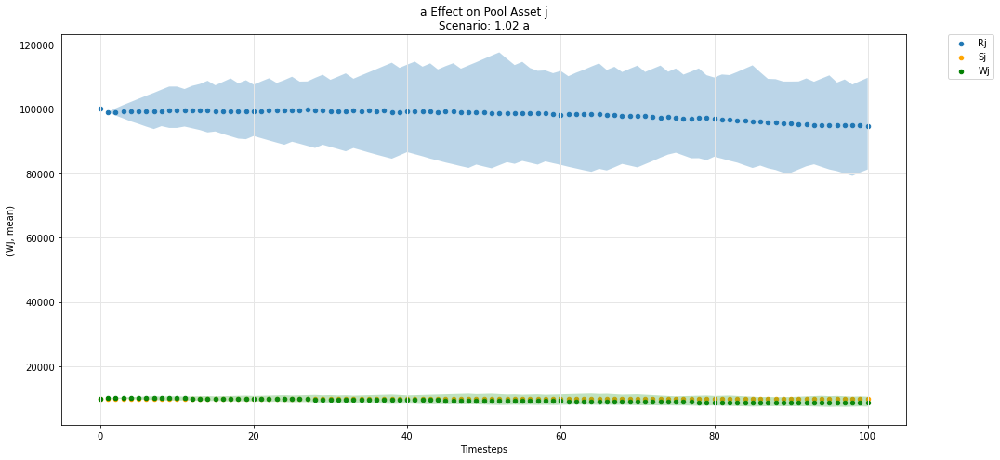

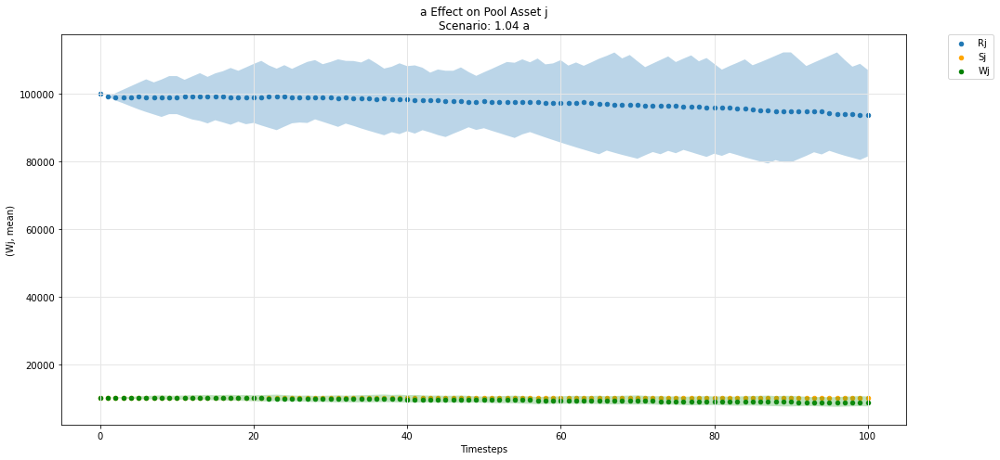

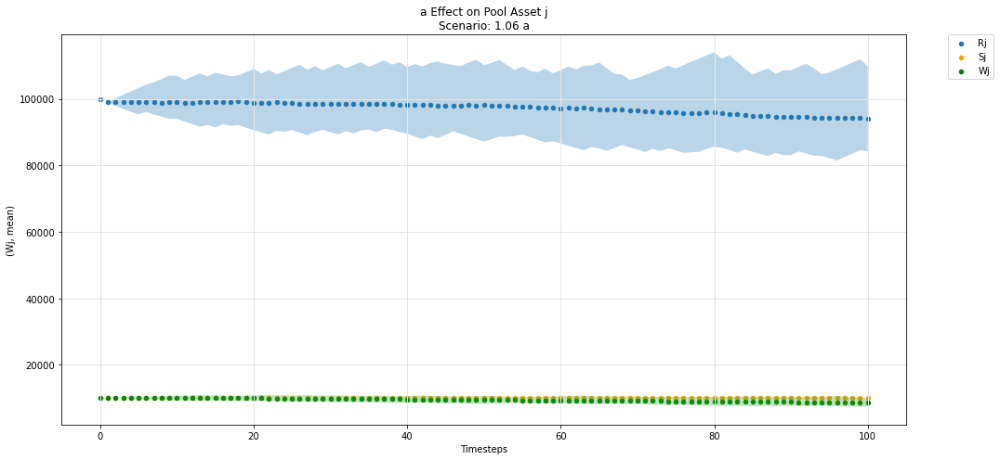

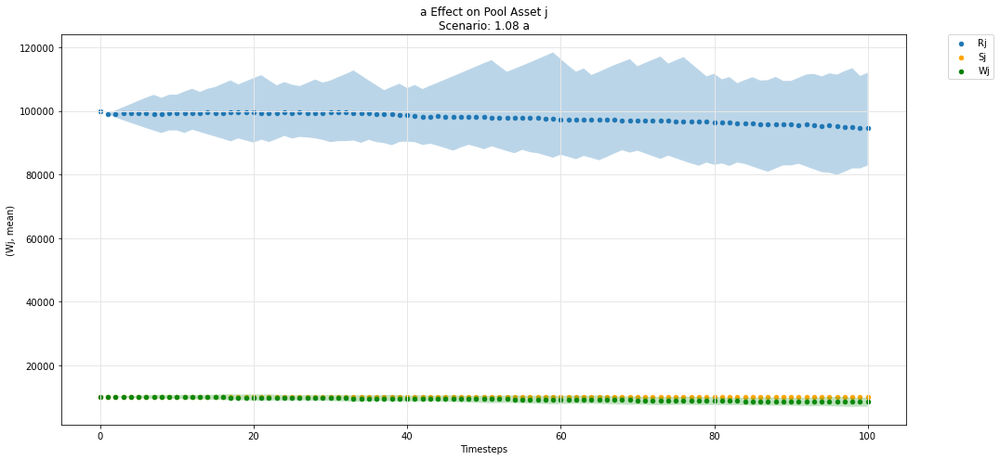

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

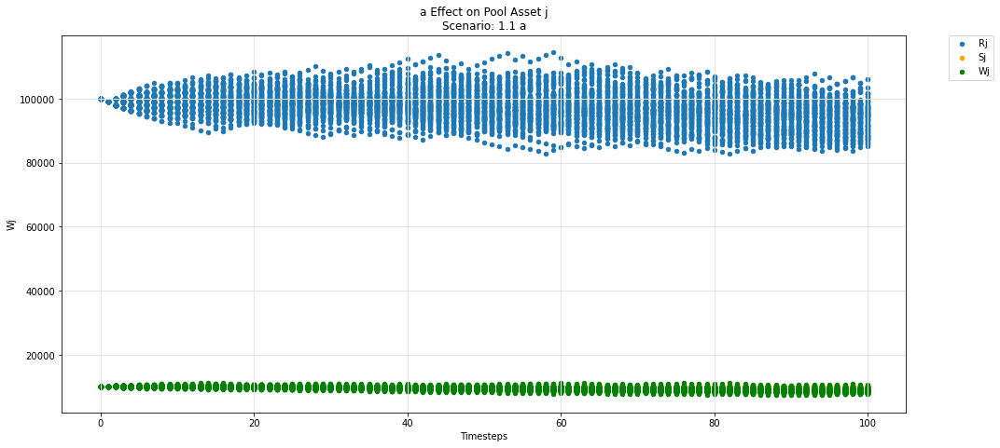

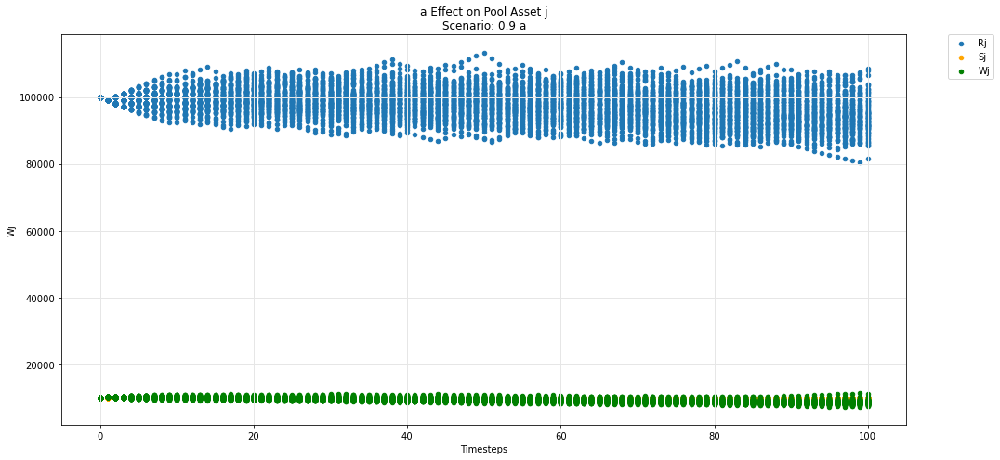

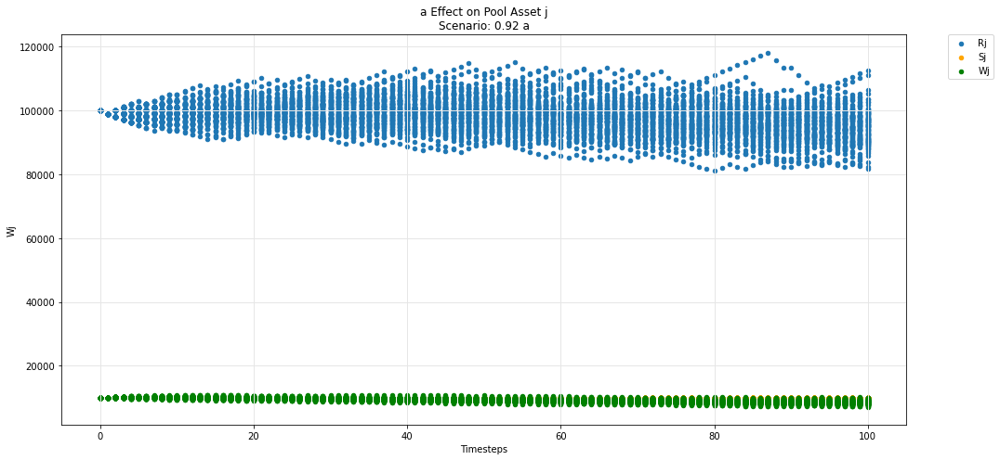

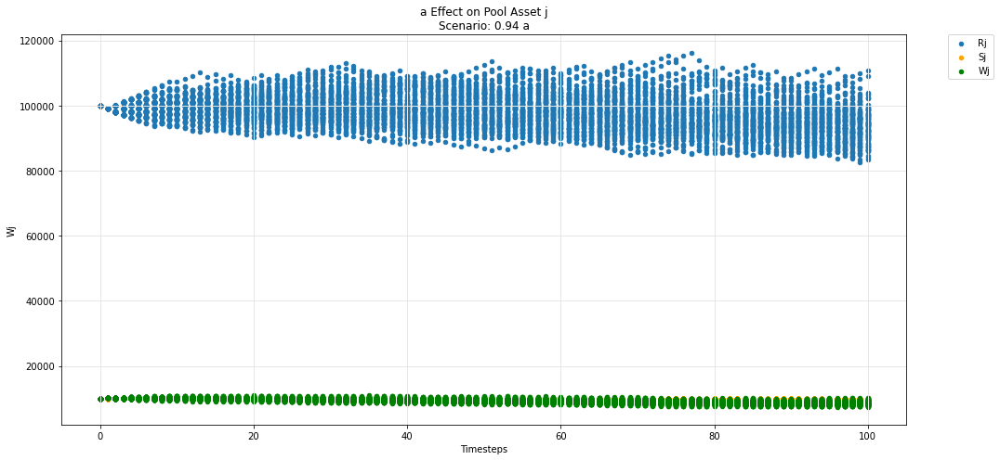

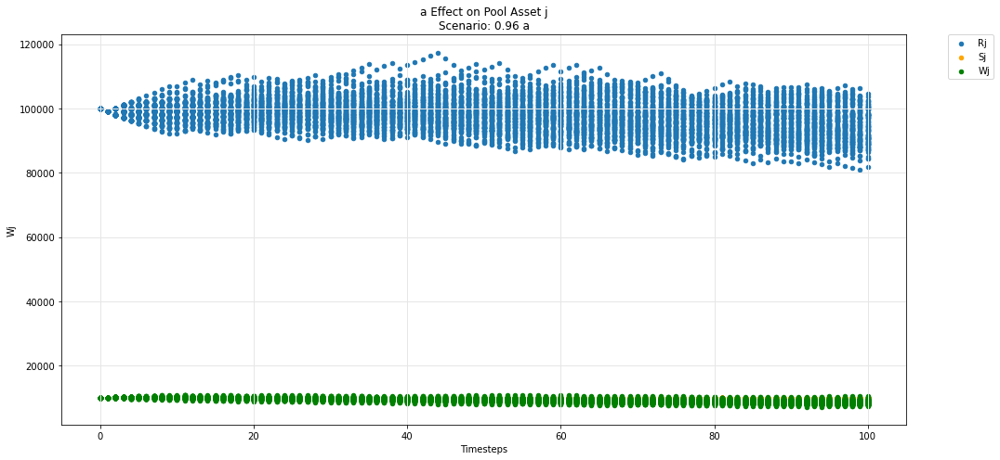

...

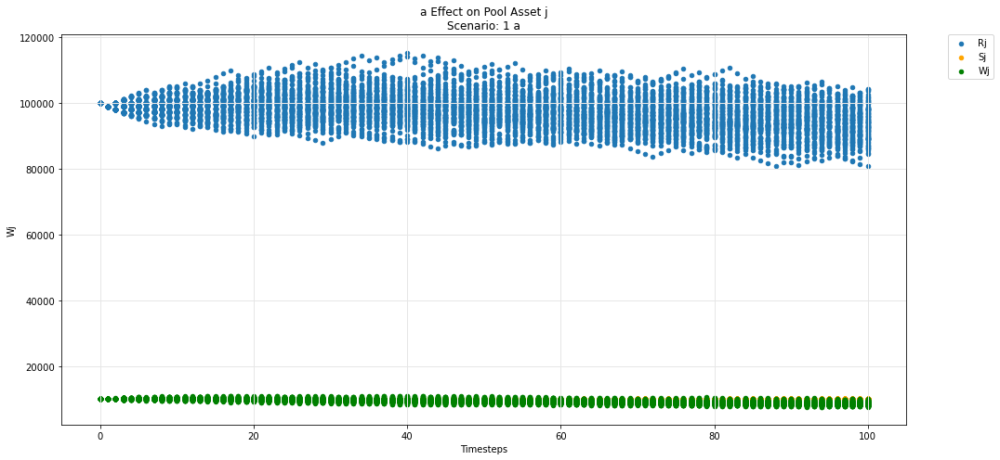

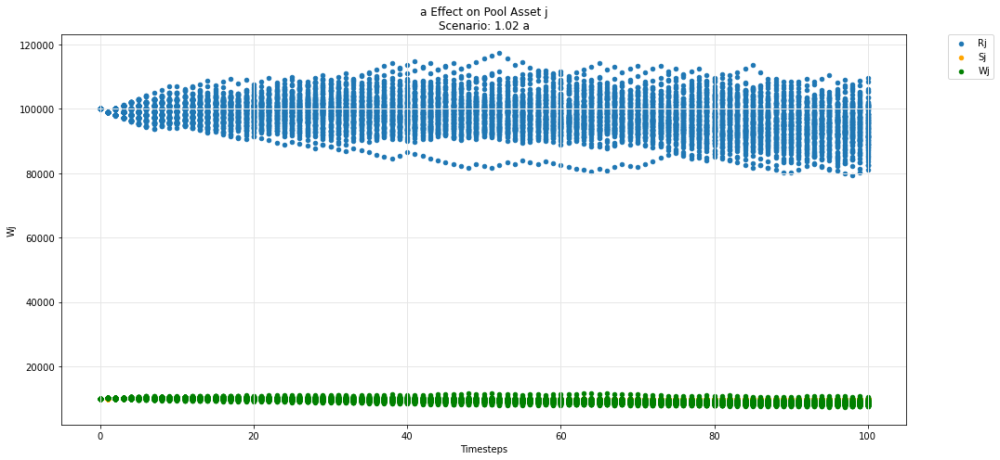

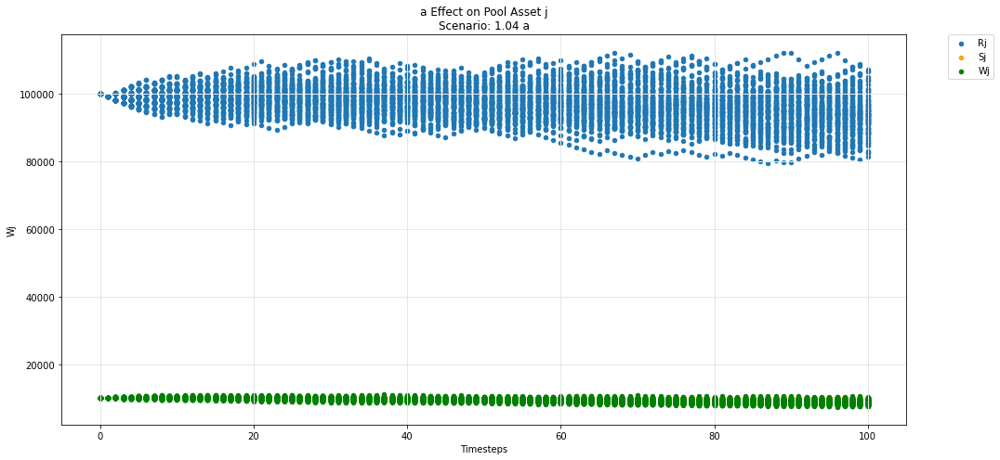

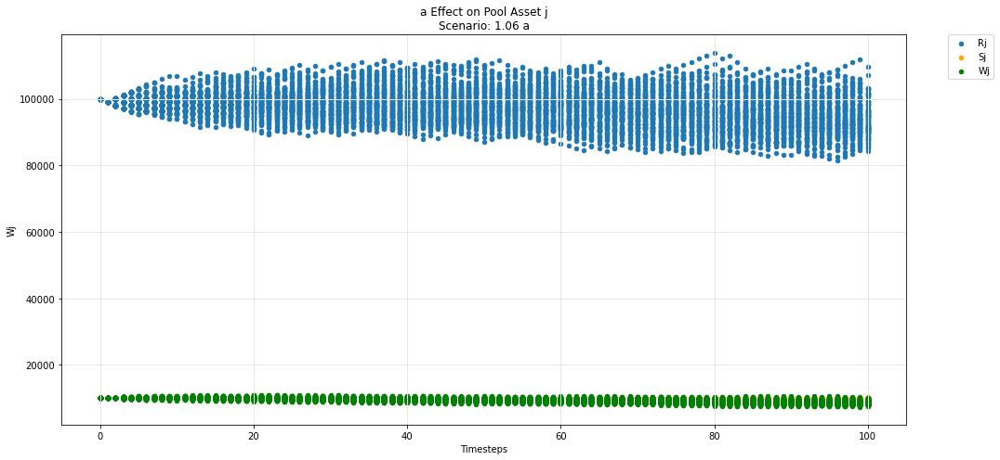

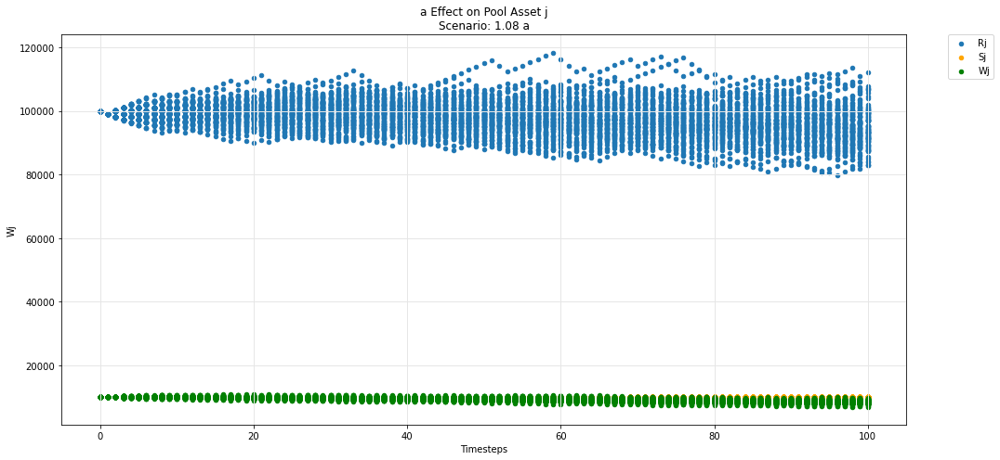

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

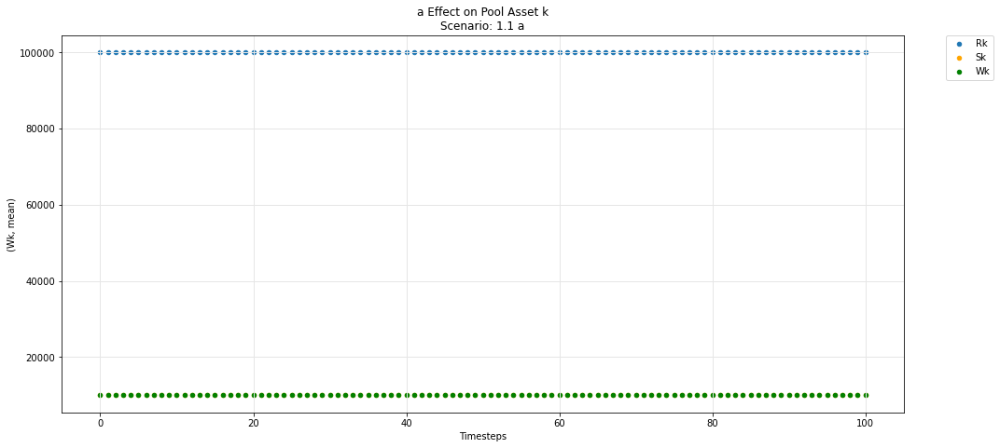

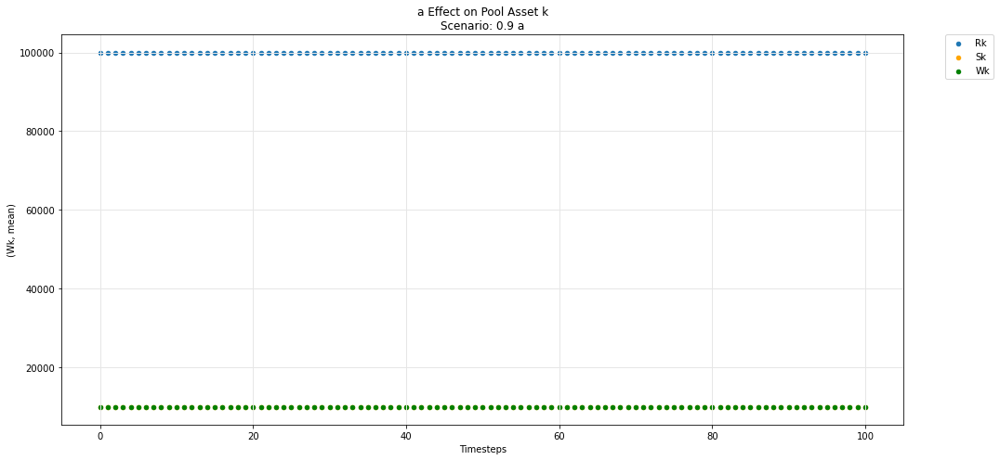

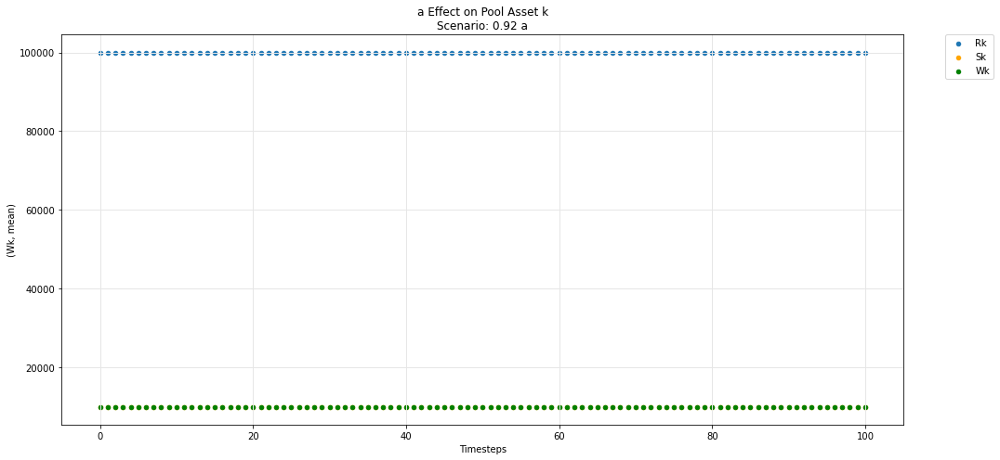

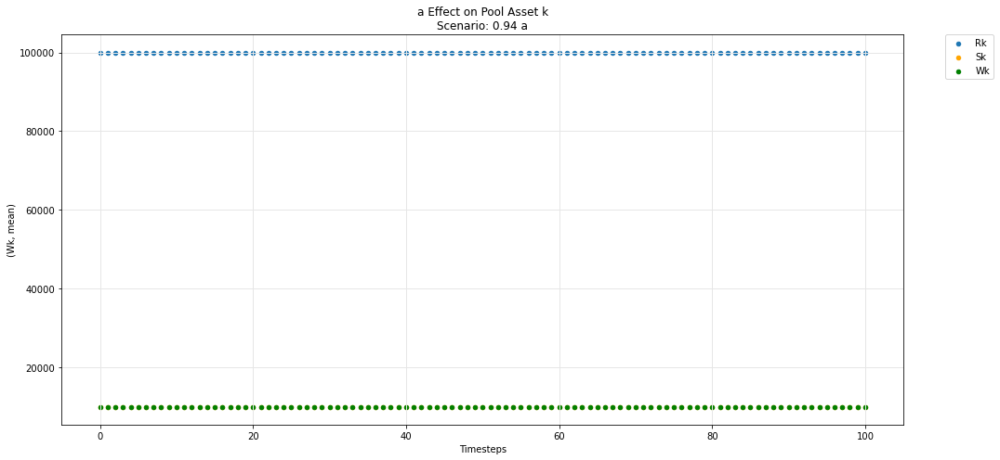

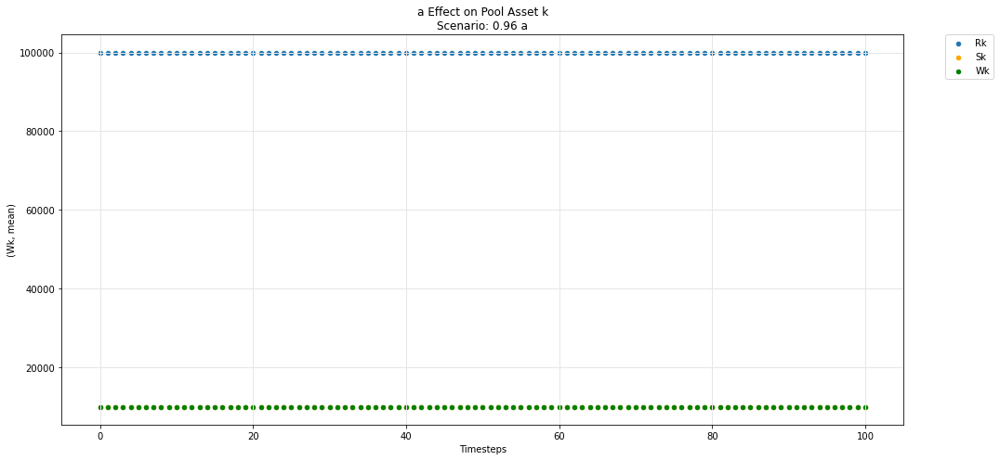

...

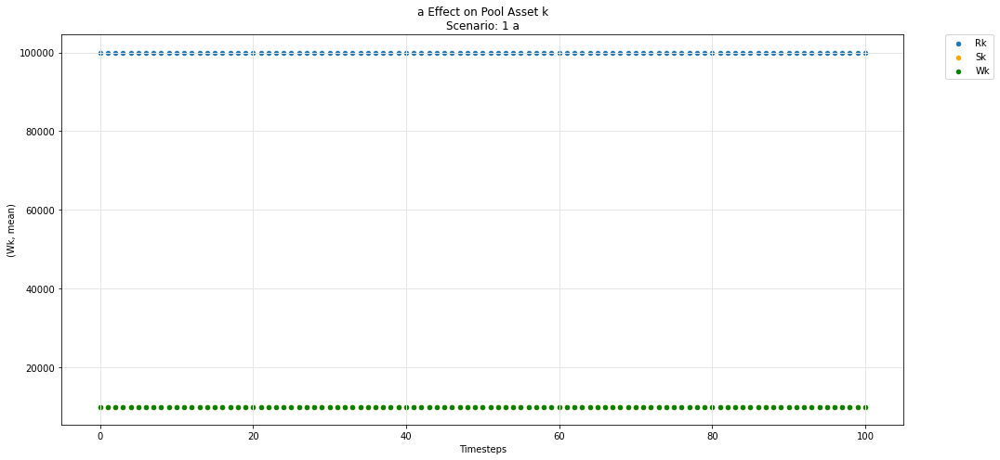

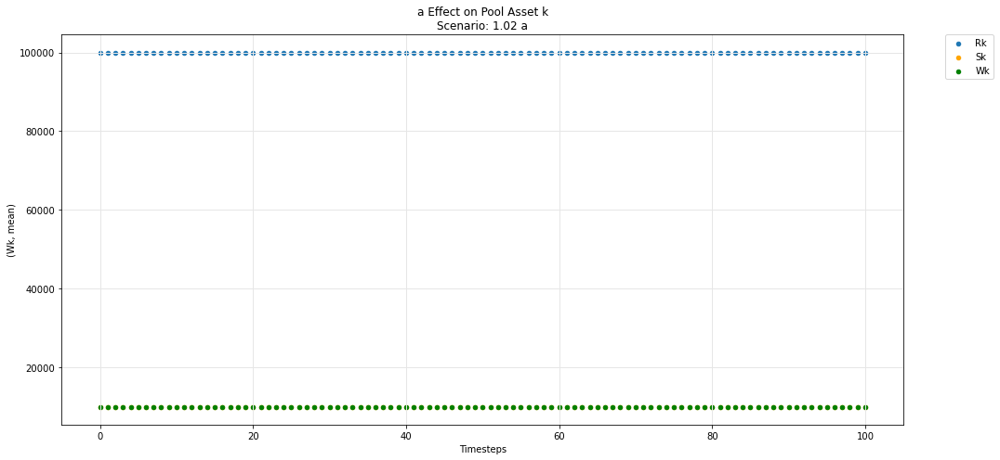

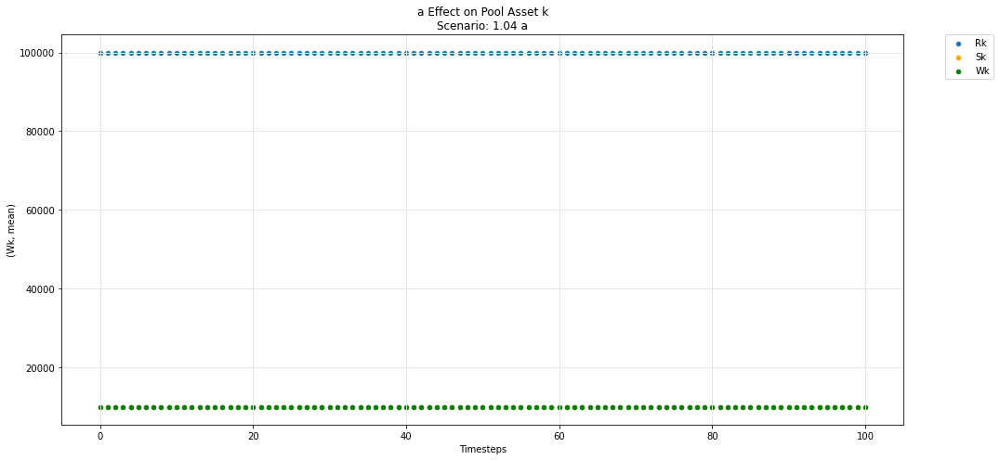

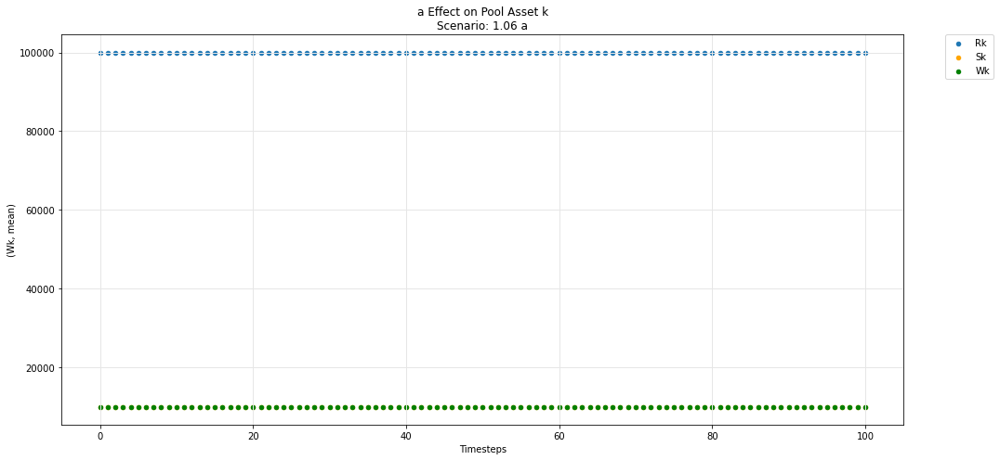

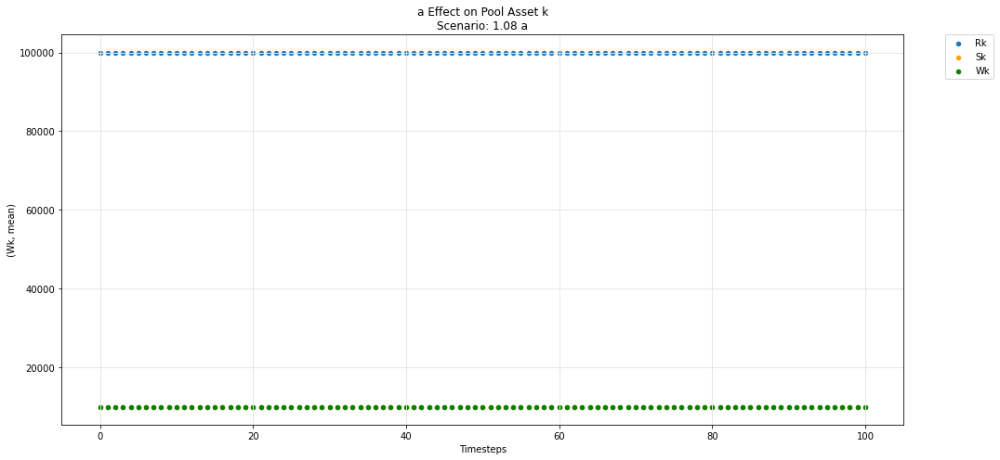

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

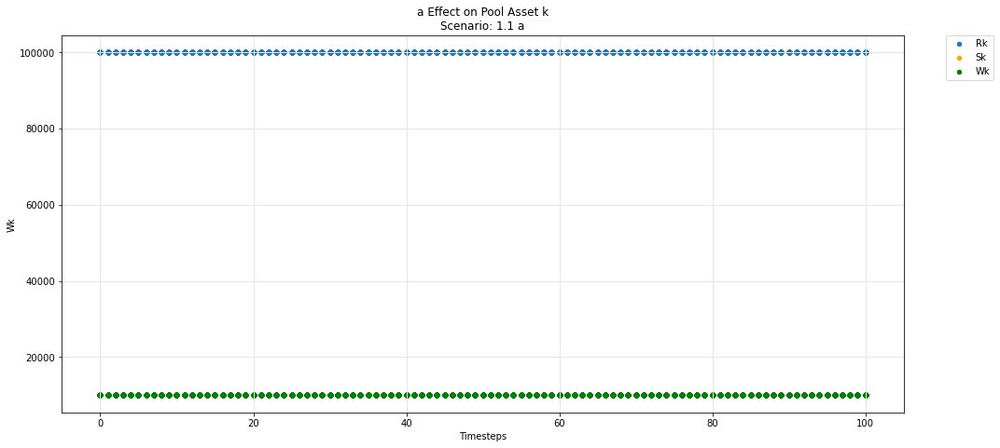

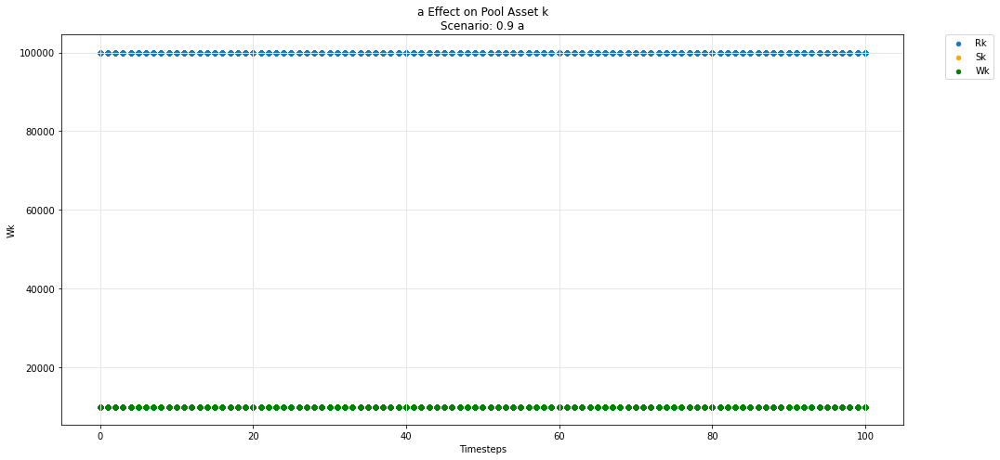

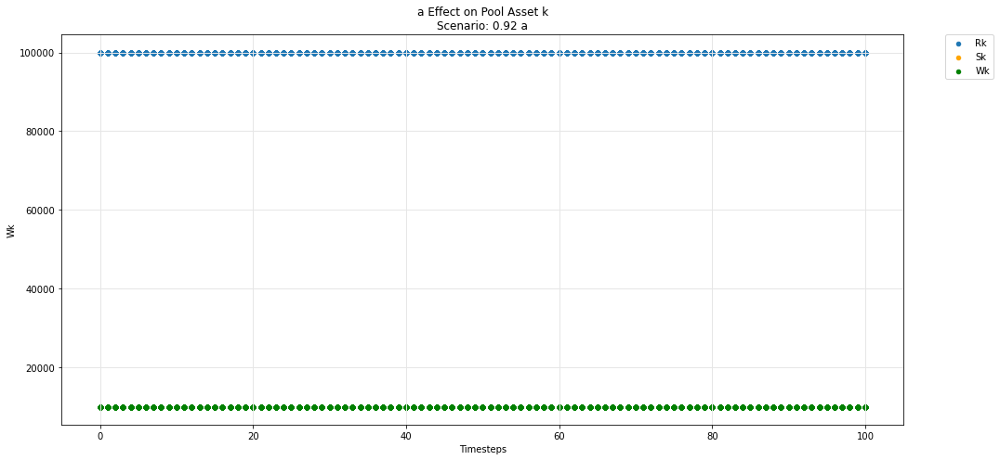

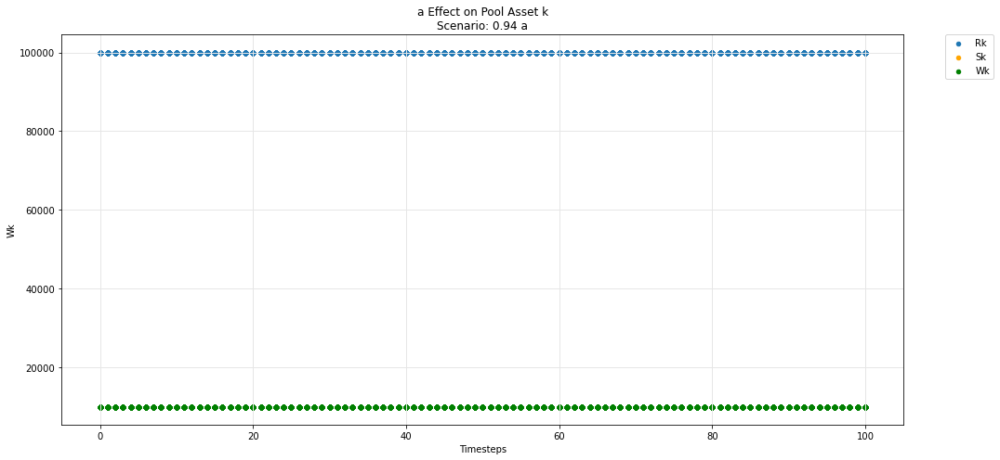

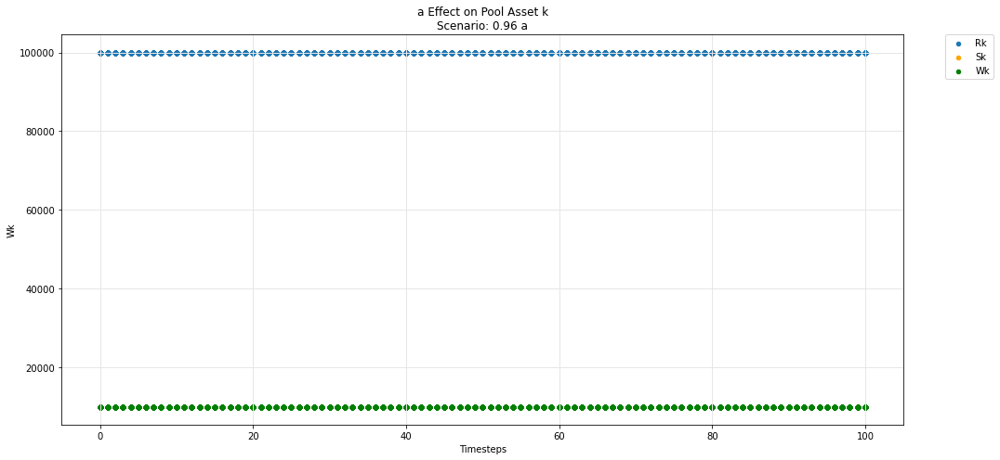

...

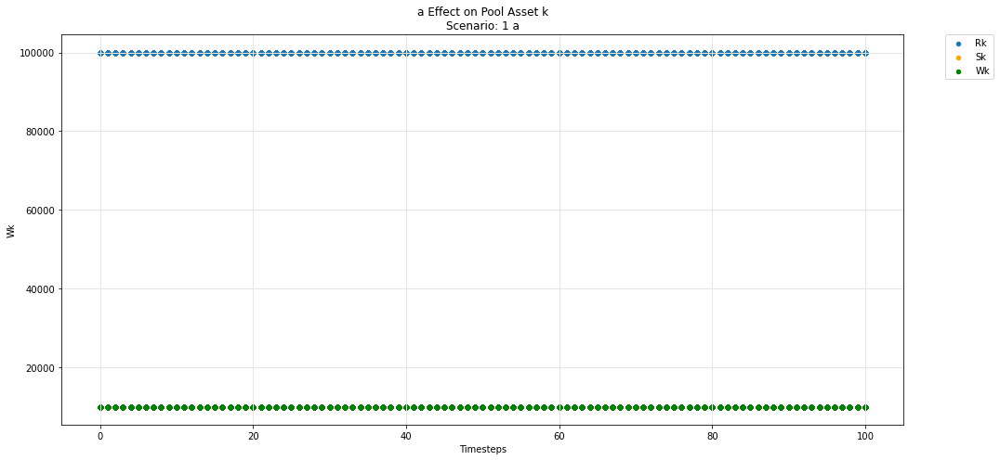

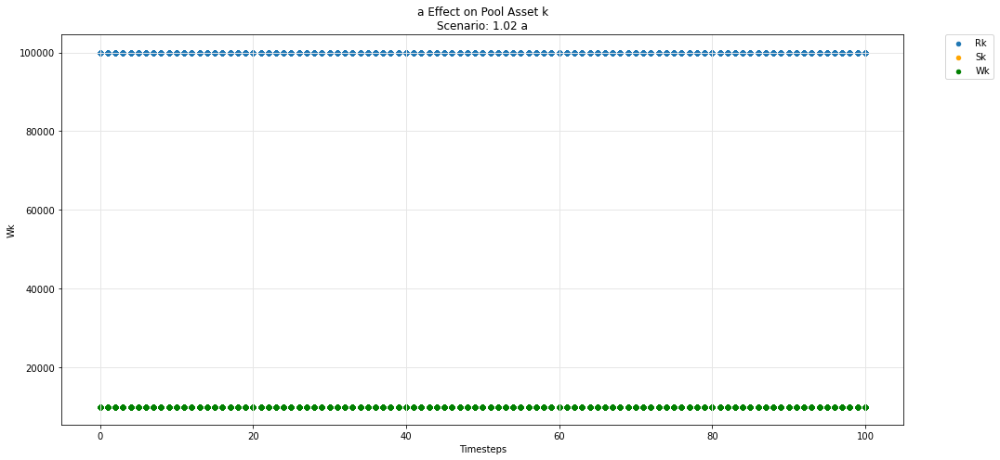

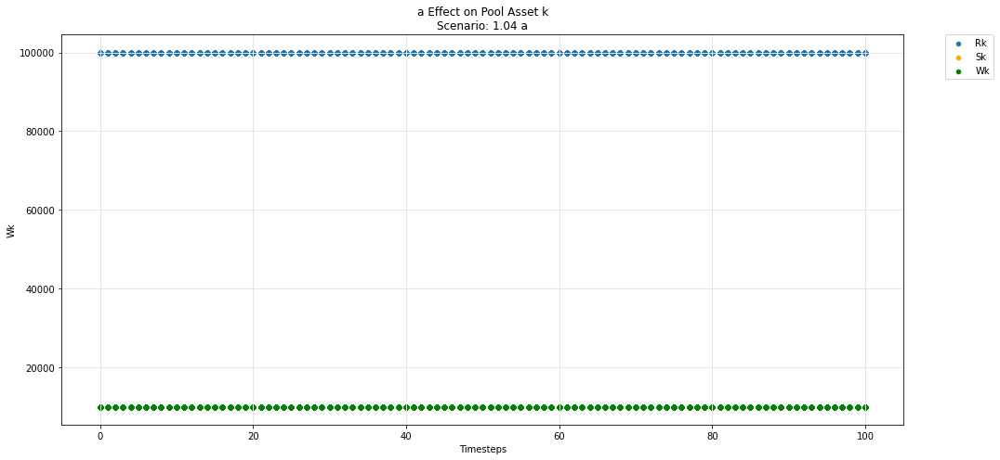

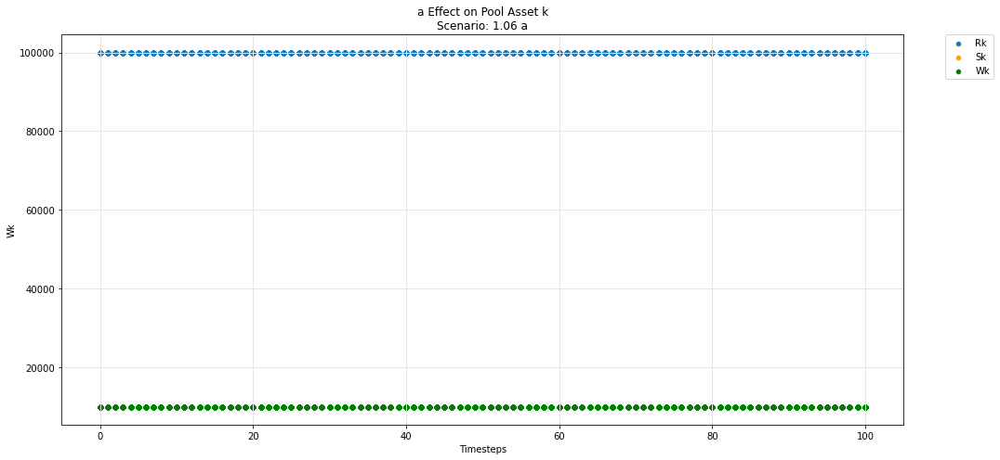

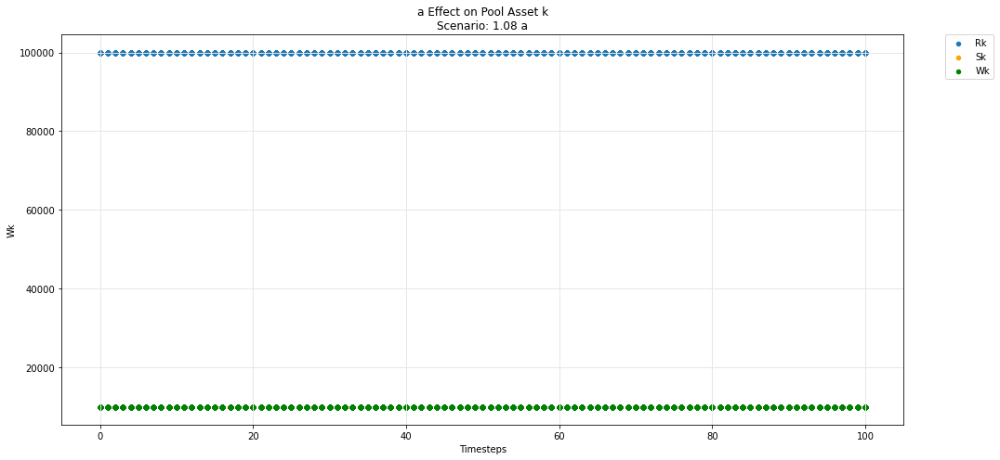

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

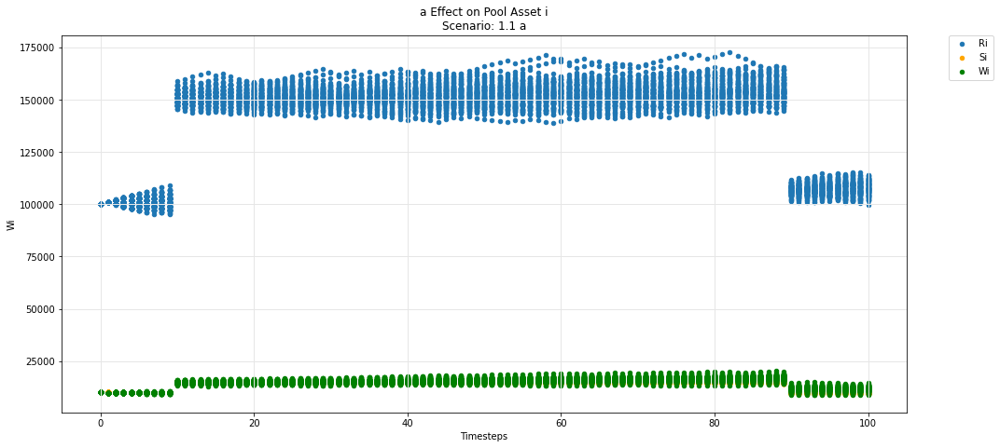

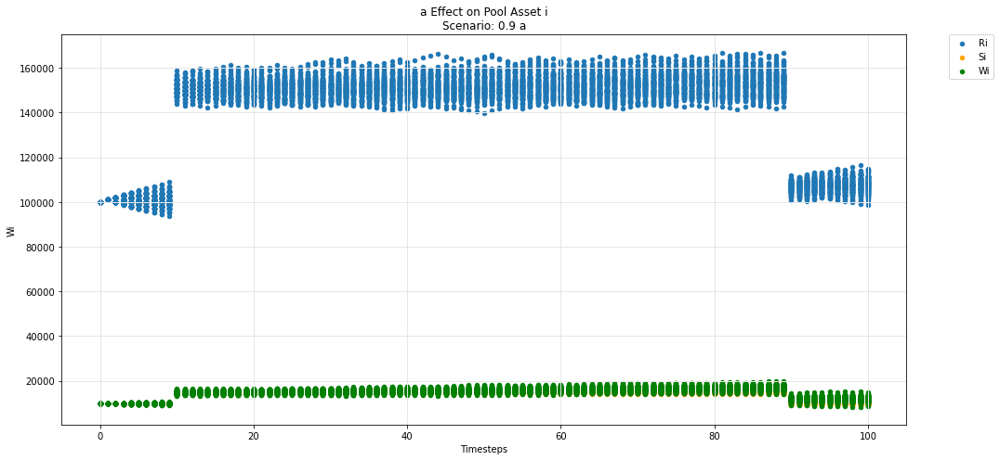

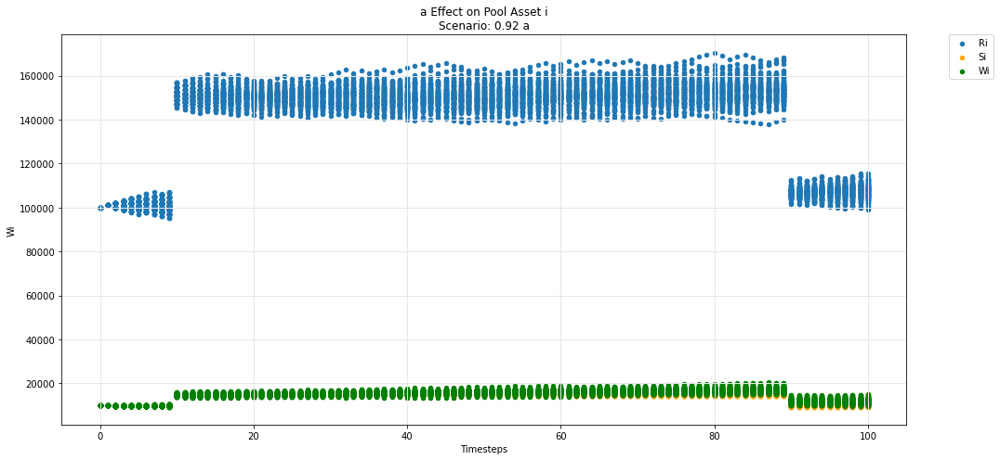

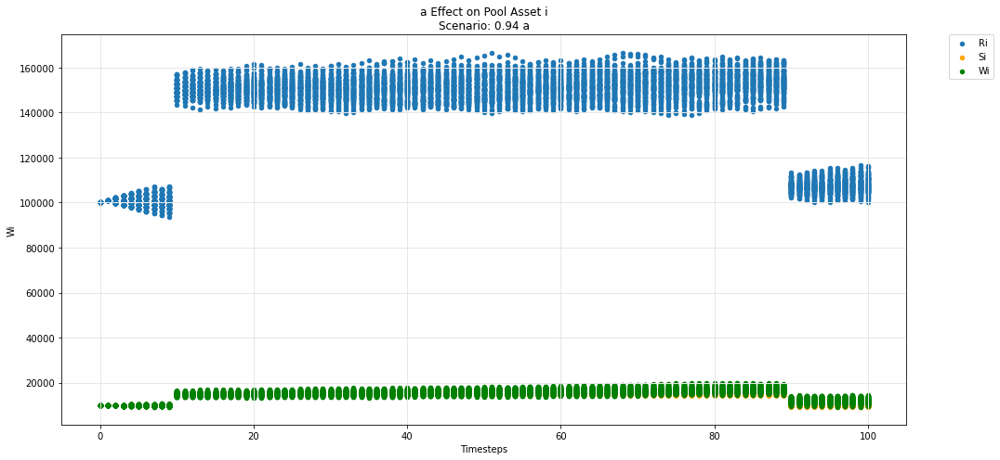

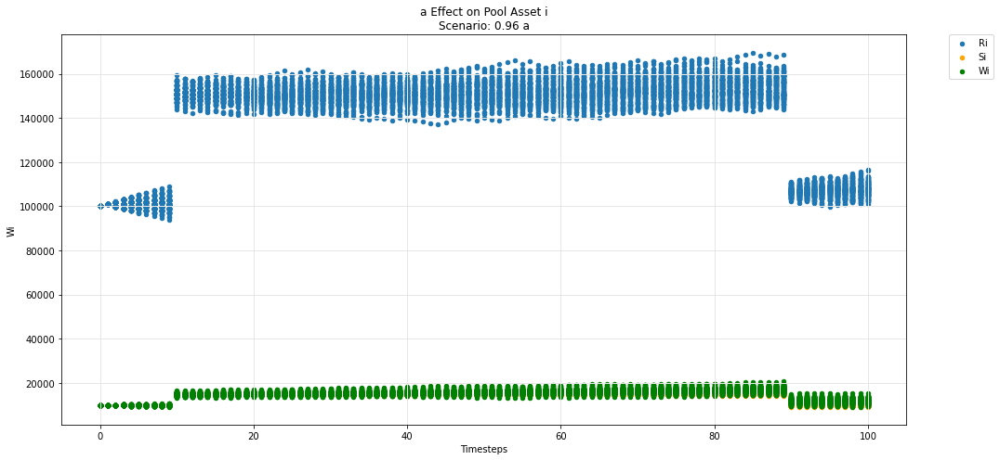

...

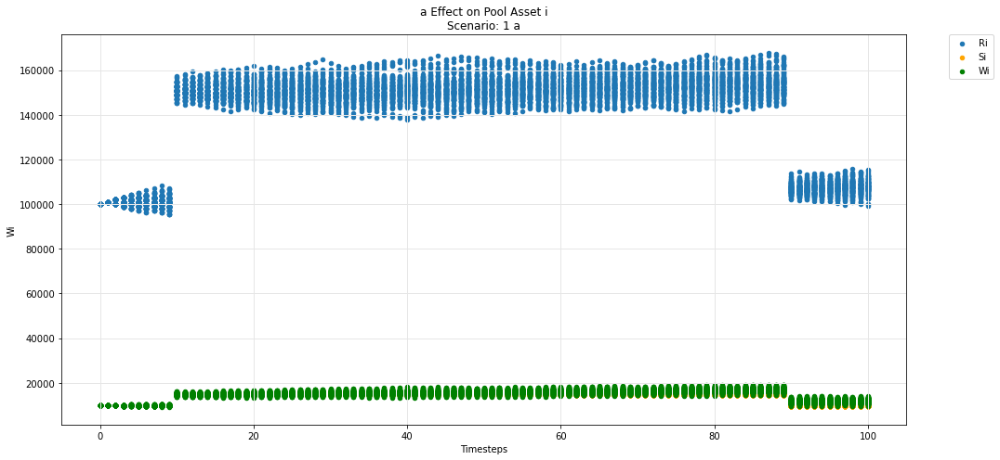

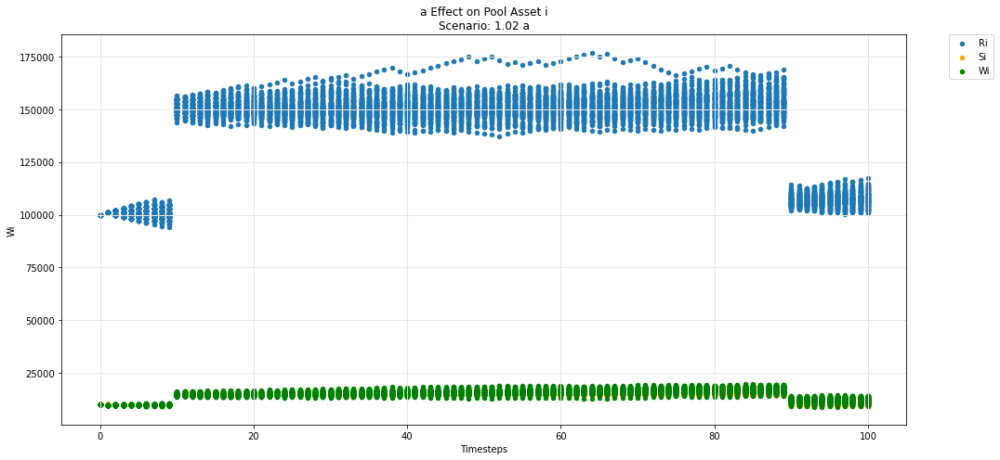

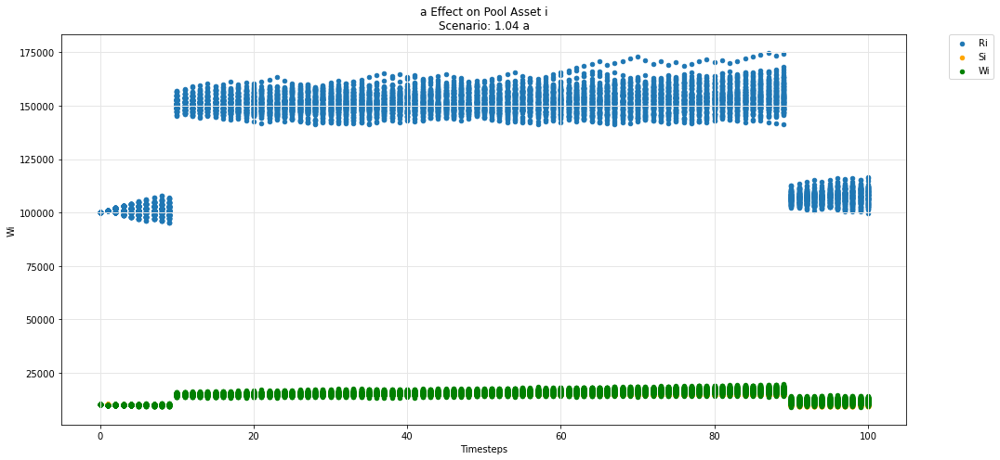

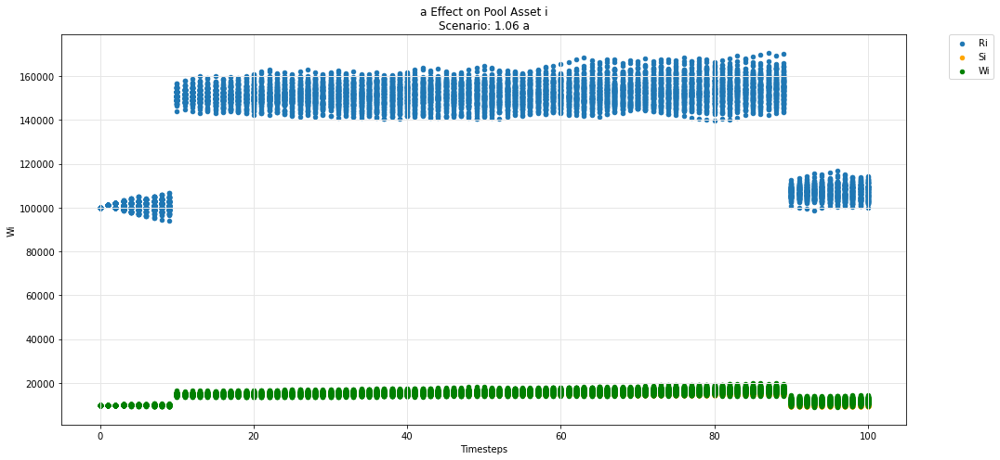

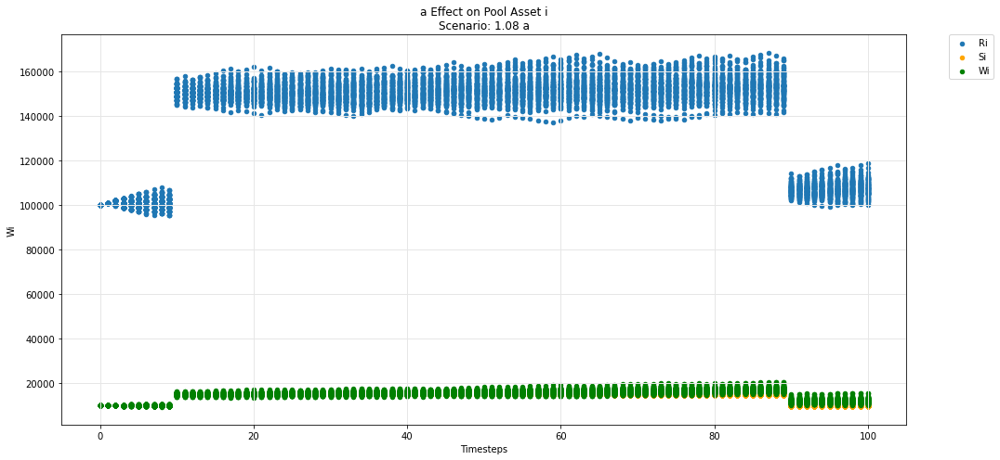

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

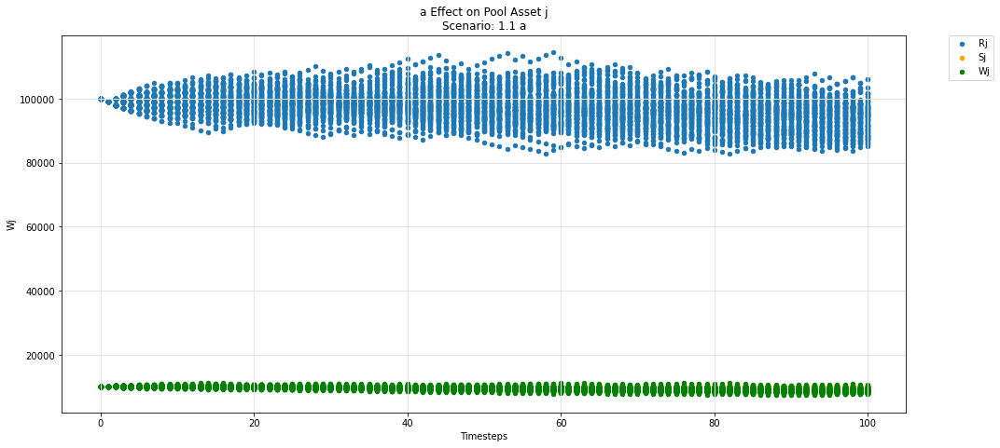

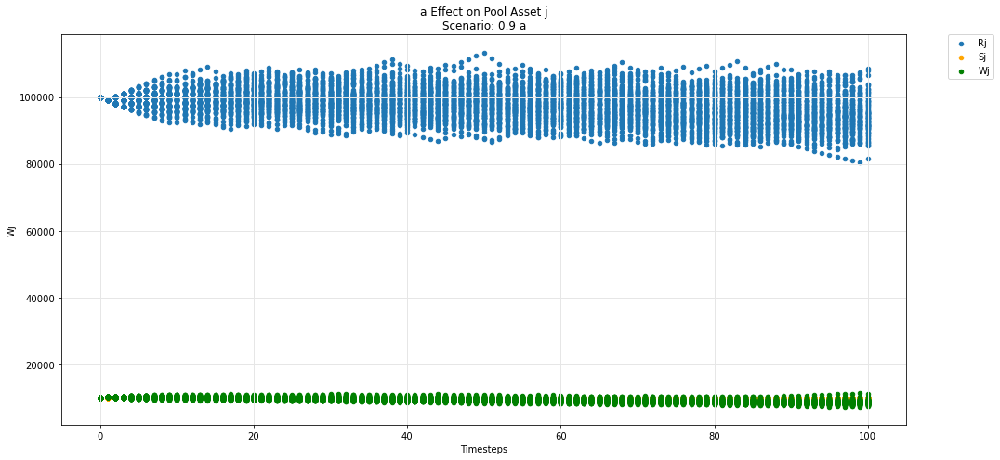

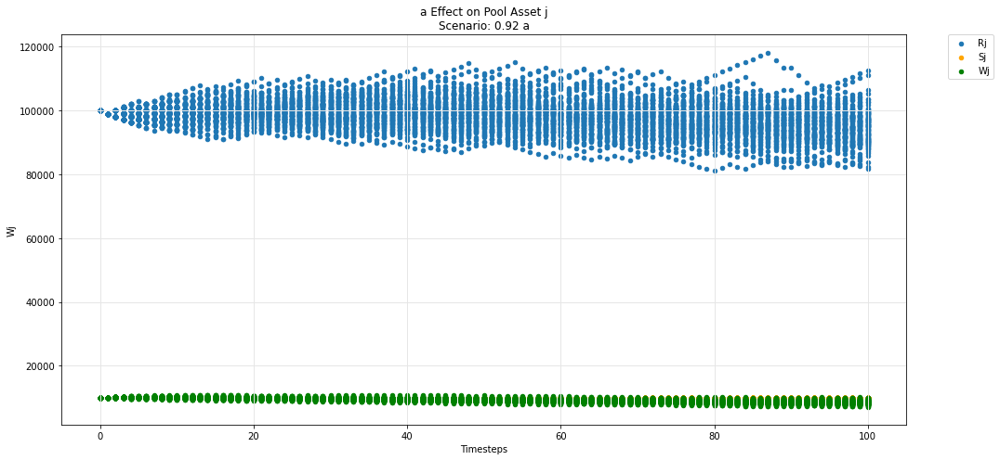

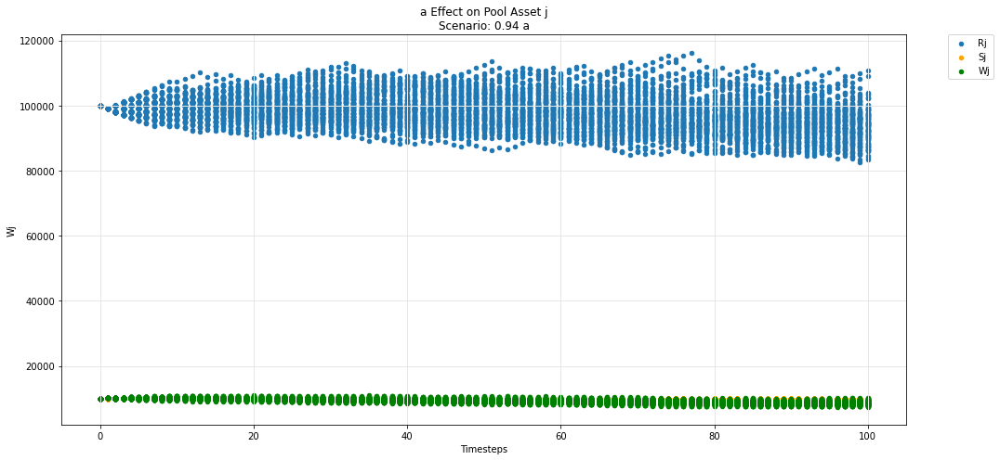

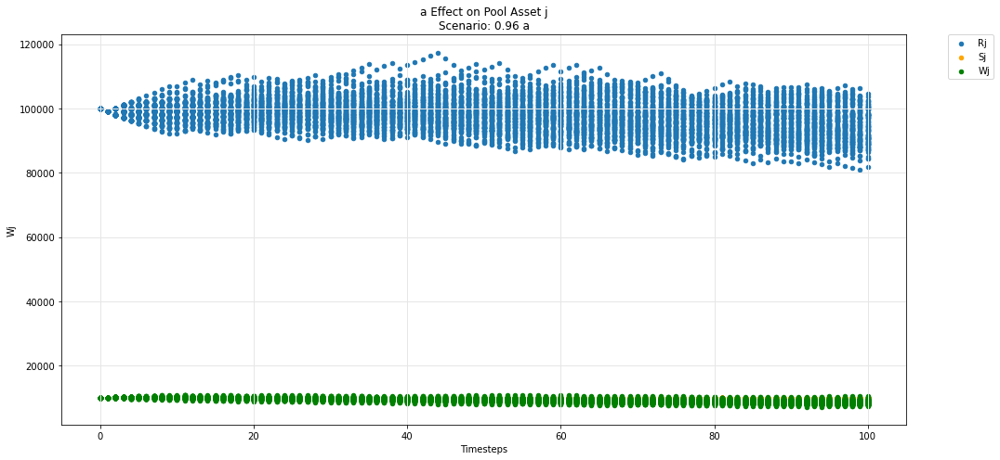

...

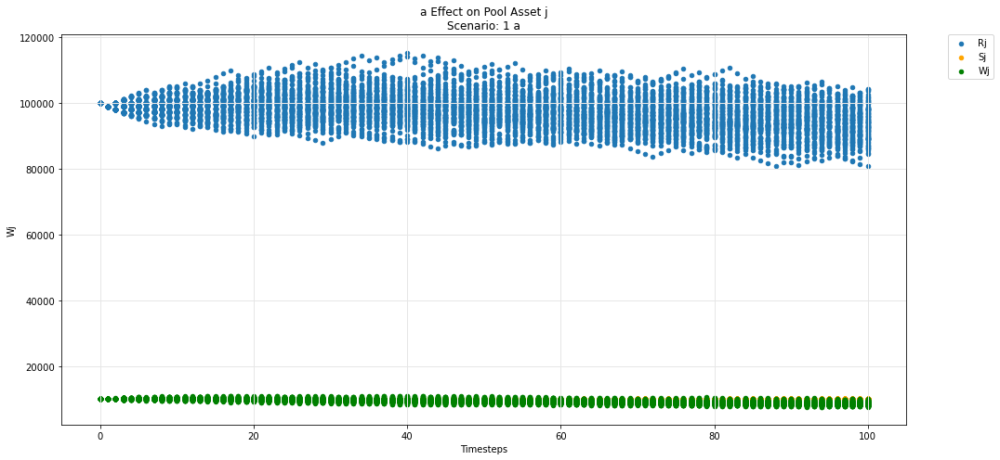

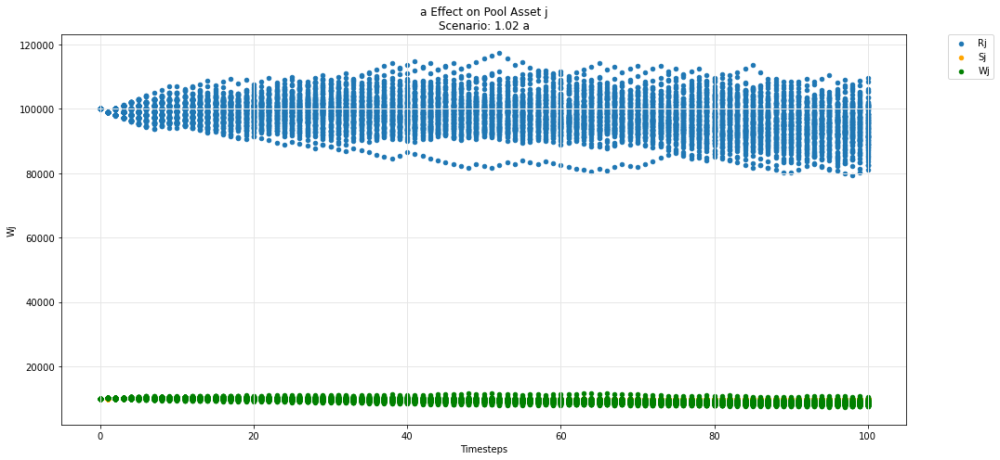

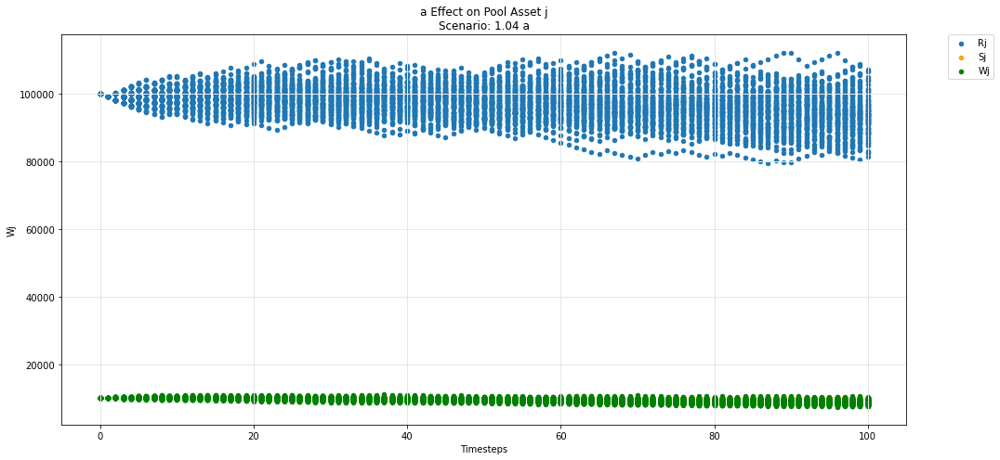

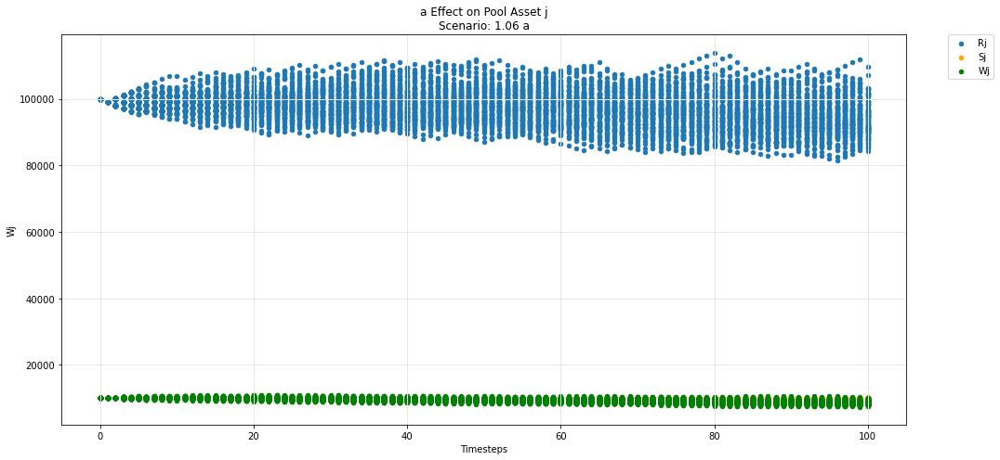

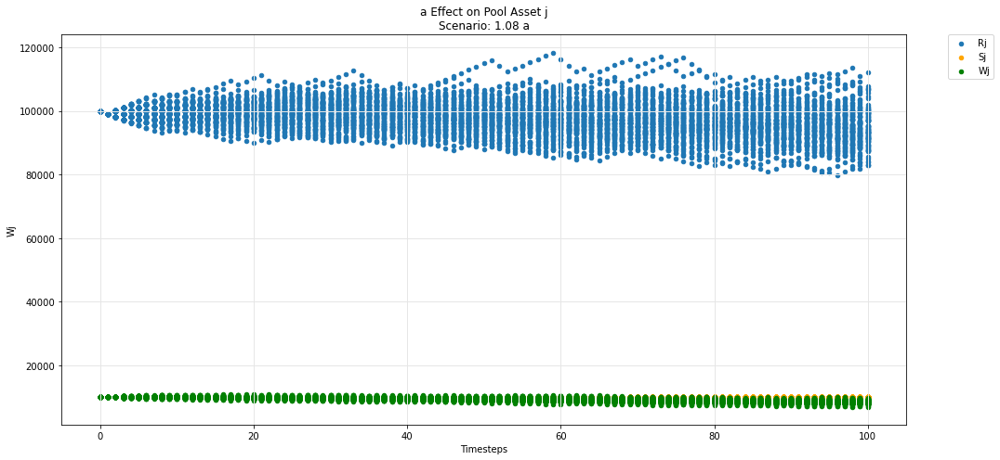

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

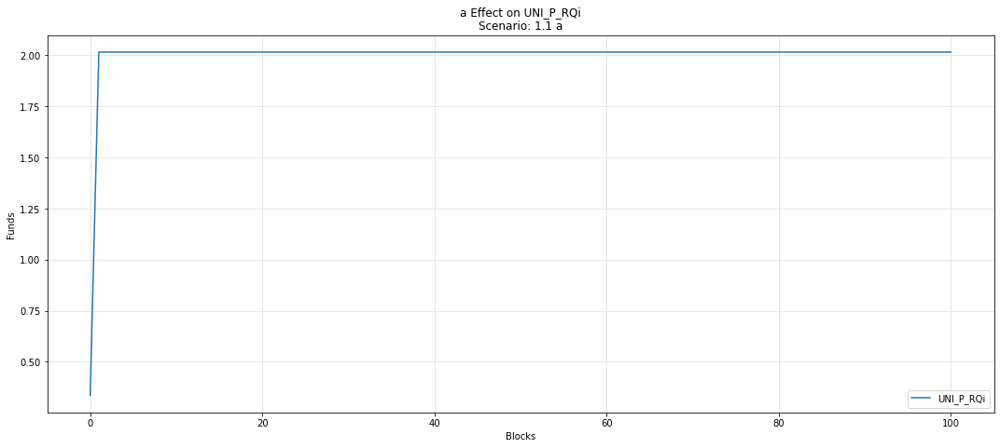

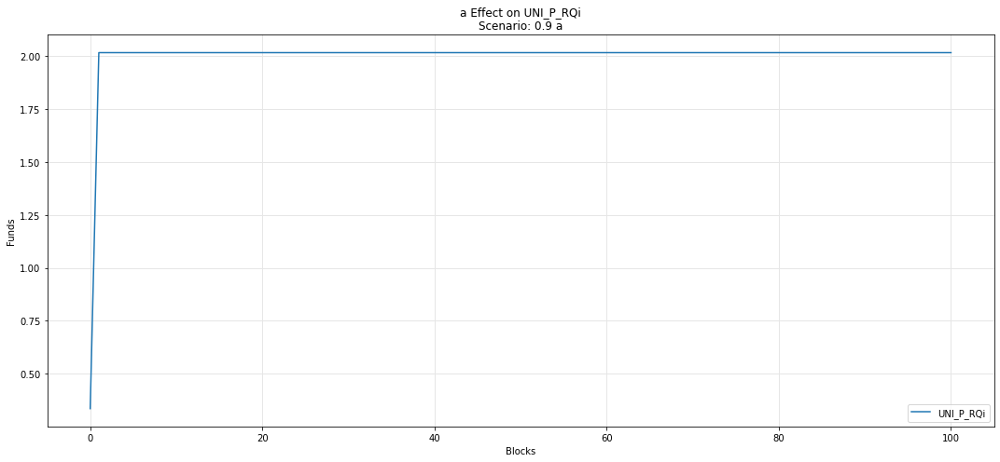

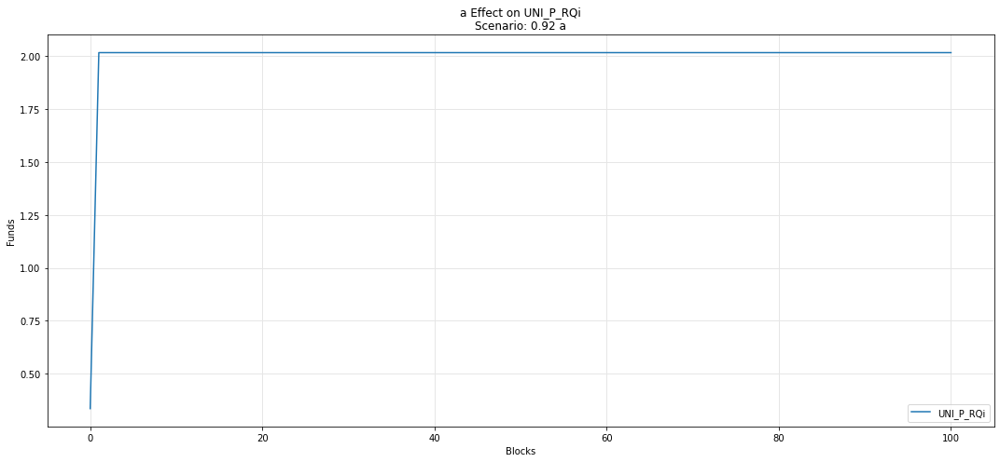

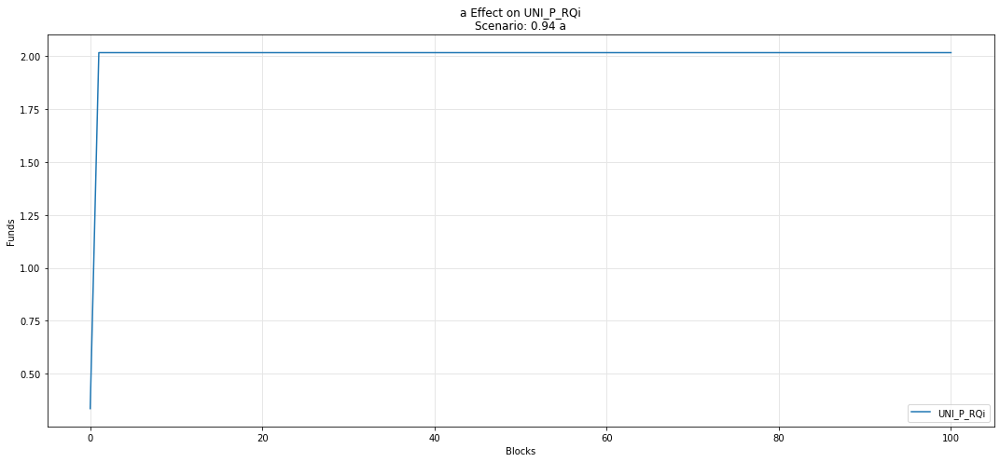

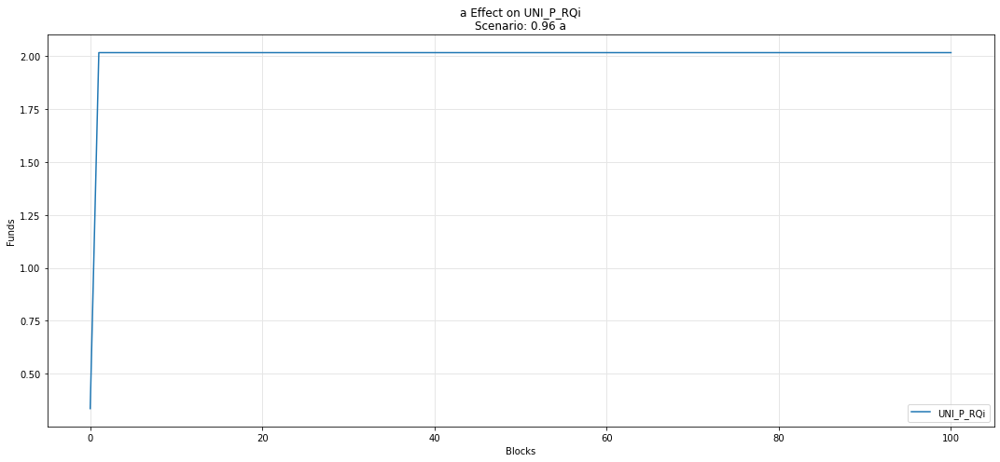

...

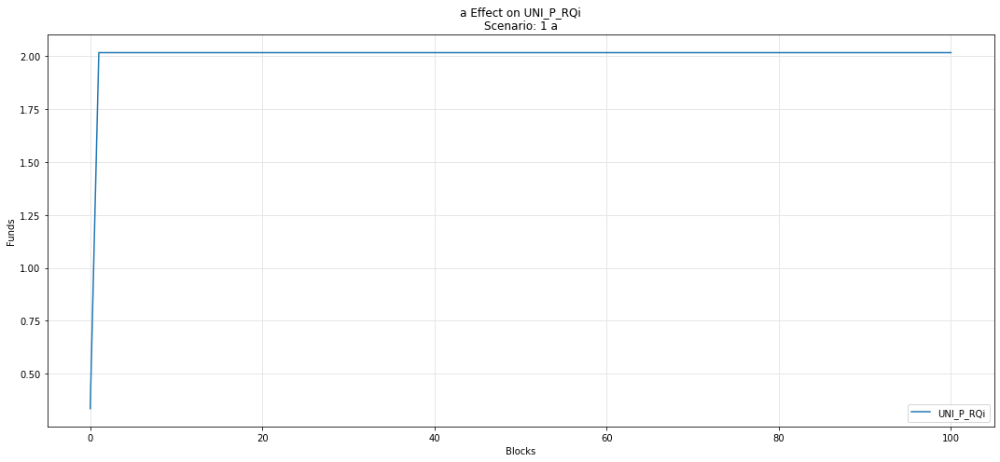

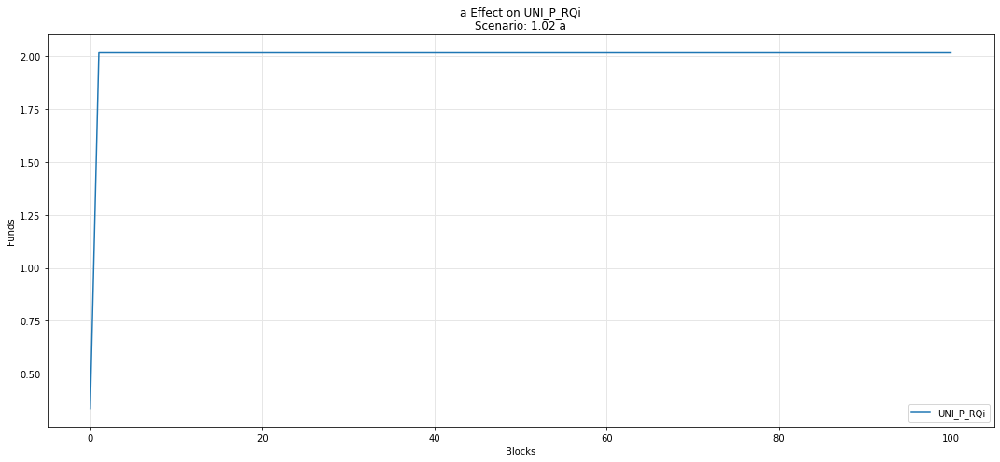

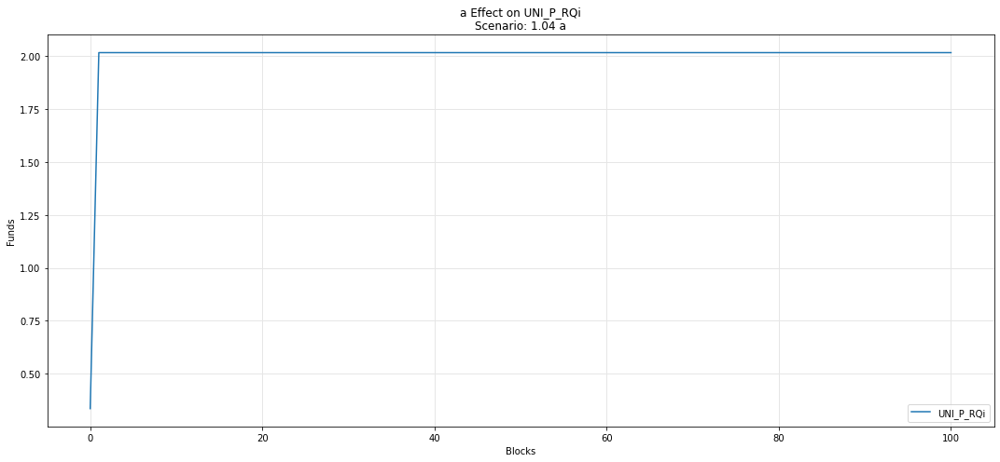

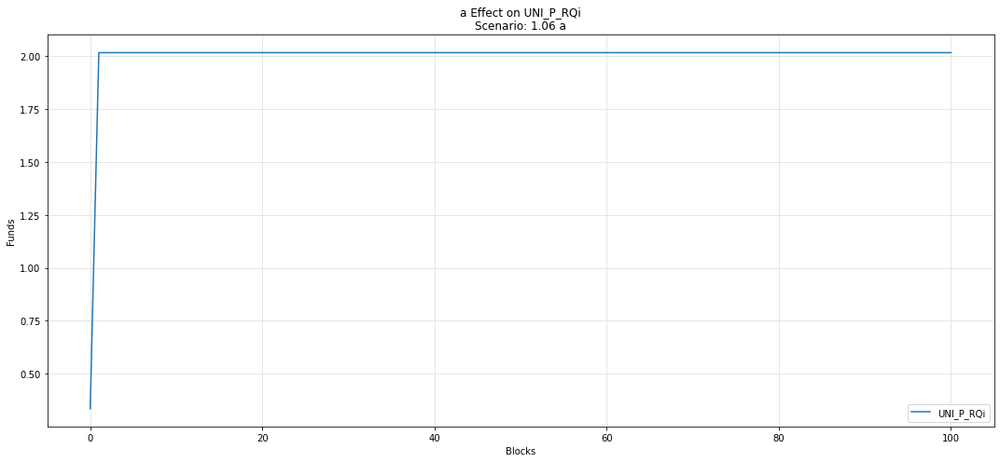

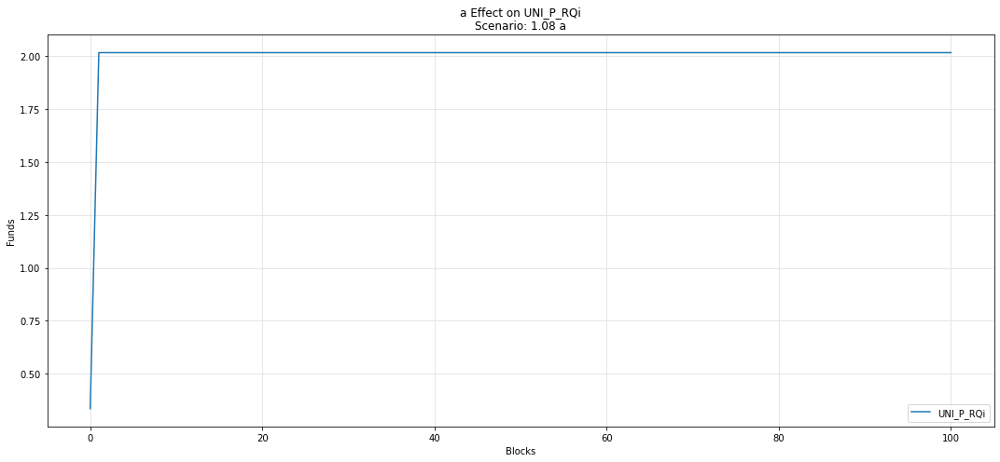

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

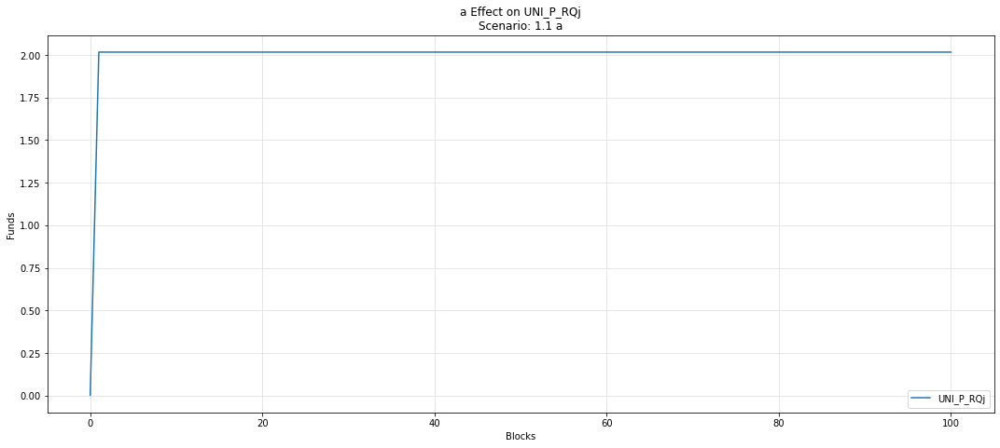

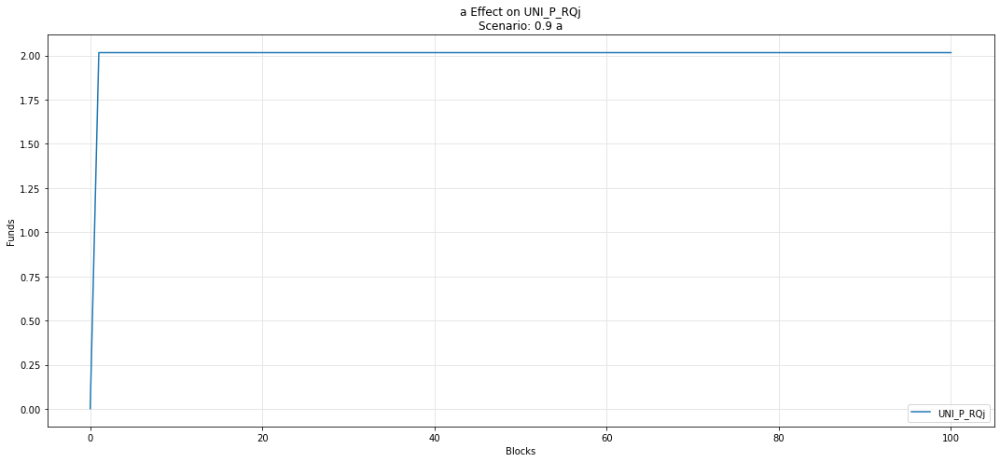

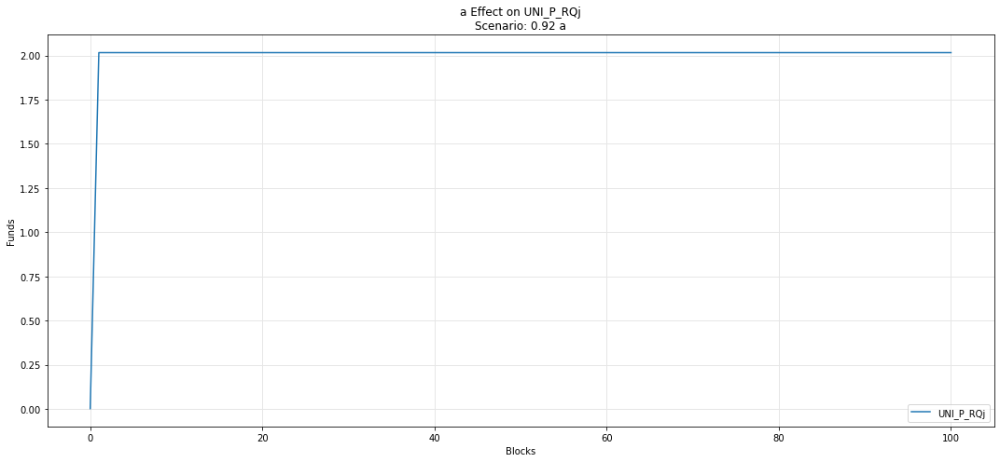

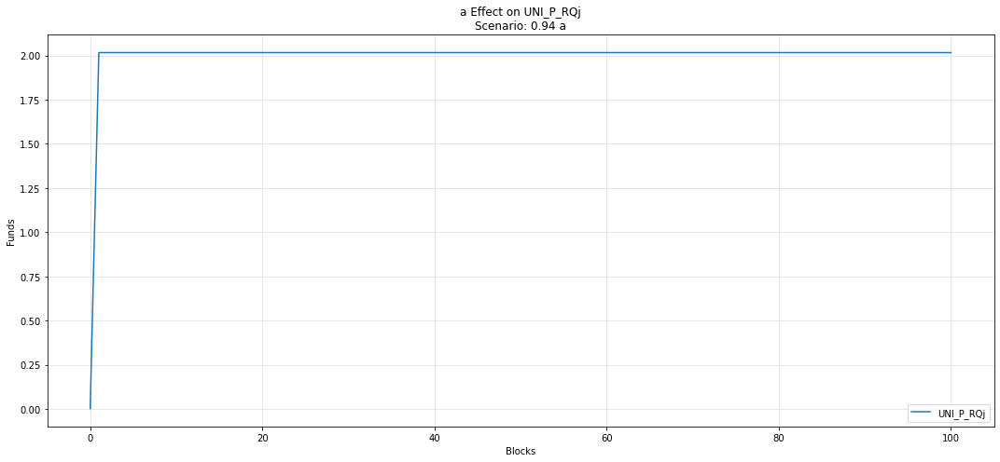

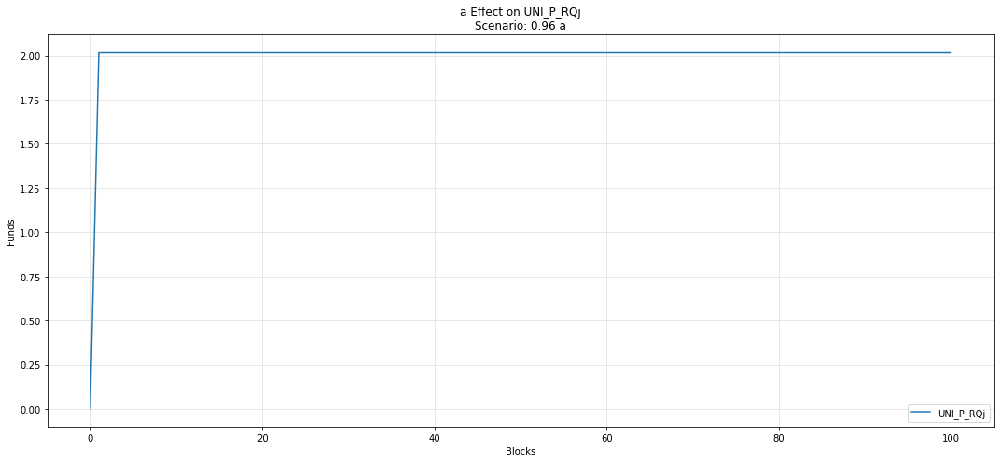

...

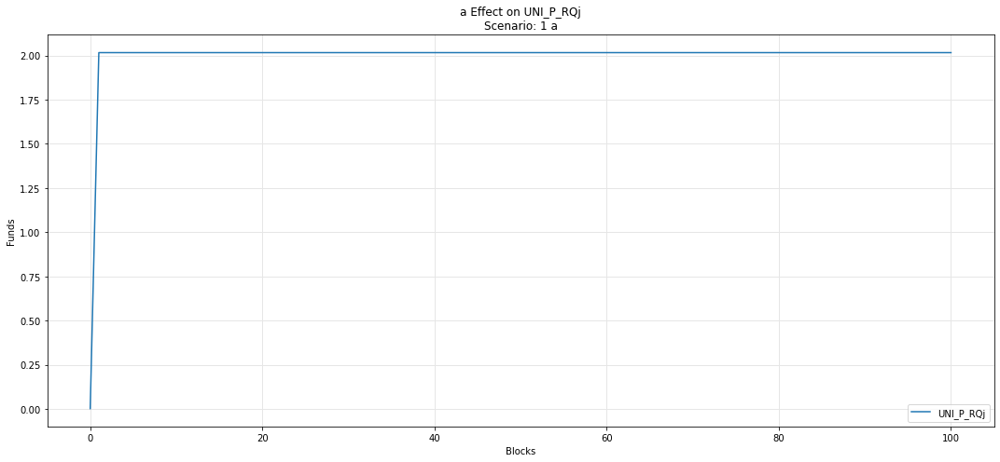

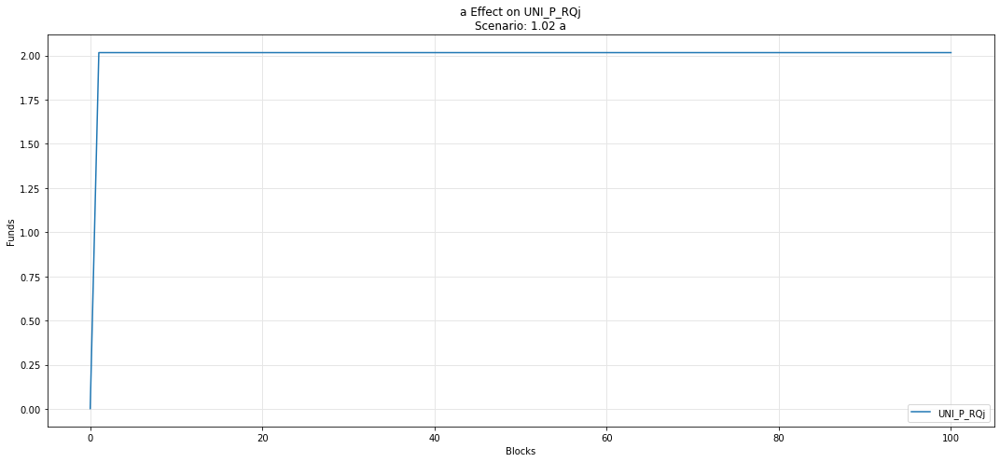

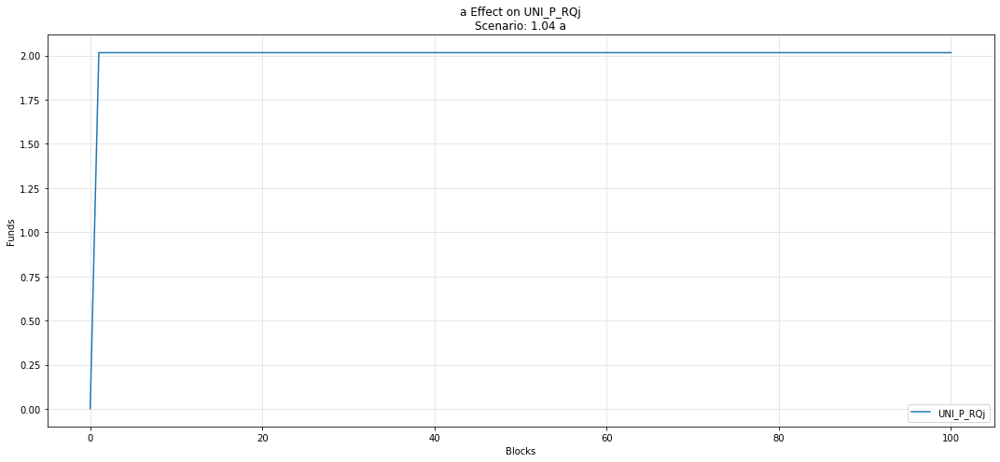

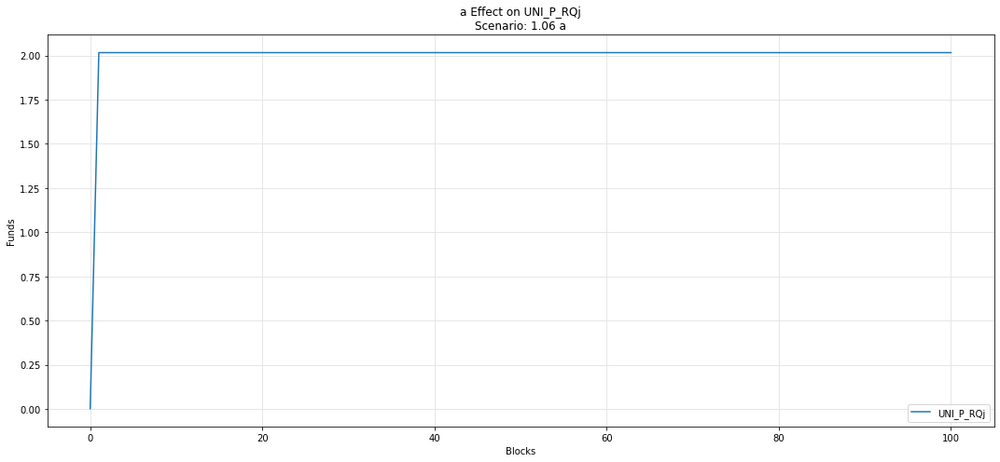

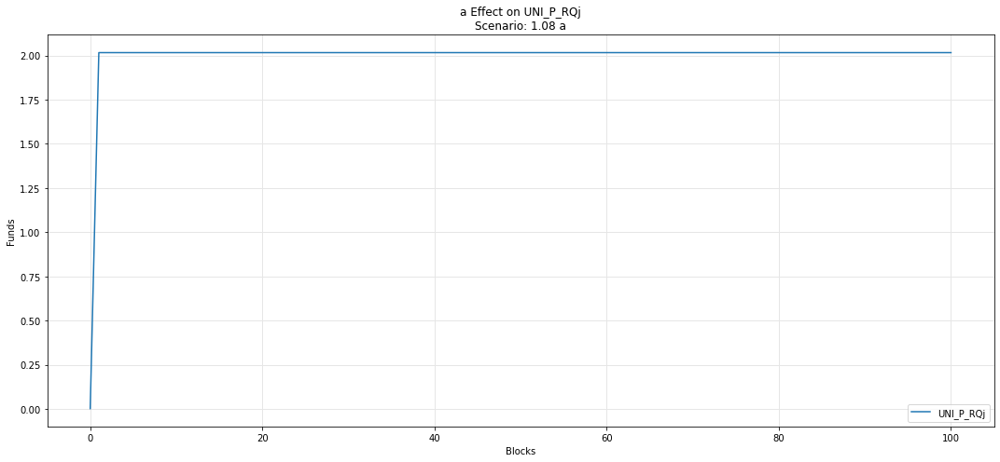

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

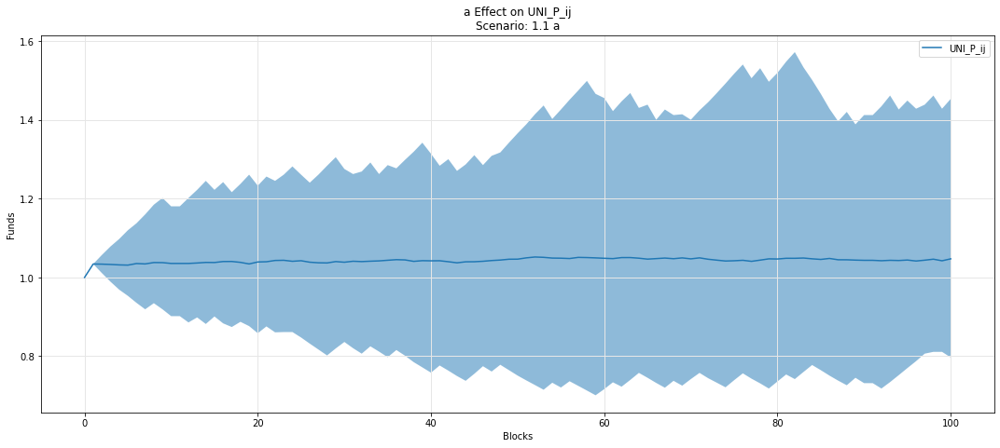

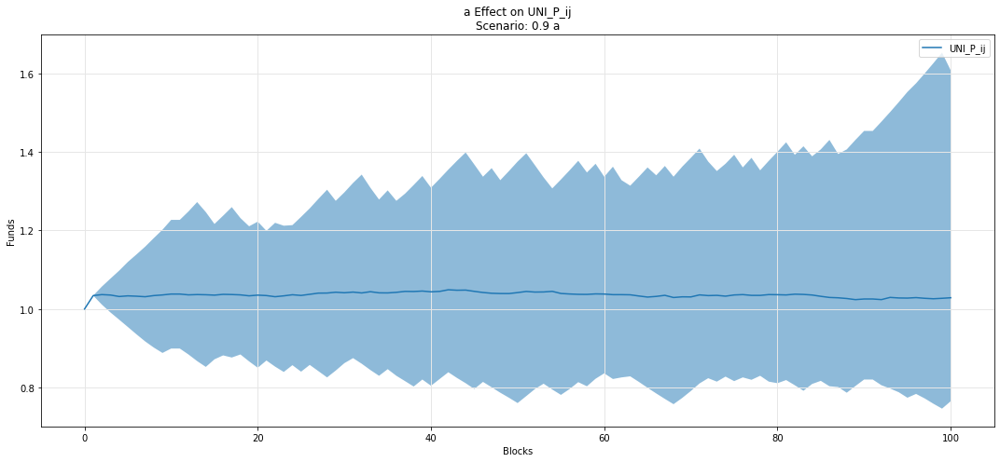

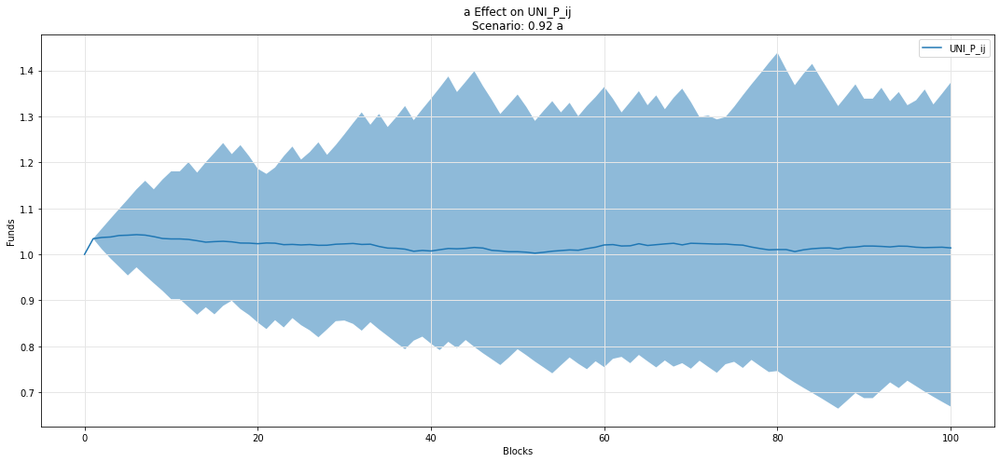

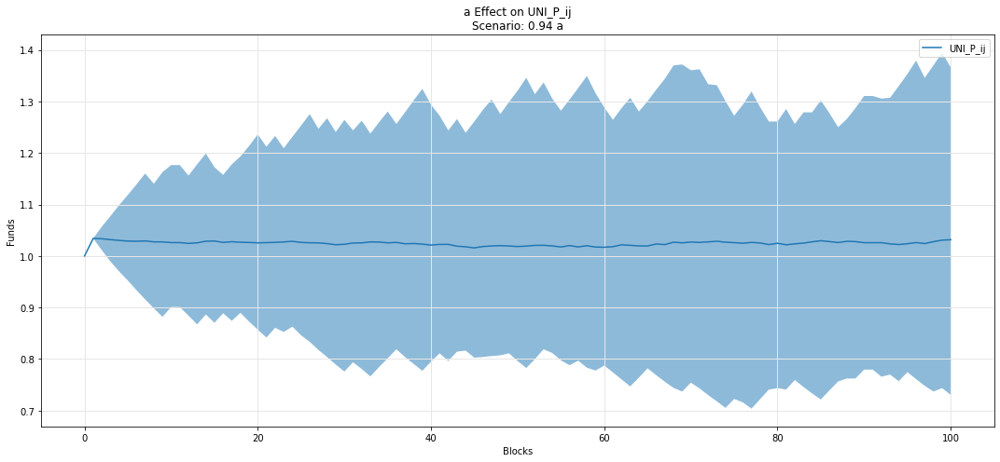

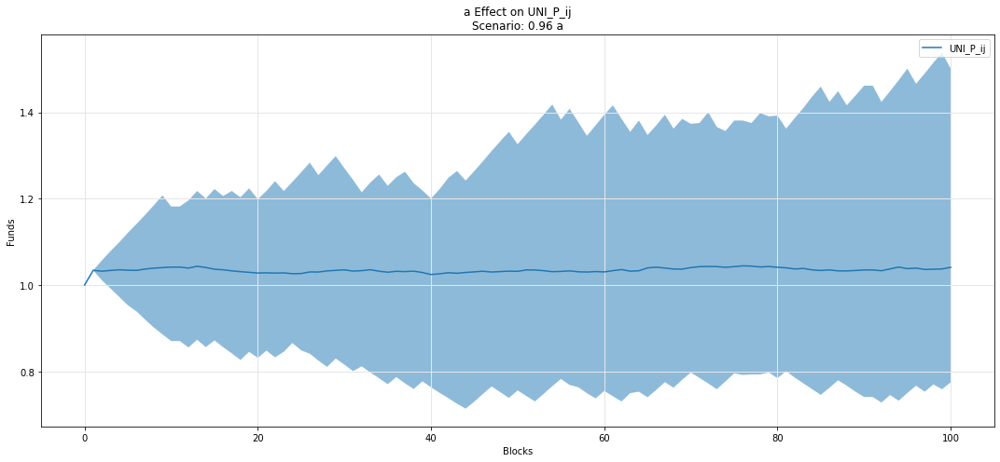

...

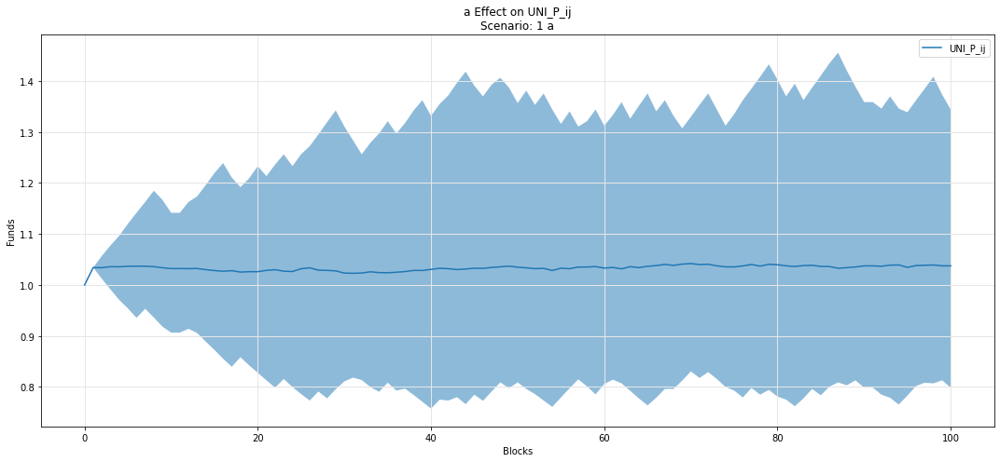

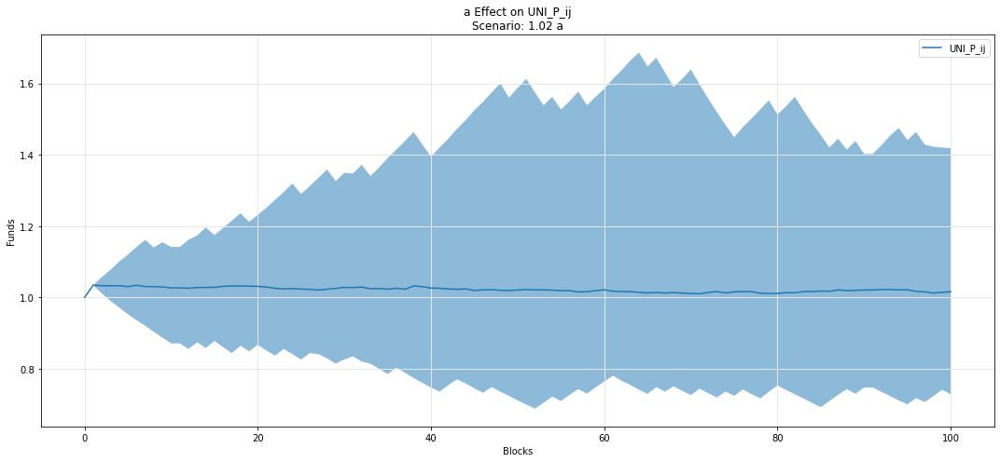

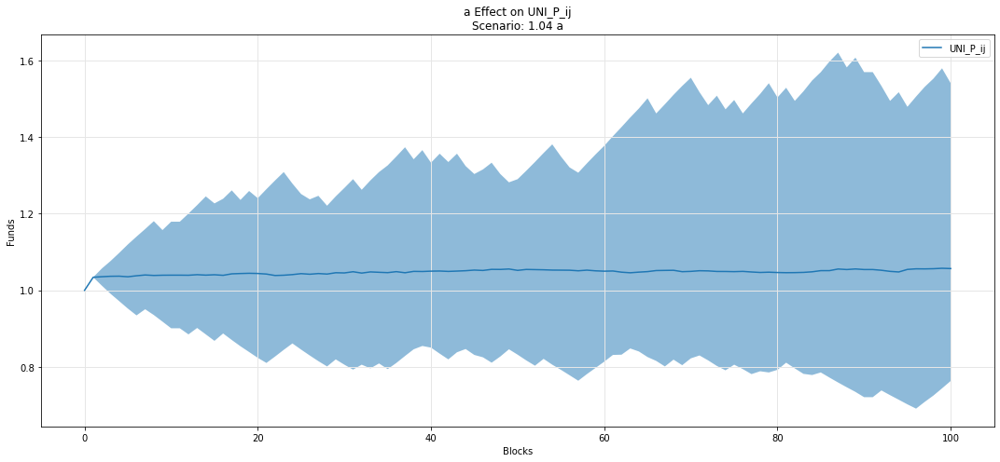

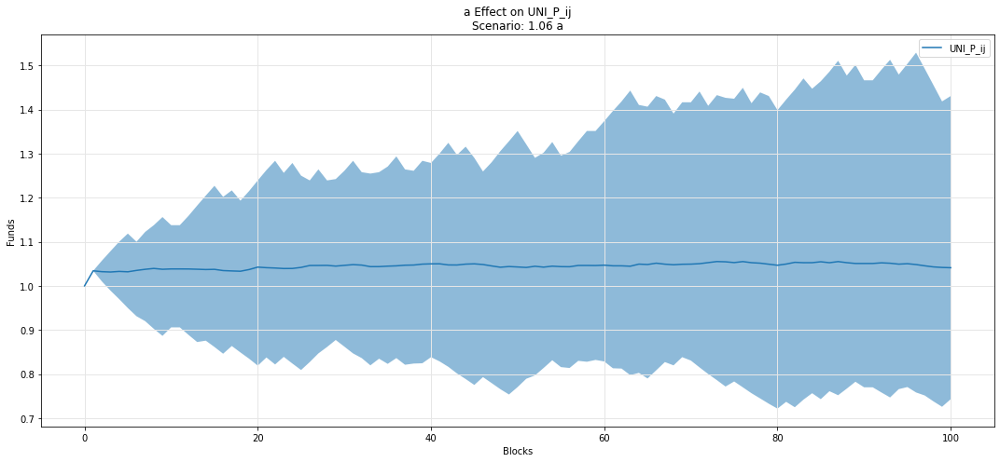

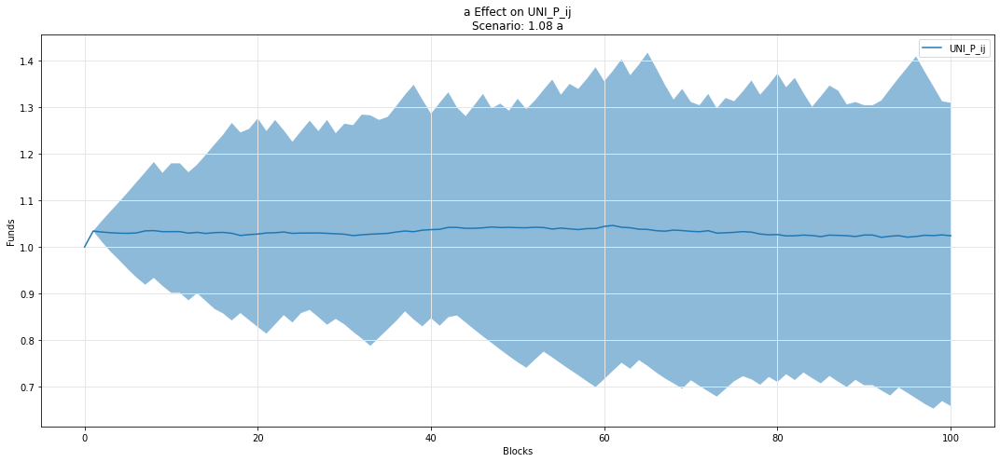

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

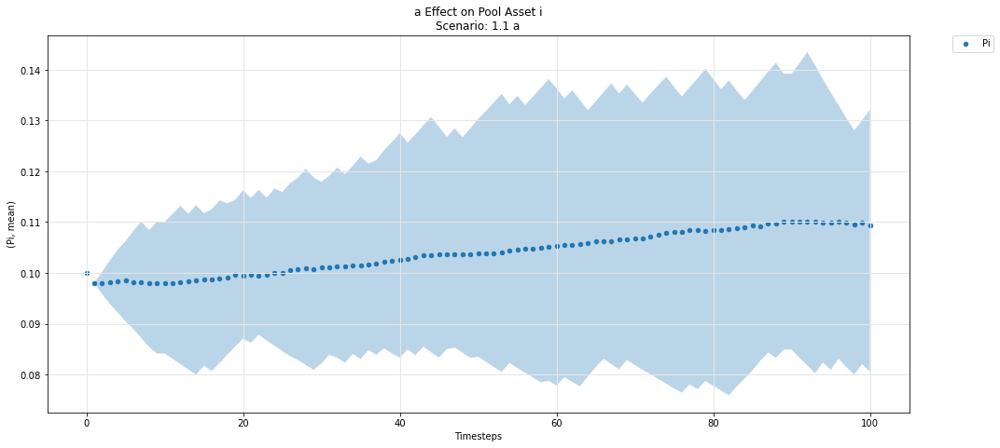

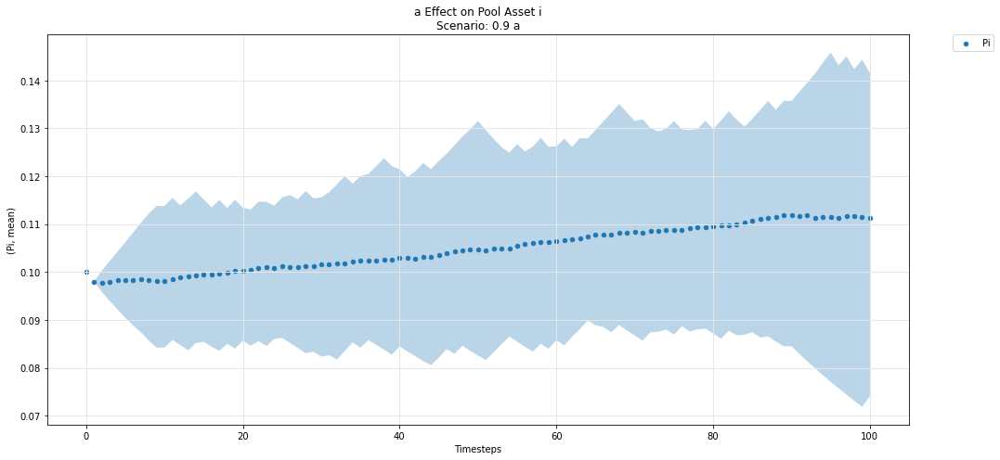

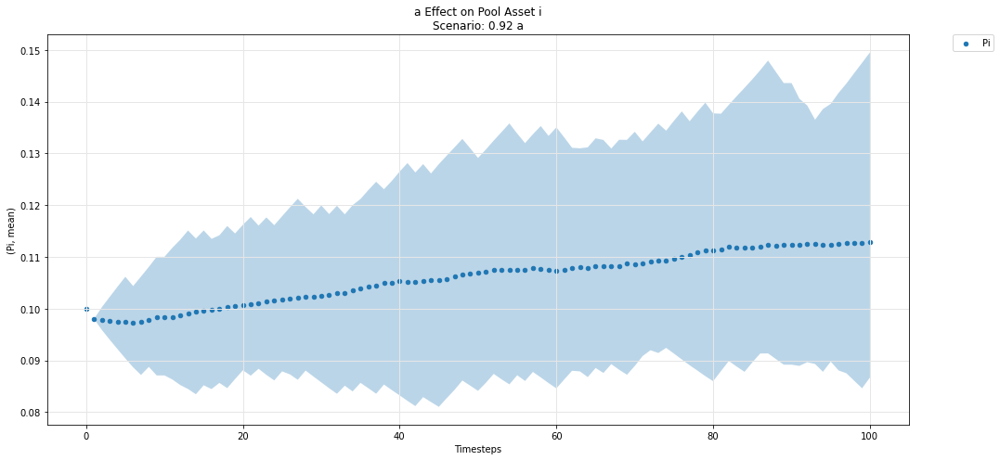

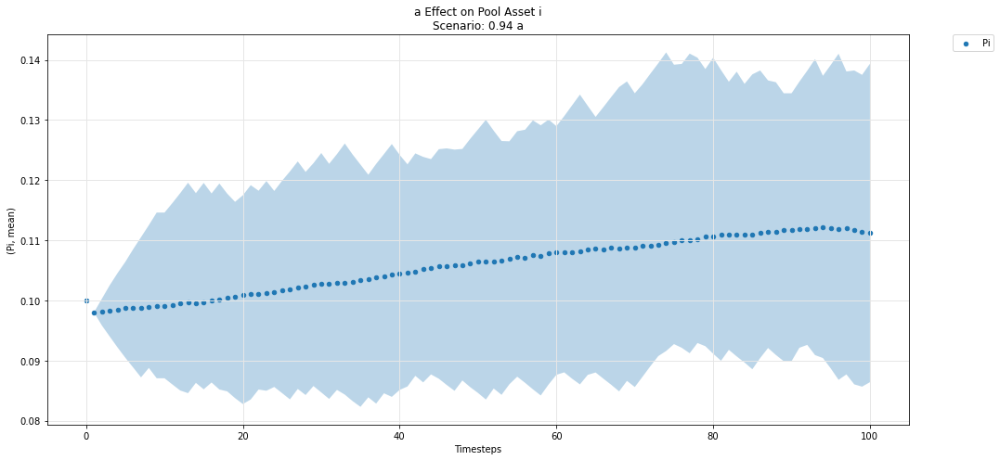

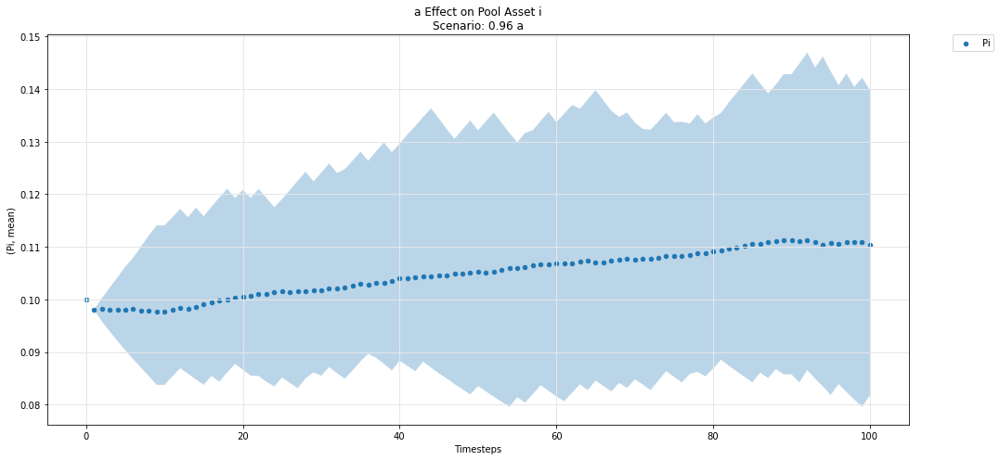

...

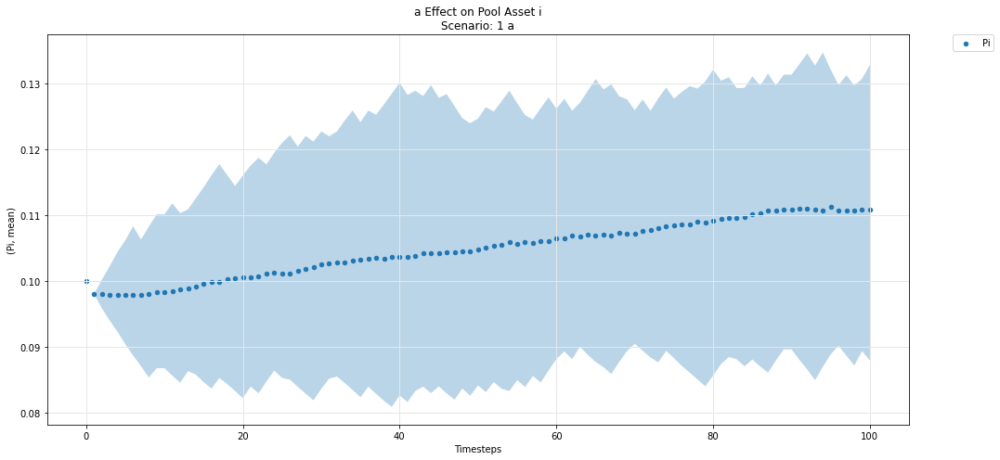

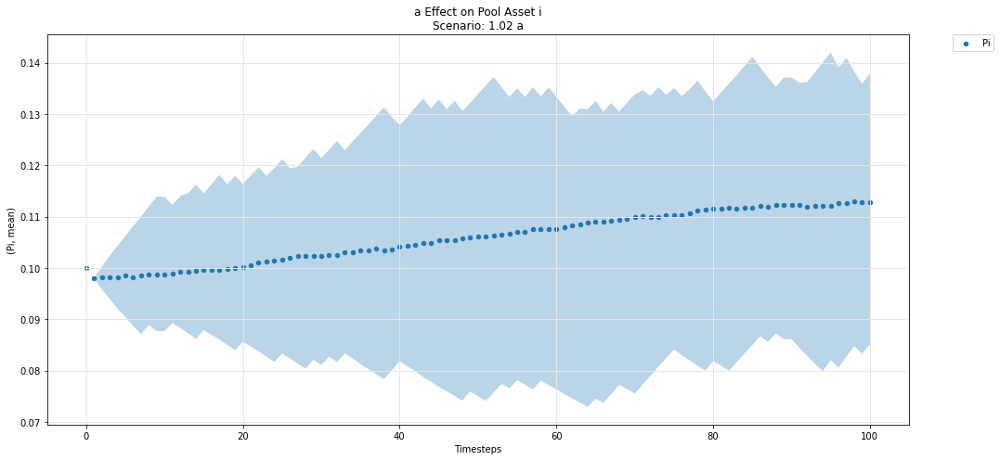

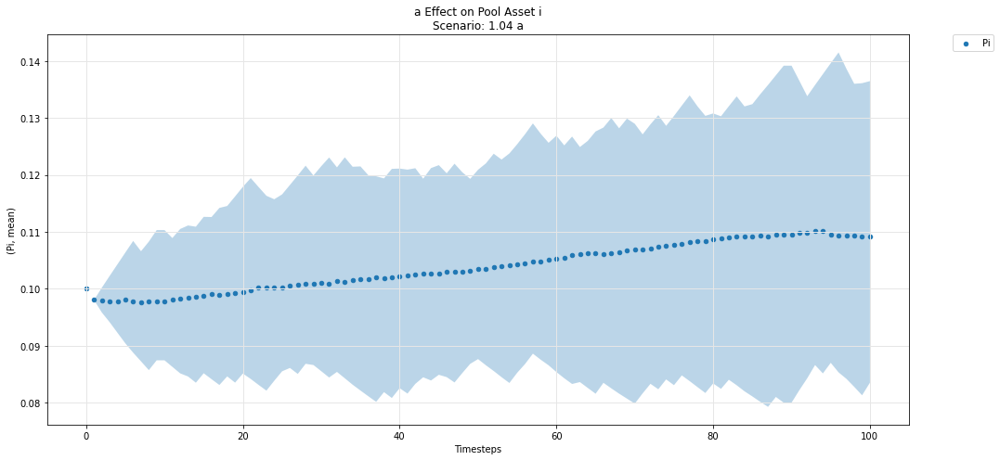

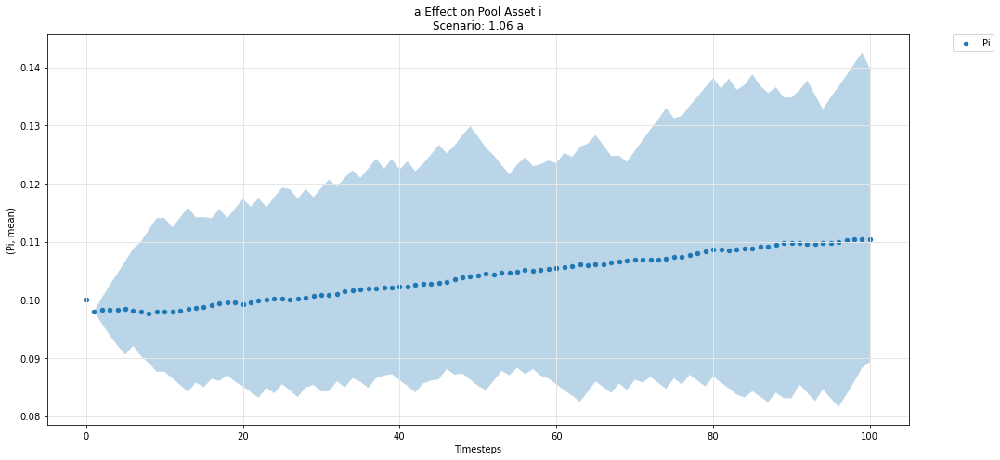

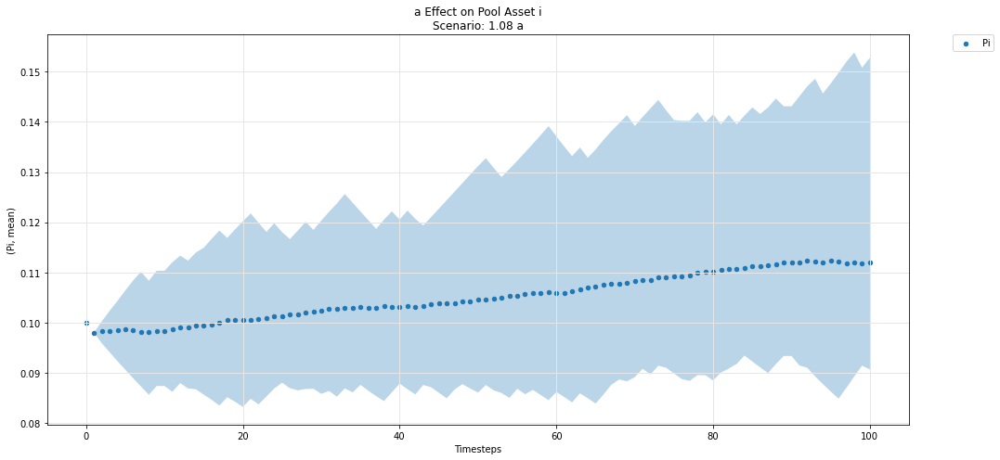

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

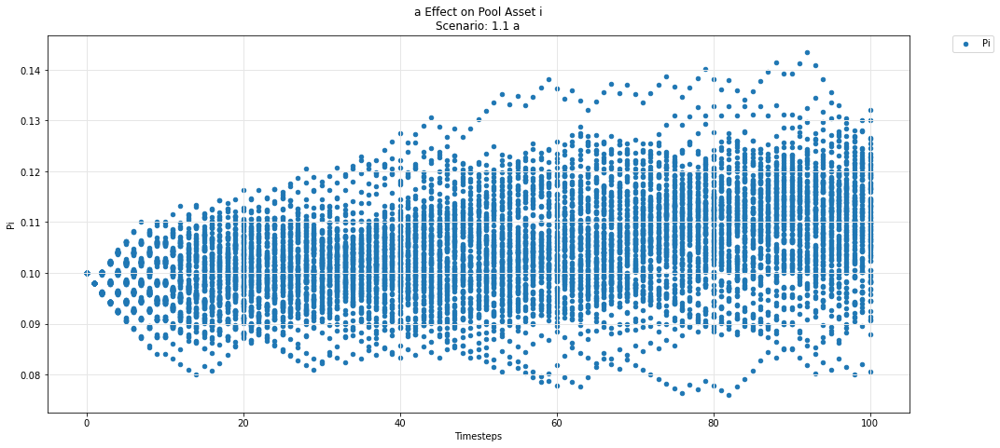

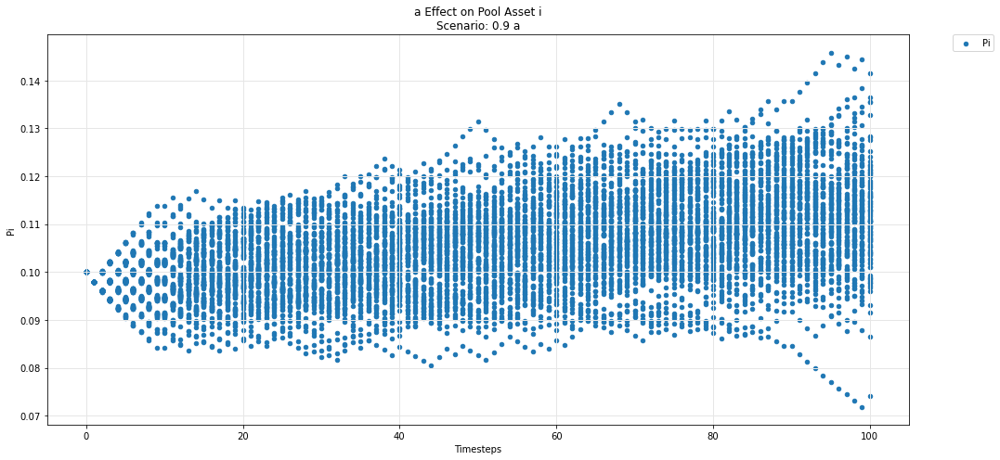

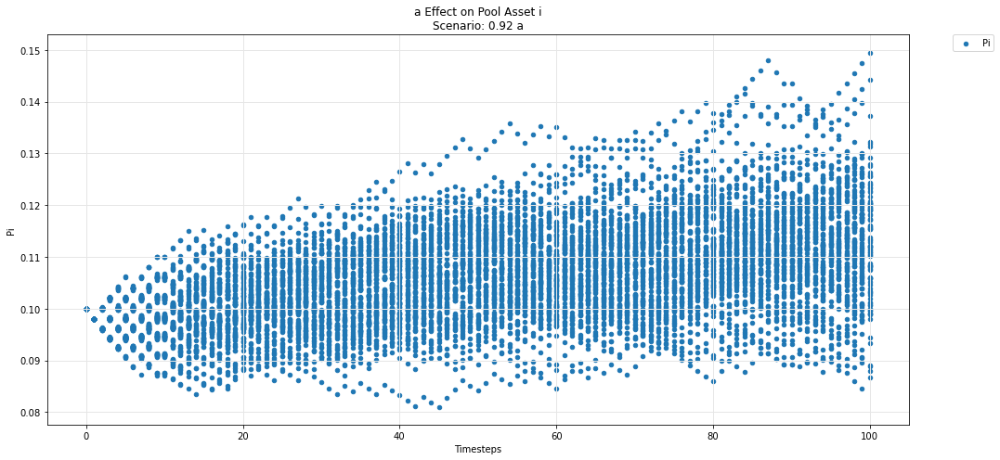

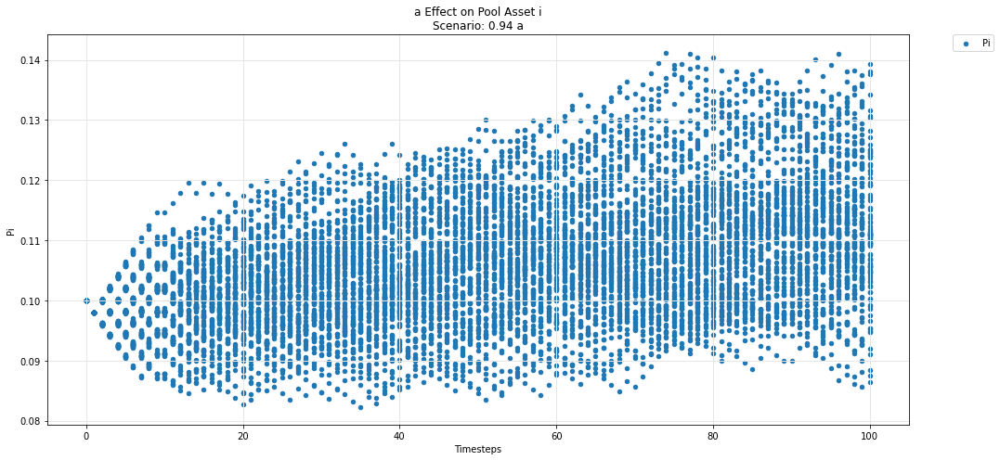

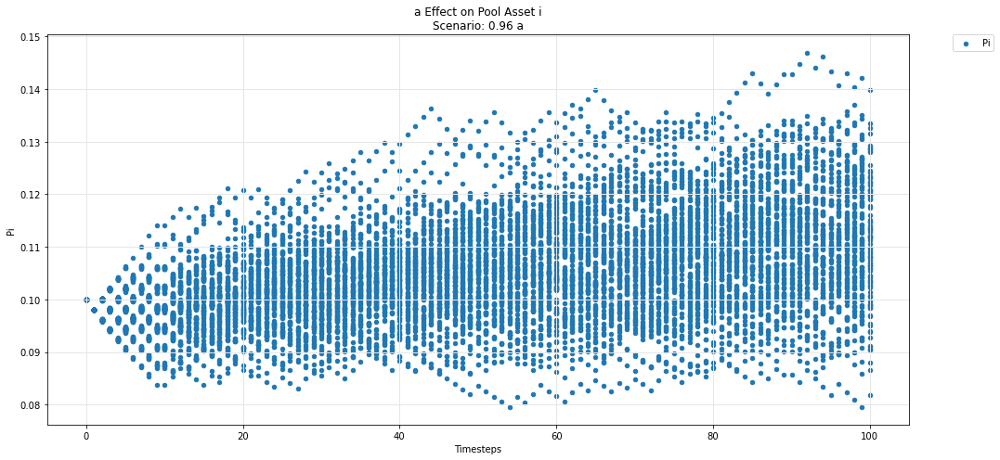

...

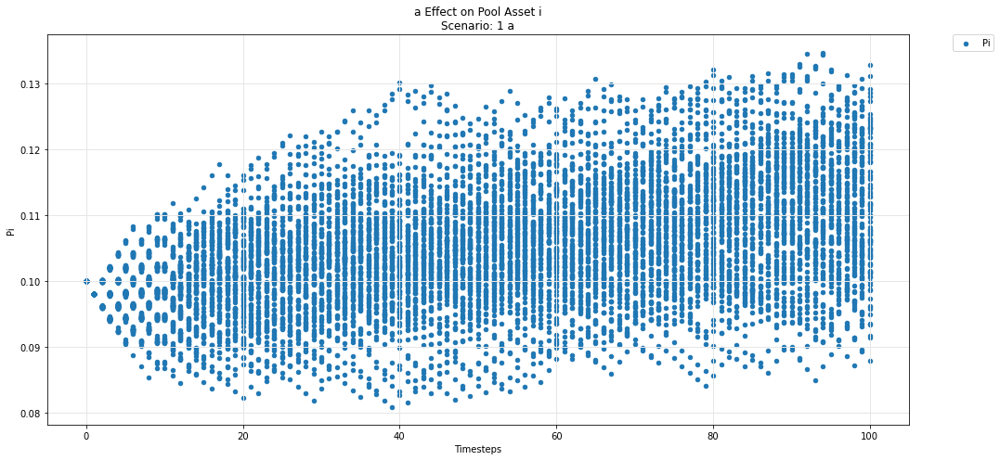

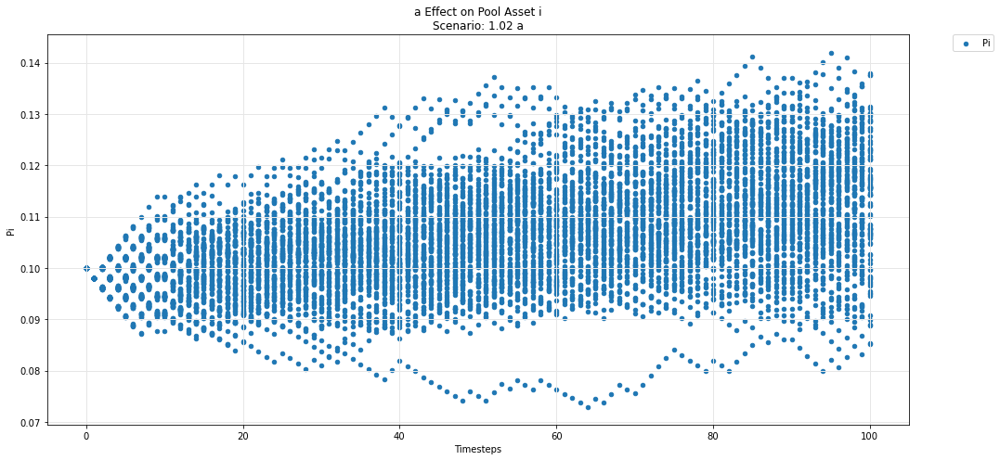

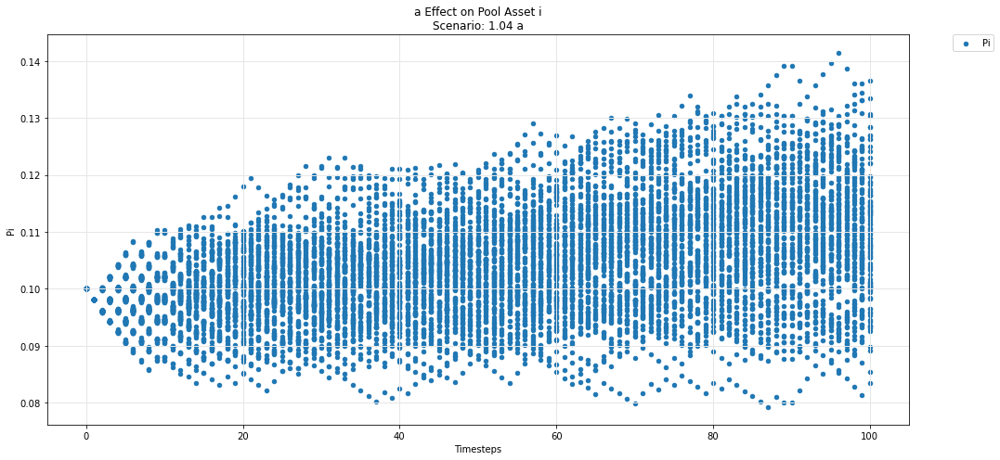

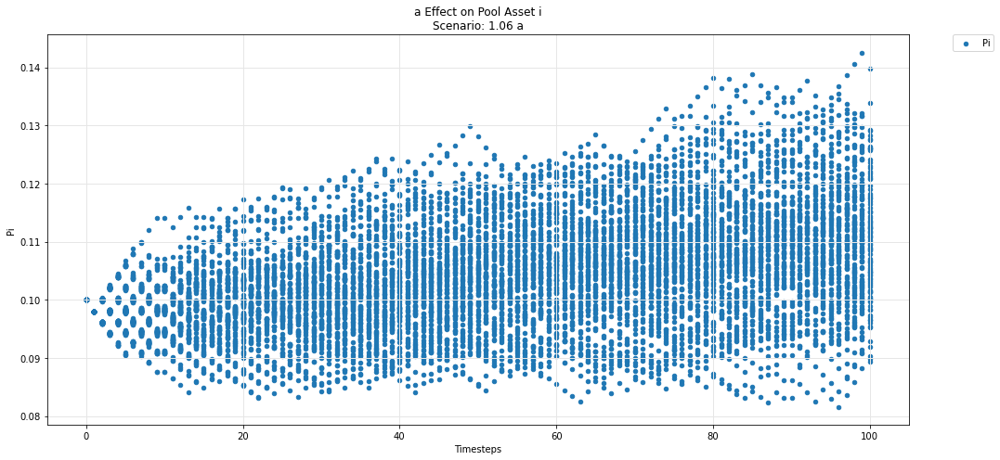

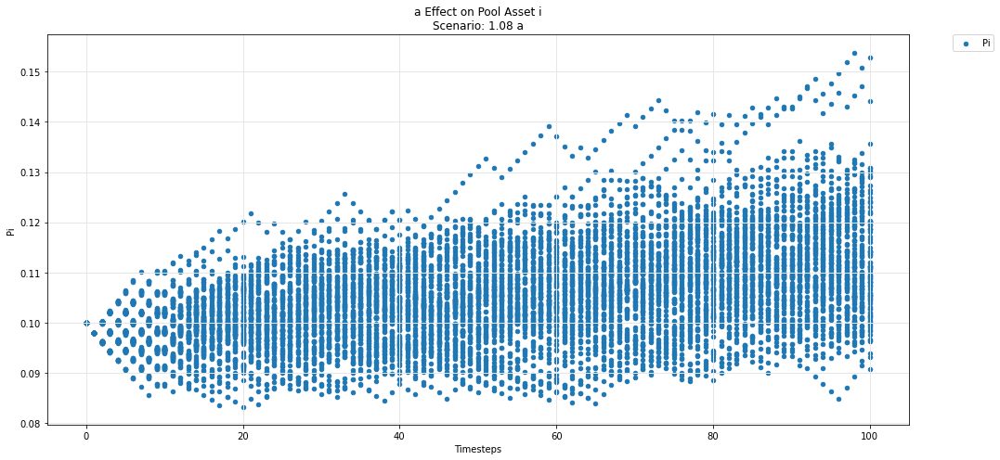

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

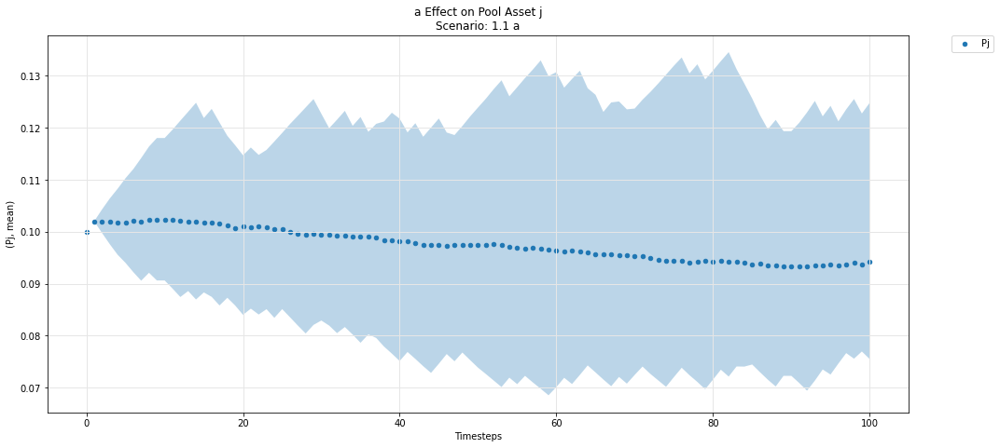

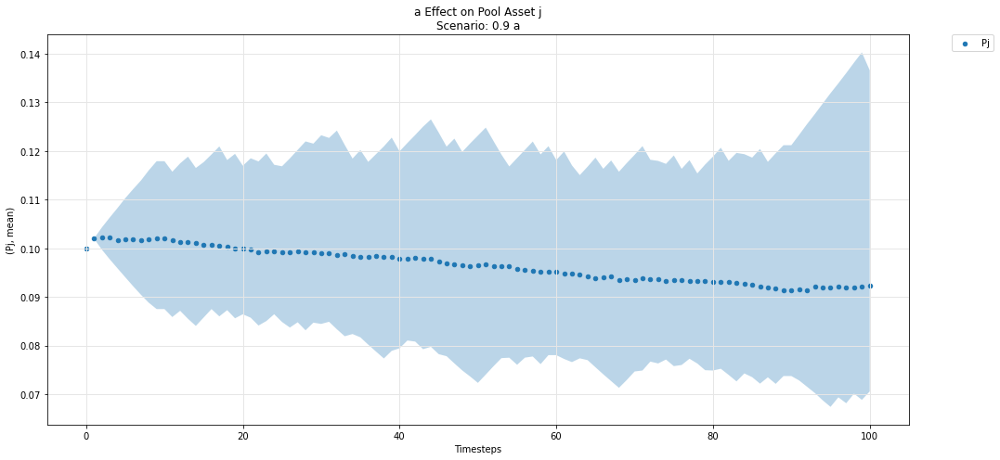

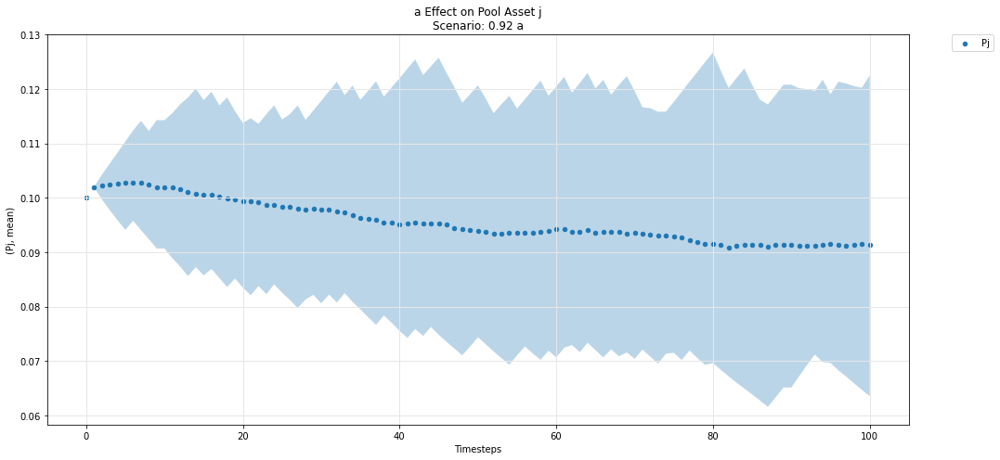

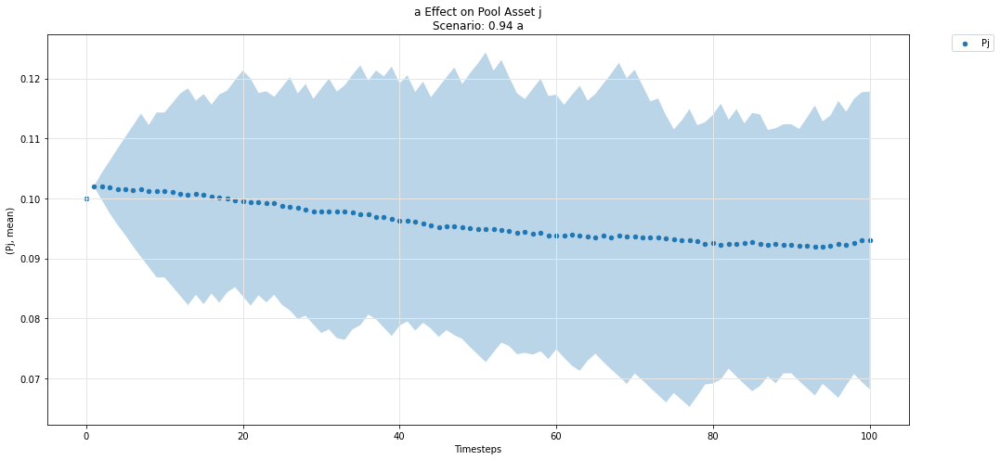

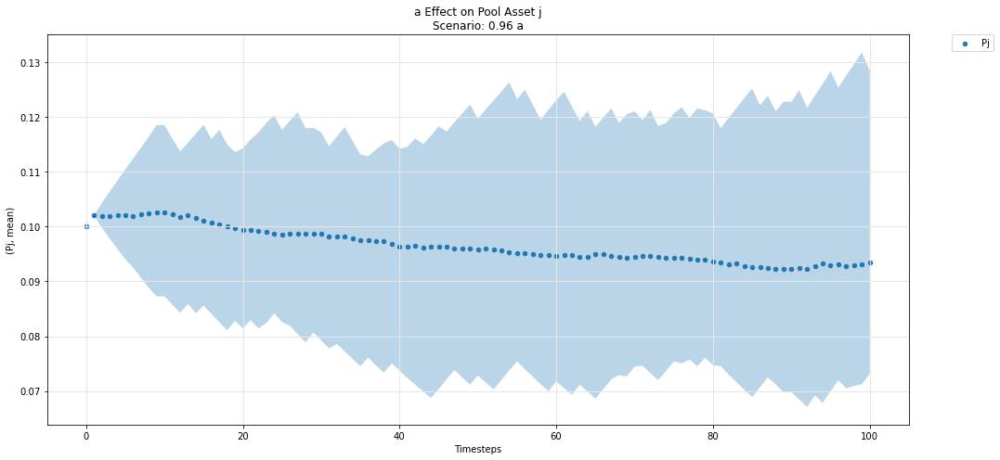

...

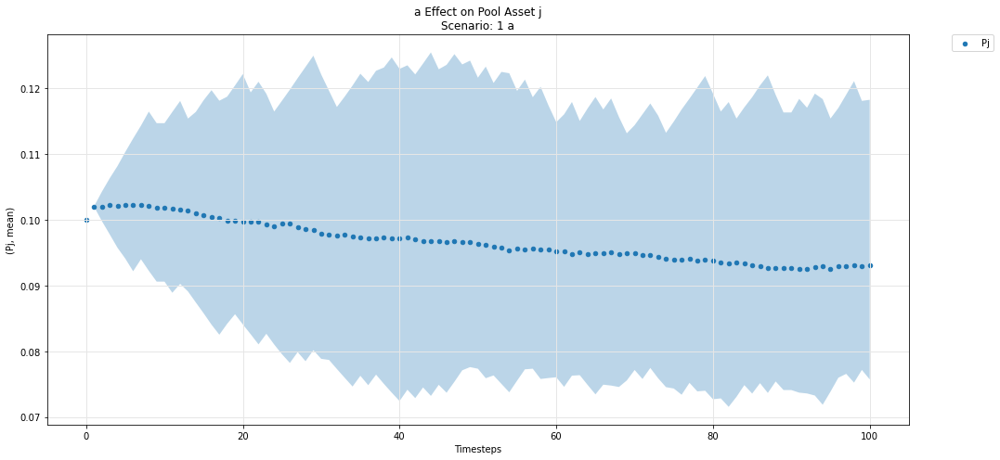

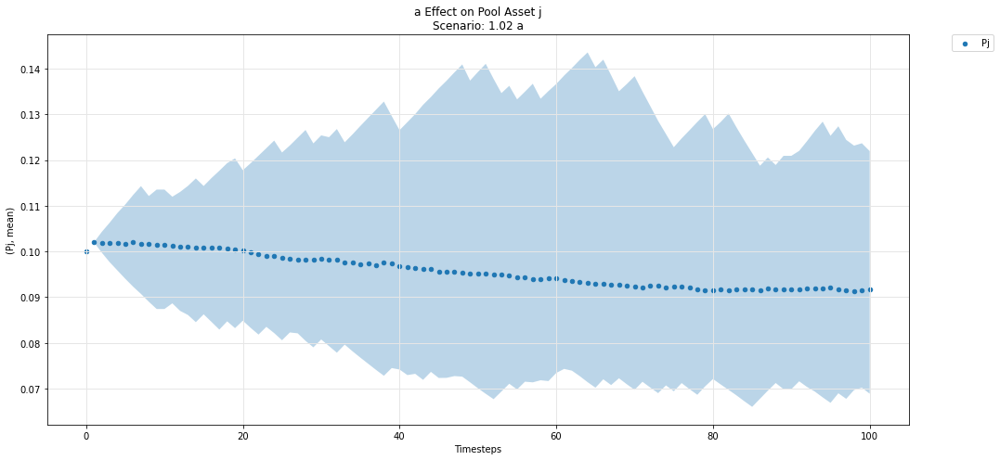

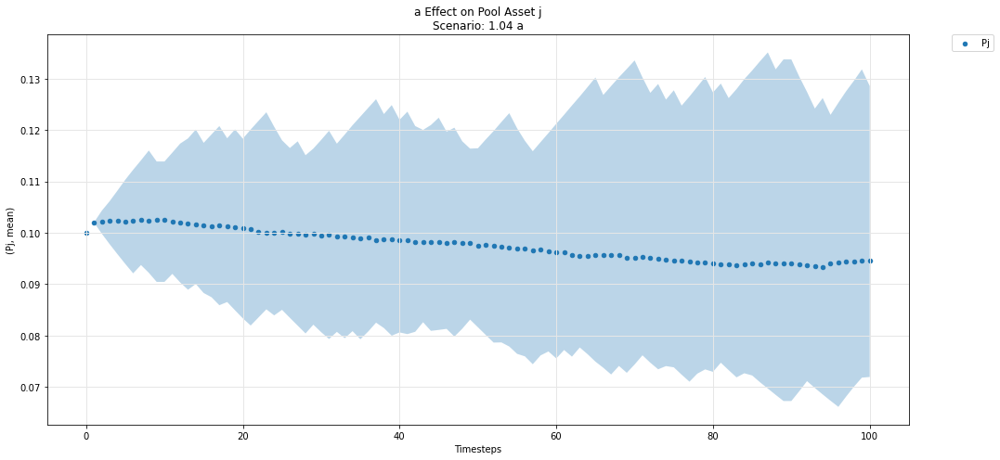

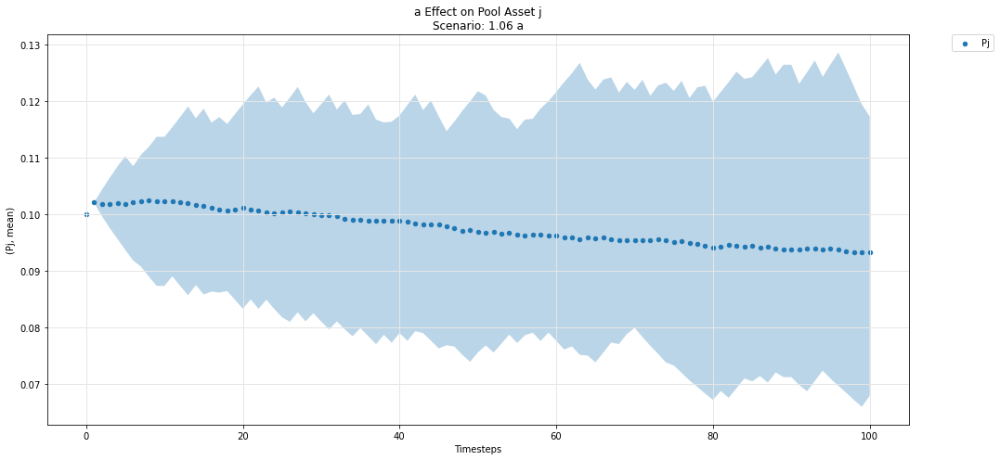

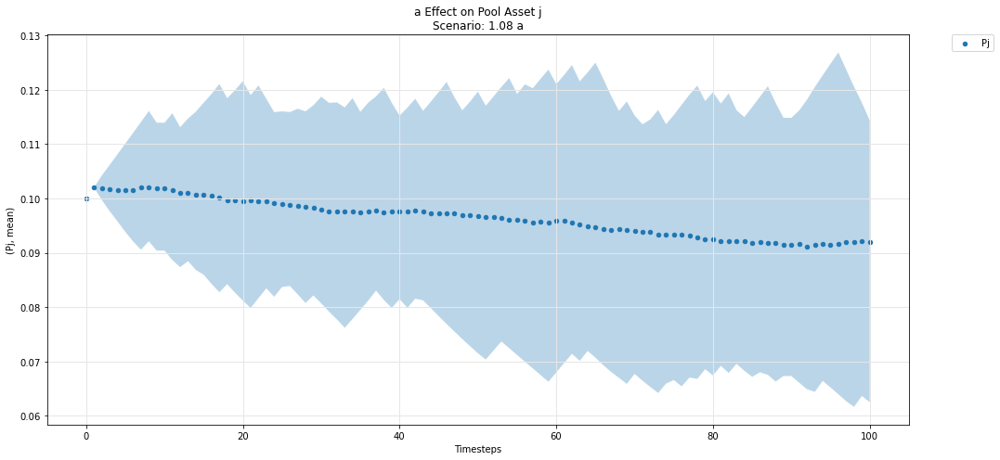

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

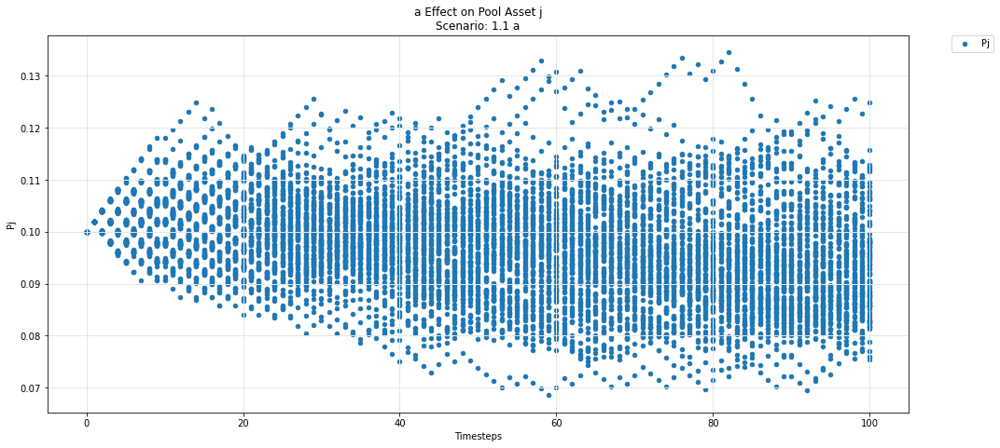

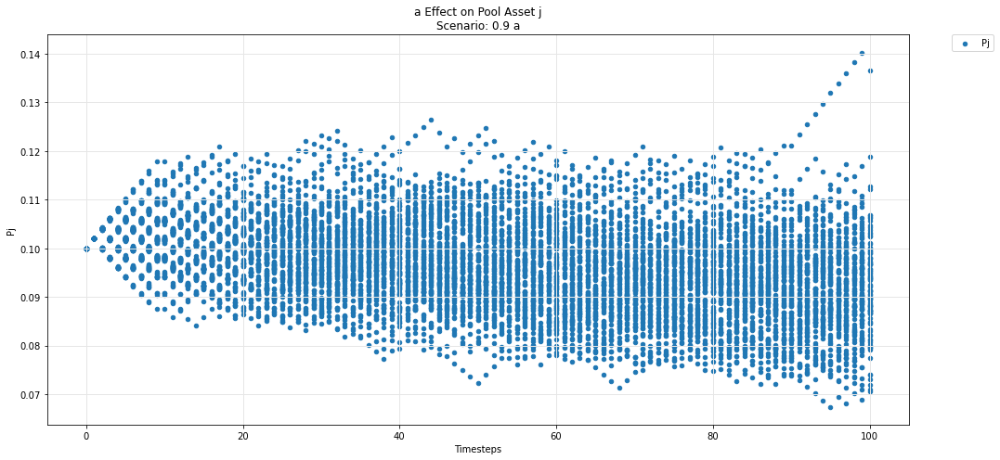

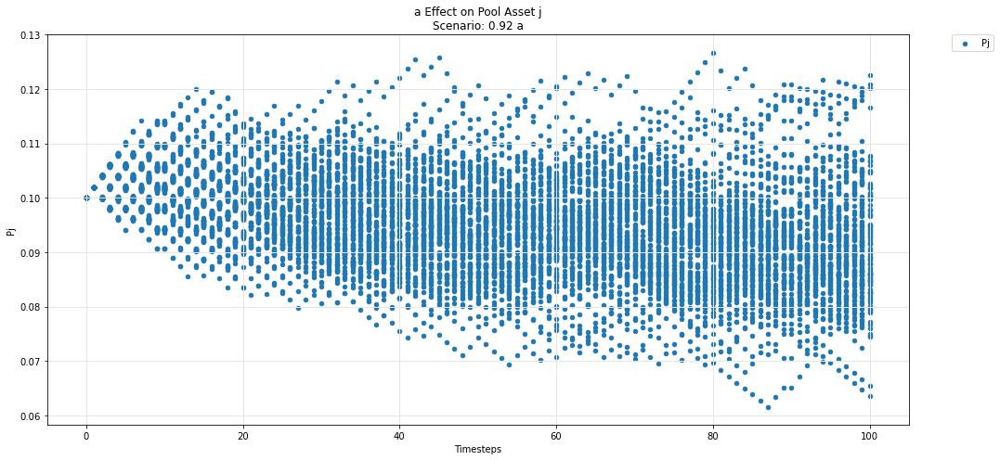

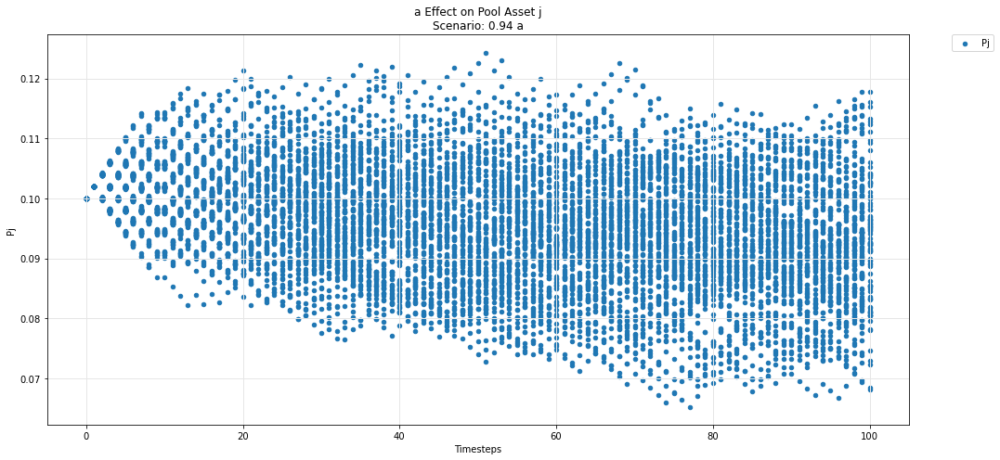

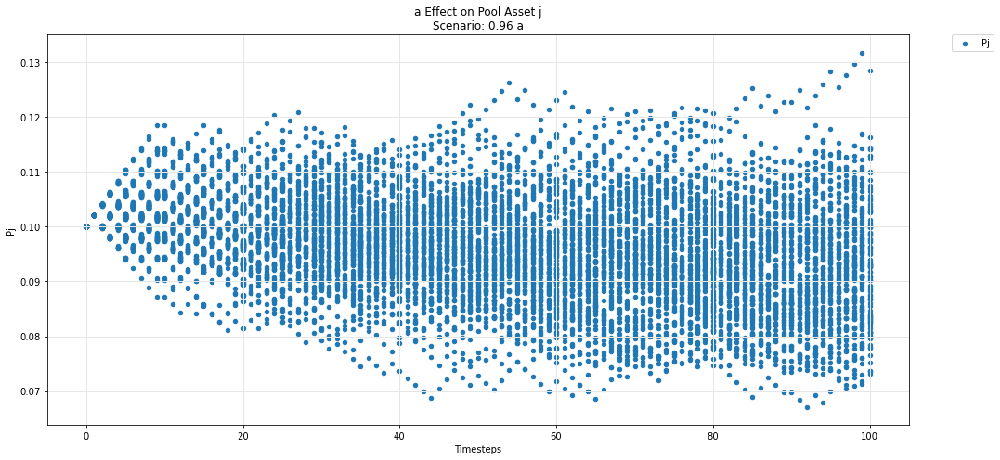

...

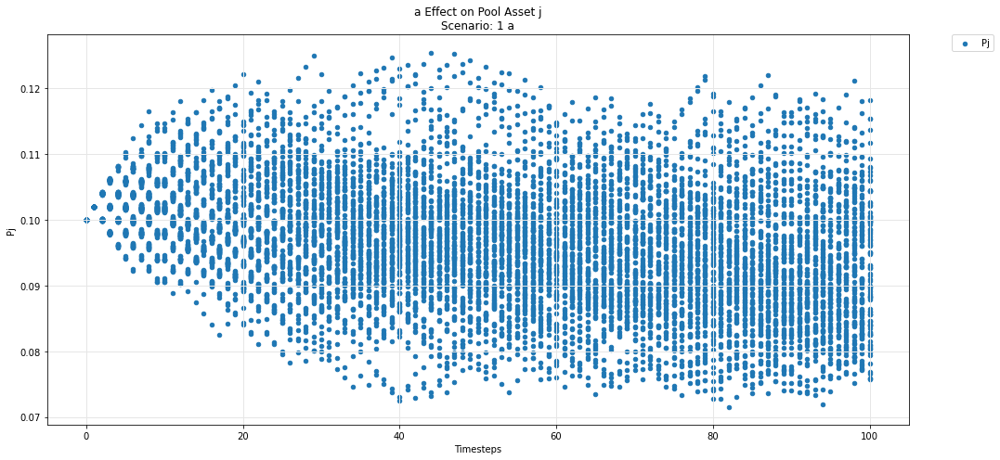

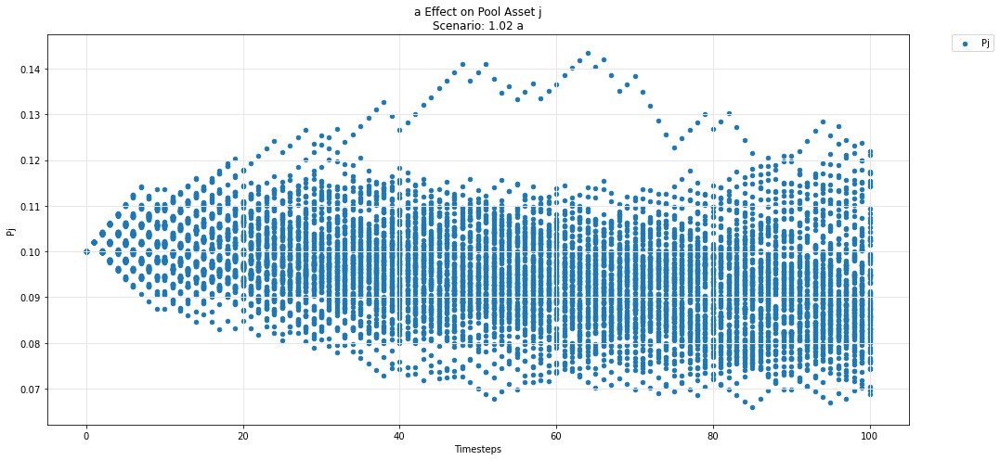

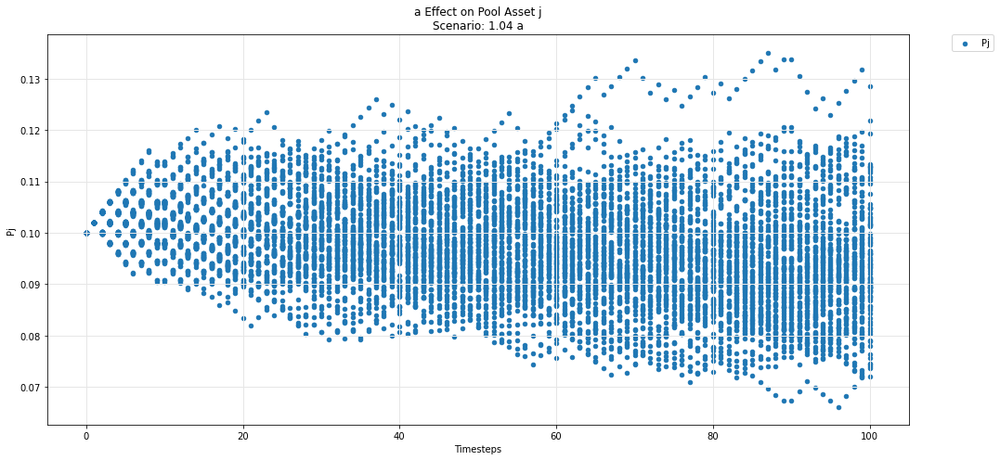

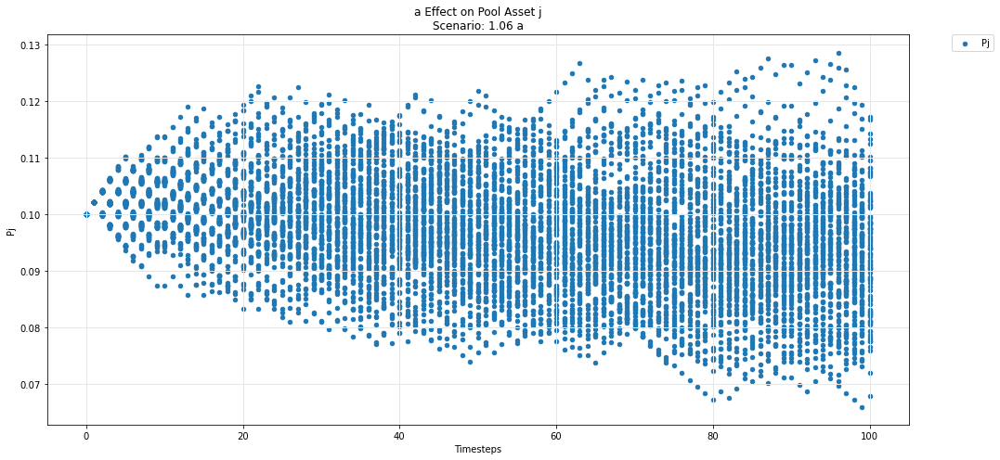

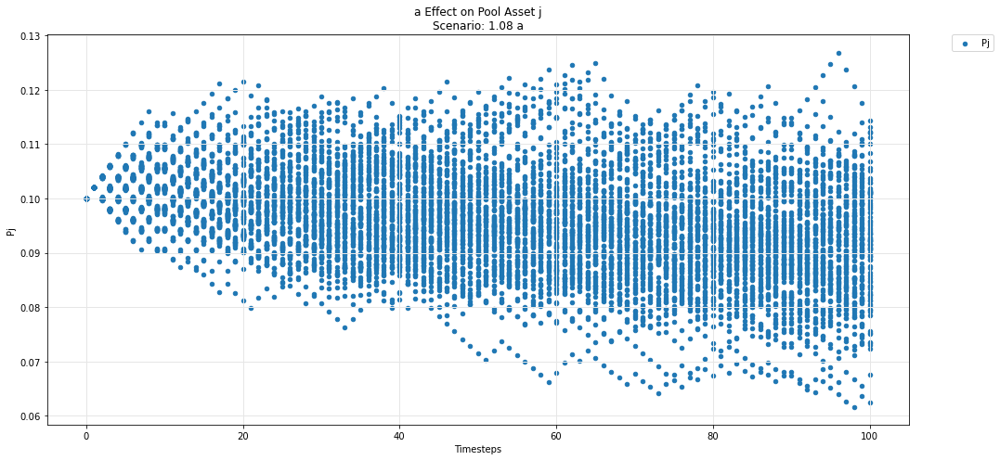

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

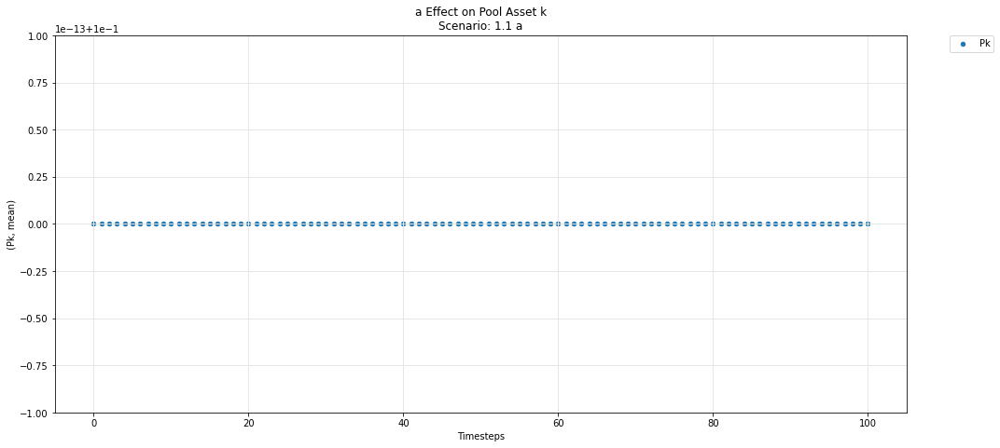

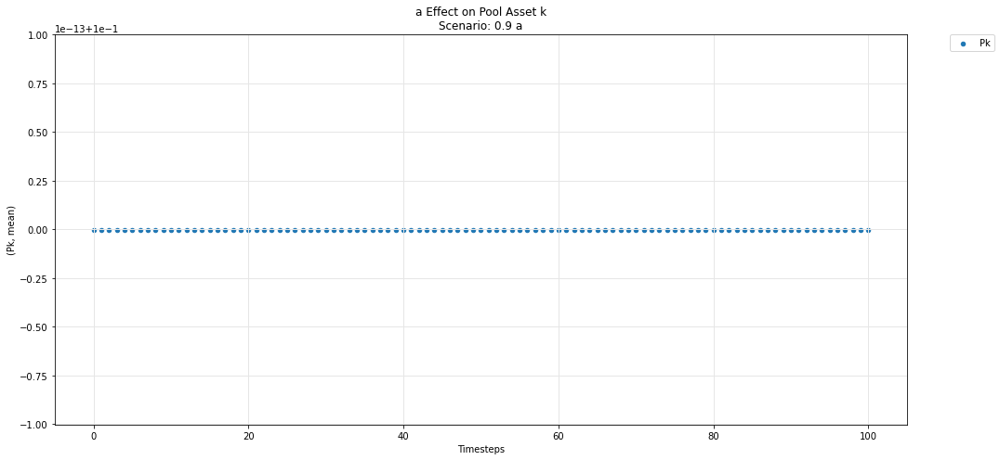

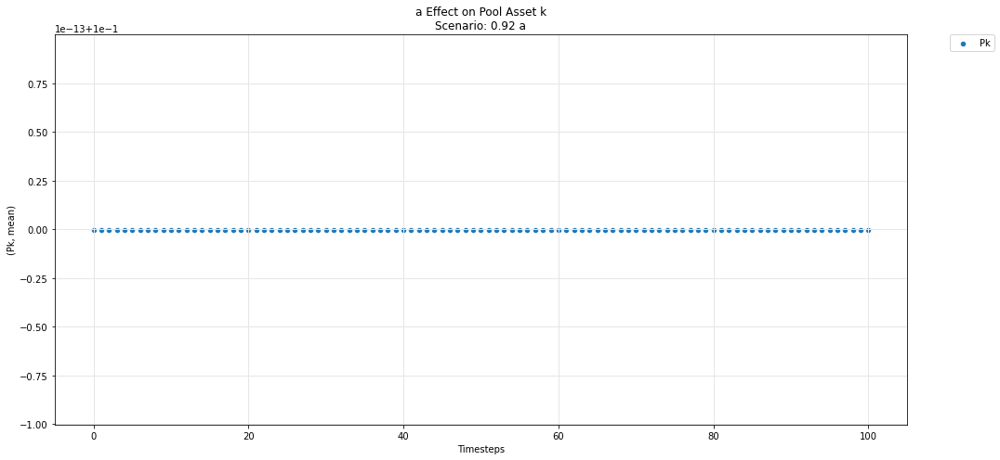

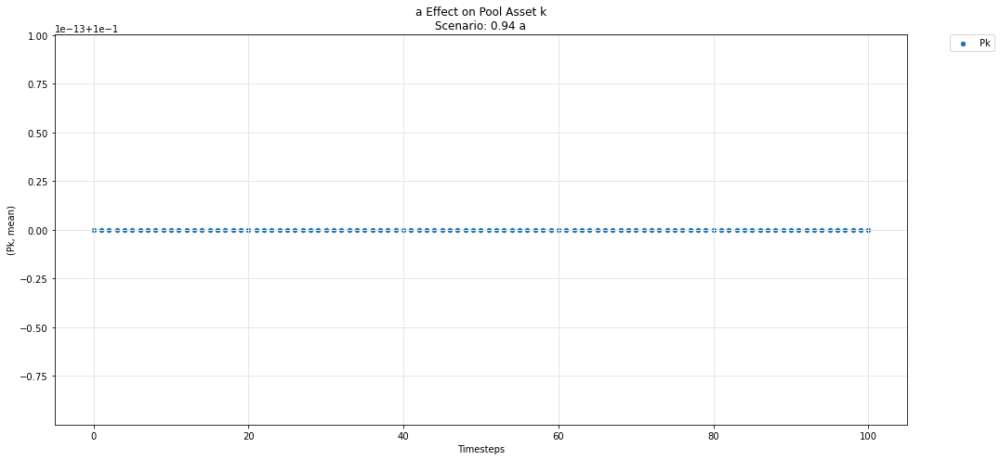

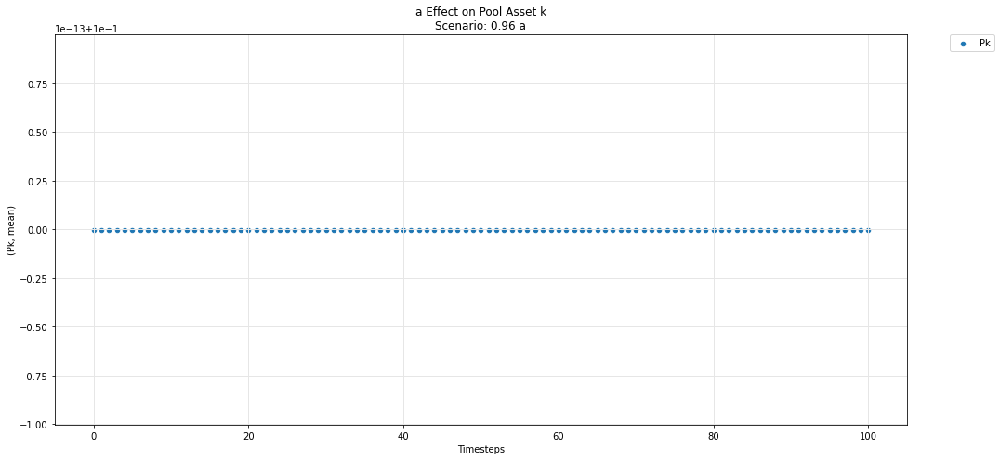

...

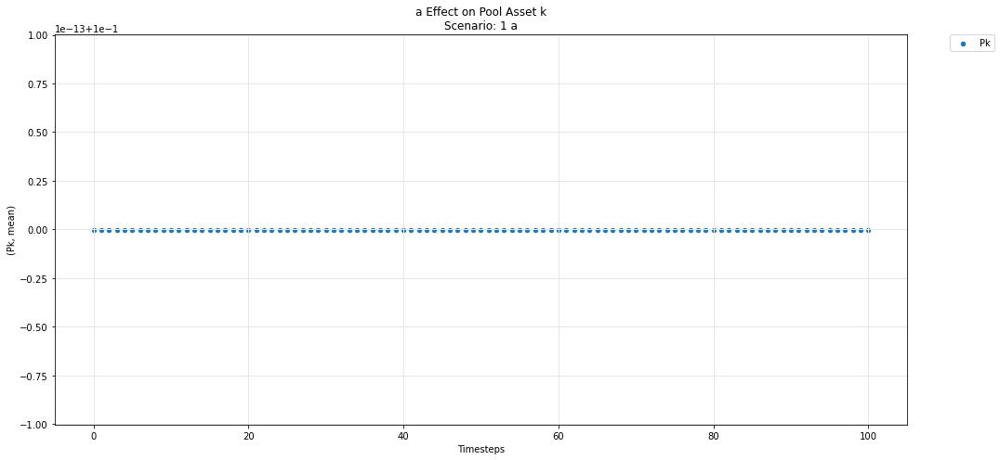

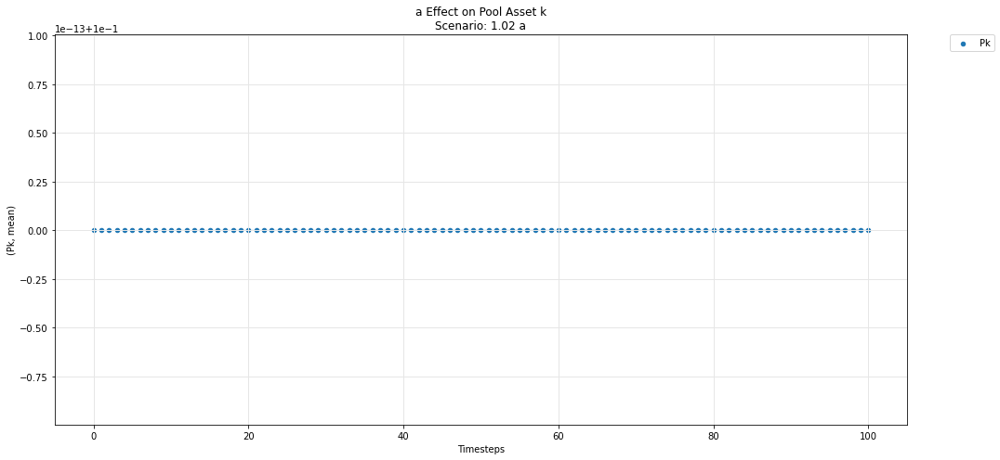

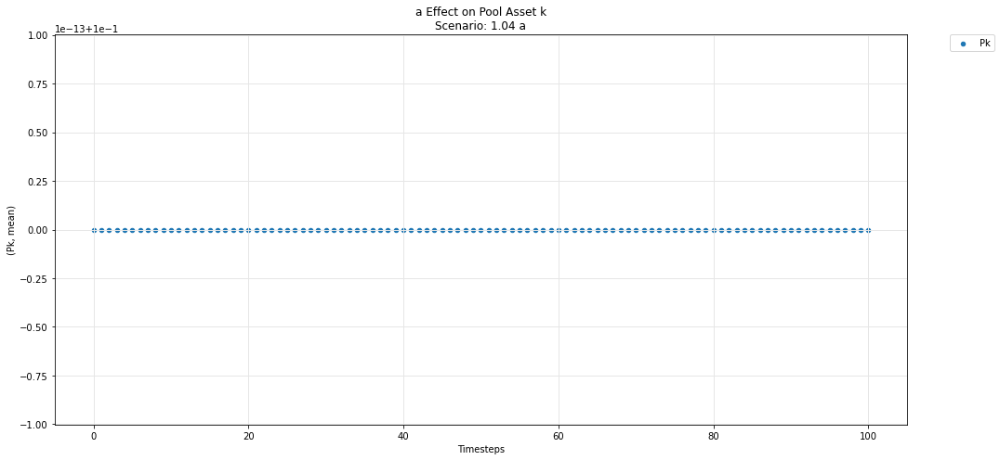

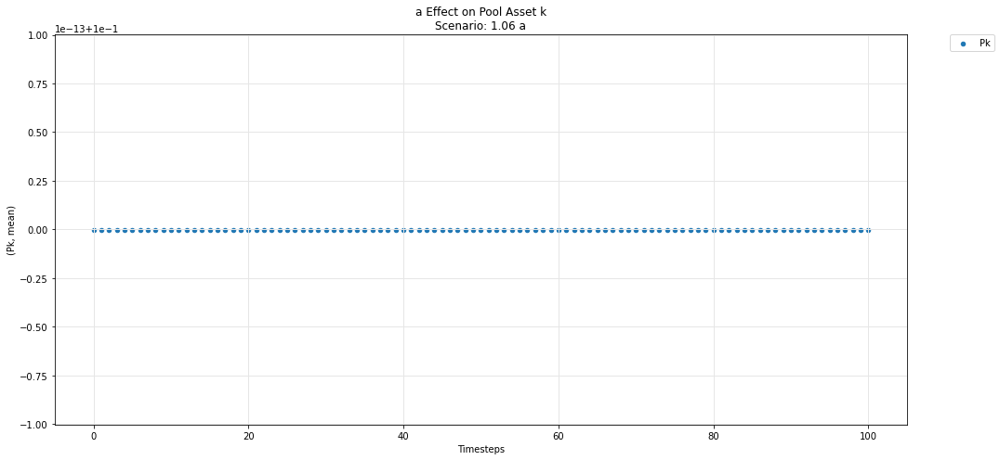

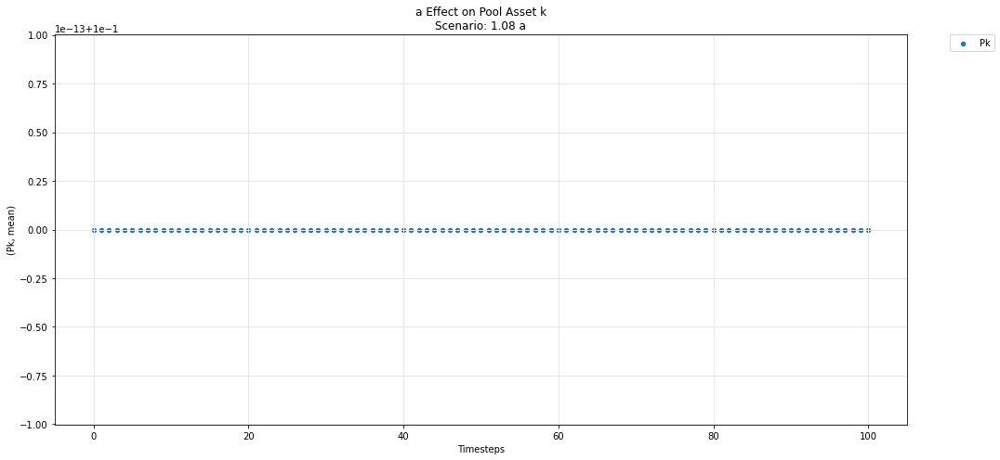

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

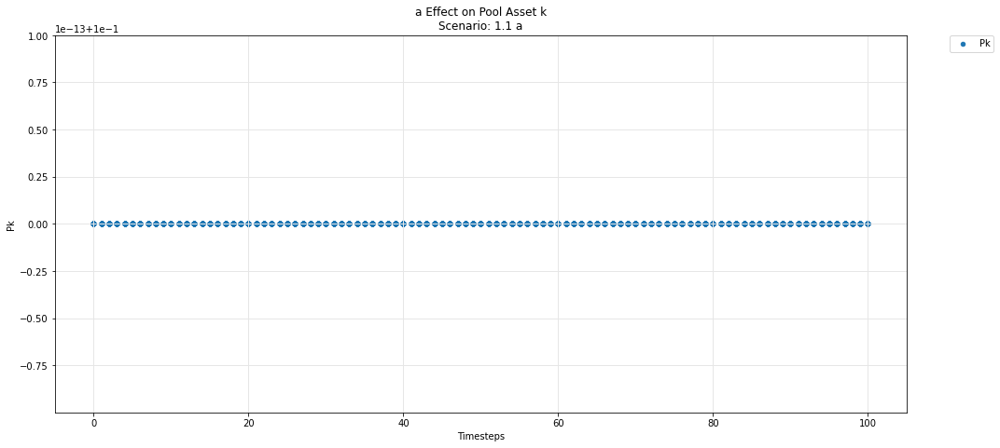

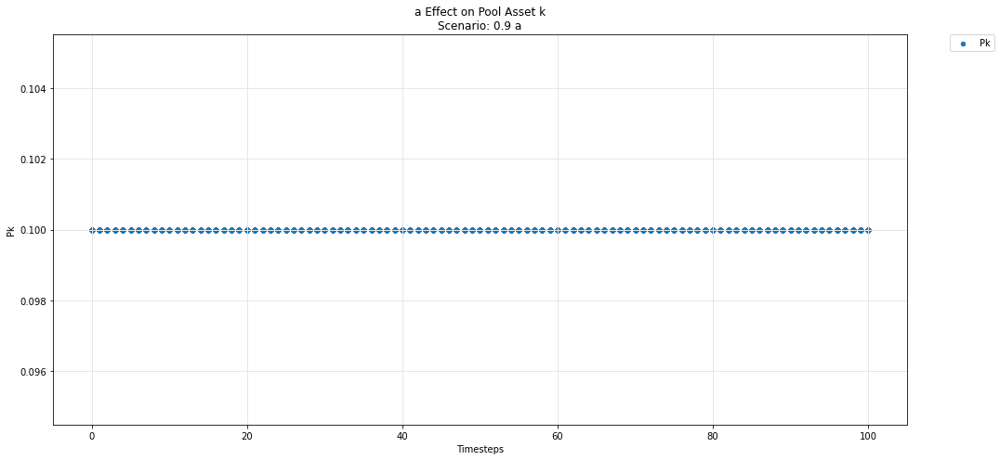

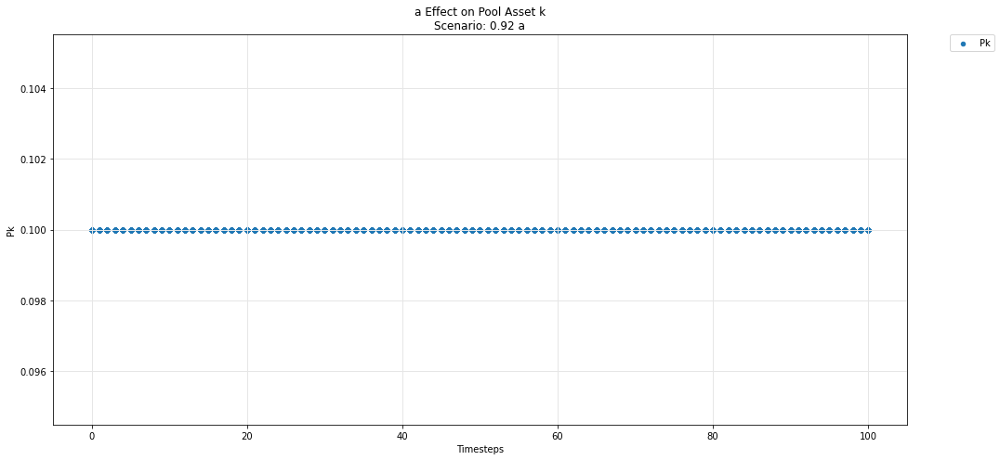

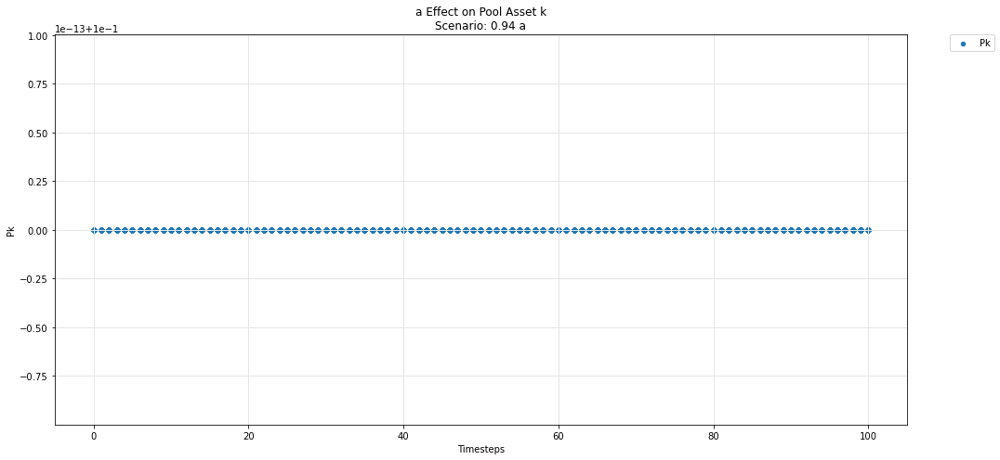

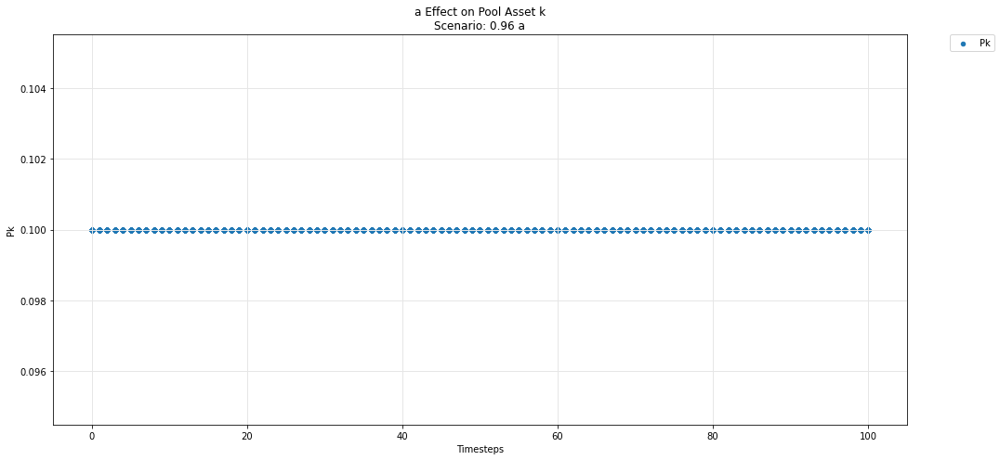

...

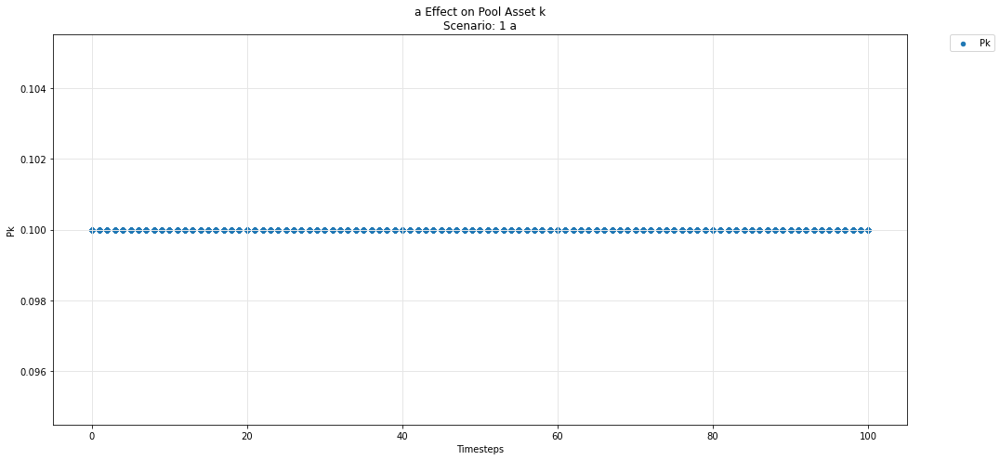

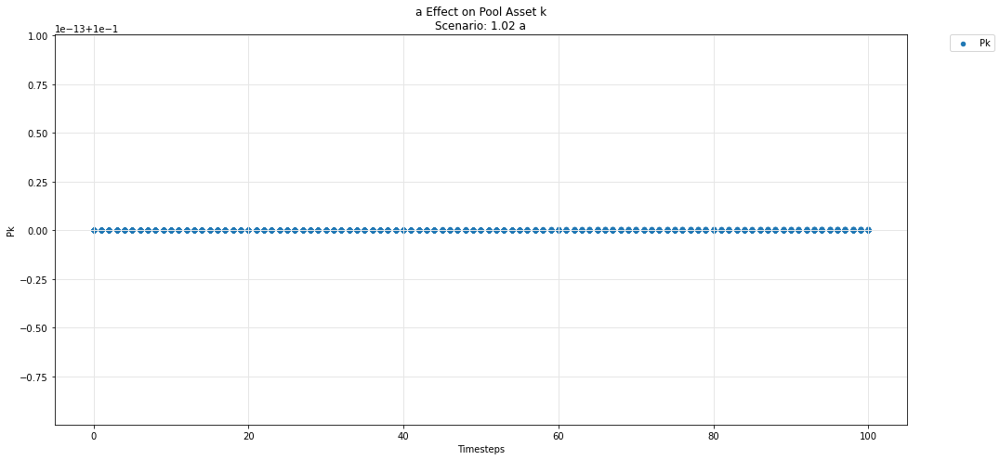

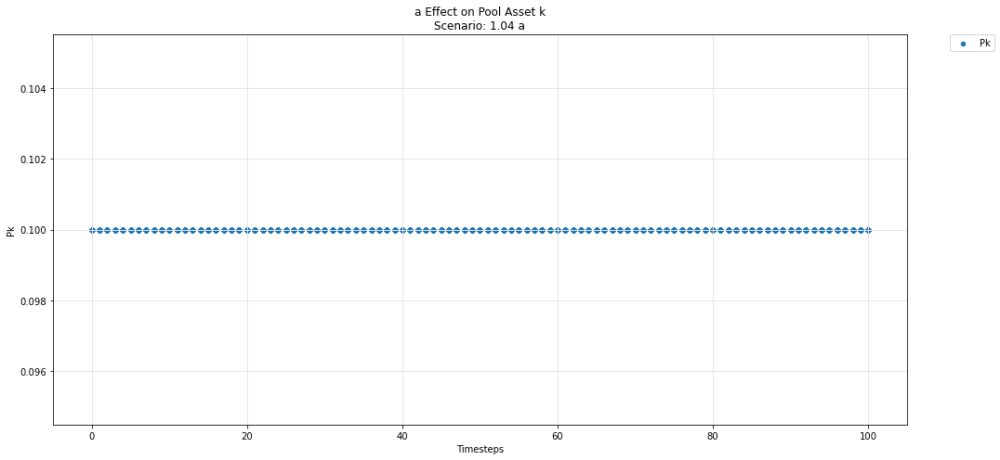

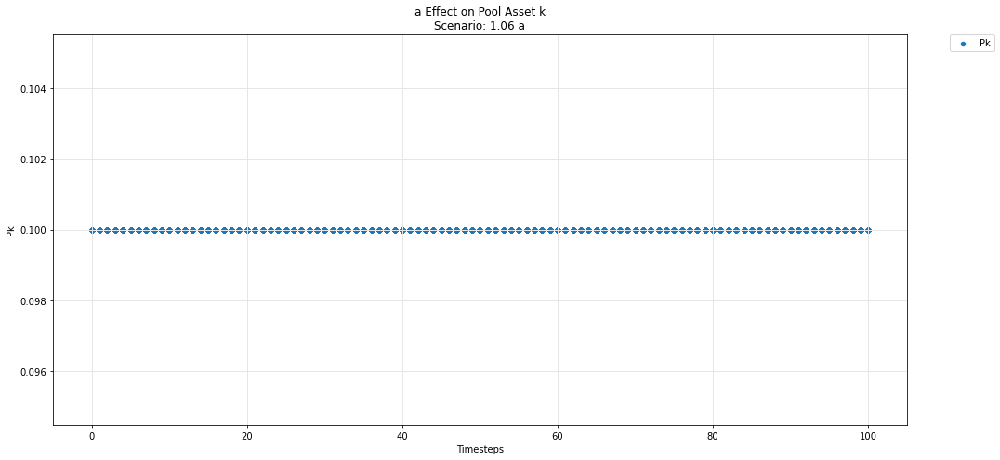

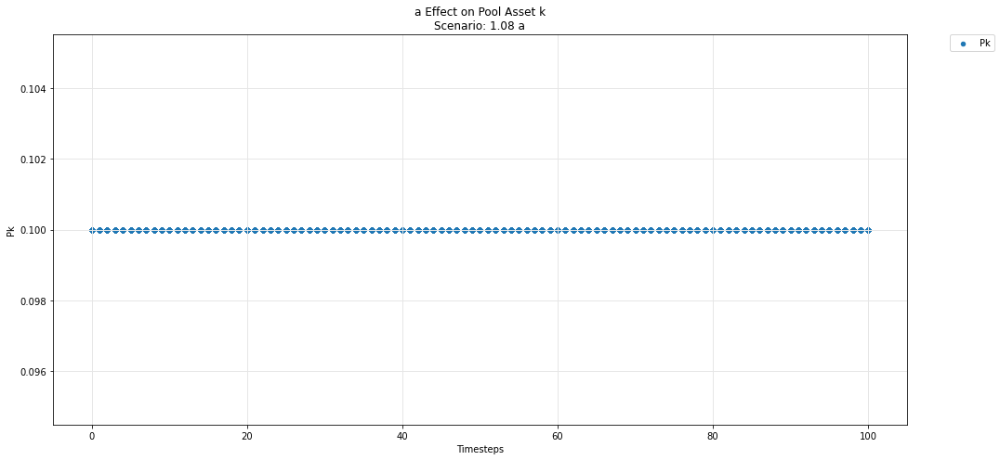

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')